# Evaluation
With all the data and knowledge from the previous notebooks let us now try to evaluate the performance of our IR system.

## Data
The process of how we ended up with the current data format is outlined in the other notebooks. In short after experimenting with different ways to represent the data we opted to go with an approach inspired by [this paper](https://dl.acm.org/doi/10.1145/2600428.2609605). Our representation fixes some issues that we saw with the original, furthermore we also skipped some more advanced features like ray attacks to make the already long process of preparing the data a bit shorter (still took us 6 hours for 2 million games).

## Evaluation
We will evaluate our system the following way ...

# Setup

In [154]:
# Import all the necessary modules.
from dataclasses import dataclass
from enum import Enum
from IPython.core.display import HTML
import chess
import chess.pgn
import lucene
import os
import pandas as pd

# from org.apache.lucene.analysis.standard import StandardAnalyzer
from java.nio.file import Paths
from org.apache.lucene.analysis.core import WhitespaceAnalyzer
from org.apache.lucene.index import DirectoryReader
from org.apache.lucene.queryparser.classic import QueryParser
from org.apache.lucene.search import IndexSearcher
from org.apache.lucene.search.similarities import BM25Similarity
from org.apache.lucene.store import NIOFSDirectory

In [155]:
# Set up the Java VM for Lucene.

try:
    print("Initializing VM")
    lucene.initVM(vmargs=['-Djava.awt.headless=true'])  # This needs to be run once to get it all going
except ValueError as e:
    print("VM already initialized")

Initializing VM
VM already initialized


In [156]:
# Logic to convert between the chess board and our representation.

val_map = {i: str(1 - (7 * i / 64)) for i in range(1, 9)}
def r_closure(board):
    t = board.turn
    board.turn = chess.WHITE
    w_none_capture_moves = [move for move in board.legal_moves if not board.is_capture(move)]
    w_r_closure = [board.piece_at(x.from_square).symbol() + chess.square_name(x.to_square) + '^' + val_map[chess.square_distance(x.from_square, x.to_square)] for x in w_none_capture_moves]

    board.turn = chess.BLACK
    b_none_capture_moves = [move for move in board.legal_moves if not board.is_capture(move)]
    b_r_closure = [board.piece_at(x.from_square).symbol() + chess.square_name(x.to_square) + '^' + val_map[chess.square_distance(x.from_square, x.to_square)] for x in b_none_capture_moves]

    board.turn = t
    return w_r_closure + b_r_closure

def a_closure(board):
    t = board.turn
    
    board.turn = chess.WHITE
    w_capture_moves = [move for move in board.legal_moves if board.is_capture(move) and not board.is_en_passant(move)]
    w_a_closure = [board.piece_at(x.from_square).symbol() + ">" + board.piece_at(x.to_square).symbol() + chess.square_name(x.to_square) for x in w_capture_moves]

    board.turn = chess.BLACK
    b_capture_moves = [move for move in board.legal_moves if board.is_capture(move) and not board.is_en_passant(move)]
    b_a_closure = [board.piece_at(x.from_square).symbol() + ">" + board.piece_at(x.to_square).symbol() + chess.square_name(x.to_square) for x in b_capture_moves]

    board.turn = t
    return w_a_closure + b_a_closure

def d_closure(board):
    d_closure = []

    for square, piece in board.piece_map().items():
        if piece.piece_type != chess.KING: # Defending a king doesn't really make sense
            d_closure += [board.piece_at(x).symbol() + '<' + piece.symbol() + chess.square_name(square) for x in board.attackers(piece.color, square)]

    return d_closure

def p_closure(board):
    return [p.symbol()+chess.square_name(s) for s,p in board.piece_map().items()]

def encode_board_position(board):
    return  " ".join(r_closure(board)) + " " + " ".join(p_closure(board)) +" "+ " ".join(a_closure(board)) +" "+ " ".join(d_closure(board))

def decode_piece_position(pos):
    board = chess.Board()
    board.set_piece_map({chess.parse_square(term[1:]): chess.Piece.from_symbol(term[0]) for term in pos.strip().split(" ")})
    return board


In [158]:
# Load the puzzles to evaluate on from the CSV file.

df = pd.read_csv('sorted_df_output.csv')
print(df.shape)

def get_puzzle_board(index):
    fen = df.iloc[index]['FEN']
    board = chess.Board(fen)
    board.push(chess.Move.from_uci(df.iloc[index]['Moves'].split(" ")[0]))
    return board

def get_puzzle_solution(index):
    return df.iloc[index]['Moves'].split(" ")[1] # Only the first move

(1000, 10)


In [159]:
# Define the query.

PATH = "./games/"

def run_query(searcher, analyzer, command, bound=10):
    """ Runs the actuall lucene query and collects the output. """
    escaped_command = command.replace("/", "\\/")
    query = QueryParser("contents", analyzer).parse(escaped_command)
    scoreDocs = searcher.search(query, bound).scoreDocs
    
    seen_games = set()
    output = []
    for scoreDoc in scoreDocs:
        doc = searcher.doc(scoreDoc.doc)
        link = f"https://lichess.org/{doc.get('game').split('.')[0]}#{int(doc.get('move'))}"
        
        # Skip any double matches for the games.
        if doc.get("game") in seen_games:
            continue
        
        file = open(os.path.join(PATH, doc.get("game")))
        file_content = str(file.read())
        content = file_content.split("\n")[int(doc.get("move"))-10].split("|")[0]
        header = file_content.split("\n")[0]
        file.close()
        
        output.append([doc.get('game'), doc.get('move'), link, scoreDoc.score, content, header])
        seen_games.add(doc.get("game"))
    
    return output

def score_lookup(board, bound):
    """ Wrapper for the lucene query to make it all function. """
    # output = []
    # directory = NIOFSDirectory(Paths.get("/Users/tobiaswilfert/Documents/University/IR/chess-db/games.index"))
    # searcher = IndexSearcher(DirectoryReader.open(directory))
    # searcher.setSimilarity(BM25Similarity())
    # analyzer = WhitespaceAnalyzer()
    # output = run_query(searcher, analyzer, command=encode_board_position(board), bound=bound)
    # del searcher  
    # return output 
    return run_query(searcher, analyzer, command=encode_board_position(board), bound=bound)


In [160]:
# The experiment logic.

class Outcome(Enum):
    WHITE_WON = 1
    BLACK_WON = -1
    DRAW = 0


# turn = 1 white and 0 black
def evaluate_move(turn, move, board, bound, top=5):
    output = score_lookup(board, bound)
    if len(output) < 5:
        raise ValueError(f"Not enough results found for {board} with bound={bound}.")
    
    # Sort the output by score and get the top_k
    output.sort(key=lambda x: x[3], reverse=True)
    top_k = output[:top]
    
    filtered_top_k = []
    for result in top_k:
        outcome = Outcome.WHITE_WON if "1-0" in result[5] else Outcome.BLACK_WON if "0-1" in result[5] else Outcome.DRAW
        filtered_top_k.append([result[3], outcome ,result[2], result[4]])
    
    # Calculate the score (unfiltered for now)
    if turn == 1:
        white_wins = sum([1 for x in filtered_top_k if x[1] == Outcome.WHITE_WON])
        score = white_wins / len(filtered_top_k)
    else:
        black_wins = sum([1 for x in filtered_top_k if x[1] == Outcome.BLACK_WON])
        score = black_wins / len(filtered_top_k)
    
    return [score, move, filtered_top_k]


def evaluate_position(turn, board, print_progress=False, bound=50, top=5):
    output = []
    
    for move in board.legal_moves:
        if print_progress: print(f"{move}, ", end="")
        board.push(move)
        output.append(evaluate_move(turn, move, board, bound, top))
        board.pop()
    
    return output
    

# Test

True


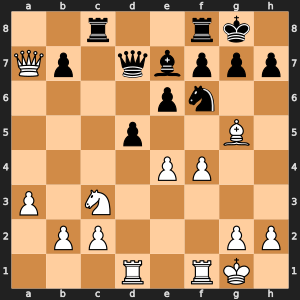

In [108]:
board = get_puzzle_board(0)
print(board.turn)
chess.svg.board(board=board, size=300)


In [10]:
output = []
print("Checking: ", end="")
for move in board.legal_moves:
    board.push(move)
    
    print(f"{move}, ", end="")
    encoding = encode_board_position(board)
    cur = score_lookup(board, bound=1)[0]
    cur.append(str(move))
    output.append(cur)
    board.pop()

Checking: a7b8, a7a8, a7b7, a7b6, a7a6, a7c5, a7a5, a7d4, a7a4, a7e3, a7f2, g5h6, g5f6, g5h4, c3d5, c3b5, c3a4, c3e2, c3a2, c3b1, g1f2, g1h1, f1f3, f1f2, f1e1, d1d5, d1d4, d1d3, d1d2, d1e1, d1c1, d1b1, d1a1, e4d5, f4f5, e4e5, a3a4, h2h3, g2g3, b2b3, h2h4, g2g4, b2b4, 

In [11]:
for x in output:
    print(x)

['hsII84BL.txt', '29', 'https://lichess.org/hsII84BL#29', 46.20036315917969, 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 ', "Headers(Event='Rated Blitz game', Site='https://lichess.org/hsII84BL', Date='2023.09.01', Round='-', White='dooger12345', Black='Paul1959', Result='0-1', UTCDate='2023.09.01', UTCTime='06:59:14', WhiteElo='1756', BlackElo='1713', WhiteRatingDiff='-40', BlackRatingDiff='+6', ECO='B13', Opening='Caro-Kann Defense: Exchange Variation', TimeControl='300+0', Termination='Normal')", 'a7b8']
['hsII84BL.txt', '29', 'https://lichess.org/hsII84BL#29', 46.20036315917969, 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 ', "Headers(Event='Rated Blitz game', Site='https://lichess.org/hsII84BL', Date='2023.09.01', Round='-', White='dooger12345', Black='Paul1959', Result='0-1', UTCDate='2023.09.01', UTCTime='06:59:14', WhiteElo='1756', BlackElo='1713', WhiteRatin

Matches the results from the previous notebooks.

In [38]:
print(evaluate_move(0, 'x', board, 50))

[0.8, 'x', [[46.20036315917969, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hsII84BL#29', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 '], [43.35346603393555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xq0l0EoT#27', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 pa7 nf6 pe6 Bg5 pd5 Ph3 Nc3 Pa3 Pg2 Pf2 Qe2 Pc2 Pb2 Kg1 Rf1 Rc1 '], [42.94924545288086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UqrUBWNU#41', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pd5 pa5 Pe4 Pd4 Pa4 Ph3 Nc3 Pg2 Pf2 Nd2 Qb2 Kg1 Rd1 Rc1 '], [42.94160461425781, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YN8Ah8T6#27', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 nf6 pe6 pa6 Bg5 pd5 pb5 Pd4 Qf3 Nc3 Pa3 Ph2 Pg2 Pf2 Pc2 Pb2 Kg1 Rf1 Rd1 '], [42.868526458740234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HJ8ZHW6v#29', 'kg8 rc8 rb8 ph7 pg7 pf7 be7 qd7 pa7 nf6 pe6 Bg5 pd5 Pf4 Nc3 Ph2 Pg2 Pc2 Pb2 Pa2 Kh1 Rf1 Qd1 Rb1 ']]]


In [110]:
temp = evaluate_position(board.turn , board, True, top=5)

a7b8, a7a8, a7b7, a7b6, a7a6, a7c5, a7a5, a7d4, a7a4, a7e3, a7f2, g5h6, g5f6, g5h4, c3d5, c3b5, c3a4, c3e2, c3a2, c3b1, g1f2, g1h1, f1f3, f1f2, f1e1, d1d5, d1d4, d1d3, d1d2, d1e1, d1c1, d1b1, d1a1, e4d5, f4f5, e4e5, a3a4, h2h3, g2g3, b2b3, h2h4, g2g4, b2b4, 

In [111]:
print(temp)
print(f"Winning: {len([x for x in temp if x[0] > 0.5])}")
print(f"Losing: {len([x for x in temp if x[0] <= 0.5])}")

solution_score = [x for x in temp if x[1] == chess.Move.from_uci(get_puzzle_solution(0))][0]
print(solution_score)

# Represent the solution
no_wrap_div = '<div style="white-space: nowrap">{}{}{}{}{}</div>'
t = [chess.svg.board(decode_piece_position(x[3]), size=250) for x in solution_score[2]]

print([x[1] for x in solution_score[2]])
print([x[0] for x in solution_score[2]])
display(HTML(no_wrap_div.format(*t)))

[[0.8, Move.from_uci('a7b8'), [[46.20036315917969, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hsII84BL#29', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 '], [43.35346603393555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xq0l0EoT#27', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 pa7 nf6 pe6 Bg5 pd5 Ph3 Nc3 Pa3 Pg2 Pf2 Qe2 Pc2 Pb2 Kg1 Rf1 Rc1 '], [42.94924545288086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UqrUBWNU#41', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pd5 pa5 Pe4 Pd4 Pa4 Ph3 Nc3 Pg2 Pf2 Nd2 Qb2 Kg1 Rd1 Rc1 '], [42.94160461425781, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YN8Ah8T6#27', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 nf6 pe6 pa6 Bg5 pd5 pb5 Pd4 Qf3 Nc3 Pa3 Ph2 Pg2 Pf2 Pc2 Pb2 Kg1 Rf1 Rd1 '], [42.81581497192383, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bt2YHlEj#38', 'kg8 rd8 rc8 pg7 pf7 be7 qd7 pg6 nf6 pe6 na6 pd5 pb5 pa5 Pe4 Pg3 Be3 Nc3 Pa3 Ph2 Bg2 Pf2 Qc2 Pb2 Kg1 Re1 Rd1 ']]], [0.6, Move.from_uci('a7a8'), [[46.

In [113]:
temp = evaluate_position(board.turn , board, True, top=10)
print(temp)
print(f"Winning: {len([x for x in temp if x[0] > 0.5])}")
print(f"Losing: {len([x for x in temp if x[0] <= 0.5])}")

solution_score = [x for x in temp if x[1] == chess.Move.from_uci(get_puzzle_solution(0))][0]
print(solution_score)

# Represent the solution
no_wrap_div = '<div style="white-space: nowrap">{}{}{}{}{}{}{}{}{}{}</div>'
t = [chess.svg.board(decode_piece_position(x[3]), size=250) for x in solution_score[2]]

print([x[1] for x in solution_score[2]])
print([x[0] for x in solution_score[2]])
display(HTML(no_wrap_div.format(*t)))

a7b8, a7a8, a7b7, a7b6, a7a6, a7c5, a7a5, a7d4, a7a4, a7e3, a7f2, g5h6, g5f6, g5h4, c3d5, c3b5, c3a4, c3e2, c3a2, c3b1, g1f2, g1h1, f1f3, f1f2, f1e1, d1d5, d1d4, d1d3, d1d2, d1e1, d1c1, d1b1, d1a1, e4d5, f4f5, e4e5, a3a4, h2h3, g2g3, b2b3, h2h4, g2g4, b2b4, [[0.6, Move.from_uci('a7b8'), [[46.20036315917969, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hsII84BL#29', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 '], [43.35346603393555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xq0l0EoT#27', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 pa7 nf6 pe6 Bg5 pd5 Ph3 Nc3 Pa3 Pg2 Pf2 Qe2 Pc2 Pb2 Kg1 Rf1 Rc1 '], [42.94924545288086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UqrUBWNU#41', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pd5 pa5 Pe4 Pd4 Pa4 Ph3 Nc3 Pg2 Pf2 Nd2 Qb2 Kg1 Rd1 Rc1 '], [42.94160461425781, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YN8Ah8T6#27', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 nf6 pe6 pa6 Bg5 pd5 pb5 Pd4 Qf3 Nc3 Pa3 Ph2 Pg

In [120]:
directory = NIOFSDirectory(Paths.get("/Users/tobiaswilfert/Documents/University/IR/chess-db/games.index"))
searcher = IndexSearcher(DirectoryReader.open(directory))
searcher.setSimilarity(BM25Similarity())
analyzer = WhitespaceAnalyzer()

temp = evaluate_position(board.turn , board, True, top=10)
print(temp)
print(f"Winning: {len([x for x in temp if x[0] > 0.5])}")
print(f"Losing: {len([x for x in temp if x[0] <= 0.5])}")

solution_score = [x for x in temp if x[1] == chess.Move.from_uci(get_puzzle_solution(0))][0]
print(solution_score)

# Represent the solution
no_wrap_div = '<div style="white-space: nowrap">{}{}{}{}{}{}{}{}{}{}</div>'
t = [chess.svg.board(decode_piece_position(x[3]), size=250) for x in solution_score[2]]

print([x[1] for x in solution_score[2]])
print([x[0] for x in solution_score[2]])
display(HTML(no_wrap_div.format(*t)))

del searcher

g8h8, 

NameError: name 'searcher' is not defined

# Experiment

In [122]:
pred_correct = []
pred_wrong = []

directory = NIOFSDirectory(Paths.get("/Users/tobiaswilfert/Documents/University/IR/chess-db/games.index"))
searcher = IndexSearcher(DirectoryReader.open(directory))
searcher.setSimilarity(BM25Similarity())
analyzer = WhitespaceAnalyzer()

try:
    for i in range(100):
        puzzle = get_puzzle_board(i)
        solution = chess.Move.from_uci(get_puzzle_solution(i))
        display(HTML(chess.svg.board(board=puzzle, lastmove=solution, size=200)))
        temp = evaluate_position(puzzle.turn, puzzle, False, top=5, bound=25)
        print(f"#Moves: {puzzle.legal_moves.count()}, #Winning: {len([x for x in temp if x[0] > 0.5])}, #Losing: {len([x for x in temp if x[0] <= 0.5])}")
        solution_score = [x for x in temp if x[1] == solution][0]
        print(solution_score)
        if solution_score[0] > 0.5:
            pred_correct.append(solution_score)
        else:
            pred_wrong.append(solution_score)
except:
    del searcher

#Moves: 43, #Winning: 28, #Losing: 15
[0.4, Move.from_uci('a7e3'), [[47.31442642211914, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hsII84BL#29', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 '], [45.38957977294922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YN8Ah8T6#27', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 nf6 pe6 pa6 Bg5 pd5 pb5 Pd4 Qf3 Nc3 Pa3 Ph2 Pg2 Pf2 Pc2 Pb2 Kg1 Rf1 Rd1 '], [45.173824310302734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bt2YHlEj#38', 'kg8 rd8 rc8 pg7 pf7 be7 qd7 pg6 nf6 pe6 na6 pd5 pb5 pa5 Pe4 Pg3 Be3 Nc3 Pa3 Ph2 Bg2 Pf2 Qc2 Pb2 Kg1 Re1 Rd1 '], [45.013946533203125, <Outcome.DRAW: 0>, 'https://lichess.org/LyWJ3OGS#30', 'kg8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 rc6 pa6 Bg5 pd5 Pd4 Qd3 Nc3 Pa3 Ph2 Pg2 Pf2 Pc2 Pb2 Kg1 Re1 Rd1 '], [44.77211380004883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Xya5vvTA#31', 'kg8 rc8 ph7 pg7 pf7 be7 qd7 nf6 pe6 rc6 pa6 Bg5 pd5 pb5 Pd4 Qf3 Nc3 Pa3 Ph2 Pg2 Pf2 Pc2 Pb2 Kg1 R

#Moves: 23, #Winning: 4, #Losing: 19
[0.8, Move.from_uci('h7g6'), [[29.580419540405273, <Outcome.WHITE_WON: 1>, 'https://lichess.org/3JTMbS3H#31', 'rh8 kg8 qd8 ph7 Ng7 pf7 be7 bb7 ra7 Bh6 pc6 pa6 pd5 Qg4 ne4 Ph3 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 Nb1 Ra1 '], [29.26085090637207, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WZfm6HPS#48', 'kg8 rc8 rb8 pf7 be7 qc7 Bh6 pg6 pd6 pa6 pe5 Pd5 Qg4 pd4 Pa4 Ph3 Pb3 Pg2 Pf2 Pc2 Kg1 Re1 Rd1 '], [28.224836349487305, <Outcome.BLACK_WON: -1>, 'https://lichess.org/wWzgSdHR#39', 'kg8 qd8 ra8 ph7 be7 pb7 Bh6 pg6 pd6 pa6 pe5 pc5 Qg4 Pe4 nd4 Ph3 Pd3 Pc3 Pa3 Nh2 Pg2 Pb2 Kg1 Rf1 '], [27.889421463012695, <Outcome.BLACK_WON: -1>, 'https://lichess.org/taColuCE#55', 'kg8 re8 qb8 ph7 Bg7 pf7 pg6 re6 pa6 pb5 Qg4 Ph3 Pa3 Pg2 Pf2 Pb2 Kg1 Rd1 Rc1 '], [27.828792572021484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/BpeZxCRN#27', 'kg8 Bf8 qd8 ra8 pf7 be7 pg6 pd6 nc6 pe5 pc5 pb5 pa5 Qg4 Pe4 Ph3 Pd3 Pc3 Pb3 Pg2 Pf2 Pa2 Kg1 Rf1 Nb1 Ra1 ']]]


#Moves: 46, #Winning: 35, #Losing: 11
[0.6, Move.from_uci('b6c6'), [[30.43254852294922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/fJg2ItIP#87', 'kh8 re8 bc8 Rb8 pg7 Pc7 ph6 Qc6 pg5 pe4 pa4 Pg3 qf3 Pf2 Pa2 Kf1 '], [29.233537673950195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cAip0QtC#65', 'kg8 rf8 bc8 rb8 ph7 pg7 Rc6 pb6 pd5 Bb5 pa5 qf4 pe4 Pa3 Ph2 Pg2 Qc2 Pb2 Kh1 Re1 '], [29.22300148010254, <Outcome.WHITE_WON: 1>, 'https://lichess.org/aJFFFbcZ#84', 'bc8 rb8 pb7 kg6 Pd6 Rc6 pg5 pf5 Pc5 Pa5 pe4 Pd4 Pc4 qe3 Rf2 Kf1 Qb1 '], [29.0643367767334, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0smwFQrK#100', 'kh8 re8 bc8 pg7 ph6 Rb6 Kh5 Pc5 Pb5 qf4 Ph2 Pg2 Qa2 '], [28.463613510131836, <Outcome.WHITE_WON: 1>, 'https://lichess.org/5QklAACQ#66', 'kh8 rf8 pg7 ph6 Pc5 Bb5 qf4 pe4 Ph3 Qd3 Pg2 Kh1 Rd1 ']]]


#Moves: 29, #Winning: 8, #Losing: 21
[0.4, Move.from_uci('g1g7'), [[31.159198760986328, <Outcome.WHITE_WON: 1>, 'https://lichess.org/uQjoYF7e#16', 'rh8 ke8 rd8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pc6 be5 bg4 Pe4 Nf3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [30.560577392578125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eTMD0CuV#20', 'rh8 ke8 ra8 ph7 pg7 pf7 pc7 pb7 nf6 pc6 pa6 be5 Pe4 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [29.04730987548828, <Outcome.DRAW: 0>, 'https://lichess.org/bFqzQP5b#24', 'rh8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pc6 be5 Pe4 Nc3 Ph2 Pg2 Pf2 be2 Pd2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [28.696186065673828, <Outcome.BLACK_WON: -1>, 'https://lichess.org/khA4vG8w#24', 'rh8 ke8 rd8 ph7 pg7 pf7 pc7 pb7 nf6 pa6 be5 Nb5 Ph2 Pg2 Pf2 Ke2 Pc2 Pb2 Pa2 Rh1 Bc1 Ra1 '], [28.48992347717285, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bNco5tCl#18', 'rh8 ng8 ke8 rd8 ph7 pg7 pf7 pc7 pb7 pc6 pa6 be5 Pe4 Pf3 Ph2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 ']]]


#Moves: 42, #Winning: 34, #Losing: 8
[1.0, Move.from_uci('a6e2'), [[33.024620056152344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9TOgNmWH#33', 'kg8 rf8 rc8 ph7 pg7 pf7 ne7 pa7 pe6 pb6 Pe5 pd5 qa5 pd4 Pa4 Nf3 Pd3 Qb3 Ph2 Pg2 Pf2 Pa2 Kg1 Rf1 Rc1 '], [32.59535598754883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tS1PynDE#28', 'kg8 rf8 ra8 pg7 pf7 be7 qd7 Nc7 pa7 ph6 nf6 pe6 pb6 pd5 Pd4 Pa4 Pg3 Nf3 Ph2 Bg2 Pf2 be2 Pb2 Kg1 Rf1 Qd1 Rc1 '], [32.15310287475586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cD7uMs2m#60', 'kh8 re8 ph7 pg7 pa7 bg6 pb6 qb4 Pa4 Ph3 Pg3 Bg2 Pf2 re2 Qa2 Kg1 Rd1 Ra1 '], [31.164220809936523, <Outcome.BLACK_WON: -1>, 'https://lichess.org/oB5HWaii#45', 'kh8 rb8 ph7 pg7 pa7 rf6 pb6 bh5 pf5 Bd5 qc5 pe4 Pc4 Pa4 Ph3 Qb3 Pg2 Pf2 Pb2 Kh1 Rf1 Rc1 '], [30.987071990966797, <Outcome.BLACK_WON: -1>, 'https://lichess.org/A6bFEtsj#31', 'rh8 ke8 ra8 ph7 pg7 pf7 ne7 bd7 pa7 Bd6 pb6 pf5 Pe5 pd5 qa5 Pd4 Pa4 Pc3 Qb3 Ph2 Pg2 Pf2 Ne2 Kg1 Rf1 Ra1 ']]]


#Moves: 48, #Winning: 32, #Losing: 16
[0.4, Move.from_uci('c3b1'), [[39.596824645996094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2NoKdrki#48', 'kg8 rc8 ph7 ng7 pf7 qc7 bb7 Bh6 pg6 pe6 pa6 Pe5 pd5 pb5 rc4 Pb4 Pf3 Pc3 Pa3 Ph2 Pg2 Ne2 Ra2 Kh1 Rf1 Qd1 '], [36.49842834472656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jK7eZ818#52', 'kg8 rd8 ph7 bg7 pf7 ne7 qd7 bb7 pg6 pa6 pd5 pb5 Nd4 rc4 Pb4 Qg3 Bb3 Pa3 Ph2 Pg2 Pf2 Bb2 Kg1 Rd1 Rc1 '], [35.87779235839844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/zy7jb4E4#46', 'kg8 rc8 qb8 ph7 pf7 bb7 pg6 pe6 pa6 Re5 pd5 pb5 Qg4 Pd4 rc4 Pb4 Pa3 Ph2 Pg2 Pf2 Bd2 Bc2 Kg1 Rc1 '], [35.393436431884766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/M3OwyaeH#49', 'kg8 rf8 pg7 pf7 qc7 bb7 ph6 Ne6 Pe5 pd5 pb5 pa5 rc4 Pb4 Pg3 Qf3 Pa3 Ph2 Pg2 Kg1 Rf1 Rd1 '], [35.28188705444336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/taNrlf1M#53', 'kg8 rf8 ph7 qc7 bb7 pg6 Re6 pf5 pd5 Nd4 rc4 Pb4 Ph3 Qd3 Pg2 Pb2 Kh1 Rf1 ']]]


#Moves: 39, #Winning: 12, #Losing: 27
[0.2, Move.from_uci('g1e2'), [[34.63186264038086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PVW69UZM#64', 'kh8 rf8 rc8 pe7 pa7 Qg6 bf6 Pe6 pb6 ph5 Nf5 pc5 Ph4 Pc4 qa4 Pg3 Pd3 Pa3 Pf2 Re2 Kg1 Rb1 '], [32.407039642333984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/wtnPNrsA#47', 'kh8 ra8 pg7 Qf7 ph6 bf6 bc6 pa6 nd5 pb5 qa5 Ph4 pc4 Pg3 Pc3 Pf2 Bc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [32.36524963378906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7WvPHICr#39', 'kg8 rf8 qd8 bc8 ra8 bg7 pf7 pb7 pa7 Bh5 Ng5 pd5 Ph4 nf4 Pc3 Qb3 Pg2 Ne2 Pb2 Pa2 Rh1 Kf1 Ra1 '], [32.102622985839844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AL5B837Q#17', 'rh8 ke8 qd8 nb8 ra8 pf7 pe7 pb7 pa7 ph6 pg6 bf6 pd6 pc5 Ph4 bg4 Qf4 Pe4 Bc4 Pd3 Pc3 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Ke1 Nb1 Ra1 '], [31.921724319458008, <Outcome.BLACK_WON: -1>, 'https://lichess.org/LnbijWc9#16', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 pb7 pa7 bf6 pe6 pd6 nc6 pc5 qa5 Pe4 Qf3 Pd3 Pc3 Bb3 Ph2 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Ke1 Nb1 Ra1 '

#Moves: 36, #Winning: 27, #Losing: 9
[0.8, Move.from_uci('f1f6'), [[53.736454010009766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Xk4EzhZ5#37', 'kh8 qf8 bc8 ra8 bg7 Pf7 pc7 pb7 ph6 Rf6 pe6 pd6 nc6 pa6 Qh5 pg4 Nc3 Ph2 Pc2 Pb2 Pa2 Kg1 Bc1 Ra1 '], [34.52101516723633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xPoDuQKC#34', 'kh8 rf8 qd8 bc8 ra8 bg7 Pf7 pb7 pa7 ph6 pd6 nc6 Qh5 Pg5 pe5 pd4 Pc4 Bd3 Pg2 Pb2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [32.93669891357422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3GdwcM03#40', 'qf8 rb8 kh7 bg7 pa7 ph6 pg6 pc5 pd4 Pc4 Pg3 bd3 Ph2 Bd2 Pb2 Pa2 Kg1 Qc1 Nb1 Ra1 '], [32.79246520996094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mqhSmBNp#42', 'kg8 rf8 ra8 bg7 pf7 ne7 pb7 pa7 ph6 qe6 Qh5 pe5 pc5 Be4 pd4 Pc4 Pa4 Ph3 Pg3 Pd3 Pf2 Pb2 Kh1 Rf1 Bc1 Ra1 '], [32.625953674316406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ou3YLdjb#32', 'kh8 rf8 qd8 bc8 rb8 bg7 Pf7 pe7 pa7 ph6 Qh5 Ng5 pc5 pc4 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Ra1 ']]]


#Moves: 30, #Winning: 4, #Losing: 26
[0.6, Move.from_uci('c4c3'), [[36.638877868652344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pOklDvNy#58', 'kg8 rf8 ra8 Bg7 pf7 pg6 pe6 ph5 Pg5 Ph4 Pf4 pb4 Qf3 pc3 Kd2 Pb2 Rg1 Rd1 qa1 '], [35.677921295166016, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bNnZgrq0#37', 'kg8 rf8 ra8 Bg7 pf7 be7 bb7 pe6 nc6 pa6 Qh5 Pe5 qa5 Ph4 Be4 pc4 pc3 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Rd1 Kb1 '], [34.12913131713867, <Outcome.BLACK_WON: -1>, 'https://lichess.org/GCsNFtGp#46', 'kg8 ra8 ph7 pg7 pb7 pa7 qa5 Ph4 Qe4 pc3 Pg2 Kd2 Pb2 Rh1 Rd1 '], [33.61863327026367, <Outcome.BLACK_WON: -1>, 'https://lichess.org/70iw5yU3#50', 'kg8 rf8 ra8 pg7 pf7 Qe7 ph6 pa6 Pe5 Ph4 ng4 be4 Bd3 Pc3 Pg2 Pb2 Rh1 Rd1 Kc1 qa1 '], [33.2339973449707, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jtL9GXCI#46', 'kg8 rf8 rc8 ph7 pf7 Rd7 Rc7 pf6 pd4 pb4 pa4 Pf3 pc3 Ph2 Pf2 Kd2 Pc2 Pb2 Pa2 ']]]


#Moves: 5, #Winning: 5, #Losing: 0
[0.6, Move.from_uci('f4d6'), [[34.50166320800781, <Outcome.WHITE_WON: 1>, 'https://lichess.org/P1Hl0N45#90', 'pa7 ph6 ke6 Bh5 rd5 Kh3 Pg3 qe3 Ph2 pd2 Pa2 Rf1 Rd1 '], [30.82305908203125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/j8BpgVaD#75', 'kf8 re8 pf7 Pf5 pe5 pb5 Kh4 Rg4 Pe4 Pg3 Ph2 qe2 pd2 '], [29.704448699951172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/AAnduKt8#62', 'kf8 ne8 rd8 ph7 Ph6 pf6 pa5 Pe4 pb4 Pf3 Pg2 qe2 pd2 Rc2 Pb2 Pa2 Qg1 Rd1 Kb1 '], [28.813093185424805, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AJJjeNvX#120', 'rh8 rh7 Qb6 kh5 pf5 qd5 pb5 pg4 Pg3 pc3 Ph2 Re2 pd2 Kg1 '], [28.577455520629883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MG0tAwSR#59', 'rh7 pf7 ke7 pf6 bd6 Rc6 pa6 rh5 pe5 Qd5 pb5 qg4 Pb4 Pg3 Pa3 Ph2 Pf2 Kg1 Re1 ']]]


#Moves: 30, #Winning: 26, #Losing: 4
[0.8, Move.from_uci('h4f2'), [[35.83327865600586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AMDNqq0M#48', 'kg8 rf8 rb8 pg7 pf7 Rd7 pa7 ph6 pe6 Rd4 Qd3 Pc3 Pa3 Ph2 Pg2 qf2 Pb2 Kb1 '], [34.218631744384766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YIAXPHWN#55', 'kg8 rd8 ra8 pf7 pb7 pg6 qb6 pa5 Qe4 Rd4 Pf3 Pc3 Pa3 Pg2 Pb2 Bf1 Kb1 '], [33.962501525878906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BmEFdZAo#62', 'kh8 rc8 rb8 ph7 pg7 Qe6 pa5 pf4 Pe4 Pa4 Ph3 Pf3 qf2 Pb2 Ka2 Rg1 Rb1 '], [32.997642517089844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/asHB7qPd#62', 'rh8 kb8 pc7 pb7 pf6 pa6 pg5 Qe4 Rd4 Pf3 Pc3 Pa3 qh2 Pb2 Ka2 '], [32.284912109375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ckRox4yi#75', 'kh8 re8 pg7 pf7 ph6 Qd5 Kf4 Rd4 Pb4 Pf3 Ph2 Pg2 qc2 Pb2 ']]]


#Moves: 38, #Winning: 25, #Losing: 13
[0.6, Move.from_uci('a1d1'), [[53.105709075927734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8jCGkUXz#31', 'kg8 re8 ra8 pg7 pf7 pc7 pb7 pa7 ph6 nc6 qg5 pd5 ne4 Bf3 Pb3 Ph2 Pg2 Pf2 Qc2 Bb2 Pa2 Kg1 Rf1 Rd1 '], [47.58456802368164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4RTz29yU#48', 'kg8 rc8 ph7 pg7 pf7 re6 qg5 pd5 pc5 nh4 ne4 Ph3 Bf3 Pe3 Qd3 Ba3 Pg2 Pf2 Pa2 Kg1 Rd1 Rc1 '], [47.15669250488281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2RHlcG1o#39', 'kg8 re8 rc8 pg7 pf7 bb7 pa7 ph6 pe6 pb6 qg5 pd5 Pb5 ne4 Pd4 Pa4 Bf3 Pe3 Qb3 Ba3 Ph2 Pg2 Pf2 Kg1 Rd1 Rc1 '], [46.46042251586914, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DWRVGD8J#76', 'kg8 bb8 pg7 pf7 re7 bb7 pa6 ph5 qg5 pd5 pb5 ne4 pc4 Ph3 Bf3 Pe3 Pa3 Pg2 Pf2 Ne2 Qc2 Pb2 Kg1 Be1 Rd1 Rc1 '], [44.91626739501953, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0SI0EpO0#56', 're8 ra8 kh7 pf7 ph6 pc6 qg5 pd5 Pc5 ne4 Bb4 pa4 Pe3 Qd3 Pa3 Ph2 Pg2 Kg1 Re1 Rb1 ']]]


#Moves: 38, #Winning: 13, #Losing: 25
[0.4, Move.from_uci('e6a2'), [[40.10015106201172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Ew4nAxps#45', 'kg8 rf8 re8 ph7 pf7 nd7 pg6 pd6 pb6 qf5 pc5 pa5 Ph4 Nf4 bd4 Pa4 Pg3 Pf3 Pb3 Qd2 Pc2 Rh1 Kf1 Rb1 '], [38.25629425048828, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mkUlDFAm#40', 'kg8 rf8 ra8 pf7 qc7 pa7 ph6 pg6 be6 pc6 nc5 pb5 Nf4 Pe4 Ph3 Pg3 Bd3 Pc3 Pa3 Qf2 Rd2 Pc2 Rh1 Kc1 '], [38.25102615356445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/a24v4WWx#73', 'rf8 rd8 bc8 kh7 ph6 pg6 nf6 pd6 pa6 ne5 pc5 Ph4 qg4 Nf4 Pe4 Pg3 Qe3 Pb3 Kh2 Bc2 Pa2 Rf1 Rd1 Bc1 '], [37.32504653930664, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3XDkOd0s#50', 'kg8 rd8 ph7 bg7 pf7 pg6 pc6 qe5 pb5 pa5 Nf4 Pe4 Ph3 Bd3 Pg2 Qf2 Pc2 ba2 Kh1 Rf1 Rd1 '], [36.852577209472656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0NMsEy04#41', 'kg8 rf8 bc8 rb8 ph7 ng7 pf7 pg6 pd6 pb6 pa6 qg5 ne5 Nd5 Ph4 Nf4 Pe4 Pc4 Pa4 Pg3 Qc3 Bg2 Pb2 Kg1 Rd1 Ra1 ']]]


#Moves: 33, #Winning: 15, #Losing: 18
[0.4, Move.from_uci('e1e5'), [[32.6787223815918, <Outcome.DRAW: 0>, 'https://lichess.org/2I0GihoH#45', 'kh8 rf8 re8 ph7 pg7 qc7 pb7 be6 bd6 pc6 Nb6 pa6 pd5 Pa5 Ph4 Pd4 pg3 Pf3 Bg2 Pe2 Qd2 Pb2 Kg1 Rf1 Rc1 '], [32.2588996887207, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HGO9t81e#55', 'kh8 ph7 pg7 Qf7 pb7 ba7 pc6 Nb6 pa6 qg5 pe5 Pa5 nf4 Pe4 Pb4 Ph3 Pf3 Pf2 Kf1 Rc1 '], [31.460372924804688, <Outcome.BLACK_WON: -1>, 'https://lichess.org/xbRwTnz9#63', 'kh8 Nc8 ra8 pg7 rf7 pd7 pb7 pa7 pe6 qd6 pc6 ph5 Pg5 nf4 Qg3 Bg2 Pf2 Rc2 Pb2 Pa2 Kg1 Re1 '], [31.21120262145996, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uqtOwjjL#57', 'kh8 rf8 pg7 Rd7 pb7 ba7 qh6 nc6 Nb6 pa6 rf5 Pa5 pe4 Bc4 bh3 Pe3 Qc3 Nb3 Kh2 Pb2 Re1 '], [31.201528549194336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mf2ngAlJ#57', 'kh8 rf8 ph7 pg7 rd7 pa7 qh6 Pd6 pb6 pe5 nf4 Bc4 Rg3 Pf3 Qe3 Pc3 Ph2 Pf2 Pa2 Kh1 Rg1 ']]]


#Moves: 2, #Winning: 1, #Losing: 1
[0.2, Move.from_uci('g8f7'), [[29.71135711669922, <Outcome.DRAW: 0>, 'https://lichess.org/f2p8heb5#83', 'Re8 ph7 kf7 Pe7 pg6 bc6 pb5 pa5 Re3 Pc2 Pb2 Pa2 Kc1 '], [27.90945816040039, <Outcome.BLACK_WON: -1>, 'https://lichess.org/oyCbpJM1#63', 'Re8 Bb8 ph7 kf7 pg6 bc6 pd5 pc4 Bf3 bc3 Ph2 Pg2 Pf2 Kf1 '], [26.769149780273438, <Outcome.WHITE_WON: 1>, 'https://lichess.org/uDX0Uu0B#72', 'Re8 ph7 kf7 Ph6 pg6 pd6 Pg5 Pd5 pc5 rh4 pf3 Nf2 Pb2 Pa2 Kc1 '], [25.74774742126465, <Outcome.DRAW: 0>, 'https://lichess.org/qn3rJY5B#90', 'Re8 ph7 kf7 Ph6 pg6 Pg5 rd4 Kg3 '], [24.753814697265625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bDEcnFxf#77', 'Rd8 ph7 kf7 re7 pb7 Ph6 pg6 pa6 Pg5 Pb3 Pc2 Pa2 Kc1 ']]]


#Moves: 24, #Winning: 18, #Losing: 6
[0.6, Move.from_uci('c2b2'), [[26.61745834350586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XRX22XBc#65', 'kg8 ph7 pf6 pa6 qf5 pb5 Bf4 Pd4 pc4 Ph3 Kf3 Re3 Pc3 Pg2 Pb2 Pa2 '], [22.973487854003906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Mw7PVDEl#88', 'ke7 ph6 pf6 pd6 Pf5 pc5 Ph4 Pg4 Bf4 Ke4 Pc4 Rd3 Pb3 ra1 '], [22.74526596069336, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eMwGAKuu#87', 'kh8 pg7 ph6 pa6 Pf5 pb5 Kg4 Pf4 qb4 Ph3 Bf3 Re2 '], [22.19658088684082, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6XvS8WB8#72', 'kh8 re8 ph7 pg7 Be6 pa6 Pg5 Pf5 Nd5 pa5 Kg4 Bf4 Pa4 qc2 Rh1 '], [22.057527542114258, <Outcome.WHITE_WON: 1>, 'https://lichess.org/92WLiKCc#93', 'be7 kd7 re6 pd6 Ph5 pc5 rh4 Pg4 Bf4 Pc4 pb4 Rg3 Kf3 Re3 Pb3 ']]]


#Moves: 44, #Winning: 4, #Losing: 40
[0.2, Move.from_uci('a1e1'), [[47.94377136230469, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Po1fR1g2#44', 'kg8 rf8 ph7 pg7 rf7 qc7 pb7 pa7 Qd5 nf4 Pd4 Ph3 Pc3 Pg2 Pf2 Pb2 Pa2 Kh1 Re1 Ra1 '], [47.6113166809082, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6OYtxgEi#58', 'kh8 rf8 pg7 rf7 pc7 pb7 pa7 ph6 pd6 pe5 nf4 Pe4 Pb4 Pa4 qg3 Nf3 Pd3 Pc3 Qb3 Pg2 Rf2 Kg1 Rf1 '], [45.22985076904297, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tYCunu8h#62', 'rc8 ph7 kg7 pf7 pc7 pg6 pd6 pb6 pe5 Qd5 nf4 Pe4 Pa4 Ph3 qd3 Kh2 Pg2 Pf2 Rf1 Rb1 '], [42.80866622924805, <Outcome.DRAW: 0>, 'https://lichess.org/0fH2bjjA#46', 'kg8 ra8 ph7 pg7 rf7 pc7 pd6 pa6 pe5 Pd5 nf4 Pe4 Ph3 Nf3 Pd3 Pg2 Pb2 Kg1 Rf1 Re1 '], [42.59786605834961, <Outcome.BLACK_WON: -1>, 'https://lichess.org/iWmdVOKv#39', 'kh8 rf8 ph7 pg7 pc7 pa7 rf6 pc6 nf4 pe4 Pd4 Ph3 qe3 Pc3 Qb3 Nh2 Pg2 Pb2 Pa2 Kh1 Rf1 Re1 ']]]


#Moves: 41, #Winning: 3, #Losing: 38
[0.2, Move.from_uci('e5f3'), [[36.822628021240234, <Outcome.BLACK_WON: -1>, 'https://lichess.org/aU9pQ0iL#16', 'rh8 bf8 bc8 nb8 ra8 ph7 pd7 pc7 pb7 pa7 pg6 qf6 ke6 Qh5 Ne5 pf4 Pe4 Pd4 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Ke1 Bc1 Nb1 Ra1 '], [35.711669921875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3huAN33m#17', 'rh8 ng8 bf8 nb8 ra8 ph7 kd7 pc7 pb7 pa7 qf6 pe6 pd6 Qh5 pg5 pf4 Pe4 Nf3 Ph2 Pg2 Pd2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [35.658607482910156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CRNge8Gy#18', 'rh8 ng8 bf8 ke8 bc8 nb8 ra8 ph7 Nf7 pc7 pb7 pa7 pg6 qf6 pd6 Qh5 pf4 Pe4 Pd4 Bc4 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Kf1 Bc1 Nb1 Ra1 '], [34.374752044677734, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Tt0KNZZx#30', 'rh8 ke8 ra8 ph7 pf7 pa7 pg6 be6 pc6 qb6 Qh5 Pe5 pd5 pf4 Pc3 Ph2 Pg2 Pc2 Pa2 Kh1 Rf1 Bc1 Ra1 '], [34.12522506713867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/hRzvD4WB#30', 'rh8 ke8 nb8 ra8 be7 pc7 pb7 pg6 pa6 Qh5 ng5 Rf5 qd4 Ph2 Pg2 Pc2 Pb2 Pa2 

#Moves: 43, #Winning: 11, #Losing: 32
[0.4, Move.from_uci('a8b8'), [[45.49146270751953, <Outcome.BLACK_WON: -1>, 'https://lichess.org/l1u8oYVs#11', 'rh8 ke8 qd8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 bf5 pd5 Bf4 Pd4 Pc4 bb4 Ph3 Pe3 Nc3 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Qd1 Ra1 '], [45.49146270751953, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ii4wd5Pr#11', 'rh8 ke8 qd8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 bf5 pd5 Bf4 Pd4 Pc4 bb4 Ph3 Pe3 Nc3 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Qd1 Ra1 '], [44.83600616455078, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ua5ByJ1Y#16', 'rh8 ke8 qd8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 bf5 pd5 Pc5 Pd4 Ph3 Pe3 Nc3 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Qd1 Ra1 '], [44.78449249267578, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QgrCNDjn#14', 'rh8 ke8 qd8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 bf5 pd5 Bf4 Pd4 Pc4 bb4 Ph3 Pf3 Pe3 Nc3 Pg2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Qd1 Ra1 '], [43.90614318847656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0tgT4PsU#20', 'rh8 bf8 ke

#Moves: 10, #Winning: 1, #Losing: 9
[0.0, Move.from_uci('a7a6'), [[21.720003128051758, <Outcome.DRAW: 0>, 'https://lichess.org/NzCyAZIw#75', 'ne8 pf6 ke6 ph5 Pc5 pb5 pa5 Nh4 Ke4 Pd4 Ph3 Pb3 '], [21.246871948242188, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Fkau85G9#92', 'ph6 pf6 ke6 pf5 pc5 pa5 Ph4 Pg4 Ke4 Pc4 Pa4 Pb3 '], [20.792247772216797, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lgP38Dfk#61', 'ph6 pf6 ke6 pc6 pc5 pb5 pa5 Pg4 Ke4 Pc4 Ph3 Pf3 Pb3 Pa2 '], [20.604549407958984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/g3RQYZ80#52', 'ph7 pf6 ke6 pc6 Pg5 pc5 pa5 Ph4 Ke4 Pc4 Pa4 Pb3 '], [20.569015502929688, <Outcome.WHITE_WON: 1>, 'https://lichess.org/S6xQSlAA#70', 'pf6 ke6 pa6 ph5 pf5 pd5 pe4 Pd4 Pc4 Ph3 Pg3 Ke3 Pb3 Pa3 ']]]


#Moves: 37, #Winning: 5, #Losing: 32
[0.2, Move.from_uci('d7c5'), [[49.92585372924805, <Outcome.DRAW: 0>, 'https://lichess.org/eTpnvQ6d#42', 'kg8 rf8 be8 ra8 ph7 bg7 pe7 qc7 pg6 Pe6 pd6 Ng5 Pd5 nc5 pb5 pa5 Pf4 Be4 pc4 Ph3 Pa3 Pg2 Qc2 Pb2 Kg1 Re1 Bc1 Ra1 '], [49.81212615966797, <Outcome.BLACK_WON: -1>, 'https://lichess.org/vbJMuGek#27', 'rh8 ng8 kf8 qd8 ra8 ph7 bg7 pf7 pe7 pg6 Pe6 pd6 pa6 Pf5 Pd5 nc5 pb5 bg4 Be4 pc4 Nf3 Nc3 Ph2 Pg2 Qe2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [49.34561538696289, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ykhB8jBz#41', 'kg8 re8 qd8 rc8 ph7 bg7 pf7 nd7 bb7 pg6 pe6 pa6 Ng5 Pf5 pc5 Qg4 Be4 Ph3 Pc3 Pg2 Pb2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [48.04627990722656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/x55dVU4s#39', 'kg8 re8 ra8 ph7 pf7 be7 qc7 bb7 Bh6 pg6 pb6 pa6 Ng5 Pf5 pe5 nc5 Be4 Pa4 Rh3 Ph2 Pg2 Qe2 Pc2 Pb2 Kh1 Rf1 '], [43.85782241821289, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1KFIsFVc#41', 'kg8 re8 qd8 rc8 ph7 bg7 pf7 bd7 pg6 pe6 nc6 pa6 Pf5 Pe5 pb5 Rg4 Be4 Pd4 p

#Moves: 37, #Winning: 30, #Losing: 7
[0.2, Move.from_uci('c4e5'), [[41.0592155456543, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nwB15WDd#59', 'rh8 re8 pg7 nf7 qe7 pb7 pa7 kf6 pc6 pf5 Ne5 pd5 Pf4 Pd4 Pb4 Pe3 Pa3 Pg2 Be2 Kd2 Rf1 Ra1 '], [40.9886474609375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4CS11McH#65', 'kg7 nf7 pb7 pg6 pc6 pa6 Pg5 pf5 Ne5 pd5 Pf4 Pd4 Pb4 ba4 Pg3 Pc3 Ba3 Kh1 '], [38.99534225463867, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Hwfc1iDR#37', 'kg8 re8 bc8 ra8 pg7 nf7 qe7 pb7 ph6 pe6 pc6 pa6 pf5 Ne5 pd5 Pc5 Pf4 Pd4 Pb4 Pe3 Qd3 Pa3 Ph2 Pg2 Bc2 Kg1 Rf1 Ra1 '], [38.748966217041016, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IAX93PWO#45', 'kg8 rf8 bc8 ra8 ph7 pg7 nf7 pb7 qd6 pc6 pa6 Pg5 pf5 Ne5 pd5 Pf4 ne4 Pd4 Ph3 Pe3 Bd3 Nc3 Qg2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [38.60372543334961, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lIMS3Q2r#32', 'rh8 ng8 bf8 re8 kb8 ph7 nf7 qe7 pb7 pa7 pe6 pc6 pg5 pf5 Ne5 Pd4 Bc4 Pb4 Pe3 Pa3 Ph2 Pg2 Pf2 Bd2 Qc2 Rh1 Ke1 Rb1 ']]]


#Moves: 32, #Winning: 8, #Losing: 24
[0.4, Move.from_uci('b7d5'), [[34.988162994384766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4w2WMsdb#93', 'pc6 ph5 Bf5 kc5 pb5 Pg3 Pf3 bb3 Ph2 Kg1 Nf1 ra1 '], [28.406686782836914, <Outcome.WHITE_WON: 1>, 'https://lichess.org/eDZ7RC7n#68', 'ra7 Pf6 Re6 pa6 bd5 kc5 pb5 pg4 pc4 Pg2 Rd2 Pc2 Pb2 Pa2 Kg1 '], [25.543245315551758, <Outcome.BLACK_WON: -1>, 'https://lichess.org/LhApWv2w#56', 'kg8 rd8 pg7 ph6 Re6 pa6 bd5 pb5 Pb4 Qh3 Pg3 qa3 Ph2 Pf2 Kg1 Re1 rc1 '], [25.498266220092773, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ObWPc0eg#64', 'kg8 ph7 bf7 pg6 Rc6 pa6 pd5 Nf4 Pg3 Pa3 Ph2 Kg2 Pf2 Rc2 Pb2 Nf1 re1 rd1 '], [25.35326385498047, <Outcome.WHITE_WON: 1>, 'https://lichess.org/W4KefGna#66', 'kg8 ph7 pg6 Re5 pd4 Pg3 Ph2 Pf2 Kg1 Nf1 rd1 ']]]


#Moves: 43, #Winning: 38, #Losing: 5
[0.6, Move.from_uci('g3h3'), [[36.08000564575195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/gQnFf7EC#45', 'kg8 ra8 pg7 ph6 pe6 pa6 rf5 pd5 pc5 pb5 qh4 Pf4 pe4 Pe3 Pc3 Pg2 Qf2 Pb2 Pa2 Kg1 Rf1 Rd1 '], [35.29013442993164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kdXc2rTu#75', 'kh8 ba8 ba7 pe6 Pe5 pd5 pa5 qh4 Pd4 nc4 Pb4 rh3 Bf3 Pc3 Kg2 Qc2 Pb2 Rh1 Ra1 '], [32.82442092895508, <Outcome.DRAW: 0>, 'https://lichess.org/SJLe12xk#70', 'kh8 rf8 ra8 pg7 qc7 ph6 Bg6 pe6 pd5 pb5 Ph4 Pf4 nd4 nc4 pa4 Pa3 Pg2 Qf2 Pb2 Kg1 Rf1 Rd1 '], [32.66084289550781, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ZKQfoUqo#49', 'kc8 pg7 pf7 pc7 pe6 nc6 pa6 pd5 pb5 qh4 Pd4 Rf3 Pc3 rh2 Bg2 Qf2 Pb2 Pa2 Kg1 Rc1 '], [32.340179443359375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/A0STXXmP#81', 'pg7 Rb7 ph6 kf6 pe6 qh4 re4 pd4 Pg2 Qf2 Kg1 ']]]


#Moves: 23, #Winning: 5, #Losing: 18
[0.0, Move.from_uci('h6f5'), [[31.792278289794922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/OWTOj9Ey#79', 'kb8 pc7 pb7 pa7 Pd6 Pb5 pf4 Pd4 Pa4 qg3 Nf3 Ke2 Qd2 '], [28.67176628112793, <Outcome.WHITE_WON: 1>, 'https://lichess.org/fO33t1uF#75', 'rd8 kb8 pb7 pa7 Pg6 pe6 Pd6 Qc6 nf5 Pe5 ph4 Bg4 Pd4 Ph3 ng3 Nf3 pb3 Pa3 Kf2 pe2 Rc2 '], [28.57430648803711, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vDvtAojD#63', 'rh8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 pa7 pe6 nf5 Pd4 Pc4 qh3 Nf3 Qd3 Bc3 Pa3 Kf2 Rh1 Ra1 '], [28.236736297607422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UYKpUlNx#62', 'rh8 kb8 pf7 qd7 pb7 pa7 Pd6 nf5 Qd5 Pb4 ph3 Bh2 pg2 Pf2 Kg1 Rc1 '], [27.907445907592773, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PHHBCyDK#74', 'kh8 pf7 ph6 pe6 nf5 Pe5 pd5 Ph4 qg4 Pd4 Pb4 Nf3 Pe3 Qd3 Kf2 ']]]


#Moves: 37, #Winning: 4, #Losing: 33
[0.4, Move.from_uci('a5d2'), [[41.405696868896484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/bCIsIu4V#28', 'kg8 rf8 ra8 ph7 pg7 pf7 bd7 pb7 pe6 nc6 pa6 Pe5 nd5 qa5 Qh4 Pd4 Bc4 Pa4 Nf3 Ph2 Pg2 bd2 Pb2 Kg1 Rf1 Nb1 Ra1 '], [41.403133392333984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/znJNhBRG#37', 'kh8 rf8 qd8 ra8 ph7 ne7 bb7 pa7 bh6 pb6 Ph5 pf5 Pe5 nd5 pc5 Pf4 pd4 Na4 Bg3 Nf3 Pd3 Pa3 Be2 Qd2 Pb2 Rh1 Ke1 Ra1 '], [40.144222259521484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/GhHpYQEF#22', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 pc6 Pe5 nd5 bg4 Pd4 Nf3 Pa3 Ph2 Pg2 Pf2 bd2 Pb2 Kg1 Rf1 Qd1 Nb1 Ra1 '], [39.96898651123047, <Outcome.WHITE_WON: 1>, 'https://lichess.org/cyUaIgTJ#24', 'kg8 rf8 qd8 ra8 ph7 bg7 ne7 pb7 pa7 pg6 be6 pd6 pc6 pf5 pe5 nd5 Pf4 Ph3 Pg3 Nf3 Pe3 Pd3 Pa3 Kh2 Bg2 Ne2 Pc2 Pb2 Rf1 Qd1 Bc1 Ra1 '], [39.684871673583984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EQsDSgyQ#34', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 ne7 pc6 pa6 pf5 Pe5 nd5 pb5

#Moves: 27, #Winning: 9, #Losing: 18
[0.4, Move.from_uci('b2b3'), [[51.20738983154297, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4XAmal1K#47', 'rf8 kh7 pg7 qe7 pb7 ph6 pe6 pe5 pc5 Qg4 Pe4 bd4 Pd3 Ph2 Pg2 Pf2 ra2 Kg1 Rf1 Be1 Rb1 '], [47.079925537109375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KRUp3R9I#40', 'kg8 rf8 nh7 pg7 rf7 qd7 pb7 pa7 ph6 pe6 pd6 pc6 pe5 Pe4 bd4 Pc4 Pb4 Ph3 Ng3 Pd3 Pa3 Pg2 Pf2 Qe2 Bb2 Kg1 Rf1 Rb1 '], [44.099037170410156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PgS8mmBB#50', 'kg8 rf8 ra8 ph7 pg7 pf6 qd6 pe5 bd5 pa5 bd4 Ph3 Ng3 Pd3 Pa3 Pg2 Pf2 Qe2 Bd2 Kg1 Rf1 Rb1 '], [42.06975173950195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tp8S8mGn#42', 'kg8 rf8 ra8 pg7 pf7 pc7 pb7 pa7 ph6 nf6 bc6 qh5 pe5 bd4 Ph3 Pd3 Nc3 Pb3 Pg2 Pf2 Qe2 Pc2 Pb2 Kh1 Rf1 Be1 Rb1 '], [41.30100631713867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/hBKibDMB#34', 'kg8 rf8 ra8 nh7 pg7 pc7 ph6 qf6 pe6 pd6 pe5 pb5 Qg4 Pe4 bd4 Pb4 Ph3 Pd3 Nc3 Nh2 Pg2 Pf2 Pc2 Kg1 Rf1 Rc1 ']]]


#Moves: 31, #Winning: 12, #Losing: 19
[0.6, Move.from_uci('e3d2'), [[41.5836181640625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/h6tg4Y5s#64', 'kg8 re8 pg7 qf7 pa7 ph6 pe6 pb6 Ph5 rf5 pc5 Qe4 Pd3 Pa3 Re2 Pc2 Pb2 Re1 Kc1 '], [39.82033920288086, <Outcome.BLACK_WON: -1>, 'https://lichess.org/UQHcRrlp#54', 'kg8 ra8 pg7 qf7 pb7 pa7 ph6 pc6 Ph5 rf5 pd5 Bh4 Qg4 Pf4 ne4 Pd4 Pe3 Pa3 Kh2 Pb2 Rg1 Rc1 '], [36.84440612792969, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mgkczs49#61', 'kg8 ra8 pg7 qf7 rd7 ph6 pf6 pd6 bc6 Ph5 Pf5 pc5 pa5 Qg4 Bf4 Pe4 pd4 Pc4 pb4 Rg3 Pd3 Pb3 Pg2 Pb2 Kg1 Ra1 '], [36.71571731567383, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MQuUIYAv#58', 'kg8 rf8 pg7 qf7 be7 pc7 pa7 ph6 pa6 Ph5 rf5 Pe5 pd5 Qg4 Pd4 Pb4 Nf3 Pc3 Pg2 Kg1 Rf1 '], [36.67692565917969, <Outcome.WHITE_WON: 1>, 'https://lichess.org/eyrYNAAz#84', 'kh8 ng8 ba8 pg7 qf7 re7 pc7 ph6 pf6 pd6 Pc6 pa6 Ph5 Pf5 pe5 Pd5 pb5 Na5 Qg4 Pe4 Pb4 Rg3 Re3 Pa3 Kh2 Pg2 ']]]


#Moves: 11, #Winning: 1, #Losing: 10
[0.4, Move.from_uci('d5c3'), [[24.914987564086914, <Outcome.DRAW: 0>, 'https://lichess.org/n3fUcItm#77', 'kg8 ph7 pg6 Be5 nd5 Nc5 Pg4 pb4 Kh3 nc3 ra1 '], [22.397733688354492, <Outcome.WHITE_WON: 1>, 'https://lichess.org/VWM948oz#88', 'bg7 kg6 Nc5 Pa5 Pg4 pd4 pb4 Kf3 Pd3 nc3 Pc2 Bb2 '], [21.198572158813477, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ciGKAG71#83', 'pg7 kf7 pg6 pf6 pe5 Ph4 Pg4 Kf3 nc3 Pf2 Bb2 '], [21.11470603942871, <Outcome.WHITE_WON: 1>, 'https://lichess.org/TLy9WyQ8#66', 'kg8 re8 ph7 pg7 rc7 pf6 Pe6 Pf5 pb5 Ph4 Pg4 Bd4 pb4 Kg3 nc3 Re2 Pc2 Pa2 Re1 '], [21.029577255249023, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XxdtVgGh#124', 'Bb8 ph6 kf6 pg5 rd5 Pg4 pb4 pa4 Ph3 Kf3 nc3 Pf2 Rc1 ']]]


#Moves: 42, #Winning: 6, #Losing: 36
[0.4, Move.from_uci('b8b7'), [[30.555419921875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8NVpH9Yg#79', 'kg8 rd8 ph7 rb7 bf6 pg5 Pf5 pa5 Pg4 Be4 pc4 qe3 Pc3 pb3 Pa3 Qh2 Nd2 Pb2 Rd1 Ka1 '], [30.388025283813477, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZDTKff43#75', 'rb8 kh7 pf7 ph6 Pf6 pd6 pg5 Qf5 Pc4 pb3 Pa3 qe2 Pb2 Rg1 Ka1 '], [29.984989166259766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/z2D6ZaVD#50', 'qh8 kd8 ra8 be7 Nd7 pc7 nh6 Pe6 pd6 ph5 Pf5 Pd5 pb5 pa5 pg4 Qe3 Bd3 Ph2 Pg2 Pc2 Pb2 Pa2 Rd1 Kc1 '], [29.633750915527344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yQU11N3e#85', 'bg8 ke8 pg7 Nd7 rb7 ph6 Pe6 Pf5 pc5 Pg4 Bf4 Pc4 Ph3 pa3 Kg2 Pa2 Rd1 '], [29.417720794677734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oBY6MwQo#63', 'kg8 rf8 bg7 ne7 Nd7 ra7 ph6 pf6 Pe6 pc6 Qh5 pg5 Pf5 qd5 pb5 Pd4 pc4 Pb4 pa4 Pc3 Pa3 Ph2 Bd2 Kg1 Rf1 Re1 ']]]


#Moves: 41, #Winning: 3, #Losing: 38
[0.0, Move.from_uci('g2h3'), [[31.865745544433594, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IC6j8QtT#52', 'kg8 ra8 pg7 ph6 qg6 rf6 be6 Rc6 pa6 pd5 pb5 pe4 Pd4 Ph3 Qb3 Pa3 Kh2 Pg2 Pf2 Nd2 Pb2 Rf1 '], [30.914257049560547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rGeHL4Q7#61', 'kh8 rf8 ra8 pg7 pa7 ph6 ne6 pc6 pf5 qg4 pe4 Pc4 Bh3 Qb3 Pf2 Pb2 Pa2 Kh1 Rd1 '], [30.835914611816406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/fBBu9HoK#89', 'nh8 kh7 pg7 bf7 Qe7 ph6 pf5 Be5 pd5 Ph4 qg4 Pf4 pe4 Pd4 Bh3 Pg3 Pe3 Kh2 '], [29.562110900878906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YsURncFM#67', 'kh8 ra8 Rf7 pb7 Ph6 pe6 pa6 bf5 Pe5 pd5 qg4 pe4 Pd4 Qe3 Pc3 Kh2 Pb2 Pa2 '], [29.524105072021484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/at4gtCIz#55', 'kg8 rd8 bc8 rb8 pf7 pb7 pa7 Pf6 pd6 pg5 Pf5 pc5 ph4 qg4 Bh3 Qd3 Pa3 Ph2 Rf2 Pb2 Kh1 Rf1 ']]]


#Moves: 43, #Winning: 24, #Losing: 19
[0.4, Move.from_uci('e4h7'), [[27.76665687561035, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PdVmFidh#49', 'kh8 Bh7 pg7 pb7 pd5 Pc5 pa5 bh3 qg3 Nc3 Pa3 Qf2 Pb2 Kh1 Ra1 '], [26.520084381103516, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hGqjqydU#33', 'kg8 rf8 ra8 Bh7 pg7 pf7 pa7 pc6 pd5 bc5 bg4 Pf4 qg3 Nc3 Pg2 Qe2 Pc2 Pb2 Pa2 Kh1 Re1 Bc1 Ra1 '], [26.43413734436035, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MTjHRipy#29', 'kg8 rf8 qd8 rb8 Bh7 pg7 pf7 pc7 pb7 pa7 be6 ne5 Ng3 Qf3 Pe3 Pc3 Ph2 Pg2 Pc2 Pa2 Rh1 Ke1 Rb1 '], [25.832050323486328, <Outcome.WHITE_WON: 1>, 'https://lichess.org/V0AIq6kP#63', 'kg8 rf8 Bh7 pf7 pa7 bf4 Rd4 pc3 Pa3 Ph2 Pg2 Kh1 Rb1 '], [25.600643157958984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/S6UaBQhb#23', 'kg8 rf8 qd8 bc8 ra8 Bh7 pg7 pf7 pc7 pa7 pd6 pc6 ne5 Qf3 Pe3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 ']]]


#Moves: 37, #Winning: 15, #Losing: 22
[0.6, Move.from_uci('d1d4'), [[36.41945266723633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YDq2EvjD#52', 'kf8 re8 rd8 pg7 pf7 pc7 ph6 qc6 ne5 Nc5 Qb5 pa5 pd4 Pf3 Pa3 Ph2 Pg2 Pb2 Kg1 Re1 Rd1 '], [36.08894729614258, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8bjOAgmO#69', 'kg8 bf8 bc8 pf7 ph6 pg6 pe6 pc6 qb6 nd5 Nc5 pa5 Qd4 Nf3 Pb3 Ph2 Pg2 Pf2 Pa2 Kg1 Rc1 '], [35.15656280517578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IXXiryZD#60', 're8 qb8 ph7 kg7 pf7 re7 bb7 pa6 pg5 ne5 pb5 Ba5 pc4 Pf3 Ph2 Pg2 Qc2 Pb2 Kg1 Re1 Rc1 Bb1 '], [34.784393310546875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EWHbAVsn#44', 'kg8 re8 pg7 pf7 qc7 pb7 pg6 re6 bd6 pa6 ne5 Qd5 Ph3 Pf3 Pc3 Pg2 Bf2 Re2 Pb2 Pa2 Kg1 Nf1 Re1 '], [34.62162780761719, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UV8CPS8X#57', 'kh8 re8 ph7 bg7 qd7 pg6 Pd6 pf5 ne5 Qd5 Nc5 pc4 Pb4 pa4 Pf3 Be3 Pa3 Ph2 Pg2 Kg1 Rd1 ']]]


#Moves: 53, #Winning: 19, #Losing: 34
[0.6, Move.from_uci('f3g5'), [[35.95736312866211, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YWVG4bKF#54', 'kg8 rf8 re8 ph7 qe7 bb7 pg6 pd6 Ng5 nf5 pc5 pa5 Pc4 pb4 Ph3 Pb3 Pg2 Pf2 Be2 Qb2 Pa2 Kg1 Re1 Rd1 '], [34.12792205810547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pdsnjYAu#37', 'rf8 qd8 ra8 ph7 kg7 pf7 pa7 pg6 pe6 pd6 pb6 Ng5 nf5 Pc4 Pg3 Pb3 Ph2 Kg2 Pf2 Qd2 Pa2 Rf1 Rd1 '], [33.934181213378906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ypSyNKYo#49', 'kg8 re8 ph7 pd7 Qc7 pa7 pg6 pb6 Ng5 nf5 bd5 Ph3 Pc3 Pg2 Pf2 Pa2 Kg1 '], [33.00156021118164, <Outcome.WHITE_WON: 1>, 'https://lichess.org/V6c3SIYr#47', 'rf8 qd8 ph7 kg7 Qb7 pg6 pf6 pd6 pb6 pa6 nf5 Pa4 Pc3 Ph2 Pg2 Pf2 Pc2 Kg1 Re1 Rd1 '], [32.53398895263672, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mW0y0Pf2#37', 'kg8 rf8 qd8 ph7 pf7 Qa7 pg6 pd6 pb6 pf5 Bb5 Pf4 Ph3 ne3 Pc3 Pg2 Pb2 Pa2 Kg1 Re1 Ra1 ']]]


#Moves: 32, #Winning: 3, #Losing: 29
[0.6, Move.from_uci('a5a4'), [[47.704071044921875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GhRZ3IMe#86', 'kh7 ph6 qe6 pc6 Ph5 pg5 Nf5 pd5 pb5 Pg4 Pd4 nc4 Qf3 Pe3 Pa3 Kg1 '], [43.27253723144531, <Outcome.BLACK_WON: -1>, 'https://lichess.org/N1O4btim#81', 'kg8 rf8 rd8 pg7 ph6 qe6 Nf5 pd5 pb5 Pg4 pe4 Rd4 nc4 pa4 Ph3 Pc3 Pa3 Kg2 Qe2 Pb2 Rf1 '], [41.907981872558594, <Outcome.BLACK_WON: -1>, 'https://lichess.org/sseuV4Ql#43', 'kg8 rf8 ra8 pg7 pf7 ph6 qf6 pc6 Ph5 pb5 nc4 pa4 Qc3 Pa3 Pf2 Ne2 Pc2 Pb2 Rh1 Rd1 Kc1 '], [40.5274543762207, <Outcome.BLACK_WON: -1>, 'https://lichess.org/umoCHcU5#63', 'kh8 nf8 re8 ra8 ph6 qf6 pc6 Ph5 Nf5 pd5 Pd4 Pb4 pa4 Nf3 Qd3 Pf2 Pc2 Pb2 Re1 Kb1 '], [40.40971755981445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/sygRa2PF#39', 'kg8 rf8 ra8 ph7 qe7 nd7 pg6 pe6 bd6 pc6 Ph5 pd5 pb5 Pg4 Pd4 nc4 pa4 Pf3 Be3 Bd3 Pc3 Pa3 Nd2 Qc2 Pb2 Rh1 Re1 Kc1 ']]]


#Moves: 45, #Winning: 19, #Losing: 26
[0.2, Move.from_uci('a8e8'), [[38.42221450805664, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hC5EKnFM#44', 'kg8 re8 ph7 qf7 nd7 pb7 pa7 Bh6 pg6 bd6 pc6 pd5 Qh4 Pg4 Pf4 Pd4 Ph2 Nd2 Pb2 Pa2 Kg1 Re1 '], [38.39277267456055, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gpJk5lRy#46', 'kg8 re8 ph7 pg7 qf7 pb7 ng6 pf6 pc6 Qf5 pa5 Pa4 Pg3 Pd3 Pb3 Ph2 Kf2 Pc2 Bb2 Re1 '], [36.526039123535156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/uAS48TYl#45', 'kg8 re8 ra8 ph7 pf7 qd7 pb7 Bh6 ng6 Qf6 pd5 pa5 Pd4 bh3 Pg3 Bg2 Pf2 Pb2 Pa2 Kg1 Re1 Ra1 '], [36.0377311706543, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9ug6U69W#51', 'kh8 re8 ph7 pg7 bc7 pa7 ng6 qf6 pb6 Qh5 Bd5 pc5 Pc4 Pg3 Pa3 Ph2 Pf2 Pb2 Kg1 Re1 Ra1 '], [35.9152946472168, <Outcome.WHITE_WON: 1>, 'https://lichess.org/rszgj72V#38', 'kg8 re8 ph7 pg7 qf7 nd7 bb7 pa7 bf6 pc6 pb6 pd5 Bf4 Pd4 Pg3 Nc3 Ph2 Bg2 Pf2 Qd2 Pb2 Pa2 Kg1 Re1 ']]]


#Moves: 40, #Winning: 34, #Losing: 6
[0.2, Move.from_uci('f6e4'), [[57.495365142822266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/kEvWOAnm#12', 'rh8 ke8 qd8 bc8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 Bg5 pd5 ne4 Pd4 bb4 Nf3 Nc3 Ph2 Pg2 Pf2 Pe2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [53.6920280456543, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Emu3WVxk#15', 'rh8 ke8 qd8 bc8 nb8 ra8 pf7 pc7 pb7 pa7 nf6 pe6 Bg5 pd5 Pd4 Pc4 bb4 Nc3 Ph2 Pg2 Pf2 Pe2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [53.479164123535156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/D8SoHJUh#11', 'rh8 ke8 qd8 bc8 nb8 ra8 ph7 pg7 pf7 Be7 pc7 pb7 pa7 pe6 pd5 ne4 Pd4 Pc4 Nf3 Nc3 Ph2 Pg2 Pf2 Pe2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [53.479164123535156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QWlduEWt#11', 'rh8 ke8 qd8 bc8 nb8 ra8 ph7 pg7 pf7 Be7 pc7 pb7 pa7 pe6 pd5 ne4 Pd4 Pc4 Nf3 Nc3 Ph2 Pg2 Pf2 Pe2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [53.479164123535156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lwCXBG2l#13', 'rh8 ke8 qd8 bc8 nb8 ra8 pg7 p

#Moves: 42, #Winning: 10, #Losing: 32
[0.2, Move.from_uci('f4g3'), [[42.63951110839844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/AxtlXhDm#46', 'kg8 rf8 ph7 qc7 pa7 pc6 ba6 Bg5 nf5 pd5 pe4 Pd4 Pb4 bg3 Pc3 Ph2 Nd2 Qc2 Pa2 Kg1 Re1 Ra1 '], [37.039737701416016, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UwgDeQa7#44', 'kh8 rf8 bc8 Ba8 ph7 qc7 pg6 pa6 pb5 pe4 bg3 Ph2 Pg2 Pf2 Qe2 Pc2 Pb2 Pa2 Kg1 Rf1 '], [36.89052963256836, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NdbSXOhS#32', 'kg8 rf8 bc8 nb8 ra8 ph7 pf7 qc7 pa7 pg6 pe6 pb6 Ng4 bg3 Bd3 Pc3 Ph2 Pg2 Pf2 Qc2 Pa2 Kg1 Re1 Ra1 '], [36.44148254394531, <Outcome.BLACK_WON: -1>, 'https://lichess.org/LoKh3SbG#40', 'rf8 ra8 ph7 kg7 qe7 bd7 Rc7 pb7 pg6 pd6 be5 Bd5 Nb5 pa5 pe4 Pa4 Pe3 Qb3 Ph2 Pg2 Pb2 Kg1 Rf1 '], [35.90525436401367, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QY6yi0WM#56', 'kh8 re8 ph7 Qb7 pg6 qd6 nf5 Be4 Pa4 bg3 Pd3 Pc3 Ph2 Pb2 Kh1 Re1 ']]]


In [123]:
print(len(pred_correct))
print(len(pred_wrong))

14
24


In [128]:
pred_correct = []
pred_wrong = []
res = []

directory = NIOFSDirectory(Paths.get("/Users/tobiaswilfert/Documents/University/IR/chess-db/games.index"))
searcher = IndexSearcher(DirectoryReader.open(directory))
searcher.setSimilarity(BM25Similarity())
analyzer = WhitespaceAnalyzer()

try:
    for i in range(38,100):
        puzzle = get_puzzle_board(i)
        solution = chess.Move.from_uci(get_puzzle_solution(i))
        display(HTML(chess.svg.board(board=puzzle, lastmove=solution, size=200)))
        temp = evaluate_position(puzzle.turn, puzzle, False, top=5, bound=40)
        print(f"#Moves: {puzzle.legal_moves.count()}, #Winning: {len([x for x in temp if x[0] > 0.5])}, #Losing: {len([x for x in temp if x[0] <= 0.5])}")
        solution_score = [x for x in temp if x[1] == solution][0]
        print(solution_score)
        if solution_score[0] > 0.5:
            pred_correct.append((i,solution_score))
            res.append(1)
        else:
            pred_wrong.append((i,solution_score))
            res.append(0)
except:
    del searcher

#Moves: 10, #Winning: 8, #Losing: 2
[0.6, Move.from_uci('a3b5'), [[26.761354446411133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KDBJkN56#55', 'pg7 kf7 pc7 pb7 ph6 pg6 ne6 pb6 Nb5 Pg4 Pf4 nd4 Pc4 Ph3 Kg3 Nf3 Pa3 Pb2 '], [24.307727813720703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vLifXHoE#58', 'kg7 pb7 Re6 ph5 rd5 Nb5 pa5 Ne4 nd4 Pa4 Pg3 Ph2 Kg2 Pf2 Pb2 '], [24.11496353149414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cEOy78QI#77', 'Be8 ph6 kf6 pe6 pb6 bd5 Nb5 pa5 pe4 nd4 Pa4 Kg3 Pb2 '], [23.684818267822266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/m7pyfi7d#79', 'pa7 ph6 pb6 pg5 ke5 pc5 Nb5 Pg4 nd4 Pa4 Pf3 Ke3 Pb3 Ph2 '], [23.655879974365234, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YnONN5i3#65', 'rg8 kc8 pg7 Rf7 pc7 ph6 pb6 Nb5 nd4 Pa4 Ph2 Pf2 Kc1 ']]]


#Moves: 48, #Winning: 11, #Losing: 37
[0.4, Move.from_uci('e5e6'), [[33.00822830200195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Sc6SkbcP#59', 'kg8 re8 pg7 pf7 pb7 ng6 pc6 Pb6 pd5 Pc5 bg4 Pd4 ph3 Pg3 pf3 Pe3 qb3 Ph2 Qf2 Bb2 Nh1 Kg1 Ra1 '], [30.224689483642578, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Gd04STGe#41', 'kg8 rd8 rb8 ph7 pg7 pf7 be7 qb7 pe6 Pb6 pa6 Pc5 Pd4 pc4 Ph3 Pg3 Pe3 Nc3 Pb2 bh1 Kg1 Qf1 Re1 Ra1 '], [30.18071174621582, <Outcome.BLACK_WON: -1>, 'https://lichess.org/VG56UktS#74', 'kg8 re8 ph7 pb7 pg6 pc6 Pb6 bf5 Pc5 Qf4 Bd4 qb4 Pg3 pf3 Ph2 Nf2 Kg1 Ra1 '], [29.794431686401367, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hz8rd9Bp#46', 'kg8 re8 ra8 pg7 pf7 bd7 pb7 bd6 pa6 ph5 pe4 Nd4 Ph3 Pg3 Pf2 qd2 Bb2 Pa2 Kg1 Qf1 Re1 Ra1 '], [29.619674682617188, <Outcome.WHITE_WON: 1>, 'https://lichess.org/E8fclZdI#41', 'kg8 rf8 rc8 ph7 pg7 pf7 pb7 pa7 ng6 Pe6 pf5 pd5 Pf4 qb3 Ph2 Pg2 Qf2 Bb2 Kh1 Rf1 Rc1 ']]]


#Moves: 5, #Winning: 2, #Losing: 3
[0.4, Move.from_uci('b3c2'), [[33.85454177856445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6rwpzqHf#66', 'rc8 Re7 pc7 kb7 rf6 pa6 ph5 Pd5 Qc5 pb5 Pf4 qg3 Pb3 Pb2 Ka2 Rc1 '], [29.813907623291016, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IUOT7JNp#60', 'be8 kd8 rc8 rb8 ph7 pg7 pc7 pf6 Rc6 pe5 Pd5 pb5 pa5 Pe4 Pg3 Pf3 Na3 Ph2 Pa2 Kg1 Rc1 '], [28.68607521057129, <Outcome.BLACK_WON: -1>, 'https://lichess.org/qD7zHM9c#65', 'kg8 rf8 rb8 pf7 Rc6 Kg5 Pd5 Qc5 pe4 qh3 Pg3 Pe3 '], [28.15666389465332, <Outcome.BLACK_WON: -1>, 'https://lichess.org/roN8ke36#51', 'rc8 kb8 pf7 pc7 pb7 pa6 Qc5 Pf4 Pc4 Pe3 Pa3 Pf2 Rd2 Kc2 Pb2 qh1 '], [27.598142623901367, <Outcome.BLACK_WON: -1>, 'https://lichess.org/TpFyHUf9#57', 'rh8 rc8 kb8 pg7 bd7 pc7 pa7 pf6 pd6 Rc6 pb6 Qa6 Pd5 ph4 Pf4 qe4 Ph3 Pg2 Bb2 Pa2 Kg1 Rc1 ']]]


#Moves: 46, #Winning: 18, #Losing: 28
[0.6, Move.from_uci('e8e4'), [[38.29204559326172, <Outcome.DRAW: 0>, 'https://lichess.org/7IoTrnSY#58', 'kg8 re8 ph7 pg6 qd6 pf5 pd5 re4 Qd4 Ph3 Pe3 Rc3 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 '], [38.254356384277344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lLu0IfcB#51', 'kg8 rc8 ph7 qe7 pg6 re6 pc6 pf5 nd5 Qd4 nc4 pa4 Bf3 Pe3 Nd3 Pa3 Ph2 Pg2 Pf2 Kg1 Rd1 Rb1 '], [37.4802131652832, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6YJv00GG#42', 'kg8 qc8 ra8 ph7 pg7 pf7 nf6 Rb6 pd5 Bc5 pb5 re4 Qd4 pc4 Pe3 Pc3 Ph2 Pg2 Pf2 Be2 Rh1 Ke1 '], [36.97889709472656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/V3qAd99r#94', 'kg8 rd8 pg7 pf7 qc6 ph5 pd5 Ph4 re4 Qd4 Pa4 Pg3 Pe3 Pf2 Kg1 Re1 Rd1 '], [35.09822463989258, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Nc5DkBMx#68', 'kg8 re8 ph7 pg7 qd6 pa6 pf5 pd5 Ph4 bg4 Pf4 re4 Qd4 Pa4 Pg3 Pe3 Kh2 Na2 Rf1 Re1 ']]]


#Moves: 36, #Winning: 14, #Losing: 22
[0.4, Move.from_uci('f3d4'), [[37.46269607543945, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nGAvRYOt#65', 'kh8 re8 ph7 bb7 pa7 pg6 qe5 Nd4 pc4 Pc3 Ph2 Pg2 Qf2 pe2 Pb2 Pa2 Kh1 Re1 '], [36.3246955871582, <Outcome.BLACK_WON: -1>, 'https://lichess.org/QTRJR0CJ#65', 'kg8 re8 rd8 pg7 pf7 bb7 pa6 Ph4 Nd4 Qc4 Pg3 Pf3 qe3 Pc3 Kg2 pe2 Pb2 Re1 Rc1 '], [33.24674987792969, <Outcome.BLACK_WON: -1>, 'https://lichess.org/TLZHl0Qp#73', 'kg8 pf7 pc7 ph6 pg6 Nc6 Pa5 Nd4 Kh3 Pc3 qf2 pe2 Pb2 '], [31.217241287231445, <Outcome.BLACK_WON: -1>, 'https://lichess.org/f11cR5Cu#45', 'kg8 re8 qd8 ra8 pf7 pa7 ph6 bg6 pc6 pg5 Ph4 Nd4 Pg3 pd3 Pc3 Bb3 Pg2 pe2 Pb2 Pa2 Kg1 Qe1 Ra1 '], [30.754236221313477, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Uk2lxBYr#48', 'nd8 ra8 kh7 qe7 ph6 Nd6 pa6 pg5 Rf5 Pe5 bd5 pb5 Pd4 pc4 Qg3 Pc3 Ph2 Pg2 Pb2 Pa2 Kg1 ']]]


#Moves: 37, #Winning: 9, #Losing: 28
[0.4, Move.from_uci('c4e6'), [[22.23220443725586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SIyYdnm3#60', 'kf8 rd8 ph7 Ng7 Pf7 bg6 Qe6 Pe5 pa5 qf4 Pa4 Nf3 Pb3 Kh2 Pg2 qf2 '], [22.138132095336914, <Outcome.WHITE_WON: 1>, 'https://lichess.org/5JVziZ1Y#55', 'ke8 rd8 Qh7 Rg7 pb7 ph6 Pe5 pd5 Pb5 pa5 qd4 bb4 Pa4 Ph3 re3 Pg2 Nd2 Kg1 Rc1 '], [22.027912139892578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Qz7KNCiX#86', 'kg8 rd8 ph7 pg7 Re7 pa7 pb6 Qf5 Pb5 Pe4 Pd4 Pa4 Ph3 Nf3 Kh2 qe2 qg1 '], [21.761247634887695, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JukJMXB2#55', 'be8 kd8 na8 Qh7 Bf7 pb7 pa7 pc6 Pg5 Pe5 qc5 Pa5 Nf3 Kh2 Pg2 Pb2 '], [21.719226837158203, <Outcome.DRAW: 0>, 'https://lichess.org/oqQTCU7x#66', 'kg8 rd8 pg7 pf7 pb7 pa7 ph6 pe6 Pe5 Pa5 Pf4 Pc4 Ph3 Nf3 qe3 nd3 Pg2 Qb2 Kh1 Ra1 ']]]


#Moves: 43, #Winning: 28, #Losing: 15
[0.2, Move.from_uci('d5a2'), [[32.00614929199219, <Outcome.BLACK_WON: -1>, 'https://lichess.org/aWtVJEBt#30', 'kg8 rf8 rb8 ph7 pf7 pe7 pa7 pg6 pc6 be5 qd5 bg4 Bd3 Pb3 Ph2 Pg2 Qf2 Pc2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [29.262414932250977, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YybSPzKr#48', 'kg8 re8 rc8 ph7 pf7 pg6 pe6 qc6 pa6 be5 bd5 pb5 Be3 Bd3 Pa3 Ph2 Pg2 Qf2 Pc2 Pb2 Kh1 Rf1 Re1 '], [28.54313850402832, <Outcome.WHITE_WON: 1>, 'https://lichess.org/kCu411QN#29', 'kg8 rf8 re8 ph7 pf7 pc7 pb7 pa7 pg6 be5 qc5 bg4 Nf3 Bd3 Ph2 Pg2 Qf2 Pc2 Pb2 Pa2 Kh1 Rf1 Bc1 Ra1 '], [28.21449089050293, <Outcome.WHITE_WON: 1>, 'https://lichess.org/sKOHESP1#44', 'kg8 re8 ph7 pf7 qc7 ra7 pg6 nd5 pa5 Pf4 Bd3 Pb3 Ph2 Pg2 Qf2 Pc2 bb2 Pa2 Kh1 Rf1 Rb1 '], [27.613880157470703, <Outcome.DRAW: 0>, 'https://lichess.org/po6m9bAb#37', 'rh8 kf8 re8 bg7 pf7 pc7 pb7 pa7 pg6 pd6 Pd5 qa4 Bd3 Pa3 Ph2 Pg2 Qf2 Pc2 Pb2 Rh1 Rf1 Kc1 ']]]


#Moves: 34, #Winning: 11, #Losing: 23
[0.2, Move.from_uci('b6a6'), [[39.56401443481445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gYNIcrZ3#48', 'kf8 re8 rd8 bh7 pf7 qc7 pb7 pa7 Qf6 pc6 Pf5 be5 Nd4 nc4 Ph3 Nc3 Bg2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [37.122840881347656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YTM2ahba#44', 'kg8 rd8 rc8 ph7 pg7 pf7 pa7 bf6 pc6 Ph4 Qg4 pe4 Nd4 qc4 Rh3 Be3 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 '], [36.4464111328125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/jQkviHZ1#39', 'kg8 re8 rc8 ph7 pf7 pb7 pa7 pg6 qd6 nh5 Pf5 be5 pd5 Nd4 Ph3 Rf3 Be3 Qd3 Pc3 Pg2 Pb2 Pa2 Kh1 Ra1 '], [35.96641159057617, <Outcome.WHITE_WON: 1>, 'https://lichess.org/FVSL5ACo#43', 'kg8 bf8 rd8 rc8 ph7 pf7 qc7 bb7 pg6 pe6 pa6 Qg5 Pf5 pb5 Nd4 Be3 Pc3 Ph2 Pg2 Bc2 nb2 Pa2 Kg1 Rf1 Re1 '], [35.31787872314453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/kLLY07xj#41', 'kg8 re8 rd8 ph7 pf7 nc7 pb7 pa7 pg6 pc6 be5 Pg4 Pe4 Nd4 Pb4 Ph3 Be3 Nc3 Pa3 Pc2 Rf1 Ke1 Rb1 ']]]


#Moves: 36, #Winning: 16, #Losing: 20
[0.8, Move.from_uci('e1e4'), [[32.788780212402344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/rhKsQ08u#67', 'kh7 pg7 ph6 Qb6 pa6 Ne5 pc5 qd4 Pa4 Ph3 Pg3 Pf2 Kg1 Re1 '], [32.392127990722656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PkupuzPg#49', 'kg8 re8 rb8 pg7 pf7 pa7 ph6 pc6 Pe5 pc5 Re4 qd4 Pc4 Pd3 Pa3 Ph2 Pg2 Pb2 Kh1 Qf1 Rb1 '], [32.2164306640625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kPKzSdmw#55', 'rf8 re8 kh7 pf7 pg6 pb6 pa6 ph5 Pe5 pc5 Pf4 qd4 Pa4 Ph3 Qg3 Pb3 Pg2 Pb2 Kh1 Rd1 Rb1 '], [31.349233627319336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/weet4aXW#47', 'rh8 kg8 pg7 pc7 bb7 pa7 ph6 pf6 pd6 Qh5 Pe5 pc5 qd4 Pa4 Ph2 Pg2 Pc2 Kh1 Re1 Ra1 '], [30.61065673828125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nrIbiqEi#73', 'kh7 pg7 pf7 ph6 Qb6 pa6 qd5 pc5 Pg4 Pa4 Ph3 Pb3 Pf2 Kg1 ']]]


#Moves: 51, #Winning: 45, #Losing: 6
[0.8, Move.from_uci('f6e4'), [[46.94671630859375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/EasYrXmd#36', 'kg8 re8 ra8 pg7 pf7 pb7 pa7 ph6 bd6 nc6 pd5 Ph4 qg4 ne4 Pd4 Nf3 Pe3 Qd3 Nc3 Pa3 Pg2 Pf2 Bd2 Pb2 Rh1 Kf1 Re1 '], [46.70862579345703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/i8zVeOKh#66', 're8 kg7 qe7 pb7 ph6 bd6 pa6 pd5 ne4 Pd4 pc4 Pe3 Nc3 Pg2 Pf2 Bd2 Qc2 Pb2 Kg1 Rf1 '], [46.222469329833984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ayyIB0lu#22', 'rh8 bf8 rd8 kc8 ph7 pg7 pc7 pb7 pa7 nc6 pd5 ne4 Pd4 Nf3 Pe3 Nc3 Ph2 Pg2 Pf2 Bd2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [45.94131088256836, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UATmJrWZ#30', 'kg8 re8 qd8 ra8 ph7 pg7 pf7 bd6 nc6 pa6 pd5 pb5 bg4 ne4 Pd4 pc4 Pg3 Nf3 Pe3 Nc3 Pa3 Ph2 Bg2 Pf2 Bd2 Qc2 Pb2 Kg1 Re1 Ra1 '], [45.61598205566406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/gGt67bWf#33', 'kg8 rf8 ra8 ph7 pg7 pb7 pg6 pe6 bd6 nc6 pa6 pd5 qh4 ne4 Pd4 Pg3 Bf3 Pe3 Nc3 Pa3 Ph2 Pf2 Bd2 Pb2 Kg1 Rf1 

#Moves: 37, #Winning: 24, #Losing: 13
[0.4, Move.from_uci('c2b2'), [[36.678199768066406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NVNTLLXG#36', 'kg8 rf8 ra8 ph7 pg7 pf7 pa7 pe6 bc6 pb6 Pe5 pd5 nc5 qh4 Pg4 Pf4 Ph3 Qe3 Bd3 Pc3 Rh2 Nd2 Pb2 Pa2 Rd1 Kc1 '], [36.601139068603516, <Outcome.DRAW: 0>, 'https://lichess.org/K67eQ7Df#36', 'bh8 kf8 ra8 pf7 bb7 pa7 pg6 pe6 Nd6 pb6 Pe5 pd5 nc5 Pg4 Pf4 pd4 Qa3 qf2 Ne2 Kd2 Pc2 Pb2 Pa2 Bf1 Ra1 '], [36.30949783325195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KBWs4W8L#38', 'kg8 re8 rc8 ph7 pg7 pf7 bb7 pa7 nf6 pb6 Ne5 pd5 nc5 Qd4 Pb4 qa4 Pg3 Ph2 Pf2 Nd2 Pa2 Kg1 Bf1 Re1 Ra1 '], [36.284236907958984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0xBvjucq#28', 'kg8 rf8 ra8 ph7 pg7 ne7 pc7 bb7 pa7 qh6 pe6 pb6 Pe5 pd5 nc5 Pf4 Pg3 Nf3 Ph2 Bg2 Qe2 Nd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [34.613548278808594, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4oTSakcC#54', 'kg8 rc8 ph7 pg7 pf7 nd7 pe6 pa6 pd5 nc5 Pf4 qa4 Pg3 Nb3 Ph2 Pf2 Qc2 Kg1 Bf1 Rb1 ']]]


#Moves: 38, #Winning: 24, #Losing: 14
[0.6, Move.from_uci('g7h6'), [[35.23185348510742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/l8a1sHMw#53', 'rh8 rg8 pf7 qe7 kc7 pb7 ph6 Rf6 be6 pc6 pa6 Bf5 Pe5 pd5 Pc5 Pg4 Pd4 Pb4 Ph3 Pa3 Kd2 Qc2 Rf1 '], [34.86573791503906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pOQgmilA#75', 'kd8 rb8 pb7 Bg6 pe6 pc6 Nb6 pd5 Pc5 ph4 bf4 Pd4 qe3 Pa3 Qc2 Pb2 Kd1 Ra1 '], [34.51357650756836, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ywdZGYKA#35', 'kh8 rf8 bc8 ra8 pg7 pc7 pb7 pa7 ph6 pd6 Bf5 pe5 Pd5 nc5 Ng4 Pc4 Ph3 qg3 Pe3 Qc2 Pb2 Pa2 Rh1 Rf1 Kc1 '], [34.377113342285156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/j2bvMhfR#23', 'kg8 rf8 qd8 bc8 nb8 ra8 bg7 pc7 pb7 pa7 ph5 pg5 Bf5 pd5 Pd4 Pc3 Ph2 Pg2 Ne2 Qc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [34.318294525146484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8CVpkUNm#35', 'rf8 ne8 qd8 bc8 ra8 kg7 pf7 pb7 ph6 pc6 pa6 pg5 Bf5 Pe5 pd5 Pg3 Pe3 Nc3 Ph2 Pg2 Qc2 Pb2 Pa2 Kg1 Rf1 Re1 ']]]


#Moves: 32, #Winning: 6, #Losing: 26
[0.0, Move.from_uci('d1d4'), [[28.229183197021484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/A9FA1Ryp#53', 'kg8 ph7 pg7 pf7 pb7 pa7 qh4 Qd4 Pc4 Pb4 Pf3 re3 Pa3 Pg2 Kf1 Rd1 '], [28.081256866455078, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nKT1qdZs#61', 'rh8 kg8 nb8 Rd7 pb7 pa7 Qd6 pc6 qg5 pf5 Pc5 Pd4 pg3 Pc3 Pg2 Pa2 Kg1 Rf1 '], [27.750900268554688, <Outcome.BLACK_WON: -1>, 'https://lichess.org/5ssMWqvp#55', 'kg8 rc8 rb8 pg7 pf7 Rd7 pb7 ph6 pe6 nb6 pa6 Qd4 Pf3 Nc3 Pb3 qh2 Pg2 Pc2 Pa2 Rd1 Kb1 '], [27.386905670166016, <Outcome.BLACK_WON: -1>, 'https://lichess.org/bYe0bqfe#64', 'rh8 rg8 kb8 pb7 pa7 pc6 pf5 qh4 Qd4 Pc4 Pf3 Pe3 Kf2 Pa2 Rd1 '], [27.36357307434082, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rMjJkSkL#59', 'kh8 rf8 re8 pg7 pb7 ph6 pc6 Pd5 qh4 Qd4 Pf3 Nc3 Pa3 Ph2 Pg2 Pc2 Pb2 Rg1 Rd1 Kc1 ']]]


#Moves: 29, #Winning: 21, #Losing: 8
[0.8, Move.from_uci('d8e7'), [[36.940643310546875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uw26C0t3#24', 'rh8 bf8 rd8 kc8 ph7 qe7 pc7 pb7 pa7 pg6 pe6 ne5 nd5 Qg4 pf4 Bc4 Pc3 Ph2 Pg2 Pd2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [36.55177688598633, <Outcome.BLACK_WON: -1>, 'https://lichess.org/c2dBVh55#29', 'rh8 bf8 ra8 kh7 pg7 qe7 pc7 pb7 pa7 ph6 nc6 Qg4 Nh3 pf3 Be3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [36.38463592529297, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Kqci9XmX#20', 'rh8 bf8 qd8 bc8 nb8 ra8 kg7 pc7 pb7 pa7 ph6 nd5 Ph4 pg4 pf4 Pe4 Pd4 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [36.19087600708008, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KXaf6gqu#20', 'rh8 bf8 ke8 ra8 ph7 qe7 nd7 pc7 pb7 pa7 pe6 pd6 pg5 Pe5 nd5 pf4 Pd4 Nc4 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [35.756919860839844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tYVcbt0l#43', 'rh8 bf8 rd8 kb8 pg7 qe7 pc7 ph6 pd6 pc6 Ra6 nd5 Qg4 Ph3 pe3 Pb3 Pg2 Pf2 Bd2 Pc2 Pb2

#Moves: 45, #Winning: 5, #Losing: 40
[0.2, Move.from_uci('f2g3'), [[30.418245315551758, <Outcome.BLACK_WON: -1>, 'https://lichess.org/U5ev6mQz#68', 'kg8 rf8 pg7 ph6 be6 pc6 Qb6 Pc5 Ph4 qg4 pe4 Pd4 Pg3 pf3 Kh2 Pf2 Bd2 Rf1 '], [30.104997634887695, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Q8PlLXS8#36', 'kg8 rf8 pg7 pf7 pa7 ph6 Qc6 bb6 pe5 Ph4 qg4 Pe4 Bc4 Pa4 Pg3 Pc3 Na3 rd2 Pb2 Kh1 Rf1 Ra1 '], [29.99567222595215, <Outcome.BLACK_WON: -1>, 'https://lichess.org/a2f8x5GB#51', 'kg8 rf8 ph7 pg7 pf7 Qb7 rh6 pa6 Ph4 qg4 Pg3 Pe3 Pc3 Pa3 Kg2 Pb2 Rf1 Rd1 '], [29.450305938720703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pJ7b6rGy#61', 'kg8 rf8 ph7 pg7 pf7 pa7 Ph4 qg4 Pg3 Pb3 Kg2 Rf2 Pa2 Re1 '], [29.138425827026367, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9BYjEKBo#75', 'kh8 re8 pg7 re7 ph6 pf6 pc6 Pa6 Ph4 qg4 pe4 Qb4 Pg3 Kh2 Pg2 Re2 Re1 ']]]


#Moves: 11, #Winning: 9, #Losing: 2
[0.4, Move.from_uci('f7g6'), [[27.104047775268555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QiXamGlC#77', 'kg6 pb6 pg5 pa5 ph4 Kg4 Pa4 Ph3 Pb3 Pf2 '], [26.86771011352539, <Outcome.WHITE_WON: 1>, 'https://lichess.org/CnU2AHiQ#93', 'kf6 pb6 pg5 pc5 pa5 ph4 Kg4 Pe4 Pc4 Pa4 Pb3 Pg2 '], [25.501245498657227, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YDpFY8GC#114', 'kg6 pb6 pg5 pe5 pc5 pa5 Kg4 Pe4 pd4 Pc4 Pa4 Pd3 Pb3 bg1 Nd1 '], [23.462093353271484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SUn3vqXe#81', 'pb6 pg5 pe5 pc5 pa5 ph4 kf4 Pc4 Pa4 Kh3 Pf3 Pb3 Pf2 '], [23.22115707397461, <Outcome.BLACK_WON: -1>, 'https://lichess.org/l37EEXln#81', 'rb8 kg6 be6 pg5 pe5 pa5 ph4 Pg4 Pe4 pd4 rb4 Pa4 Kh3 Pf3 Pb3 Nf1 Rd1 Rb1 ']]]


#Moves: 6, #Winning: 4, #Losing: 2
[0.2, Move.from_uci('e5f7'), [[38.47013854980469, <Outcome.WHITE_WON: 1>, 'https://lichess.org/o1FsBN7w#36', 'rh8 kf8 ra8 pg7 nf7 qe7 pc7 pb7 pa7 ph6 pd6 Pg4 Bc4 Qe3 Pc3 Ph2 Pg2 Pc2 Pa2 Kg1 Rf1 '], [37.612464904785156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0lUjJJIi#60', 'Nf8 re8 kg7 nf7 qe7 ph6 pd6 pc6 nh5 pg5 pb5 Pe4 pa4 Qg3 Nc3 Pg2 Pc2 Pa2 Kg1 Rf1 Ra1 '], [36.20487976074219, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9GArAVos#55', 'kg8 rf8 nf7 Re7 pa7 qf6 pc6 pg5 pd5 pg4 Pd4 Pg3 Qd3 Pc3 Pf2 Pb2 Pa2 Kg1 Re1 '], [35.754905700683594, <Outcome.BLACK_WON: -1>, 'https://lichess.org/fy8GAdzC#37', 'rf8 bc8 ra8 kg7 nf7 pa7 ph6 qf6 pe6 pc6 Ph5 pg5 pf5 pd5 Qe3 Pd3 Nc3 Pb3 Pf2 Pc2 Pa2 Rh1 Bf1 Re1 Kc1 '], [34.90769958496094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YJVNdQdn#65', 'kf8 ra8 nf7 qc7 pb7 pa7 ph6 Qf6 Be6 pc6 pg5 pd5 Pg3 Pf3 Pc3 Ph2 Kf2 Re2 Pb2 Pa2 ']]]


#Moves: 41, #Winning: 6, #Losing: 35
[0.6, Move.from_uci('h6g7'), [[45.325923919677734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bu2OdRuG#61', 'ph7 kg7 rf7 Re7 pg6 pf6 qc6 pa6 pd5 pb5 Pd4 pc4 Ph3 Qe3 Pa3 Pg2 Pf2 Pc2 Pb2 Kg1 '], [44.25259017944336, <Outcome.BLACK_WON: -1>, 'https://lichess.org/s6S9J6lu#79', 'kg7 rf7 Re7 pg6 pd6 Pd5 pc5 pb4 Kg3 Qe3 Pd3 Pf2 qc2 '], [43.29450225830078, <Outcome.DRAW: 0>, 'https://lichess.org/ybf5tlTL#70', 'ph7 kg7 rf7 Re7 qb7 pg6 pa6 pb5 Pd4 pc4 Ph3 Qe3 Pc3 Pg2 Kg1 '], [42.68998718261719, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HERjiDyY#44', 'kg8 rf8 ph7 rf7 Re7 bb7 pg6 pd6 pb6 pa6 qg4 Pd4 Nf3 Qe3 Bd3 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 '], [40.63862228393555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ymDwToIH#62', 'kg8 rf7 Re7 bb7 pg6 qd6 pa6 Qg5 pf5 pc5 pb5 na5 Ng3 Pf3 Pd3 Pc3 Pg2 Bc2 Pb2 Pa2 Kg1 ']]]


#Moves: 47, #Winning: 21, #Losing: 26
[0.6, Move.from_uci('c8f8'), [[41.24387741088867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tGZaf7ee#68', 'rg8 kh7 pg7 rf7 qb7 ph6 Rg6 pe6 Ph5 pf5 Qe5 bd5 pb5 Pb4 Rd3 Pg2 Pf2 Kg1 Bf1 '], [38.75862121582031, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EdWKvSOu#49', 'kh8 nb8 pg7 rf7 rc7 pb7 ph6 Rg6 pe6 qb6 Ph5 Pe5 pd5 Pd4 pa4 Qe3 Pa3 Pf2 Nd2 Pb2 Rd1 Kb1 '], [38.20306396484375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/A3rjFIKx#46', 'kg8 rf8 pg7 rf7 qe7 bb7 pa7 ph6 Rg6 pe6 pb6 Ph5 Qe5 Pf4 Bd4 Pd3 Pc3 Pa2 Kc1 '], [37.39178466796875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/GnKCD2ks#49', 'kg8 ph7 pa7 pg6 pe6 qb6 Qe5 bd5 Pg4 Be4 pc4 rf3 Pc2 Pb2 Pa2 Rd1 Kc1 '], [37.297889709472656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/xvQjbUfm#62', 'kh7 pg7 rf7 ra7 ph6 Rg6 pe6 Ph5 pf5 Be5 bd5 pc4 pa4 Ph3 Pd3 Nc3 Kh2 Pb2 Pa2 Rg1 ']]]


#Moves: 9, #Winning: 1, #Losing: 8
[0.2, Move.from_uci('f2g3'), [[25.73165512084961, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pI6G3bqq#48', 'kg8 rc8 pg7 pf7 pb7 pa7 ph6 bg6 pe6 qb6 Qe5 pd5 Nb5 Pb4 Pf3 Bd3 Pa3 Ph2 Pg2 Kh1 Rd1 '], [24.10384750366211, <Outcome.DRAW: 0>, 'https://lichess.org/6Lm85NRl#87', 'kg8 pg7 pf7 ph6 bg6 pa6 Pe5 Bd5 Ph4 Pf4 pb4 Kg3 Qe3 qb2 '], [22.886850357055664, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IUTykX5Z#61', 'kg8 pg7 pf7 pb7 bg6 pc6 Pb6 ph5 Pg5 pd5 Pf4 Be4 Ph3 qc3 Kg2 Rf1 Qc1 '], [22.592384338378906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7x27Q3i4#59', 'kg8 pg7 pf7 Re7 pc7 pa7 ph6 bg6 pb6 qa5 Pf4 Pc4 Qe3 Bd3 Pa3 Ph2 Pg2 rb2 Kg1 '], [22.27850914001465, <Outcome.DRAW: 0>, 'https://lichess.org/90JiHRaJ#141', 'kh7 pg7 pf7 qc7 ph6 bg6 pe6 Qd4 Ph3 Pf3 Pe3 Bd3 Pg2 Kf2 ']]]


#Moves: 34, #Winning: 17, #Losing: 17
[0.4, Move.from_uci('e3d4'), [[23.67577362060547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/oaEPk8VG#65', 'Ra8 kh7 pg7 rc7 pf6 Rd6 pa6 ph5 pe5 Ph4 Pe4 Pa4 Pg3 Pf3 Pc3 Kd2 bf1 '], [20.64232063293457, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bAcDGvPp#62', 'kg8 rc8 pf7 ph6 Bf6 Rb6 pa6 pg5 Pa5 pe4 Ke3 Pc3 Pb3 Ph2 Pg2 Pf2 bf1 '], [19.73566436767578, <Outcome.DRAW: 0>, 'https://lichess.org/y2haS1fA#83', 'kf7 Rb6 pg5 pf5 pd5 rc5 Kd4 Pg3 Pc3 Ph2 Pf2 '], [19.601022720336914, <Outcome.DRAW: 0>, 'https://lichess.org/jOV3wozs#82', 'pg7 re7 pb7 Rb6 pa6 ph5 kf4 Pe4 Kd4 Pa4 Ph3 Pc3 '], [19.397232055664062, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EQGNRcQc#71', 'kg8 Re8 ph7 pg7 rd7 Pd6 pa6 Bc5 pa5 Ph4 Pg4 Pe4 Kd4 Pc3 Pa3 be2 ']]]


#Moves: 41, #Winning: 5, #Losing: 36
[0.0, Move.from_uci('e5g4'), [[41.2229118347168, <Outcome.WHITE_WON: 1>, 'https://lichess.org/O9vPiPng#44', 'kg8 ra8 pg7 rf7 nd7 ph6 pe6 pb6 qg5 Pe5 pc5 pa5 Nf4 Qe4 pd4 Pc4 Ph3 Pb3 Pg2 Pf2 Pa2 Kg1 Re1 Ra1 '], [37.09297561645508, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ezXaCWlt#69', 'rd8 pg7 kf7 pe6 qd6 ph5 Nf4 Qe4 Ph3 Pf3 Pg2 Kh1 Re1 '], [36.08755874633789, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GUjQlpcs#45', 'kf8 re8 pg7 pf7 pb7 pa7 ph6 pe6 qd6 ng4 Nf4 Qe4 Pd4 Ph2 Pg2 pf2 Pb2 Pa2 Kh1 Rf1 Rc1 '], [36.048912048339844, <Outcome.DRAW: 0>, 'https://lichess.org/mAKovu8e#48', 'rh8 ra8 pg7 kf7 nd7 ph6 qf6 nd6 pa6 pe5 pc5 Qe4 pd4 Pc4 Pb4 Ph3 Nf3 Bd3 Pa3 Pg2 Pf2 Kg1 Re1 Ra1 '], [35.887149810791016, <Outcome.WHITE_WON: 1>, 'https://lichess.org/AHjRIjIP#60', 'kg8 rd8 pg7 qe7 ph6 pe6 pb5 pa5 Nf4 Qe4 pd4 Pg3 rc3 Pb3 Ph2 Pg2 Pa2 Kh1 Rf1 Re1 ']]]


#Moves: 27, #Winning: 0, #Losing: 27
[0.2, Move.from_uci('h6d2'), [[35.3485221862793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mAhWiBd2#90', 'kg7 pf7 ph6 pf6 Pf5 pb4 Ph3 Pg3 Ke3 Rd3 bc3 pa3 qb1 '], [35.292999267578125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Qm7AIXdm#83', 'ph7 kf7 pg6 Pf4 pb4 Pg3 Pf3 bc3 Rb3 pa3 Ph2 Ke2 '], [34.64781188964844, <Outcome.DRAW: 0>, 'https://lichess.org/G7RyOUf8#53', 'kg8 rd8 ph7 pf7 pg6 pb4 Pg3 bc3 Bb3 Ph2 Pf2 Bd2 nb2 Pa2 Kg1 Rc1 '], [34.2367057800293, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0A9xzhcA#88', 'ke6 Rc5 pb4 Ph3 bc3 rb3 Kh2 Pg2 Be1 '], [34.03205490112305, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JYBO5izV#74', 'ph7 ke7 pf6 pc6 pg5 Pf5 Pc5 Pg4 Ke4 pb4 bc3 Bb3 pa3 Pa2 ']]]


#Moves: 42, #Winning: 7, #Losing: 35
[0.2, Move.from_uci('f2d2'), [[37.40187454223633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1v4UlW9J#33', 'rh8 rd8 kc8 ph7 pg7 pc7 pb7 pa7 be6 pc6 bb6 pf5 qe5 Pc4 Ph3 Qf3 Pd3 Bc3 Pg2 Pf2 Pb2 Pa2 Rh1 Bf1 Rd1 Kc1 '], [36.76176071166992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/LLQwbbyR#26', 'rh8 ke8 bc8 ra8 pg7 pf7 pc7 pb7 pa7 bb6 ph5 Pe5 ng4 Pd4 Nf3 Ph2 Pg2 Pf2 Be2 qd2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [36.547428131103516, <Outcome.BLACK_WON: -1>, 'https://lichess.org/11DfZno0#37', 'rh8 kc8 pg7 pf7 pc7 pb7 pa7 pe6 bb6 ph5 Ng5 Pe5 Pf4 rd4 Ph3 nb3 Pa3 Pg2 Pb2 Kh1 Rf1 Bc1 Rb1 '], [35.11327362060547, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qYBNyJIC#26', 'rh8 rd8 kc8 pg7 pf7 pc7 pb7 pa7 be6 pc6 bb6 ph5 Ng5 Pe4 Pd4 Ph3 qg3 Pc3 Pg2 Rf2 Be2 Pb2 Pa2 Kg1 Qd1 Bc1 Ra1 '], [34.73708724975586, <Outcome.WHITE_WON: 1>, 'https://lichess.org/K11vvZln#26', 'rh8 rd8 kc8 pg7 pf7 pc7 pb7 pa7 ph6 nf6 be6 pc6 bb6 Pe4 Ph3 Pd3 Pc3 Pg2 Be2 Kc2 Pb2 Pa2 Rf1 Bc1 Nb1 Ra1 ']]

#Moves: 29, #Winning: 7, #Losing: 22
[0.0, Move.from_uci('g7h6'), [[29.097793579101562, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GbvJErYr#28', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 pb7 ph6 pf6 pd6 pa6 Nd5 Pf4 Pe4 Qa4 Ph2 Pg2 Be2 Pc2 bb2 Pa2 Rh1 Rd1 Kc1 '], [28.666183471679688, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qZsrz0um#35', 'kg8 rf8 bc8 ra8 bg7 pe7 qc7 pb7 Bg6 pd6 nb6 pa6 ph5 Bg5 Qh4 Nc3 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [28.598960876464844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IxLuoGsc#48', 'kg8 rf8 ra8 pg7 qd7 pb7 Pg6 pf6 pd6 pa6 nf5 pe5 Nd5 pc5 Qh4 Pe4 Pd3 Pg2 Kf2 Pc2 Pb2 Pa2 Rh1 Ra1 '], [28.454357147216797, <Outcome.WHITE_WON: 1>, 'https://lichess.org/3o69QqHX#37', 'kg8 rf8 qd8 bc8 rb8 bg7 pf7 pg6 pf6 pd6 Nd5 pc5 pa5 Qh4 Pf4 Pe4 nd4 Bc4 pb4 Pg2 Pc2 Pb2 Pa2 Rh1 Ng1 Rd1 Kc1 '], [28.355634689331055, <Outcome.DRAW: 0>, 'https://lichess.org/N9OKFtSX#24', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 pf7 pb7 pd6 pa6 bg5 pe5 Nd5 Pe4 Bc4 Qd3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 ']]]


#Moves: 36, #Winning: 3, #Losing: 33
[0.4, Move.from_uci('f6d7'), [[63.873748779296875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/AUdqZY4A#18', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 pf7 nd7 pb7 pa7 pe6 bd6 nc6 Ne5 pd5 Pd4 Bg3 Pe3 Nc3 Ph2 Pg2 Pf2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [61.58761978149414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0rThckJ3#16', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 nd7 pc7 pb7 pa7 ph6 pe6 bd6 nc6 Ne5 pd5 Pd4 Bg3 Pe3 Pc3 Ph2 Pg2 Pf2 Nd2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [59.22221755981445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/cq00Dvbn#20', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 nd7 pb7 pa7 ph6 pe6 bd6 nc6 Ne5 pd5 Pd4 Bg3 Bd3 Pc3 Ph2 Pg2 Pf2 Nd2 Pb2 Pa2 Rh1 Ke1 Qd1 Ra1 '], [58.828216552734375, <Outcome.DRAW: 0>, 'https://lichess.org/F1NAo1WO#17', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 pf7 nd7 pc7 pb7 pa7 pe6 bd6 Ne5 pd5 Pd4 Bg3 Pe3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [58.62295913696289, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8IrC9pSy#18', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 pf

#Moves: 6, #Winning: 5, #Losing: 1
[0.6, Move.from_uci('g1h1'), [[29.080739974975586, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JCm8mBrN#69', 'rh8 pg7 Pd7 pb7 pa7 kg6 pf6 qb6 pf5 Pf4 Pc3 Pg2 Qf2 Pb2 Kg1 Re1 '], [28.539108276367188, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oQCnM2m0#56', 'rf8 kb8 pa7 pg6 pe6 qb6 ba6 Rc5 Pg4 Pf4 pd4 pd3 Pa3 Ph2 Qd2 Pb2 Kg1 Rc1 '], [27.777864456176758, <Outcome.WHITE_WON: 1>, 'https://lichess.org/M3FMevCs#47', 'kg8 bc8 ph7 pg7 rf7 pb7 pa7 pf6 Nh5 Pf5 qc5 rd4 pd3 Pb3 Ph2 Pg2 Qe2 Pa2 Kh1 Rf1 Rd1 '], [27.087512969970703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PDb1iUsq#49', 'kh8 re8 rc8 ph7 pg7 pb7 pa7 pf6 qb6 Pf5 Rf4 Pc3 Ph2 Pg2 Qd2 Pb2 Pa2 Kh1 Bd1 '], [27.06886863708496, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ddiNGAAr#75', 'kh8 re8 ph7 pg7 pf6 Pf4 Pa4 pd3 Nc3 Pb3 Ph2 Pg2 Qe2 Kh1 Rc1 ']]]


#Moves: 38, #Winning: 5, #Losing: 33
[0.0, Move.from_uci('c6e5'), [[55.26646423339844, <Outcome.DRAW: 0>, 'https://lichess.org/js0Oghmn#15', 'rh8 ke8 qd8 ra8 ph7 pg7 pf7 be7 pc7 pb7 pa7 nf6 pd6 ne5 bg4 Pe4 Nf3 Be3 Ph2 Pg2 Pf2 Be2 Nd2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Ra1 '], [54.53934097290039, <Outcome.WHITE_WON: 1>, 'https://lichess.org/LSjiryjB#13', 'rh8 ng8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 pd6 ne5 bg4 Bf4 Pe4 Bc4 Nf3 Pd3 Ph2 Pg2 Nd2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Ra1 '], [54.09415817260742, <Outcome.WHITE_WON: 1>, 'https://lichess.org/dh4OLEGo#13', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pd6 ne5 bg4 Pe4 Nf3 Ph2 Pg2 Pf2 Be2 Nd2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [53.49698257446289, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4Y3eCDya#15', 'rh8 ng8 bf8 ke8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 qf6 pd6 ne5 bg4 Pe4 Bc4 Nf3 Be3 Pd3 Ph2 Pg2 Nd2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Ra1 '], [53.421775817871094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Ks6ZzpiW#12', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pc7 pb7 p

#Moves: 6, #Winning: 0, #Losing: 6
[0.2, Move.from_uci('d6d7'), [[32.259056091308594, <Outcome.WHITE_WON: 1>, 'https://lichess.org/5E9ugxNE#27', 'rh8 qd8 bc8 ra8 ph7 pg7 kd7 pc7 pb7 pa7 Qe5 pe4 Pd4 Bc4 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Nb1 Ra1 '], [31.90742301940918, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vbuCwIjx#24', 'kg8 rf8 qd8 bc8 ra8 ph7 bg7 pf7 pc7 pb7 pa7 pg6 na5 Qf4 ne4 Pc3 Ph2 Pg2 Ne2 Pd2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [31.15702247619629, <Outcome.BLACK_WON: -1>, 'https://lichess.org/B9cGv7CR#31', 'rh8 ke8 qd8 bc8 ra8 ph7 be7 pc7 pb7 pa7 pg6 nf6 nc6 Qf4 pe4 Pd4 Bc4 Pc3 Ph2 Pg2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [30.995424270629883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/FR37ohaq#37', 'kf8 re8 qd8 bc8 ra8 Bh7 pg7 Qf7 pc7 pb7 pa7 bb6 Ng5 Pe5 Pd4 Pc3 Ph2 Pg2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [30.338285446166992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/LIJvVluz#24', 're8 qd8 bc8 ra8 pg7 kf7 ne7 pc7 pb7 pa7 ph6 Qe5 pe4 Pc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 ']]]


#Moves: 28, #Winning: 23, #Losing: 5
[0.8, Move.from_uci('f2e3'), [[39.280975341796875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xinX5fTp#50', 'kh8 ra8 pg7 Rc7 ph6 qg6 pd6 pa6 nh5 pe5 pb5 nf4 Pd4 Ph3 Pf3 Be3 Pa3 Kh2 Pg2 Qd2 Pb2 Rf1 '], [38.626792907714844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mwmEb8Vu#33', 'kg8 rf8 rb8 pg7 pf7 pb7 ph6 qg6 pd6 pc6 pa6 pe5 nf4 Pe4 Ph3 Nf3 Pd3 Pc3 Qb3 Pg2 Pf2 Pb2 Pa2 Kh1 Rg1 Rc1 '], [38.07219314575195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nRP3TyoO#60', 'kg8 pg7 pf7 rb7 ph6 qg6 pe5 pd5 nf4 Pb4 Ph3 Pf3 Be3 Pc3 Pg2 Qd2 Kh1 Rd1 '], [37.34608840942383, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BvGrSQQN#59', 'kh8 rf8 pg7 pa7 ph6 qg6 pb6 pf5 Pd5 Pb5 nf4 Bc4 Ph3 Be3 Pa3 Pg2 Kh1 Qg1 Ra1 '], [36.73125457763672, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UvlRzFJy#57', 'kg8 rf8 re8 pg7 ph6 pa6 nh5 qg5 pf5 pd5 Pc5 pb5 Pd4 Ph3 Pf3 Qd3 Pc3 Pa3 Pg2 Bf2 Kh1 Rg1 Rb1 ']]]


#Moves: 40, #Winning: 17, #Losing: 23
[0.6, Move.from_uci('a8d8'), [[43.694732666015625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7JfcO61Q#52', 'kf8 re8 ra8 Qh7 bg7 qf6 pa6 pc5 pb5 Bf4 Pe3 Pc3 bg2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [41.26646041870117, <Outcome.BLACK_WON: -1>, 'https://lichess.org/llx7oyvw#69', 'kg8 rd8 bg7 pf7 pa7 pg6 qf6 pb6 pc5 Rh4 pg4 Re4 Qg3 Pa3 Kg2 Pf2 rd2 '], [39.79630661010742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/sxsk5YWE#68', 'kf8 rd8 Qh7 pf7 rd7 pb7 pg6 qf6 pe6 bc6 pa6 Rh4 Ph3 Bb3 Kh2 Pg2 Pf2 Pa2 '], [37.753517150878906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/iSAQtr4X#46', 'kf8 re8 ra8 Qh7 bg7 pf7 pb7 pg6 Pd6 pb6 Pg5 bf5 qc5 Rf4 Bc4 Nf3 Pf2 Pc2 Pb2 Pa2 Rh1 Kc1 '], [37.41229248046875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7gkUlm6I#52', 'kf8 re8 rc8 Qh7 pg7 pf7 nd7 pa7 qf6 pd5 pc5 Rh4 Ph3 Pe3 Pg2 Pf2 Pa2 Kg1 Rc1 ']]]


#Moves: 26, #Winning: 10, #Losing: 16
[0.0, Move.from_uci('b7e4'), [[34.22429275512695, <Outcome.WHITE_WON: 1>, 'https://lichess.org/aALkOYDd#29', 'rh8 ng8 ke8 rd8 pg7 be7 pc7 Pb7 ph6 bg6 pe6 pa6 pf4 Nf3 Nc3 Pa3 Ph2 Pg2 Pc2 Pb2 Rh1 Bf1 Rd1 Kc1 '], [34.12379837036133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lq83PEdR#26', 'rh8 ng8 rd8 kc8 pg7 pf7 pd7 pc7 pa7 ph6 pb6 be4 Bc4 Bg3 Pc3 Ph2 Pg2 Pf2 Pc2 Pa2 Rh1 Rd1 Kc1 '], [33.87897872924805, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xx31ZWf6#36', 'rh8 ng8 bf8 rd8 kb8 ph7 pc7 bb7 pb6 pe5 pa5 Pb3 Ph2 Pg2 Pf2 Pe2 Pc2 Pb2 Na2 Rh1 Bf1 Rd1 Kc1 '], [32.905147552490234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/WexGibAw#26', 'rh8 ng8 rd8 kc8 ph7 pf7 qe7 pc7 bb7 pa7 pc6 pb6 pf4 Pe4 Nc4 Pf3 Pc3 Ph2 Pg2 Qc2 Pb2 Pa2 Rh1 Bf1 Rd1 Kc1 '], [32.810115814208984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yzSTaQT3#26', 'rh8 ng8 ke8 rd8 pg7 pc7 pa7 ph6 pc6 be4 Pc3 Ph2 Pg2 Pc2 Pa2 Rh1 Bf1 Ke1 Bc1 Ra1 ']]]


#Moves: 40, #Winning: 23, #Losing: 17
[0.6, Move.from_uci('d4e5'), [[34.04055404663086, <Outcome.BLACK_WON: -1>, 'https://lichess.org/jkIxD9ry#29', 'rh8 ke8 qd8 rb8 ph7 pg7 pf7 be7 pc7 pc6 pa6 Pe5 Bf4 Qe4 Pd4 Pc3 Pb3 Ph2 Pg2 Pa2 Kg1 Rf1 Ra1 '], [33.954959869384766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZA1DBfCX#30', 'rg8 bf8 kc8 ph7 pf7 qe7 pc7 pb7 pa7 Pe5 bd5 Bf4 Ph2 Pg2 Qe2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [32.48150634765625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7Gd4XREM#48', 'kg8 re8 qb8 ph7 pg7 pf7 be7 be6 Pe5 Bf4 Bf3 Qe3 Ph2 Pg2 rb2 Pa2 Kh1 Rd1 Ra1 '], [31.903539657592773, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vn0F5h5H#46', 'rg8 kc8 nb8 qe7 pc7 pb7 ph6 pe6 pf5 Pe5 Pb5 rg4 Bf4 Qe3 Pc3 Ph2 Pg2 Pa2 Kg1 Re1 Ra1 '], [30.77422332763672, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nJeYQqyL#37', 'kg8 rf8 bc8 ra8 ph7 pg7 qe7 pa7 pe6 pc6 Bf4 Qe4 Pd4 Pc3 Ph2 Pg2 Pa2 Kg1 Rf1 Ra1 ']]]


#Moves: 29, #Winning: 14, #Losing: 15
[0.6, Move.from_uci('b1c3'), [[34.46937561035156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nlBsrJIU#99', 'kg7 nd7 nf6 ph5 pf5 pd5 Pc5 Ph4 pg4 Pf4 pe4 Pd4 Pg3 Pe3 qe2 Nd2 Qb2 Kh1 Rb1 '], [33.952003479003906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mjGPQaSS#87', 'kg8 bb8 Ng6 pe6 ph5 Pc5 pe4 Pb4 Pg3 qf3 nd3 Kh2 Qb2 Re1 '], [31.419218063354492, <Outcome.WHITE_WON: 1>, 'https://lichess.org/kXU9opDt#49', 'kg8 rf8 pg7 pf7 nd7 qc7 pb7 Ra7 pg6 nf6 Pc6 pd5 Pc5 pe4 Pd4 Ph3 Pe3 Nc3 Pg2 Pf2 Ne2 Qb2 Kg1 '], [31.035276412963867, <Outcome.DRAW: 0>, 'https://lichess.org/tBDnEXi0#54', 'kf8 pg7 ph6 nf6 Qb6 na6 pf5 pd5 Pc5 Pf4 pe4 Pd4 Pb4 Ph3 Pe3 Kh2 Pg2 qd2 '], [30.551414489746094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GxsNGMtE#65', 'kh7 pg7 Na7 ph6 nf6 pd5 Pc5 Pa5 Qf4 pe4 Pd4 Ph3 Pe3 Kh2 Pg2 Pf2 qd1 ']]]


#Moves: 35, #Winning: 11, #Losing: 24
[0.4, Move.from_uci('g8h7'), [[33.6342658996582, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3GKOD2bj#46', 'rf8 ra8 kh7 qg7 pb7 pa7 ph6 pf6 Qh5 ne5 pc5 Rf4 Pe4 pd4 Pc4 Pa4 Ph3 Pd3 Bg2 Pc2 Kh1 Ra1 '], [31.543193817138672, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MME2BkWK#64', 'kh7 qg7 pc7 pb7 pa7 ph6 bf6 pd6 Qh5 Pf5 Pd5 pf4 Ph3 Bg2 Pa2 Kh1 '], [29.148447036743164, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qcEYYYbD#68', 'kh8 rg8 re8 qg7 pf7 pb7 ph6 pa6 Pd4 Pc4 Pb4 Ph3 Qe3 Bg2 Rf2 Pa2 Kg1 Re1 '], [28.80934715270996, <Outcome.WHITE_WON: 1>, 'https://lichess.org/5LvIyVV6#58', 'kh7 pg7 rf7 pb7 pa7 ph6 qg6 nf6 Qe6 pd5 Ph3 Rf3 Pb3 Kh2 Bg2 Pa2 '], [28.37076759338379, <Outcome.BLACK_WON: -1>, 'https://lichess.org/d396KVm9#59', 'nh8 rg8 re8 kh7 qg7 pa7 ph6 pe6 pb6 Qh5 pf5 Pe5 pd5 Pd4 Ph3 Pg3 Rf3 Pc2 Pb2 Pa2 Kh1 Rf1 ']]]


#Moves: 26, #Winning: 2, #Losing: 24
[0.4, Move.from_uci('d7d5'), [[44.19095230102539, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KdUSWCzy#23', 'rh8 ke8 qd8 bc8 nb8 ra8 pb7 pa7 nh6 pf6 pd6 pc6 ph5 pe5 Ph4 pg4 Pe4 Pd4 Bc4 Qd3 Nh2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Nd1 Rc1 '], [41.52588653564453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0c8fcy6T#28', 'rh8 ke8 qd8 bc8 ra8 pf7 be7 pb7 nf6 pe6 pc6 pa6 ph5 ne5 pd5 Ph4 pg4 Pd4 Pc4 Na4 Bg3 Pe3 Bd3 Pg2 Pf2 Qe2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [41.373207092285156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/b8RMWuYG#35', 'rh8 ke8 qd8 ra8 be7 nh6 pf6 be6 pd6 na6 ph5 pc5 pa5 pg4 Pe4 Pc4 pb4 Na4 Ph3 Bg3 Bd3 Pb3 Nh2 Pg2 Pf2 Pa2 Kg1 Re1 Qd1 Ra1 '], [41.011287689208984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6KqZur6K#54', 'kg8 qd8 be7 nf6 be6 pc6 ph5 pf5 Be5 pd5 Pc5 pg4 pe4 Pd4 Ph3 Pe3 Kh2 Pg2 Pf2 Be2 Re1 Nd1 Qb1 '], [40.3459358215332, <Outcome.BLACK_WON: -1>, 'https://lichess.org/UwsZFhKb#25', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 be7 pc7 ph6 nf6 pe6 pa6 Bh4 Pe

#Moves: 2, #Winning: 2, #Losing: 0
[0.6, Move.from_uci('g7f6'), [[35.06134796142578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/GX12FyHZ#44', 'kg8 rf8 ra8 pf7 pc7 pb7 pa7 pf6 pe6 bb6 Ph5 pg4 Pb4 Na4 Pe3 qd3 Pa3 Qg2 Pf2 Bb2 Rh1 Ke1 Ra1 '], [32.526451110839844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WuqajXtA#52', 'kg8 rf8 ra8 ph7 pg7 pf7 nf6 Qg5 pb5 Ph4 Pf4 pc4 Pe3 qd3 Pb3 Pa3 Pd2 Bb2 Kf1 Ra1 '], [32.42669677734375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6OoNZcUq#36', 'kg8 rf8 ra8 ph7 pg7 pf7 pa7 pe6 pb6 Be5 pc5 Pf4 Ph3 Qg3 Pe3 qd3 Pb3 Pg2 Pd2 Pa2 Kg1 Rf1 Ra1 '], [32.11266326904297, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6tFAeoTN#36', 'kh8 ra8 ph7 pg7 pb7 pa7 bg3 Pe3 qd3 Pb3 Ph2 Pg2 rf2 Pd2 Bb2 Pa2 Rh1 Kd1 Nb1 Ra1 '], [31.74642562866211, <Outcome.WHITE_WON: 1>, 'https://lichess.org/zTf7dkJN#34', 'kg8 rf8 ra8 ph7 pg7 qe7 pc7 pa7 pf6 pd6 pb6 ng5 Qf4 Pc4 Pb4 Pe3 Pa3 Ph2 Pg2 Pf2 Pd2 Bb2 Kg1 Rd1 Ra1 ']]]


#Moves: 36, #Winning: 25, #Losing: 11
[0.4, Move.from_uci('b7e7'), [[32.85245895385742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Y7Uh0uuw#80', 'kh8 rg7 re7 pg6 pa6 ph5 Qe5 Nc5 pb5 Ph4 Pc2 Pb2 Pa2 Kc1 '], [28.289108276367188, <Outcome.DRAW: 0>, 'https://lichess.org/DeusgylH#69', 're8 re7 kd7 pa7 Qf6 pe6 qc6 Nc5 pd4 Pb4 Ph3 Pa3 Pg2 Pc2 Kg1 Re1 '], [26.784286499023438, <Outcome.BLACK_WON: -1>, 'https://lichess.org/5Bka3FtV#45', 'rg8 ph7 pg7 pf7 re7 ka7 nf6 pc6 pa6 pd5 Nc5 Ba5 Pf3 Qe3 Pd3 Pb3 Ph2 Pc2 Pa2 Kh1 Ra1 '], [26.336881637573242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7saqcxDp#73', 'Rh8 ng8 pg7 pf7 rc7 pe6 Qd6 kb6 pa6 Pg5 Pe5 Nc5 pb5 Bg3 qf3 ne3 pd3 Nc3 Pb3 Pa3 Kh2 '], [26.204627990722656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nILSPt8B#74', 'ke8 ph7 rf7 re7 pa7 pg6 Pc6 Pa6 Qe5 pf4 pe4 Ph3 Kh2 Pg2 Pf2 ']]]


#Moves: 33, #Winning: 24, #Losing: 9
[0.6, Move.from_uci('c1g5'), [[54.046024322509766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3cbXmMkB#20', 'kg8 re8 qd8 ra8 ph7 bg7 pf7 pb7 pa7 pg6 nf6 be6 pd6 nc6 Bg5 pe5 pc5 Pe4 Ph3 Nf3 Pd3 Nc3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Ra1 '], [53.082176208496094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XEkeAUUn#24', 'kg8 rf8 qd8 ra8 pg7 pf7 pc7 ph6 bf6 be6 pd6 nc6 pa6 pe5 pb5 Pe4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Bc1 Ra1 '], [52.492210388183594, <Outcome.WHITE_WON: 1>, 'https://lichess.org/352feL8u#24', 'kg8 rf8 qd8 ra8 ph7 pf7 bb7 pg6 bf6 pe6 pd6 nc6 pa6 Bg5 pc5 pb5 Pe4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Ra1 '], [52.22196960449219, <Outcome.WHITE_WON: 1>, 'https://lichess.org/auEoAbjG#24', 'kg8 rf8 qd8 ra8 ph7 pf7 pc7 pf6 be6 pd6 nc6 pa6 Bg5 pe5 pb5 ba5 Pe4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Ra1 '], [51.67839431762695, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ikmqX2hQ#19', 'kg8 rf8 qd8 ra8 ph7 pg7 

#Moves: 38, #Winning: 6, #Losing: 32
[0.6, Move.from_uci('g5e3'), [[36.89809036254883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Isu9gudZ#43', 'kg8 ra8 pf7 pb7 ph6 pg6 Bf6 be6 qc6 pb6 Pe5 pd5 pc5 Qe3 Pb3 Ph2 Pg2 Pf2 rc2 Kg1 Re1 Rd1 '], [35.86813735961914, <Outcome.DRAW: 0>, 'https://lichess.org/VI7k1seh#58', 'ke8 rd8 pf7 pe6 bc6 pa6 rg5 Pe5 pc5 pb5 pg4 Pc4 ph3 Pg3 qf3 Qe3 Pb3 Pa3 Ph2 Pf2 Bc2 Kg1 Re1 Ra1 '], [35.632476806640625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/lFwiDbrP#31', 'kg8 re8 nb8 ra8 ph7 pf7 pb7 pa7 pg6 pd6 Pd5 pc5 Pe4 qf3 Qe3 Bd3 Nc3 Ph2 Pf2 Pb2 Pa2 Kg1 Re1 Ra1 '], [35.36425018310547, <Outcome.WHITE_WON: 1>, 'https://lichess.org/s56juh7a#53', 'kg8 ne8 ra8 ph7 pf7 pa7 pg6 Bf6 pe6 Pg5 Pc4 pb4 qf3 Qd3 Pb3 Ph2 Pf2 Pa2 Kg1 Rd1 '], [35.27093505859375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RapQhWXo#58', 'kh8 re8 rd8 pg7 pa7 ba6 ph5 Pe5 pc5 pb5 Ph4 Bg3 Nf3 Qe3 Pf2 qc2 Pb2 Pa2 Kf1 Re1 Rd1 ']]]


#Moves: 38, #Winning: 6, #Losing: 32
[0.6, Move.from_uci('h4g4'), [[51.1286735534668, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2XSSkH8o#46', 'rf8 kd8 ra8 qe7 pc7 pb7 pa7 pd6 bh5 pe5 bc5 Qg4 Pf4 Pe4 nd4 Bc4 Pg3 Pa3 Ph2 Pc2 Pb2 Rh1 Rd1 Kc1 '], [43.511383056640625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Sj7aiIlE#40', 're8 Ph7 pg7 kd7 pb7 pa7 pd6 nf5 pe5 bc5 nd4 Pg3 Pd3 Pf2 Bd2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [42.5423469543457, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hIDrMYvc#37', 'rg8 ra8 qf7 kd7 pc7 pb7 pa7 pe6 pd6 pg5 pe5 bc5 Qg4 Pe4 nd4 Pg3 Pd3 Pg2 Pf2 Nd2 Pc2 Pb2 Pa2 Rh1 Rf1 Kc1 '], [42.4531135559082, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oyvBHtsM#55', 'rg8 ph7 kb7 pf6 pd6 pb6 pa6 Ph5 pe5 bc5 re4 nd4 Pg3 Bc3 Bg2 Pe2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [41.620094299316406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yJjZ18sk#25', 'kh8 re8 ra8 ph7 qe7 pc7 pb7 pa7 Bh6 pf6 pe6 pd6 nc6 pe5 bc5 Nh4 Qg4 Pe4 Pd3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 ']]]


#Moves: 43, #Winning: 27, #Losing: 16
[0.6, Move.from_uci('g2f2'), [[47.55516052246094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cS2EDRSq#19', 'rh8 ke8 bc8 ra8 pg7 pf7 pd7 pc7 pb7 pa7 ph6 nc6 pe5 bc5 Pe4 Pb4 Nf3 Pd3 Pc3 Ph2 qf2 Be2 Kd2 Pa2 Rg1 Qd1 Nb1 Ra1 '], [44.8631706237793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JD2nrpQj#33', 'rh8 ke8 bc8 nb8 ra8 pf7 pc7 pb7 pa7 bh4 pg4 Pe3 Pd3 Nc3 Ph2 qf2 Be2 Kd2 Pc2 Pb2 Pa2 Rh1 Qd1 Ra1 '], [44.25848388671875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/WeVgRDpB#27', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 pe6 nc6 pa6 Pe5 pd5 pc5 pb5 qa5 bh4 Pf4 Ph3 Nf3 Pd3 Pc3 Pg2 Be2 Kd2 Pb2 Pa2 Rg1 Qd1 Bc1 Ra1 '], [43.76271438598633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tMBeGSON#14', 'rh8 ng8 ke8 qd8 bc8 nb8 ra8 pg7 pf7 pb7 pa7 pe6 pc6 pd5 bh4 Pf4 Nf3 Pe3 Pd3 Ph2 Kd2 Pc2 Pb2 Pa2 Rh1 Bf1 Qd1 Bc1 Nb1 Ra1 '], [43.43680953979492, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZUviRRm0#23', 'rh8 ke8 bc8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 pe6 nh5 bc5 Bc4 Ph3 Pf

#Moves: 4, #Winning: 2, #Losing: 2
[0.8, Move.from_uci('g7f6'), [[43.23173904418945, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rNxwMyxk#56', 're8 kc8 ph7 rd7 pa7 pf6 nc6 pg5 qe5 Ba5 pd4 Pc4 Pa4 Qg3 Ph2 Pg2 Pf2 Kg1 Rb1 '], [43.0601692199707, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nptVXQGS#18', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 ng6 pd6 nc6 Bg5 qe5 bc5 Pe4 Qg3 Pd3 Pc3 Ph2 Pg2 Be2 Pb2 Pa2 Rh1 Ng1 Ke1 Nb1 Ra1 '], [41.212059020996094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/sdSvRmCA#26', 'rh8 ke8 bc8 ra8 ph7 pc7 pb7 pa7 pg6 nc6 pf5 qe5 pe4 Qg3 Pc3 Ph2 Pg2 Pf2 Be2 Pb2 Pa2 Rh1 Ng1 Ke1 Ra1 '], [40.5596923828125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pEyCzGfl#24', 'rh8 ng8 bc8 ra8 ph7 bg7 kf7 pc7 pa7 pg6 pd6 nc6 pb6 Bg5 qe5 Pe4 Qg3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [39.728939056396484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MBKxz8kW#24', 'rh8 ke8 bc8 ra8 ph7 pg7 be7 pc7 pb7 pa7 pf6 nc6 Bg5 qe5 Ph2 Pg2 Pf2 Qe2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Rd1 ']]]


#Moves: 55, #Winning: 36, #Losing: 19
[0.8, Move.from_uci('g5e3'), [[57.20719528198242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ecDJztOE#19', 'rh8 ke8 qd8 ra8 pg7 pf7 bd7 pc7 pb7 ph6 nf6 bd6 nc6 pa6 pe5 Qc4 Pg3 Nf3 Pd3 Nc3 Ph2 Bg2 Pf2 Pe2 Bd2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [56.2977180480957, <Outcome.BLACK_WON: -1>, 'https://lichess.org/O83xmeSA#14', 'rh8 ke8 qd8 ra8 pg7 pf7 be7 bd7 pc7 pb7 pa7 ph6 nf6 pd6 nc6 pe5 Pc4 Qa4 Pg3 Nf3 Pd3 Nc3 Ph2 Bg2 Pf2 Pe2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [56.00016784667969, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4Ydgmu5d#14', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 bd7 pc7 pb7 nf6 nc6 pa6 pe5 Qc4 Pg3 Nf3 Pd3 Ph2 Bg2 Pf2 Pe2 Pb2 Pa2 Rh1 Ke1 Bc1 Nb1 Ra1 '], [55.86935043334961, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NG9fYF0K#18', 'rh8 ke8 qd8 ra8 ph7 pg7 pf7 be7 bd7 pc7 pb7 nf6 pe6 nc6 pa6 Bg5 Pd4 Qc4 Pg3 Nf3 Nc3 Ph2 Bg2 Pf2 Pe2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [52.46249008178711, <Outcome.WHITE_WON: 1>, 'https://lichess.org/rWKzjYN1#16', 'rh8 ke8 qd8 ra8 ph7 pg7 pf7 

#Moves: 44, #Winning: 40, #Losing: 4
[0.4, Move.from_uci('e2g4'), [[36.73323059082031, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XeBdZYuC#44', 'kg8 re8 bc8 ra8 ph7 bg7 pf7 pb7 pa7 pg6 pf6 qe5 Bg4 Pb4 Ph3 Be3 Pa3 Pg2 Qd2 Pc2 Kg1 Rf1 Ra1 '], [34.89378356933594, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pOEZD41F#31', 'kg8 re8 bc8 ra8 pg7 pf7 nd7 pc7 pb7 pa7 ph6 Pd5 qe4 Nd4 Ph3 Pe3 Pg2 Qe2 Pc2 Pb2 Pa2 Kh1 Rf1 Ra1 '], [34.64287185668945, <Outcome.WHITE_WON: 1>, 'https://lichess.org/2sbvIDt9#30', 'kg8 rf8 bc8 ra8 pg7 pf7 pc7 pb7 ph6 qe5 pa5 Bg4 Pd3 Pc3 Pa3 Ph2 Pg2 Pf2 Pc2 Kg1 Rf1 Qd1 Ra1 '], [34.448795318603516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QbfZP8xM#31', 'kg8 re8 ra8 ph7 pf7 pb7 pa7 pf6 pc6 bf5 qe5 Pd5 Pc4 Bf3 Pd3 Ph2 Pg2 Qd2 Pc2 Pa2 Kg1 Rf1 Ra1 '], [34.069969177246094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/xgXi7yt6#46', 'kf8 re8 bc8 ra8 pc7 pb7 pa7 Qg6 pg5 Bf5 qe5 Pc3 Ph2 Pg2 Pf2 Pa2 Kg1 Rf1 Rd1 ']]]


#Moves: 43, #Winning: 27, #Losing: 16
[0.6, Move.from_uci('b3b4'), [[53.69491958618164, <Outcome.WHITE_WON: 1>, 'https://lichess.org/FhqtOS2x#30', 'rh8 ke8 nb8 ra8 ph7 pg7 pf7 ne7 pd7 pc7 bb7 qg6 pe6 pb6 pa6 Pd4 Qe3 Nc3 Ba3 Ph2 Pg2 Pf2 Ne2 Pc2 Rh1 Bf1 Ke1 Rb1 '], [46.89143753051758, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ed8NxxIJ#21', 'rh8 ng8 bf8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 qg6 nc6 pa6 pe5 Pc4 Bf3 Qe3 Nc3 Ph2 Pg2 Pf2 Ne2 Pd2 bc2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [46.84063720703125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MJF6nciR#28', 'kg8 rf8 rb8 ph7 pg7 pf7 pd7 bb7 pa7 qg6 nf6 pb6 Nd4 Qe3 Pc3 Ph2 Pg2 Pf2 Pc2 Pa2 Rh1 Bf1 Ke1 Ra1 '], [45.087581634521484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0qH22xNb#29', 'rh8 ke8 bc8 ra8 ph7 pg7 be7 pd7 pc7 pb7 pa7 nf6 Pf5 qc4 Qe3 Nc3 Ph2 Kg2 Ne2 Pd2 Pc2 Pb2 Pa2 Bc1 Ra1 '], [44.80243682861328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/LkzWXwN8#18', 'rh8 ng8 bf8 rd8 kc8 ph7 pg7 pf7 pc7 pa7 qg6 nc6 pb6 bf5 pe5 Qe3 Pd3 Nc3 Pb3 Ph2 Pg2 P

#Moves: 33, #Winning: 8, #Losing: 25
[0.2, Move.from_uci('e7h4'), [[34.14279556274414, <Outcome.WHITE_WON: 1>, 'https://lichess.org/iH6I31YY#67', 'Be8 rb8 ph6 pg6 kf6 pe6 ba6 pf5 pd5 pa5 Pd4 pc4 Ph3 Qe3 Pc3 Pg2 Pa2 Kg1 Rf1 Re1 '], [33.132450103759766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ZIMEiNnt#50', 'kh8 rf8 qd8 rb8 ph7 pf7 pe6 pa6 pf5 pd5 pb5 Pf4 Pd4 Qe3 Bd3 Pb3 Pa3 Ph2 Pg2 Kg1 Re1 Rc1 '], [32.7074089050293, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JDrfy6aB#50', 'kh8 rf8 pg7 nd7 bc7 ra7 ph6 pc6 pa6 pf5 Pc5 pb5 qh4 Pd4 Pb4 Ph3 Qd3 Pa3 Pg2 Bc2 Bb2 Kg1 Rf1 Re1 '], [32.39657211303711, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8tina3t9#44', 'kg8 re8 bh7 pg7 pf7 rb7 pa7 ph6 pe6 pc6 Ra5 qh4 Pd4 Ph3 Qe3 Pc3 Pb3 Pg2 Pf2 Pa2 Kg1 Re1 '], [32.10201644897461, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7eVakUGZ#57', 'kg8 re8 pg7 pf7 pb7 ph6 ng6 pe6 rc6 Nh5 qg5 pd5 pb5 Pg4 Pd4 Pf3 Qe3 Pc3 Pa3 Ph2 Re2 Pb2 Kg1 Re1 ']]]


#Moves: 22, #Winning: 12, #Losing: 10
[0.4, Move.from_uci('f6e6'), [[31.459402084350586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/r1595Fl3#79', 'Rg8 Re8 kf6 rd6 pb6 pf5 pc5 Pb5 pg4 Pc4 Pg3 pf3 rg2 Kf1 '], [30.989974975585938, <Outcome.WHITE_WON: 1>, 'https://lichess.org/476rAGm9#59', 'rd8 kf7 pb7 ph6 Re6 nd6 pa6 Pd5 Ph4 pg4 Pg3 pf3 Nc3 Pa3 Kh2 Pf2 Pc2 Pb2 Ba2 '], [30.7260684967041, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oT4NxDX9#57', 'Rf8 Rd8 ph7 ke7 pb7 nd6 Pb4 Pg3 ra3 Ph2 Kf2 Pc2 '], [30.694997787475586, <Outcome.WHITE_WON: 1>, 'https://lichess.org/N6ZvCXQn#141', 'Rh8 Rg8 Rf8 Rd8 Bh7 ke6 Rg1 Kf1 '], [30.505199432373047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/e8eUDVxB#85', 'Rg8 ph6 pc6 re5 pa5 kh4 pg4 Pc4 pf3 Pb3 Pa2 Kf1 ']]]


#Moves: 45, #Winning: 43, #Losing: 2
[0.8, Move.from_uci('d5b5'), [[44.351593017578125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/zjCKDcDK#58', 'kg8 re8 rb8 ph7 pg7 pf7 bf6 Pd5 Pc5 pb4 pa4 Pg3 Qf3 Be3 Ph2 Kg2 Pf2 qc2 Pb2 Pa2 Rd1 Rb1 '], [40.106040954589844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KWSLJ6kq#60', 'kg8 rd8 ph7 pg7 pf7 re7 Rb5 Pe4 Pd4 Ph3 Pg3 Qf3 Pb3 Kg2 Pf2 qb2 Rd1 '], [38.29052734375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Bt2Akgm6#47', 'kg8 qd8 ph7 pg7 pf7 re7 pb7 ng6 bf6 re6 pd5 Pb5 na5 Pd4 Nb4 Pg3 Qf3 Be3 Bd3 Pc3 Ph2 Kg2 Re2 Re1 '], [37.44438934326172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4o9ZNhqn#63', 'kg8 re8 rc8 pg7 pf7 pb7 pa7 pg6 bf6 Ph4 Pg4 ne4 Nc4 Qf3 Be3 Pb3 Pf2 qc2 Pa2 Kh1 Rg1 Rd1 '], [37.27547836303711, <Outcome.BLACK_WON: -1>, 'https://lichess.org/n4kz5gKX#57', 'pf7 ke7 pc7 bf6 re6 Pg3 Qf3 Ph2 Kg2 Pf2 qb2 Pa2 Rd1 ']]]


#Moves: 17, #Winning: 5, #Losing: 12
[0.2, Move.from_uci('b6b4'), [[26.278242111206055, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mKbTmdF3#66', 'kg7 pf7 pf6 pe6 pc6 Ra5 Pg4 Pf4 re4 rb4 Pa4 Kf3 Ra3 Pc2 '], [24.74613380432129, <Outcome.DRAW: 0>, 'https://lichess.org/EZ7CUiE1#96', 'ph6 pg6 kc6 pf5 Ke5 pc5 pa5 Ph4 Pf4 rd4 Pa4 Rc3 '], [24.290048599243164, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EB8U3u51#62', 'pf7 pg6 kf6 pe6 ph5 Ra5 Ph4 Pf4 rc4 Pa4 Kg3 Pf2 '], [23.84766960144043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EvJxt4Zw#73', 'pg7 ph6 Ra6 kh5 pf5 Pf4 rb4 Pa4 Ke3 Ph2 Pg2 '], [23.5051326751709, <Outcome.BLACK_WON: -1>, 'https://lichess.org/bxjl7H9z#101', 'kg8 pg7 Ra6 ph5 Ke5 Ph4 Pf4 rc4 rb3 nc1 ']]]


#Moves: 37, #Winning: 5, #Losing: 32
[0.2, Move.from_uci('h5h4'), [[39.4036865234375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8zgs3k1N#46', 'kg8 rf8 pg7 Qd7 pa7 pe6 pb6 ph4 Pc4 qh3 Bg3 rf3 Ph2 Pf2 Pc2 Pa2 Kg1 Rf1 '], [38.811126708984375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1QYXphwY#34', 'kg8 rf8 ra8 ph7 pg7 pf7 pa7 nf6 pc6 pd5 bc5 qh3 Bg3 Qf3 Bd3 Nc3 Pa3 Pf2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [37.34510803222656, <Outcome.DRAW: 0>, 'https://lichess.org/YJbHMjOw#44', 'kh8 re8 pg7 pc7 pb7 pf6 bd6 nc6 pa6 pd5 ph4 qg4 Pf4 Pd4 Bg3 Pc3 Pa3 Kg2 Pf2 Qc2 Pb2 Rf1 Ra1 '], [36.314754486083984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/M1nXqL1p#58', 'Qg8 be7 pc7 kb7 pa7 pf6 pb6 Pd5 ph4 Pc4 qh3 Bg3 Pf3 Pb3 Ph2 Pa2 Kh1 Rf1 Re1 '], [35.792972564697266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gHgreXtf#42', 'rh8 rd8 kc8 Ng7 pf7 pc7 pb7 pa7 pd6 Pd5 ph4 ng4 Pe4 qh3 Bg3 Qf3 Pd3 Pf2 Pb2 Pa2 Kg1 Rf1 Rc1 ']]]


#Moves: 33, #Winning: 5, #Losing: 28
[0.4, Move.from_uci('e8e7'), [[28.510082244873047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/DYMfyEpE#65', 'kc7 pb7 pa7 Qd6 nb6 ph5 Pe5 Pf3 Kc3 Pb3 qf2 Pc2 Bb2 Pa2 '], [27.173564910888672, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gPe4N7by#63', 'rf8 ra8 Pf7 Qe7 kc7 pb7 pa7 pc6 na6 Re5 Pe4 pd4 Pc4 Ph3 Pd3 Kh2 Bg2 qd2 Pb2 Pa2 Ra1 '], [25.83279037475586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/b2PebjU4#55', 'ph7 Qf7 kc7 pb7 pa7 pf6 pc6 nb6 be4 Pd4 Ph3 Pg3 Pc3 Kh2 Pg2 qe2 Pb2 Pa2 Rg1 '], [25.442277908325195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/HsxVOw9O#78', 'rd7 kc7 Qf6 pd6 Pg5 Bf5 pe5 ph4 Kh3 Pg3 qf2 '], [25.379871368408203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QXlF8kE3#69', 'Qf7 kc7 pb7 pa7 nb6 Pg5 pe5 pf4 pc4 Bh3 Pc3 ba3 Pf2 Pb2 Ka2 qe1 ']]]


#Moves: 39, #Winning: 8, #Losing: 31
[0.4, Move.from_uci('b3d2'), [[53.707889556884766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WHOFvVE7#30', 'rh8 rd8 kc8 qg7 pf7 ne7 bd7 pc7 pb7 pa7 pe6 nc6 ph5 Pe5 pg4 Pd4 Bd3 Pc3 Pa3 Ph2 Pg2 Qe2 Nd2 Pb2 Kg1 Rf1 Ne1 Ra1 '], [44.79659652709961, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mKxwmOz7#41', 'rh8 rd8 kc8 pf7 bd7 qc7 pb7 ph6 Pf6 pe6 nc6 pa6 Pe5 pd5 Pd4 Qe3 Pc3 Ph2 Nd2 Bc2 Pa2 Kg1 Rf1 Rc1 '], [42.950984954833984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/E3dqLAdP#39', 'kg8 rf8 qd8 ph7 bg7 pf7 bd7 pa7 pg6 pe6 nc6 pb6 Pe5 pd5 nh4 Pd4 Pb4 Bd3 Pa3 Ph2 Pg2 Pf2 Qe2 Bb2 Kg1 Rf1 Ne1 Rc1 '], [42.11326217651367, <Outcome.WHITE_WON: 1>, 'https://lichess.org/w9xy6Y2l#25', 'rh8 bf8 ke8 qd8 bc8 ra8 pf7 pc7 pe6 nc6 pa6 ph5 pg5 Pe5 pd5 pb5 Pd4 Bd3 Pc3 Pa3 Ph2 Pg2 Pf2 Qe2 Nd2 Pb2 Kg1 Rf1 Ne1 Ra1 '], [42.10148620605469, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jqc9SBKC#35', 'rh8 rd8 kc8 bg7 pf7 qd7 pc7 bb7 ph6 pg6 pe6 pa6 Pe5 nd5 pb5 Pd4 Bd3 Pc3 

#Moves: 43, #Winning: 28, #Losing: 15
[0.4, Move.from_uci('e7h4'), [[31.152374267578125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bEScNc94#44', 'ph7 rg7 be7 kd7 pc7 pb7 pa7 qg6 Re5 pd4 Ng3 Ph2 Pg2 Pf2 Qe2 rc2 Pb2 Pa2 Kg1 Re1 '], [30.85956382751465, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HiIoFx4K#39', 'rh8 kb8 pg7 pf7 pc7 pb7 qg6 rf6 ph5 nh4 ne4 Pc4 Ph3 Pe3 Pb3 Pg2 Pf2 Qe2 Bb2 Pa2 Kh1 Rg1 Nb1 Ra1 '], [30.469472885131836, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Riutos4T#38', 'rg8 kc8 rg7 pf7 pc7 pb7 ph6 qg6 pd6 nc6 pb6 pf5 pe5 Bc4 Pa4 Ph3 Qf3 Pd3 Pc3 Pg2 Pf2 Pb2 Kg1 Re1 Ra1 '], [29.834875106811523, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nXzkO5tv#53', 'kg8 bc8 rb8 rg7 qg6 pd6 ph5 pe5 Pd5 pc5 pb5 pa5 Bh4 ng4 ne4 Nf3 Pc3 Bg2 Pf2 Pb2 Pa2 Kh1 Rf1 Qc1 Ra1 '], [29.31752586364746, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3Je0YtHK#75', 'kb8 rg7 pc7 pb7 qg6 pf6 pd6 ph5 pe5 Pb5 Pe4 Pc4 Pa4 Rh3 Bg3 Kf3 ']]]


#Moves: 46, #Winning: 44, #Losing: 2
[0.8, Move.from_uci('e1e6'), [[34.212867736816406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IpEJnXne#29', 'bf8 ke8 rd8 rh7 pf7 ne7 pc7 bb7 ph6 pg6 Bf6 pa6 pc5 Nf3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Ra1 '], [33.683860778808594, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XbJDw03U#37', 'bf8 kd8 ra8 rh7 ne7 bd7 pb7 ph6 pg6 Bf6 nc6 pf5 pd5 pa5 Pf4 Pa4 Nf3 Bb3 Ph2 Pg2 Nd2 Pc2 Pb2 Kg1 Re1 Rd1 '], [33.233524322509766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/BU96axgM#59', 're8 kb8 rg7 ne7 pc7 bb7 pa7 Re6 pb6 ph5 Bh4 pd4 Pb4 Ph3 Bd3 Pa3 Pf2 Kf1 Rb1 '], [31.413219451904297, <Outcome.WHITE_WON: 1>, 'https://lichess.org/2N1onJWi#36', 'ke8 nb8 ra8 rh7 ne7 qc7 pa7 Bf6 pc6 pb6 ph5 bg4 Nf3 Bd3 Pc3 Ph2 Pg2 Pf2 Pc2 Pa2 Kg1 Re1 Rb1 '], [31.379438400268555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Gy1n6pzw#38', 're8 ra8 ph7 kf7 ne7 pc7 pb7 pa7 pg6 Bf6 Re6 bb6 Pc3 Nb3 Ph2 Pg2 Pf2 Pc2 Pa2 Kg1 Rd1 ']]]


#Moves: 49, #Winning: 9, #Losing: 40
[0.4, Move.from_uci('e7d6'), [[58.4899787902832, <Outcome.BLACK_WON: -1>, 'https://lichess.org/NOSEzK1o#21', 'kg8 rf8 qc8 ra8 ph7 pg7 pf7 be7 nd7 pb7 pa7 nf6 pc6 bf5 pd5 Bf4 Pd4 Nf3 Pe3 Nc3 Qb3 Ph2 Pg2 Pf2 Be2 Pb2 Pa2 Kg1 Rf1 Rc1 '], [58.134803771972656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/U3TC4OmZ#25', 'kg8 rf8 qc8 ra8 pg7 pf7 be7 nd7 pb7 pa7 ph6 nf6 be6 pc6 pd5 Bf4 Pd4 Nf3 Pe3 Bd3 Nc3 Qb3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Rc1 '], [57.71587371826172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MVgomjSM#27', 'kg8 rf8 qc8 ra8 bh7 pg7 pf7 be7 nd7 pb7 ph6 nf6 pc6 pa6 pd5 Bf4 Pd4 Nf3 Pe3 Nc3 Qb3 Ph2 Pg2 Pf2 Be2 Pb2 Pa2 Kg1 Re1 Rc1 '], [56.70140838623047, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Uky84QF8#22', 'kg8 rf8 qc8 ra8 ph7 pg7 pf7 be7 nd7 pb7 nf6 pc6 pa6 pd5 bg4 Bf4 Pd4 Nf3 Pe3 Nc3 Qb3 Ph2 Pg2 Pf2 Be2 Pb2 Pa2 Kg1 Rf1 Rc1 '], [56.21747589111328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZAQ9JCXz#23', 'kg8 rf8 ra8 ph7 pg7 pf7 nd7 qc7 pb7

#Moves: 41, #Winning: 29, #Losing: 12
[0.4, Move.from_uci('e3e4'), [[38.66647720336914, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ejT9sMt6#42', 'kg8 rd8 qa8 pf7 pg6 pf6 pe6 pc6 nd5 pb5 Bf4 Qe4 Pd4 Pg3 Pc3 Pb3 Ph2 Pf2 Pe2 Kg1 Rf1 '], [37.44762420654297, <Outcome.WHITE_WON: 1>, 'https://lichess.org/fSLPLoRI#41', 'kg8 rf8 ne8 ra8 ph7 pg7 pf7 pb7 pa7 pe6 qc6 Bf4 Qd4 pc4 Pg3 Pf3 Pb3 Ph2 Kg2 Pa2 Rf1 Ra1 '], [36.98154067993164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3WX0pGIN#27', 'kg8 rf8 qd8 Nc8 ra8 ph7 bg7 pf7 pb7 pa7 pg6 pe6 pc6 Be5 nd5 Pd4 Pg3 Pc3 Ph2 Bg2 Pf2 Pe2 Pa2 Kg1 Rf1 Qd1 Ra1 '], [36.916378021240234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HoFGTLOj#42', 'kg8 rf8 rb8 ph7 bg7 pf7 bd7 pb7 pa7 pg6 qe6 Pd6 Pe5 nd5 Bf4 Qd4 Pg3 Nc3 Pb3 Ph2 Pa2 Kg1 Rf1 Ra1 '], [36.746036529541016, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6PN8myka#42', 'kg8 rf8 ph7 pg7 pf7 qb7 pa7 ng6 pb6 nd5 bc5 Bf4 pd4 Pa4 Pg3 Pd3 Ph2 Pf2 Pe2 Qd2 Kg1 Rf1 Rb1 ']]]


#Moves: 6, #Winning: 1, #Losing: 5
[0.4, Move.from_uci('e1e2'), [[35.522396087646484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/5Z1eSzx4#72', 're8 ph7 kf7 qd7 pg6 Pg5 pf5 Re5 pd5 pa5 Ph4 Qf4 Pd4 pc4 pb4 Pf3 Pc3 Pa3 Kh2 Pb2 '], [34.93223190307617, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0fdIuf9l#55', 'kg8 rd8 pg7 pf7 ph6 qd6 Qf5 Re5 pd5 pa5 Ph4 Pd4 pc4 pb4 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 '], [34.04902267456055, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3P3c49IX#70', 'kg8 pg7 ph6 bc6 pf5 Re5 pd5 Pf4 Pd4 pc4 Pg3 Re3 Pc3 qa3 Kg2 Pa2 '], [32.59849548339844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RWcSXhEf#60', 'kg8 rf8 pg7 ph6 pa6 Re5 pd5 pb5 Pd4 qc4 Ph3 Pg3 Kh2 Pf2 Qe2 Pb2 Pa2 '], [31.88007164001465, <Outcome.BLACK_WON: -1>, 'https://lichess.org/DVGdJQKr#85', 'ra8 pg7 kf7 pb7 ph6 rf6 pe6 pf5 Re5 pd5 pb5 Ph4 Pf4 Pd4 Pg3 Pc3 Pa3 Kh2 Qe2 Pb2 qf1 ']]]


#Moves: 44, #Winning: 34, #Losing: 10
[0.0, Move.from_uci('d8f6'), [[38.50989532470703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KFlwwczN#40', 'kg8 ra8 pb7 pa7 pg6 qf6 pe6 pc6 pg5 Qe4 Pd4 Pc4 Pg3 rf3 Pe3 Pf2 Pb2 Pa2 Kg1 Rf1 Rb1 '], [37.03932189941406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/uij82MU3#24', 'kg8 rf8 nb8 ra8 ph7 pg7 pb7 pa7 pg6 qf6 bd6 pc6 pd5 Pd4 Ph3 Qd3 Nc3 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Bc1 Ra1 '], [35.62929916381836, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wmgCQDY2#53', 'kg8 ph7 pg7 nd7 qf6 pb6 nh5 pd5 pa5 pe4 Pd4 Pg3 rf3 Pe3 Nb3 Pa3 Ph2 Kg2 Qe2 Bd2 Pb2 Rf1 '], [35.430973052978516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/5ZtQ7APS#46', 'kg8 ra8 ph7 pg7 bc7 pb7 pa7 pe6 qd6 pd5 Pd4 Ph3 Pg3 rf3 Pe3 Qd3 Pa3 Kh2 Pf2 Pb2 Rf1 Bc1 Ra1 '], [35.35287094116211, <Outcome.WHITE_WON: 1>, 'https://lichess.org/faXOW1Qw#34', 'kh8 bc8 nb8 ra8 ph7 pg7 bc7 pa7 pc6 pb6 pd5 qh4 Pd4 Pa4 Ng3 rf3 Pe3 Qb3 Ph2 Pg2 Pf2 Pb2 Kg1 Rf1 Bc1 Ra1 ']]]


#Moves: 38, #Winning: 28, #Losing: 10
[0.8, Move.from_uci('a1f1'), [[33.7325439453125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vkuYRtjN#45', 'kh8 rf8 ra8 ph7 pg7 Qd7 Bg6 pc6 pa6 pb5 qh4 Pe4 Ph3 Pd3 Pg2 Ne2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [31.98137664794922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ajjqZxge#35', 'kg8 rf8 bc8 ra8 ph7 pg7 pf7 Qc7 pb7 pa7 qh6 pc6 nc5 Pc4 Ph3 Pg3 Nc3 Kh2 Bg2 Pb2 Pa2 Rf1 Re1 '], [29.574094772338867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PcVtnmmM#43', 'kg8 rf8 ph7 pg7 Qc7 pb7 qh6 nf6 nb6 bf5 pa5 Ph3 Pd3 Nc3 Pa3 Pg2 Pf2 Pc2 Pb2 Kg1 Rf1 Re1 '], [29.343420028686523, <Outcome.BLACK_WON: -1>, 'https://lichess.org/y46QM78z#42', 'kh8 re8 ph7 pb7 rf6 pc6 Qb6 pg5 qf5 nc5 pa5 Ph3 Nf3 Pd3 Pg2 Pf2 Ne2 Pc2 Pb2 Pa2 Kg1 Rf1 '], [28.944900512695312, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PadiBwRz#29', 'kg8 rf8 bc8 ra8 ph7 pg7 pb7 pa7 pc6 pd5 qh4 pe4 Ph3 Pd3 Nc3 Pc2 Pb2 Pa2 Kg1 Rf1 Qe1 Bc1 Ra1 ']]]


#Moves: 38, #Winning: 26, #Losing: 12
[0.8, Move.from_uci('e7f6'), [[41.77690124511719, <Outcome.BLACK_WON: -1>, 'https://lichess.org/70OeHXBz#33', 'kg8 rf8 rb8 ph7 pg7 pf7 pb7 ng6 Qh5 pf5 qd5 pa5 Pa4 Pd3 Ph2 Pg2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [41.623172760009766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/isAYDAUP#45', 'kg8 re8 qd8 rc8 ph7 pg7 pf7 bf6 pe6 pa6 pc5 pb5 Qh3 Rf3 Be3 Pd3 Pb3 Pa3 Ph2 Pg2 Pc2 Kg1 Re1 '], [40.947174072265625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/a9d7VWji#32', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 pf7 ng6 bf6 pe6 pb6 pa6 Qh5 pc5 Pe4 Pa4 Be3 Pd3 Nc3 Ph2 Pg2 Rf2 Pc2 Pb2 Ba2 Kg1 Ra1 '], [40.687496185302734, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CBzl1VDq#32', 'kg8 rf8 ra8 ph7 pg7 pf7 qd7 pb7 ng6 pe6 pa6 Qh5 pd5 Nd4 Rf3 Pe3 Nc3 Pa3 Ph2 Pg2 Pc2 nb2 Kg1 Rf1 '], [39.98691940307617, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pRk1SUUN#49', 'kg8 rf8 rd8 ph7 pg7 pf7 qc7 pa7 ng6 bf6 pe6 Nc4 Rf3 Pc3 Ph2 Pg2 Bf2 Qe2 Pa2 Kh1 Rb1 ']]]


#Moves: 35, #Winning: 0, #Losing: 35
[0.2, Move.from_uci('b4b3'), [[30.02198600769043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/o36W5XgI#86', 'Qd8 qa7 kg6 pe6 bd5 Pf4 pe4 pc4 Rb4 Pe3 Pc3 pa3 Kf2 Pa2 '], [29.900022506713867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7EhXgmCa#105', 'bg8 kg6 Pg5 pf5 pc5 Pf4 pe4 pc4 Pe3 Kd2 '], [29.663782119750977, <Outcome.DRAW: 0>, 'https://lichess.org/qlsvLNE6#59', 'kg7 bf7 Qe7 pa7 pg6 bf6 ph5 pf5 pc5 Ph4 Pf4 pd4 Pc4 Pg3 Nf3 Bd3 Pb3 Kf2 Pa2 '], [29.391355514526367, <Outcome.BLACK_WON: -1>, 'https://lichess.org/VRMG09VD#75', 'kg8 bf8 pg7 bf7 ph6 pf5 pd5 qb5 Pf4 pe4 Pd4 pa4 Pe3 Pc3 pb3 Ph2 Pg2 Kf2 Qb2 Nd1 Rb1 '], [29.367578506469727, <Outcome.WHITE_WON: 1>, 'https://lichess.org/S0TTbdJD#73', 'kg8 ph7 bf7 Qd7 rb7 Ph6 pg6 pb6 Pg5 pf5 pd5 pa5 Pf4 pe4 Nd4 Pa4 Pe3 Kf2 Bd2 Rc1 ']]]


In [132]:
print(len(pred_correct) + 14)
print(len(pred_wrong) + 24)

39
61


In [136]:
print(pred_correct)
print(pred_wrong)

[(38, [0.6, Move.from_uci('a3b5'), [[26.761354446411133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KDBJkN56#55', 'pg7 kf7 pc7 pb7 ph6 pg6 ne6 pb6 Nb5 Pg4 Pf4 nd4 Pc4 Ph3 Kg3 Nf3 Pa3 Pb2 '], [24.307727813720703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vLifXHoE#58', 'kg7 pb7 Re6 ph5 rd5 Nb5 pa5 Ne4 nd4 Pa4 Pg3 Ph2 Kg2 Pf2 Pb2 '], [24.11496353149414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cEOy78QI#77', 'Be8 ph6 kf6 pe6 pb6 bd5 Nb5 pa5 pe4 nd4 Pa4 Kg3 Pb2 '], [23.684818267822266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/m7pyfi7d#79', 'pa7 ph6 pb6 pg5 ke5 pc5 Nb5 Pg4 nd4 Pa4 Pf3 Ke3 Pb3 Ph2 '], [23.655879974365234, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YnONN5i3#65', 'rg8 kc8 pg7 Rf7 pc7 ph6 pb6 Nb5 nd4 Pa4 Ph2 Pf2 Kc1 ']]]), (41, [0.6, Move.from_uci('e8e4'), [[38.29204559326172, <Outcome.DRAW: 0>, 'https://lichess.org/7IoTrnSY#58', 'kg8 re8 ph7 pg6 qd6 pf5 pd5 re4 Qd4 Ph3 Pe3 Rc3 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 '], [38.254356384277344, <Outcome.WHITE_WON: 1>, 'https://lic

In [139]:
correct_similarity = [x[1][2][0][0] for x in pred_correct]
wrong_similarity = [x[1][2][0][0] for x in pred_wrong]

print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

40.67978515625
35.95691500483333


In [141]:
correct_similarity = [sum([y[0] for y in x[1][2]])/5 for x in pred_correct]
wrong_similarity = [sum([y[0] for y in x[1][2]])/5 for x in pred_wrong]

print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

38.49809245300293
33.92741782729689


## Observation
Seems like our similarity is higher for games that we also classify as winning. Interesting if we are able to reason about why that is. Could this be a sign that top 5 is too much for only 2 million games?

In [143]:
# Let's try the lower rated puzzles and see if we get better or worse results.

df = pd.read_csv('sub1600_games.csv')

pred_correct = []
pred_wrong = []
res = []

directory = NIOFSDirectory(Paths.get("/Users/tobiaswilfert/Documents/University/IR/chess-db/games.index"))
searcher = IndexSearcher(DirectoryReader.open(directory))
searcher.setSimilarity(BM25Similarity())
analyzer = WhitespaceAnalyzer()

try:
    for i in range(38,100):
        puzzle = get_puzzle_board(i)
        solution = chess.Move.from_uci(get_puzzle_solution(i))
        display(HTML(chess.svg.board(board=puzzle, lastmove=solution, size=200)))
        temp = evaluate_position(puzzle.turn, puzzle, False, top=5, bound=40)
        print(f"#Moves: {puzzle.legal_moves.count()}, #Winning: {len([x for x in temp if x[0] > 0.5])}, #Losing: {len([x for x in temp if x[0] <= 0.5])}")
        solution_score = [x for x in temp if x[1] == solution][0]
        print(solution_score)
        if solution_score[0] > 0.5:
            pred_correct.append((i,solution_score))
            res.append(1)
        else:
            pred_wrong.append((i,solution_score))
            res.append(0)
except:
    del searcher

#Moves: 36, #Winning: 7, #Losing: 29
[0.6, Move.from_uci('d1b3'), [[36.353721618652344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KHjwEidv#38', 'kh8 ra8 ph7 pg7 pc7 pb7 pa7 rg6 qd4 Nc3 Qb3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [35.6561393737793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/RPlvAz7l#68', 'kf8 rc8 ph7 bg7 bd7 pa7 pg6 pb6 qc5 Bc4 Kb4 Qb3 Pf2 Pb2 Pa2 Re1 Rd1 '], [34.472328186035156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nmY4BOFH#50', 'kh8 rf8 bd8 rc8 ph7 pf7 pb7 pa7 ne6 pd6 Rh5 pe5 Nd5 qc5 Pe4 Bc4 Qb3 Pa3 Pg2 Pf2 Nd2 Pb2 Kb1 '], [33.905479431152344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HGRz44qJ#28', 'kg8 re8 ra8 ph7 pg7 pf7 nd7 pa7 pc6 bf5 qc5 ne4 Bc4 Nf3 Qb3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [33.84537887573242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/osVgj8IH#30', 'kg8 rf8 rc8 pg7 pf7 nd7 pb7 pa7 ph6 pf6 bf5 Pd5 qc5 Nb5 Bc4 bb4 Pa4 Qb3 Ph2 Pg2 Pf2 Ne2 Pb2 Kg1 Rf1 Rd1 ']]]


#Moves: 18, #Winning: 3, #Losing: 15
[0.4, Move.from_uci('c4d5'), [[26.30608558654785, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AchdtIH5#85', 'Ne7 kf5 pe5 pc5 pa5 ph4 pf4 Kc4 bb4 Pa4 Ph3 Pf3 Pg2 '], [24.156461715698242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NpoB62Ok#65', 'rd8 ph6 kf5 pe5 Nd5 pa5 pf4 Kc4 bb4 Pa4 Pf3 Pb3 Ph2 Pg2 Rc2 '], [23.156482696533203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QdV3KOD4#72', 'pg6 kf6 pe5 Kd5 pa5 Pc4 bb4 Pa4 Bh3 Ph2 '], [22.60565185546875, <Outcome.DRAW: 0>, 'https://lichess.org/qnEpSv8e#80', 'ph6 kd6 pg5 pe5 Bb5 pa5 pf4 Kc4 bb4 Pa4 Ph3 Pe3 Pg2 Pf2 '], [22.520673751831055, <Outcome.DRAW: 0>, 'https://lichess.org/yPfLcroH#96', 'pc6 ph5 kf5 pe5 pa5 Ph4 pf4 Ne4 Pc4 bb4 Pa4 Pf3 Pb3 Kg2 ']]]


#Moves: 33, #Winning: 15, #Losing: 18
[0.8, Move.from_uci('b2c3'), [[26.366899490356445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/j7tW51Cm#44', 'rh8 bf8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 pa7 Pd4 Pe3 Kd3 Pc3 qf2 Re2 Pc2 nb2 Pa2 Rh1 '], [26.279773712158203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YKfVJvBC#72', 'rg8 kc8 ph7 Qe7 pb7 pf6 pc6 pa6 pd5 Pa5 Pd4 Pe3 Kb3 qe2 nd2 Pc2 Rb1 '], [26.254457473754883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XVwd36Au#43', 'rg8 rd8 kc8 ph7 pb7 pa7 pf6 pe6 pe4 Pd4 Pc4 Ph3 qg3 Pe3 Pc3 Pa3 bh2 Pg2 Qe2 Kh1 Rf1 Bc1 Ra1 '], [25.928340911865234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/OCbpxrPq#54', 'rh8 rd8 kc8 pc7 pb7 pa7 pc6 pg5 Pe4 Pd4 Qg3 Pe3 Kd3 Nc3 Pc2 Pb2 Pa2 qh1 '], [25.894474029541016, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kZUe0jo2#60', 'rd8 kc8 pf7 rd7 bc7 pb7 pg6 pe6 pc6 pa6 ph5 Pa5 Ph4 Pd4 Kc4 Pb4 Pf3 Pc3 Rh1 Rf1 ']]]


#Moves: 37, #Winning: 24, #Losing: 13
[0.6, Move.from_uci('e4f2'), [[39.46530532836914, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XvSQS1jp#50', 'kg8 rf8 rc8 pf7 pe7 Qd7 pg6 pc5 pa5 pb4 Ph3 qg3 Pb3 Pg2 nf2 Pc2 Kb2 Pa2 Rh1 Rd1 '], [36.75543212890625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rh4NOKo3#42', 'kh8 rf8 rd8 ph7 pg7 qc7 pf6 Qe6 nd6 pa6 pc5 Nf3 Pc3 Pa3 Ph2 Pg2 Pf2 Pb2 Kg1 Re1 Rd1 '], [36.08409881591797, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IaZ8UTza#41', 'kh8 rf8 rc8 ph7 pg7 be7 qb7 pf6 Qe6 pa6 pe5 pc5 Nd4 Pc4 Ph3 Nf3 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Rd1 '], [35.85129928588867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vhRjVnkC#55', 'kh8 rf8 ra8 ph7 pg7 qc7 pf6 Qe6 Pc4 Pb4 Ph3 Pa3 Pg2 Pf2 Kg1 Re1 Rd1 '], [34.56608581542969, <Outcome.WHITE_WON: 1>, 'https://lichess.org/d1N7sg8B#56', 'kh8 rf8 re8 pb7 pa7 qg6 pf6 Qe6 ph5 Ph3 Nf3 Pg2 Pf2 Pa2 Rh1 Kg1 Re1 ']]]


#Moves: 27, #Winning: 14, #Losing: 13
[0.4, Move.from_uci('b8b5'), [[22.378190994262695, <Outcome.DRAW: 0>, 'https://lichess.org/on32goAm#77', 'kf8 rc8 ph7 pg7 pf7 re6 pc6 Rb5 Pg4 Ph3 Pb3 Kh2 Pf2 Pa2 Rc1 '], [21.869009017944336, <Outcome.BLACK_WON: -1>, 'https://lichess.org/gNLkneUT#72', 'rb8 ph7 rg6 nc6 pb6 pa6 pd5 Rb5 Pg4 pd4 Pb4 Ph3 kd3 Kg2 Re2 Pa2 '], [21.545429229736328, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QtrAOfMc#82', 'Ne8 kc8 pf7 nd7 Rb7 pa7 rh6 pc6 pb6 Pa6 Pg4 Pe4 Ph3 Pc2 Kh1 '], [21.257633209228516, <Outcome.DRAW: 0>, 'https://lichess.org/GoUZHdj7#75', 'ph7 kc7 rh6 pc6 Ke5 Ra5 Pg4 Pc4 Ph3 '], [20.920047760009766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ovXH9UZA#80', 'kf8 ra8 Rb7 Pa7 pg5 pd5 Pg4 bf4 pe4 Pd4 Pb4 Bg3 pc3 Na3 Kg2 ']]]


#Moves: 33, #Winning: 14, #Losing: 19
[0.4, Move.from_uci('g4h5'), [[40.02397155761719, <Outcome.BLACK_WON: -1>, 'https://lichess.org/BstTaCzw#60', 'qe8 kg7 re7 rc7 pa7 pg6 pf6 pd6 pb6 ph5 ne5 Bd5 pc5 Ph4 Qf4 Pe4 Nf3 Pg2 Pf2 Pa2 Kg1 Re1 '], [39.478580474853516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wo5m5VSY#51', 'rf8 ra8 kg7 pe7 qd7 pa7 pg6 pf6 pd6 pb6 ph5 Pf5 ne5 Pd5 pc5 Ph4 Pe4 Pa4 Rg3 Nc3 Pg2 Qd2 Pc2 Kg1 Rf1 '], [37.66387176513672, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oix8vTim#37', 'rh8 qd8 ra8 ph7 kg7 pe7 bb7 pg6 pf6 pd6 nb6 Pg5 Pf5 ne5 pc5 pa5 Ph4 Pe4 pb4 Pa4 Qg3 Nf3 Pd3 Pb3 Be2 Nd2 Pc2 Kg1 Rf1 Ra1 '], [37.36980056762695, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4SVoidq1#40', 'rf8 ra8 ph7 kg7 qd7 pb7 pa7 pg6 pf6 ne5 Ph4 Qf4 pd4 Pa4 Nf3 Pd3 Pg2 Pf2 Pc2 Pb2 Rg1 Kd1 Ra1 '], [36.97950744628906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Et86rqVG#25', 'rf8 qd8 bc8 ra8 ph7 kg7 pf7 pe7 pg6 nf6 pd6 pa6 Qg5 ne5 Pd5 pc5 Ph4 Pe4 pc4 Nf3 Nc3 Pa3 Pg2 Pf2 Pc2 Pb2 Rh1 Ke1 

#Moves: 47, #Winning: 6, #Losing: 41
[0.8, Move.from_uci('c7e5'), [[35.217262268066406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mgAUKW2l#54', 'kg8 re8 rb8 pg7 pf7 pa7 ph6 nf6 Qf5 qe5 Ph3 Rg3 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 '], [34.45500183105469, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9XMtZgwJ#50', 'kg8 re8 rc8 ph7 pg7 pf7 pb7 pa7 Pf5 qe5 Qd4 Rg3 Pb3 Pa3 Ph2 Pg2 Kh1 Rg1 '], [34.321685791015625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3cGfmAKy#62', 'kf8 re8 ra8 ph7 pf7 Qc7 pa7 pf6 pc6 Pf5 qe5 bb5 Ph4 Rg3 Kh2 Pg2 Pa2 '], [33.67974090576172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RE2tVaXr#70', 'kh8 re8 rc8 ph7 nf7 bb7 pg6 pa6 pf5 qe5 pd5 pb5 Ph4 Qf4 Rg3 Pd3 Pb3 Pa3 Nh2 Pg2 Pf2 Kg1 Nf1 '], [33.531089782714844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/D2H0JUfL#60', 'kf8 re8 rc8 pg7 pb7 pa7 nf6 qe5 pd5 pe4 Qd4 Ph3 Rg3 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 ']]]


#Moves: 36, #Winning: 5, #Losing: 31
[0.2, Move.from_uci('c7f7'), [[30.64724349975586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/i5fLGdNT#46', 'rh8 kd8 ra8 ne7 pc7 pb7 pa7 pf6 Qe6 pe5 Pe4 pd4 Bc4 Pf3 be3 Pc3 qg2 Kc2 Pb2 Pa2 Rf1 Ra1 '], [30.499271392822266, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Htevj5AF#57', 'kg8 rf8 rb8 ph7 pg7 pf7 be7 Ba6 Pd5 pa5 Qf4 qh3 Pf3 Pb3 Pf2 Pa2 Kg1 Rf1 Rc1 '], [30.275882720947266, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eqMVMhVq#36', 'kh8 ra8 pg7 Qf7 pb7 pa7 ph6 pd6 nc6 pe5 pc5 Pe4 Bc4 qh3 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Ra1 '], [29.387880325317383, <Outcome.BLACK_WON: -1>, 'https://lichess.org/fDjrBlHW#51', 'kh8 bd8 ph7 pg7 bb7 nc6 pa6 pc5 pb5 qh3 Pf3 Pc3 Bb3 Pf2 Pb2 Pa2 Kg1 Rf1 Re1 '], [29.15715980529785, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lx03qd91#40', 'kh8 re8 ra8 ph7 pg7 Qf7 pb7 ba7 pa6 pe5 Bd5 bg4 Ne4 qh3 Pg3 Pd3 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 ']]]


#Moves: 30, #Winning: 21, #Losing: 9
[0.4, Move.from_uci('e8e2'), [[35.69295120239258, <Outcome.WHITE_WON: 1>, 'https://lichess.org/awkKzCKm#48', 'kg8 ra8 ph7 pg7 pa7 Pf6 pc6 pb6 Ng5 Pa4 Pg3 Pb3 Ph2 Bg2 re2 Pc2 Kg1 Rf1 Rd1 '], [34.7872314453125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/J2V4K6qX#39', 'kg8 ra8 ph7 pg7 pf7 bb7 Pf6 pc6 pa6 Bg5 pb5 Pe4 Pg3 Pa3 Ph2 Bg2 rd2 pb2 Kg1 Rf1 Rb1 '], [32.87189483642578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/X6lHxXMl#46', 'kg8 rf8 pg7 pf7 Pf6 pd6 pa6 qg5 pe5 pb5 Pe4 pd4 Ph3 Pa3 Pg2 rc2 Pb2 Kg1 Rf1 Ra1 '], [32.26900100708008, <Outcome.BLACK_WON: -1>, 'https://lichess.org/HbixeKdc#57', 'kg8 rf8 pg7 qg6 Pf6 pd6 pa6 ph5 re5 Pd5 pb5 Ph4 bg4 Rf4 Pe4 pc4 Bg2 Qf2 Pc2 Pb2 Pa2 Kg1 Rf1 '], [31.87772560119629, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8tJOWVY4#65', 'kh8 rd8 pg7 pf7 qe7 bb7 Qa7 ph6 Pf6 pc6 pa6 pe5 pb5 Pe4 Ph3 Pc3 Pa3 Pg2 Rf2 rd2 Pb2 Ba2 Kh1 Rf1 ']]]


#Moves: 28, #Winning: 5, #Losing: 23
[0.6, Move.from_uci('f2f4'), [[44.879661560058594, <Outcome.BLACK_WON: -1>, 'https://lichess.org/zpRKaGag#39', 'rh8 nf8 rd8 kc8 pf7 qe7 pb7 ph6 pd6 pa6 bg5 Pf5 pe5 Pd5 pc5 Pf4 Pc4 Qg3 Bd3 Pb3 Pg2 Ne2 Pa2 Kg1 Rf1 Re1 '], [41.15182876586914, <Outcome.WHITE_WON: 1>, 'https://lichess.org/befdIHeF#28', 'rh8 ke8 ra8 ph7 pf7 bh6 pg6 pd6 pc6 pa6 qh5 pe5 bg4 Pf4 Pe4 Pg3 Qf3 Nc3 Kd2 Pc2 Pb2 Pa2 Rh1 Bg1 Bf1 Ra1 '], [40.879573822021484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/QFYzpju2#49', 'kg8 rf8 rb8 qe7 bd7 ph6 pg6 nf6 pd6 pb6 pf5 pe5 Pd5 pc5 pa5 Pf4 Pc4 Pa4 Bd3 Pc3 Ph2 Pg2 Qf2 Ne2 Kh1 Rf1 Re1 '], [39.92044448852539, <Outcome.WHITE_WON: 1>, 'https://lichess.org/3M0qXIR6#48', 'rf8 ra8 kh7 pf7 bh6 pg6 qh5 pe5 pc5 pa5 Ph4 bg4 Pe4 pb4 Pa4 Bd3 Pb3 Ne2 Pc2 Rh1 Qe1 Rd1 Kb1 '], [39.555320739746094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pSkhJpyA#42', 'kh8 rf8 rb8 ph7 pf7 Be7 nd7 pb7 bh6 pg6 pd6 pa6 qh5 pe5 Pd5 pc5 Pe4 Pc4 Pa4 Qe3 Bd3 Nc3 Ph2 Pb2 Kg1 Rf1 

#Moves: 40, #Winning: 5, #Losing: 35
[0.6, Move.from_uci('d4e4'), [[45.79119110107422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Xcif3Wtz#19', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 nd7 pc7 pb7 pa7 nf6 qe4 Nf3 Bc3 Ph2 Pg2 Pf2 Qe2 Pc2 Pb2 Pa2 Rh1 Bf1 Rd1 Kc1 '], [45.79119110107422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/FUMWQevV#19', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 nd7 pc7 pb7 pa7 nf6 qe4 Nf3 Bc3 Ph2 Pg2 Pf2 Qe2 Pc2 Pb2 Pa2 Rh1 Bf1 Rd1 Kc1 '], [44.161556243896484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qEaJqhwN#23', 'kg8 rf8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 qe4 Bc3 Ph2 Pg2 Pf2 Qe2 Pc2 Pb2 Pa2 Rh1 Bf1 Rd1 Kc1 '], [41.397918701171875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/QNonGsuw#26', 'kg8 rf8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 nc6 Bb5 Pf4 qe4 Bc3 Ph2 Pg2 Qc2 Pb2 Pa2 Rh1 Ng1 Ke1 Ra1 '], [41.10530090332031, <Outcome.BLACK_WON: -1>, 'https://lichess.org/BzcDj5aw#18', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pc6 qe4 Qd3 Bc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Bf1 Ke1 Ra1 ']]]

#Moves: 26, #Winning: 7, #Losing: 19
[0.6, Move.from_uci('d2d6'), [[28.928617477416992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7aCINr2Z#107', 'ke7 Kb7 ph6 pe6 Qd6 Ph4 Pb4 Pe3 Pc3 '], [26.20086097717285, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jIIzPP59#77', 'pg7 ke7 ph6 pf6 Qd6 pa6 Ph5 bf5 pd5 pb5 Pg4 Pd4 Pc3 Pa3 Kf2 Pb2 '], [25.492961883544922, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uq6WM5R5#57', 'pf7 ke7 bb7 ph6 pf6 pe6 Qd6 pa6 pd5 pb5 Ph3 Pe3 Pb3 Kh2 Pg2 Pf2 Rc2 Pa2 rb1 '], [24.792680740356445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Trs7b1Sw#97', 'ke7 Qd6 pa6 ph5 pb5 pg4 Pb4 Pd3 Pa3 Kh2 Pg2 Pf2 '], [24.600431442260742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Spkx5ozl#55', 'pg7 pf7 ke7 pa7 pe6 Qd6 Ng5 nf5 ph4 Pc4 Pb4 Ph3 Pa3 Kh2 Pg2 Pf2 ']]]


#Moves: 46, #Winning: 45, #Losing: 1
[0.8, Move.from_uci('g4f5'), [[44.10647201538086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DNJlzHvr#48', 'kg8 re8 ra8 ph7 bg7 ne7 pg6 pd6 Nc6 pa6 bf5 pe5 Pd5 pb5 Be4 Pb4 qh3 Be3 Pa3 Nh2 Pf2 Kg1 Rf1 Qd1 Rc1 '], [41.880916595458984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/S4VBsMda#37', 'rh8 rg8 kc8 pc7 pb7 ph6 nf6 bd6 pc6 pa6 pg5 pe5 Pe4 Pb4 qh3 Be3 Nc3 Pa3 Nh2 Pf2 Qe2 Pc2 Kh1 Rg1 Rd1 '], [39.39693832397461, <Outcome.BLACK_WON: -1>, 'https://lichess.org/47CFkwKt#22', 'rh8 rd8 kc8 ph7 pg7 pf7 qe7 pc7 pb7 pa7 bd6 Pd5 nb4 Pf3 Be3 Ph2 Pf2 Qd2 Pc2 Pb2 Pa2 Rh1 Bf1 Ke1 Ra1 '], [39.32147216796875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eMiAV12O#45', 'rd8 kc8 pf7 pc7 pb7 ph6 pg6 bf6 pa6 bf5 Be4 Pc4 qh3 Be3 Pa3 Pf2 Qc2 Pb2 Rc1 Kb1 '], [36.99903869628906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Jk8WgyE4#60', 'rf8 qc8 rb8 kh7 ng7 be7 ng6 pd6 ph5 pg5 bf5 pe5 Pd5 pc5 pa5 Ng4 Be4 Pa4 Ph3 Pg3 Be3 Pb3 Nh2 Pf2 Qc2 Kh1 Re1 Rb1 ']]]


#Moves: 21, #Winning: 4, #Losing: 17
[0.0, Move.from_uci('b1b7'), [[25.746885299682617, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Jm8lfqe8#102', 'Ra8 kc7 rb7 Pa6 Pd4 Kc4 '], [22.40946388244629, <Outcome.WHITE_WON: 1>, 'https://lichess.org/z9ycXeN4#112', 'Ra8 rb7 Pa6 kb5 Kg4 '], [22.329092025756836, <Outcome.WHITE_WON: 1>, 'https://lichess.org/E0ZdaKcJ#91', 'Ra8 ph7 rb7 pg6 Pa6 kg5 pf5 Kg3 Pf3 Ph2 '], [22.295961380004883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ljQSSGy3#74', 'Ra8 ph7 pg7 kc7 rb7 pf6 pc6 Pa6 be5 Kc4 Ph2 Pg2 '], [21.94402503967285, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RSekyUmJ#82', 'Pa6 Ra5 kh4 Pd3 Kc3 Pb3 pg2 Pc2 rg1 ']]]


#Moves: 47, #Winning: 21, #Losing: 26
[0.6, Move.from_uci('a6f1'), [[47.46059036254883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0d6iMRjl#18', 'rh8 ng8 ke8 qd8 ra8 ph7 bg7 pf7 pe7 pd7 pg6 pc6 pa5 Pe4 Be3 Nc3 Ph2 Pg2 Pf2 Qd2 Pc2 Pb2 Pa2 Rh1 bf1 Ke1 Ra1 '], [47.32577896118164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/T555birn#17', 'rh8 ng8 ke8 ra8 ph7 pg7 pf7 qe7 pd7 pe6 pc6 ba6 bc5 pa5 Pe4 Nf3 Be3 Nc3 Ph2 Pg2 Pf2 Qd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [44.58016586303711, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1i9MMfou#16', 'rh8 ng8 ke8 bc8 ra8 ph7 pg7 pf7 pd7 pb7 pa7 qf6 pe6 nc6 bb6 Pe4 Pb4 Be3 Qd3 Nc3 Pa3 Ph2 Pg2 Pf2 Pc2 Rh1 Ng1 Bf1 Ke1 Ra1 '], [44.106754302978516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jzSrjCr1#20', 'rh8 ng8 ke8 qd8 ph7 pg7 pf7 pd7 bb7 pe6 rc6 pa6 bc5 pb5 Pe4 Pg3 Be3 Nc3 Pa3 Ph2 Pf2 Qd2 Pc2 Pb2 Rh1 Bf1 Ke1 Ra1 '], [44.09663009643555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/fZbMecjX#17', 'rh8 ng8 ke8 bc8 ra8 ph7 pg7 pf7 pd7 pa7 qf6 pe6 pb6 bc5 Pg4 

#Moves: 35, #Winning: 8, #Losing: 27
[0.4, Move.from_uci('b8b4'), [[47.32809066772461, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eKnYbcqt#68', 'kg8 pf7 pb7 pg6 Qf6 pe6 pa6 ph5 Pe5 bd5 Pa5 Ph4 qd4 Pb4 Re3 Pg2 Pf2 rd2 Kg1 Re1 '], [41.508487701416016, <Outcome.BLACK_WON: -1>, 'https://lichess.org/BPiMLHTj#71', 'kg8 ph7 pf7 pa7 pg6 Qf6 pe6 Pe5 Ph4 bf4 qd4 rd3 Pb3 Pg2 Pa2 Kh1 Rf1 '], [40.87759780883789, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tu8uSPVA#47', 'kg8 rf8 ph7 pf7 pd7 pa7 pg6 Qf6 pe6 Ph5 Pe5 pc5 pb5 Rg4 Re3 Pg2 Pf2 qd2 Pc2 Pa2 Kg1 '], [40.69847106933594, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7ZVLNIUb#45', 'kg8 rf8 ra8 pf7 pg6 Qf6 pe6 pc6 pa6 ph5 Pe5 pd5 Ph4 Rg3 Re3 Pc3 Pg2 Pf2 qc2 Kg1 '], [40.65855026245117, <Outcome.DRAW: 0>, 'https://lichess.org/qhbCKTBi#73', 'kg8 ph7 pf7 pg6 Qf6 pe6 Pe5 pd5 Ph4 qe4 Pd4 Pg3 Kh2 Pf2 ']]]


#Moves: 33, #Winning: 8, #Losing: 25
[0.8, Move.from_uci('d8a5'), [[36.92850875854492, <Outcome.BLACK_WON: -1>, 'https://lichess.org/jihDHeka#34', 'kg8 re8 ra8 bg7 pf7 pg6 pd6 nc6 qb6 pa6 bh5 Bg5 pc5 pb5 Pd3 Nc3 Pa3 Ph2 Pg2 Qd2 Pc2 Pb2 Ba2 Kh1 Rf1 Ra1 '], [36.548274993896484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HB8YgO0D#28', 'kg8 re8 bc8 ra8 ph7 bg7 pf7 nd7 pb7 pg6 pc6 pa6 Bg5 pe5 qa5 Pe4 Bc4 Nf3 Qe3 Pc3 Pa3 Ph2 Pg2 Pf2 Pb2 Rh1 Ke1 Rd1 '], [35.813358306884766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8lBdMv0F#61', 'kg8 re8 rb8 ph7 Bh6 pg6 bh5 Pg5 pe5 Rd5 pb5 pa5 pc4 Pc3 Pa3 Rh2 Pf2 Pb2 Kb1 '], [35.01400375366211, <Outcome.BLACK_WON: -1>, 'https://lichess.org/QXGgykse#41', 'kg8 re8 ra8 ph7 bg7 pb7 pg6 qd6 pa6 pf5 pe5 pc5 Rh4 pd4 Pd3 Pc3 Pb3 Pa3 Ph2 Pg2 Pf2 Qe2 Bb2 Kg1 Re1 '], [34.4318733215332, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Ki3NIdfi#37', 'kg8 rf8 ra8 pg7 pf7 Bh6 bf6 pd6 pa6 pe5 pc5 Pe4 qa4 Qg3 Pa3 Ph2 Pg2 Pf2 ne2 Pb2 Ba2 Kh1 Rf1 Ra1 ']]]


#Moves: 43, #Winning: 15, #Losing: 28
[0.6, Move.from_uci('d5f4'), [[42.11660385131836, <Outcome.WHITE_WON: 1>, 'https://lichess.org/P398b5tt#27', 'kg8 re8 bc8 nb8 ra8 ph7 pg7 pf7 pb7 pa7 bd6 pd5 Nf4 Pd4 qh3 Pg3 Qf3 Ph2 Pf2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [42.02121353149414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PvatCb84#35', 'kg8 rf8 ra8 ph7 pg7 pf7 bd7 pb7 bd6 Nf4 pa4 qh3 Pg3 Pa3 Ph2 Pf2 Bd2 Pc2 Pb2 Kg1 Rf1 Qd1 Ra1 '], [41.23320388793945, <Outcome.DRAW: 0>, 'https://lichess.org/A4CEvlwz#43', 'kg8 bc8 ra8 ph7 bg7 rf7 pb7 pg6 pd6 pa6 Qd5 pc5 Nf4 Pc4 qh3 Pg3 Be3 Pb3 Pf2 Pa2 Kg1 Rf1 Ra1 '], [40.01568603515625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YV8uMhc6#33', 'kg8 rf8 rb8 ph7 pg7 pf7 be7 bb7 pa7 pc6 Pe5 pc5 Ba5 ng4 Nf4 Pe4 pd4 Pc4 qh3 Pg3 Pd3 Ph2 Qc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [39.89569091796875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9dFtUBcQ#35', 'ke8 nb8 ra8 ph7 pg7 pb7 pa7 bd6 pc6 bg4 Nf4 Pe4 Pd4 Bc4 qh3 Pg3 Be3 Ph2 Qf2 Pc2 Pb2 Pa2 Kg1 Ra1 ']]]


#Moves: 47, #Winning: 15, #Losing: 32
[0.0, Move.from_uci('e7d6'), [[38.691070556640625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KMvevhx7#57', 'kg8 pg7 pf7 pc7 nc6 pa6 ph5 qg5 rf5 pd5 pb5 Rg4 Qg3 Ph2 Pg2 Be2 Pc2 Pb2 Pa2 Kg1 Re1 '], [35.25912857055664, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PvGe6xoo#59', 'kh8 rg8 pg7 pf7 rd7 pb7 ph6 qf6 pc6 pa6 Pf5 Rg4 Pd4 Qg3 Ph2 Pb2 Pa2 Kh1 Rg1 '], [34.85869598388672, <Outcome.DRAW: 0>, 'https://lichess.org/TVE1lRde#59', 'kg8 ra8 pg7 rf7 pd7 Ph6 pe6 pa6 bd5 pb5 Rg4 qd4 Qg3 Pg2 Pf2 Pa2 Kf1 Re1 '], [34.83464431762695, <Outcome.WHITE_WON: 1>, 'https://lichess.org/I9buPSf9#58', 'kg8 rd8 rc8 ph7 pg7 qb7 pe6 bd6 pa6 Ph4 Rg4 Pb4 Qg3 Bc3 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 '], [34.60797119140625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6phXcdft#35', 'kg8 rf8 ra8 nh7 pg7 pf7 pb7 pa7 ph6 pe6 pc6 Pe5 Rg4 Pc4 Qg3 Nc3 Ph2 Pg2 Pf2 qd2 Pb2 Pa2 Kg1 Ra1 ']]]


#Moves: 36, #Winning: 5, #Losing: 31
[0.2, Move.from_uci('c6d4'), [[38.80398178100586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0Bv6e1VM#30', 'kg8 rf8 ra8 pg7 pf7 pc7 pb7 pa7 ph6 pd6 nh5 Rf5 pe5 Bd5 Pe4 nd4 Ph3 qe3 Pd3 Pa3 Kh2 Pg2 Pc2 Pb2 Qd1 Ra1 '], [37.616607666015625, <Outcome.DRAW: 0>, 'https://lichess.org/X1pJu6CI#29', 'kg8 rf8 bc8 ra8 pg7 pf7 pb7 pa7 ph6 ne6 pd6 pc6 Rf5 pe5 Pe4 Bc4 Ph3 qe3 Pd3 Pc3 Nh2 Pg2 Pb2 Pa2 Kh1 Qd1 Ra1 '], [36.796810150146484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DHl8lKzQ#20', 'kg8 rf8 qd8 bc8 ra8 pg7 ne7 pd7 pc7 pb7 pa7 ph6 pf6 Rf4 Pe4 nd4 Ph3 Pd3 Nh2 Pg2 Be2 Pc2 Pb2 Pa2 Kg1 Qd1 Nb1 Ra1 '], [35.79680252075195, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Hu9nVqkP#65', 'kg8 re8 bc8 pg7 ph6 pf6 pc6 pc5 Pe4 pd4 Pa4 Ph3 qe3 Pd3 Pb3 Nh2 Pg2 Rf2 Pc2 Kh1 Rf1 '], [34.77016067504883, <Outcome.DRAW: 0>, 'https://lichess.org/q57jG33G#42', 'kg8 rf8 ra8 pg7 pa7 ph6 pf6 qd6 pc6 Rf5 pe5 pb5 Pe4 nd4 Ph3 Pg3 Qe3 Pd3 Nc3 Pb3 Kh2 Pc2 Pb2 Rc1 ']]]


#Moves: 12, #Winning: 2, #Losing: 10
[0.6, Move.from_uci('g2h4'), [[22.065568923950195, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7z0h2SZU#109', 'Ra7 rd6 pb6 pa5 pg4 Pc4 Pa4 kg3 Ke2 '], [21.84739112854004, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uNzVcjRh#83', 'rd8 kh7 Ne7 rg6 nf6 pb6 ph5 pg5 pe5 Pd5 pc5 Bb5 pa5 Pe4 Pa4 Ph3 Pf3 Pb3 Kh1 Rg1 '], [21.308250427246094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/SF2GQp37#63', 'rf8 nc8 kb8 pf7 Ne7 nd7 ph6 rg6 pb6 pg5 Pe5 bd5 pc5 Pb5 pa5 Pg4 Pa4 Ph3 Pf3 Bd3 Bc3 Ke2 Rg1 Rc1 '], [21.084157943725586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9I4LZHIF#72', 'kb8 ne7 pb7 rh6 pb6 re5 pd5 Pb5 pa5 Nh4 pg4 pe4 Pc4 Pa4 Pg3 Re3 Pc3 Pf2 Rh1 Kg1 '], [21.017518997192383, <Outcome.WHITE_WON: 1>, 'https://lichess.org/88nP0Cmn#84', 'rg8 kd8 rb8 Pd6 Rc6 pb6 pg5 pf5 pc5 pa5 pe4 Pa4 Pe3 Pf2 Ke1 Rd1 ']]]


#Moves: 44, #Winning: 18, #Losing: 26
[0.6, Move.from_uci('b6b2'), [[38.11673355102539, <Outcome.BLACK_WON: -1>, 'https://lichess.org/yBrToUuT#71', 're8 qc8 kh7 pg6 bd6 ph5 Pg5 pf5 pd5 pb5 pa5 Pf4 re4 Pd4 Qd3 Pc3 Pa3 Pb2 Kg1 Rf1 Rd1 Bc1 '], [35.96112823486328, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Z9gZVZDf#54', 'rh8 kf7 qd7 pb7 pa7 pg6 bc6 ph5 Bg5 pf5 Ph4 re4 Nd4 Qd3 Pa3 Pg2 Pf2 Pb2 Kg1 Rd1 '], [35.86417770385742, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9VpT9w8K#46', 'rh8 kb8 pf7 pc7 pb7 pa6 pg5 qe5 rf4 Ph3 Qd3 Rc3 Pg2 Pf2 Pb2 Pa2 Kg1 Rd1 '], [34.9428596496582, <Outcome.BLACK_WON: -1>, 'https://lichess.org/P8Ygzv5h#54', 'rh8 rg8 kb8 qg7 pc7 pb7 pa7 bd6 ph5 Pd5 pc5 Pc4 Ph3 Qd3 Nb3 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 Rd1 '], [33.458091735839844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Kh5DbcGW#56', 'ph7 pf7 kd7 pc7 pb7 pa7 bd6 pf5 Pf4 re4 Ph3 Pg3 Kd3 Pb3 Pa2 Rc1 ']]]


#Moves: 45, #Winning: 29, #Losing: 16
[0.6, Move.from_uci('b8e5'), [[36.48957061767578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/19IV3667#53', 'bf8 bc8 ra8 kf7 qe7 pb7 rh6 pe6 Qe5 nd5 Pb5 pa5 ph4 Pd4 Pa4 Ph3 Bd3 Bh2 Pg2 Pf2 Kg1 Re1 Rc1 '], [36.31108474731445, <Outcome.BLACK_WON: -1>, 'https://lichess.org/TGXnVHht#55', 'rg8 qd8 ra8 kh7 pb7 pa7 ph6 pe6 pc6 Ph5 pf5 pd5 Pc5 nh4 Qf4 Pb4 Pe3 Pg2 Pa2 Kg1 Rf1 Rc1 Bb1 '], [35.912593841552734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gb1ieu3D#57', 'kh8 rg8 qe8 bh7 nf6 pe6 pc6 ra6 pf5 Qe5 Pc5 pb5 Pd4 Pb4 Rf3 Pe3 Ph2 Pg2 Bc2 Kg1 Rc1 '], [35.6898193359375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/rBcELZRj#52', 'kg8 qe8 ra8 pg6 pe6 rb6 na6 nh5 bg5 Qe5 pb5 pa5 Pd4 pc4 Ph3 Pe3 Pa3 Bh2 Pg2 Pf2 Pb2 Kg1 Rf1 Rc1 '], [35.68267059326172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/iH6I31YY#70', 're8 kf7 ph6 pg6 pe6 ba6 pf5 Qe5 pd5 pa5 Pd4 pc4 Ph3 Pc3 Pg2 Pa2 Kg1 Rf1 Re1 ']]]


#Moves: 36, #Winning: 18, #Losing: 18
[0.8, Move.from_uci('a1a5'), [[24.713281631469727, <Outcome.WHITE_WON: 1>, 'https://lichess.org/rqLEslNF#53', 'Qc8 kh7 pg7 pf7 Qc7 qf6 pb6 pa6 pg5 pc4 Ph3 rd3 Kh2 Pg2 Pf2 Re2 Pb2 Pa2 '], [22.550029754638672, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8tina3t9#66', 'kg8 rc8 Ra8 pg7 pf7 Qb7 ph6 bg6 pe6 Ra5 qf4 Ph3 rc3 Pb3 Kh2 Pg2 Pf2 Pa2 '], [22.3759822845459, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Vyei69fg#85', 'ph7 kg7 pf7 Qb7 Qa7 pg6 Ra5 Ph3 Pf3 Pc3 Kh2 Pg2 qd1 '], [21.967105865478516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/606vz7KP#77', 'Qc8 pg7 ph6 kg6 pe6 qd4 Pc4 Ph3 rc3 Pa3 Pg2 Pf2 Kg1 Rf1 '], [21.804737091064453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MCLGNIqL#74', 'kh7 pg7 pf7 Qc7 pg6 pe6 pa6 nf5 pb5 Rf4 Ph3 rc3 Pg2 Pf2 qb2 Pa2 Kg1 Re1 ']]]


#Moves: 41, #Winning: 23, #Losing: 18
[0.6, Move.from_uci('c1e1'), [[27.585750579833984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ass5wma2#65', 'kg8 rf8 pg7 ph6 Ra6 Qg4 pf4 pe4 Ph3 Pg2 Pf2 qb2 Kg1 Bf1 '], [26.642847061157227, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CBYeMyxO#39', 'kh8 rf8 ra8 pg7 pa7 ph6 Qg6 pe6 pc6 pd5 Ph2 Pg2 Pf2 Pc2 Pa2 Kg1 Bf1 qe1 '], [26.431293487548828, <Outcome.BLACK_WON: -1>, 'https://lichess.org/dUTbzyWD#53', 'kg8 re8 pg7 pf7 ph6 pd6 Ra6 Pd5 pc5 bd4 Pc4 Ph3 Qf3 Pg2 Pf2 Pa2 Kg1 Bf1 qe1 '], [25.90399169921875, <Outcome.DRAW: 0>, 'https://lichess.org/EcjzMLm0#82', 'pg7 kf7 ph6 nf6 Ra6 pf5 Qf4 Pb4 Pg3 Pa3 Kg1 Bf1 qd1 '], [25.832351684570312, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZoUg5GnU#62', 'kg8 rd8 ph7 pg7 rf7 pd6 Ra6 pe5 Rb5 Qg4 Pe4 Pc4 Bb4 Pa4 Ph3 Pg3 pf3 ng2 Pf2 Pc2 Kg1 Bf1 qc1 ']]]


#Moves: 32, #Winning: 29, #Losing: 3
[0.6, Move.from_uci('b3d2'), [[38.20344161987305, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0CourlKV#56', 'kg7 pf7 pe7 pg6 bf6 pa6 qe5 pc5 pb4 Ph3 Pb3 Pg2 Qf2 Pc2 Kg1 Rf1 '], [35.293670654296875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CDuTKz4O#55', 'rf8 ph7 kg7 pf7 pa7 pg6 bf6 qd6 bc6 pb6 Pg4 Ph3 Ne3 Pd3 Pb3 Qf2 Pc2 Pa2 Kg1 Rf1 Re1 '], [34.0984992980957, <Outcome.WHITE_WON: 1>, 'https://lichess.org/r5EPc8be#54', 'kg8 qd8 Bb8 ph7 pf7 nd7 pa7 pg6 bf6 pb6 Bd5 pc5 Pc4 Pg3 Ph2 Qf2 Pc2 Pa2 Kh1 Rf1 re1 '], [34.06742477416992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pZqINMTP#54', 'kg8 qd8 rb8 ph7 nd7 bb7 Bh6 pg6 bf6 pd6 pb6 pa6 pe5 Pd5 pc5 Pe4 Pc4 Pa4 Ph3 Ng3 Nc3 Pb3 Kh2 Bg2 Qf2 Rf1 '], [33.74486541748047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/NGNmSRVH#32', 'kg8 rf8 ra8 pf7 qc7 bb7 ph6 bf6 pe6 pd6 pb6 pa6 nh5 ne5 pc5 Pe4 Bc4 Ph3 Pd3 Nc3 Pa3 Pg2 Qf2 Ne2 Pc2 Pb2 Kg1 Rf1 Ra1 ']]]


#Moves: 39, #Winning: 4, #Losing: 35
[0.6, Move.from_uci('f2h4'), [[49.092411041259766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/yzbKRO9J#29', 'kg8 rf8 qd8 ra8 nh7 pc7 pb7 pa7 Qh6 nc6 Ng5 pe5 pd5 Ph3 Pd3 Nc3 Pa3 Pg2 Pf2 Pc2 Pb2 Rh1 Rd1 Kc1 '], [48.87551498413086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/eBrCxQos#57', 'kh8 rf8 qd8 nh7 pf7 pe7 pc7 Qh6 pd6 ph5 Ng5 bf5 Ph4 Pf3 Bd3 Pc2 Pb2 Rg1 Kc1 '], [47.44007110595703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/krJDLY9o#39', 'kh8 rf8 qd8 ra8 nh7 pc7 pb7 pa7 Qh6 pd6 Nd5 Ph4 bg4 Pe4 Rd4 Bc4 Pg3 Pf2 Pc2 Pb2 Pa2 Rh1 Kc1 '], [47.337886810302734, <Outcome.BLACK_WON: -1>, 'https://lichess.org/q4DpdCUr#43', 'kh8 rf8 qd8 ra8 nh7 pc7 Qh6 pd6 pa6 Ng5 bf5 pb5 ba5 Pd4 Bc4 Ph3 Pg2 Pf2 Re2 Pb2 Pa2 Kg1 Ra1 '], [46.993377685546875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2eRYsZ36#25', 'kg8 rf8 qd8 ra8 nh7 pf7 pb7 pa7 Qh6 be6 pd6 nc6 Ng5 pe5 Pe4 Bd3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 ']]]


#Moves: 40, #Winning: 11, #Losing: 29
[0.6, Move.from_uci('c8e6'), [[34.95763397216797, <Outcome.DRAW: 0>, 'https://lichess.org/knDHnrAj#46', 'rh8 ra8 kf7 pb7 pa7 ph6 ng6 be6 Qd5 pc5 pf4 Pc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [34.55487060546875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/qWFXbS9V#38', 'rh8 ra8 kf7 pc7 pb7 pa7 be6 pf5 ne5 Qd5 qg4 Pe3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [34.28875732421875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/zibBIkjw#52', 'ra8 pg7 kf7 qc7 pb7 pa7 be6 pf5 be5 Qd5 Pb4 Ph2 Pg2 Pf2 Kg1 Rf1 Rd1 '], [34.23799133300781, <Outcome.WHITE_WON: 1>, 'https://lichess.org/2XliCzZ9#58', 'kh8 rf8 ph7 pg7 rd7 pb7 pa7 pf6 Pd6 Qd5 Pb4 qc3 Pa3 Ph2 Pg2 Pf2 Rd2 Kg1 Rd1 '], [33.536521911621094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7HHglF2M#85', 'kf7 qc7 pg6 be6 Qd5 pa5 pf4 pe4 Pg3 Pc3 Kg2 Pf2 Pb2 Pa2 Rd1 ']]]


#Moves: 43, #Winning: 6, #Losing: 37
[0.4, Move.from_uci('d5f3'), [[42.98940658569336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/m1rVXhHX#62', 'rg8 rc8 kb8 Bd7 pc7 bb7 pa7 pb6 pe5 pf4 Pe4 ph3 qf3 Pg2 Re2 Qc2 Pa2 Kg1 Rc1 '], [41.77078628540039, <Outcome.BLACK_WON: -1>, 'https://lichess.org/aCqPqnpr#52', 're8 kb8 re7 pc7 pb7 pa7 pf6 pc6 bb6 qh5 bf5 ne4 Pd4 ph3 Be3 Bd3 Pc3 Kh2 Pg2 Pf2 Re2 Qc2 Pb2 Pa2 Ng1 Ra1 '], [37.917938232421875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MZsEP5UF#52', 'rg8 rg7 ne7 kd7 pc7 pa7 Qf6 pe6 pb6 pd5 qg4 Pd4 Bd3 Pc3 Pg2 Re2 Pb2 Pa2 Kg1 Rf1 '], [36.969818115234375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DQzEVA5W#42', 're8 rd8 kb8 pg7 pf7 pc7 qb7 pa7 ph6 pe6 pb6 ng4 Pd4 Qa4 Pg3 Nf3 Pc3 Pg2 Pf2 Re2 Pb2 Pa2 Rd1 Kc1 '], [35.15890121459961, <Outcome.DRAW: 0>, 'https://lichess.org/NXzQCg6h#60', 'rg8 kb8 pc7 pa7 pf6 pb6 ph5 Re4 Ph3 rg3 pd3 Kh2 Pg2 Rd2 Pb2 Pa2 ']]]


#Moves: 33, #Winning: 6, #Losing: 27
[0.6, Move.from_uci('c3d4'), [[33.05875778198242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gJbUCOUn#70', 're8 Qd8 kh7 Pe7 ph6 pg6 pc5 pb5 Pf4 qd4 Ph3 Pa3 Pg2 Kg1 Re1 '], [28.57274055480957, <Outcome.BLACK_WON: -1>, 'https://lichess.org/HcgJzUuA#66', 're8 kh7 Pe7 ph6 Qf6 pa6 qd5 pb4 Pg3 Ph2 Pb2 Pa2 Kh1 Ra1 '], [27.536283493041992, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rusNOTYa#64', 'kh8 re8 pg7 Pe7 rb7 ph6 pf6 Qe6 pa6 Nd5 pb5 Ph4 qd4 nc4 Pb4 Pg3 Pa3 Pf2 Kg1 Rf1 Rc1 '], [27.364330291748047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CxfeV75B#74', 're8 kb8 pg7 Pe7 pc7 nb7 Qe6 pa5 ph3 Pg3 Pf3 qc3 Ph2 Kh1 Rf1 '], [27.338829040527344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KTQRTM80#72', 're8 kh7 pg7 Pe7 ph6 Re6 pc6 Qc5 Pb4 Ph3 Pg2 Pf2 Kg1 qa1 ']]]


#Moves: 38, #Winning: 22, #Losing: 16
[0.8, Move.from_uci('c6b5'), [[29.106307983398438, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qAD7KEvQ#64', 'kg8 rd8 ph7 pf7 pg6 pe6 bb5 bd4 Rc4 Ph3 Bb3 Pg2 Pf2 Kg1 '], [28.29534912109375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MFvqZM5v#84', 'kh8 Rc7 ph6 pg5 pe5 Bd5 Pe4 bd4 rb4 Ph3 Pf3 Kh2 Pg2 Rd1 '], [28.069589614868164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/TxAK0g7F#73', 'pf7 Rc7 kg6 pf6 pa6 ph5 pe5 bb5 Pe4 Pb4 pa4 Ph3 Pf3 Kh2 Pg2 rd1 Bc1 '], [27.220314025878906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0bSAfO5Q#81', 'kf8 ph6 pg5 pe5 rd5 bd4 Rb4 Ph3 Bg3 Pf3 Kh2 Pg2 pb2 '], [26.396190643310547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KtaLGwTt#65', 'kg7 pf7 pb7 ph6 pe6 pa6 pg5 bb5 Ph3 Pf3 Kh2 Pg2 rd2 Rc1 ']]]


#Moves: 51, #Winning: 1, #Losing: 50
[0.2, Move.from_uci('b5a4'), [[57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/x0LemFq8#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/zog0LEec#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PwdIjKvf#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/5a52DRd8#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [54.43757629394531, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mwWJGZIE#11', 'rh8 bf8 ke8 qd8 r

#Moves: 26, #Winning: 7, #Losing: 19
[0.4, Move.from_uci('d8c7'), [[38.61530303955078, <Outcome.WHITE_WON: 1>, 'https://lichess.org/aM6ZTSnI#48', 'kh8 qf8 ra8 bg7 ph6 Qe6 pd6 pb6 pa6 ne5 pc5 Pc4 Pb4 Pg3 Nc3 Pa3 Ph2 Pf2 Pe2 Bd2 Kg1 Rf1 '], [33.35226821899414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ebU8IbvY#62', 'rf8 kd8 rb8 pf6 Qe6 pd6 Bh5 ne5 Pd5 pc5 pa5 Pc4 Ph3 Pb3 Pg2 Pa2 Kg1 Ra1 '], [33.13582992553711, <Outcome.DRAW: 0>, 'https://lichess.org/6Hrj1KoW#73', 'rg8 kf8 bg7 qe7 rb7 pd6 pa6 Bf5 ne5 Pd5 pc5 Pa5 Pe4 Pc4 Pb4 Ph3 Rg3 pe3 Qg2 Kh1 Rg1 '], [32.757789611816406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/joAl4hR5#43', 'qf8 kd8 ra8 be7 pb7 Qe6 pd6 pa6 pg5 ne5 Pd5 pc5 Pe4 Pc4 Na4 Ph2 Pg2 Pb2 Pa2 Kg1 '], [32.63264846801758, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XBCxthKa#77', 'rg8 kf8 Rh7 pg7 rf7 qc7 pf6 Qe6 pd6 pa6 ne5 Pd5 pc5 pb5 Bf4 Pe4 Pg3 Pg2 Ke2 Pa2 ']]]


#Moves: 29, #Winning: 20, #Losing: 9
[0.6, Move.from_uci('d7c5'), [[44.42955780029297, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZNdtlpMu#44', 'kg8 rd8 ph7 pg7 pf7 qe7 bd7 pa7 bf6 rb6 Nh5 Pf5 pe5 Qg4 Be4 pc4 Rf3 Pc3 Ph2 Pg2 Pb2 Pa2 Kh1 Rb1 '], [42.2850456237793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IorkJ7LW#32', 'kg8 rf8 rc8 ph7 pg7 pf7 qe7 bf6 pa6 Pf5 pe5 pb5 nb4 Qf3 Be3 Bd3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Rd1 '], [42.21343231201172, <Outcome.BLACK_WON: -1>, 'https://lichess.org/f3owC0lQ#47', 'kg8 rf8 ra8 pg7 pf7 qc7 pb7 Bh6 bf6 pc6 pa6 Pf5 pe5 Pd5 Qg3 Bd3 Ph2 Pg2 Pa2 Kh1 Rf1 Rd1 '], [41.77576446533203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/N9Dzw4Aa#47', 'kh8 rf8 rb8 ph7 pg7 pf7 qe7 nc7 bf6 pd6 pc6 pb6 Qh5 Pf5 pe5 pa5 Pe4 Pa4 Ph3 Rf3 Pd3 Pc3 Pg2 Bd2 Pb2 Ba2 Kg1 Ra1 '], [40.837650299072266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UufBQx0w#51', 'kh8 rf8 ra8 pg7 qe7 pb7 pa7 ph6 pf6 bd6 Pf5 pe5 Pb4 Qg3 Rf3 Bd3 Bc3 Ph2 Pg2 Pf2 Pc2 Kg1 Rd1 ']]]


#Moves: 45, #Winning: 41, #Losing: 4
[0.6, Move.from_uci('f2f4'), [[51.95930099487305, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ljXc0ape#16', 'rh8 ng8 ke8 bc8 ra8 ph7 pg7 pd7 pc7 qf6 pe6 pa6 ne5 bc5 pb5 Pf4 Pe4 Nc3 Bb3 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Ng1 Ke1 Qd1 Bc1 Ra1 '], [51.885009765625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9IqbwI81#16', 'rh8 ng8 ke8 bc8 ra8 ph7 pg7 pf7 pd7 pc7 qf6 pa6 ne5 pb5 Pe4 Pg3 Bb3 Ph2 Kf2 Pd2 Pc2 Pb2 Pa2 Rh1 Qd1 Bc1 Nb1 Ra1 '], [50.91097640991211, <Outcome.BLACK_WON: -1>, 'https://lichess.org/s567J7Ep#14', 'rh8 ng8 bf8 ke8 bc8 ra8 pg7 pf7 pd7 pc7 pb7 pa7 qf6 pg5 ne5 Pf4 Pe4 pd4 Bb3 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Nb1 Ra1 '], [48.06387710571289, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Gottc1T5#14', 'rh8 ng8 bf8 ke8 bc8 ra8 ph7 pg7 pf7 pc7 qf6 pa6 ne5 pd5 pb5 Pe4 Pd4 Bb3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Nb1 Ra1 '], [47.147422790527344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7gCrxBH8#25', 'rh8 ng8 ke8 ra8 ph7 pg7 pf7 pd7 bb7 pa7 qf6 

#Moves: 3, #Winning: 1, #Losing: 2
[0.4, Move.from_uci('h2e2'), [[34.612403869628906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8U3vbKVP#48', 'rd8 kc8 ph7 pg7 pf7 qc7 pb7 Ra7 bg6 pc6 Qc5 Pg4 Nd4 Ph3 Pb3 Bg2 rb2 Pa2 Kh1 '], [34.31876754760742, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8dFWv2YR#31', 're8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 Qa7 bg6 qe5 Pe4 Nd4 Bd3 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [33.91886901855469, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wUz2LJpk#42', 'kg8 rd8 ph7 pg7 pf7 pb7 pa7 bg6 pc6 re4 Nd4 Qc4 Pg3 qe3 Pg2 Be2 Pb2 Pa2 Rh1 Kf1 Rd1 '], [33.8816032409668, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KUeThdzM#70', 'kf8 rd8 ph7 pf7 bg6 rd6 pa6 pf5 qe5 Nd4 Ph3 Bf3 Pb3 Pg2 Pa2 Kh1 Rd1 Qa1 '], [32.66611099243164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WeJ28pwo#53', 'rd8 ph7 pg7 pf7 kc7 pb7 bg6 pe6 Pe5 ne4 Nd4 Pc4 Kb4 Nf3 Ph2 Pg2 Pa2 Rd1 ']]]


#Moves: 15, #Winning: 4, #Losing: 11
[0.4, Move.from_uci('g4g5'), [[18.002344131469727, <Outcome.BLACK_WON: -1>, 'https://lichess.org/um0OIhGK#122', 'bf8 Pf7 Ph5 Pg5 Kf5 pa5 Nc3 kb3 pb2 '], [17.30954360961914, <Outcome.DRAW: 0>, 'https://lichess.org/dIbjVbnu#117', 'nf7 Kf6 Pg5 kc4 Pf2 '], [16.908998489379883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Sg7kNSSg#103', 'Kg6 Pg5 nf5 ka5 '], [16.537744522094727, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0M2cjruk#119', 'Ke5 Nc3 kb3 Ph2 '], [16.192283630371094, <Outcome.DRAW: 0>, 'https://lichess.org/oBDYhFo4#105', 'ph7 pg6 Kf6 Pg5 kc5 nb5 Ph4 pc4 Bf3 ']]]


#Moves: 26, #Winning: 6, #Losing: 20
[0.2, Move.from_uci('f8f7'), [[36.61671829223633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Yq1G4sA4#30', 'kg8 qd8 nb8 ra8 ph7 pg7 rf7 be7 pd7 bb7 pe6 pa6 pb5 Qg4 Pe4 Be3 Pd3 Nc3 Nb3 Ph2 Pf2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [35.518497467041016, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Q66TLbLJ#54', 'kh8 qf8 ra8 rf7 be7 bb7 ph6 pf6 pa6 Qh5 Bf5 pd5 pb5 nd4 Rh3 Rg3 Nc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 '], [35.462493896484375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BHEQ1H9t#38', 'kh8 qd8 ra8 pg7 rf7 be7 bd7 ph6 pf6 pd6 pa6 Pf5 pc5 pb5 Qg4 Pe4 Rh3 Nc3 Pb3 Ph2 Pg2 Pc2 Bb2 Pa2 Kh1 Ra1 '], [35.40309143066406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/yCD1T1UK#30', 'kh8 rf8 qd8 ra8 ph7 pg7 be7 pc7 bb7 ng6 pf6 pd6 pa6 pb5 Pe4 Pd4 Ph3 Nf3 Be3 Nc3 Pb3 Pg2 Pf2 Qc2 Pb2 Kg1 Re1 Rd1 '], [35.075225830078125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jx8RPFcZ#23', 'kh8 rf8 qd8 ra8 ph7 pg7 ne7 pd7 pc7 bb7 Bh6 pf6 nc6 pa6 pe5 bc5 pb5 Ph4 Pe4 Nf3 Pd3 Nc3 Pa3 Pg2 Pf2 Q

#Moves: 30, #Winning: 27, #Losing: 3
[0.6, Move.from_uci('f7e6'), [[35.748653411865234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Xvfoqr1O#66', 'kg8 rf8 rd8 ph7 Ph6 pg6 Rf6 pe6 pe5 Pe4 Pg3 Pc2 Pb2 Rf1 Kb1 '], [34.249629974365234, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Ww1huRAo#102', 'rf8 kg7 re7 pg6 Rf6 pe6 bc6 ph5 Pg5 Pe5 pd5 pb5 Ph4 Pd4 pa4 Kg3 Pc3 Pa3 Rf2 Pb2 '], [32.631038665771484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/sbkrAhsP#58', 'rf8 rc8 kg7 pb7 pg6 Rf6 pe6 pd6 ph5 qe5 pa5 Pe4 Pa4 Ph3 Pb3 Pg2 Qe2 Pc2 Kh1 Rf1 '], [32.45548629760742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZhQTiopG#73', 'kg8 rf8 ph7 qg7 pb7 pg6 Rf6 Pg5 rc5 Rf3 Pc3 pa3 Kc2 '], [30.374448776245117, <Outcome.WHITE_WON: 1>, 'https://lichess.org/2UAb9kDI#52', 'kh8 re8 rd8 ph7 pf7 pb7 pa7 Ph6 Rf6 pc6 bd3 Pg2 Rf2 Pc2 Pb2 Pa2 Kc1 ']]]


#Moves: 40, #Winning: 9, #Losing: 31
[0.4, Move.from_uci('e4f6'), [[39.71846389770508, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AIkvUcGe#11', 'rh8 bf8 ke8 qd8 bc8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 Ne5 pd5 Bc4 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Nb1 Ra1 '], [39.61823272705078, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MIKAR2qw#13', 'rh8 bf8 ke8 qd8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pc6 Ne5 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Nb1 Ra1 '], [39.177276611328125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SGjM508x#17', 'rh8 bf8 ke8 bc8 ra8 ph7 pg7 pf7 pc7 pa7 nf6 qd6 Ne5 pd5 Nc3 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Ra1 '], [38.311038970947266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JS93DfV2#13', 'rh8 bf8 ke8 qd8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 nc6 Ne5 pd5 Bb3 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Nb1 Ra1 '], [38.131935119628906, <Outcome.DRAW: 0>, 'https://lichess.org/iDjqUvBL#17', 'rh8 bf8 ke8 bc8 ra8 ph7 pg7 pf7 pa7 nf6 qd6 pc6 Ne5 pd5 p

#Moves: 21, #Winning: 14, #Losing: 7
[0.0, Move.from_uci('e3c5'), [[28.013399124145508, <Outcome.DRAW: 0>, 'https://lichess.org/w74KKLzr#108', 'bc8 kc6 Bc5 pb5 Kb4 Pa3 '], [27.131826400756836, <Outcome.DRAW: 0>, 'https://lichess.org/Ug6LaL6r#96', 'ph7 pg7 pf6 kc6 pa6 re5 Bc5 pb5 Kb4 Pa3 '], [24.799448013305664, <Outcome.DRAW: 0>, 'https://lichess.org/lGZHIVOq#111', 'ka6 bf5 Bc5 pb5 Pa5 Kb4 Pa3 '], [22.525249481201172, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4AluRdYa#128', 'rh7 kc6 Bc5 pb5 Kb4 '], [21.986923217773438, <Outcome.DRAW: 0>, 'https://lichess.org/XA1lMT1x#85', 'pg6 pe6 kc6 Bc5 pb5 Pf4 Kb4 ']]]


#Moves: 50, #Winning: 36, #Losing: 14
[0.4, Move.from_uci('e3h6'), [[62.8200798034668, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DiXYliiM#19', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 pa7 Bh6 pg6 nf6 pd6 nc6 Pe4 Nd4 Bc4 Nc3 Ph2 Pg2 Pf2 Qd2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [61.61457443237305, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YREUyLEq#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 Bh6 pg6 nf6 pd6 nc6 pa6 Pe4 Nd4 Bc4 Pf3 Nc3 Ph2 Pg2 Qd2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [61.61457443237305, <Outcome.BLACK_WON: -1>, 'https://lichess.org/VGha8jTu#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 Bh6 pg6 nf6 pd6 nc6 pa6 Pe4 Nd4 Bc4 Pf3 Nc3 Ph2 Pg2 Qd2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [59.774993896484375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cE6fQc37#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 Bh6 pg6 nf6 pd6 nc6 pa6 Pe4 Nd4 Bc4 Nc3 Pa3 Ph2 Pg2 Pf2 Qd2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [59.52315139770508, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tNedfJ6V#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 p

#Moves: 36, #Winning: 32, #Losing: 4
[0.8, Move.from_uci('e7b4'), [[41.922786712646484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qiusQNTx#40', 'kh8 rd8 qc8 ra8 ph7 pg7 be7 pa7 pe6 bc6 pf5 Be5 pc5 Pe3 Bd3 Pb3 Ph2 Pg2 Pf2 Rd2 Qc2 Pa2 Kg1 Rd1 '], [41.6308479309082, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Lpm3yYZB#44', 'kg8 rd8 pg7 pf7 be7 rd7 bb7 pa7 ph6 qc6 nh5 Pf5 Be5 Pe4 Pc4 Ph3 Pb3 Pg2 Re2 Qc2 Pa2 Kh1 Ra1 '], [41.14921569824219, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ijjMpVVv#45', 'kh8 rd8 pg7 pf7 bb7 ph6 pe6 rd6 pb6 pa6 pc5 Pc4 Pf3 qe3 Bd3 Ph2 Pg2 Rd2 Qc2 Pb2 Pa2 Rd1 Kc1 '], [39.20426940917969, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eQ5FNXY4#37', 'kg8 rf8 rd8 qa8 ph7 pg7 pf7 be7 nd7 pe6 pd6 pb6 pa6 be4 Pc4 Pb4 Ph3 Pe3 Bd3 Pa3 Pg2 Pf2 Rd2 Qc2 Bb2 Kg1 Ne1 Rd1 '], [38.87775421142578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/K0D0jkQz#57', 'kg8 rd8 ph7 pf7 rd7 qc7 bf6 pe6 pf5 Pf4 Bd4 Pc4 Ph3 Pg2 Rd2 Qb2 Kg1 Rd1 ']]]


#Moves: 33, #Winning: 10, #Losing: 23
[0.4, Move.from_uci('d6c5'), [[33.5760383605957, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CqDjcPO0#54', 'kg8 rf8 rc8 bh7 pg7 pf7 ph6 qe5 Pd5 nc5 pa5 Rf4 Pe4 pc4 pb4 Ph3 Ng3 Pa3 Pg2 Qf2 Bc2 Kg1 Rf1 '], [33.31798553466797, <Outcome.WHITE_WON: 1>, 'https://lichess.org/CkmTLwGG#81', 'rf8 ph5 pc5 pa5 Ph4 kg4 Rf4 Re4 Pc4 pb4 Pa4 Pb3 Pg2 Kg1 '], [33.19068145751953, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XXuXdnbP#46', 'kh8 ra8 pg7 pb7 pa7 ph6 qe5 pc5 Rf4 Pe4 nd4 Bb3 Ph2 Pg2 Qd2 Pb2 Pa2 Kh1 Ra1 '], [32.829891204833984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/glBAh3Qq#52', 'rf8 ke8 rd8 pg7 be7 qc7 ph6 ne6 Ph5 pc5 pa5 Rf4 Pe4 Bc4 pb4 Na4 Qe3 Pb3 Pc2 Pb2 Rh1 Kb1 '], [32.58069610595703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tNAPImZN#61', 'kg8 rf8 ph7 pg7 qg6 pd6 pc5 pa5 Pg4 Rf4 Pe4 nd4 Pc4 pb4 Kg3 Pd3 Pb3 Qd2 Pa2 Bd1 ']]]


#Moves: 5, #Winning: 1, #Losing: 4
[0.4, Move.from_uci('c8c6'), [[37.31755447387695, <Outcome.WHITE_WON: 1>, 'https://lichess.org/V4SfJBxu#46', 'rh8 Qa7 pf6 pe6 kd6 rc6 ph5 pd5 Ph3 Pg2 Pf2 qc2 Pa2 Kg1 Rf1 Rb1 '], [34.5850944519043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/efpvfngb#58', 'Rg8 ph7 pf7 ke7 pf6 pe6 rc6 pd5 Qb5 Pf4 rc4 Ph3 Kh2 Rf2 Ne2 qc2 Pa2 '], [33.252723693847656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZXqgBoYk#80', 'pf7 be7 kd7 ph6 pf6 pe6 rc6 Ph5 Pe5 pd5 Qb5 Pd4 Bf3 Ke3 Pb3 Pg2 qc2 '], [31.09766387939453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/60Qvf4Ai#42', 'kg8 rc8 ph7 pg7 pf7 pb7 pa7 pe6 rc6 pd5 Pa5 Qh4 Pf4 Ra4 Ph3 Rf3 Pe3 Kh2 Pg2 qc2 '], [31.07293701171875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/skr3rtyL#106', 'pf7 Rb7 ph6 pe6 kd6 rc6 Qa6 pg5 Ph3 Kg3 Pf3 ']]]


#Moves: 23, #Winning: 3, #Losing: 20
[0.6, Move.from_uci('b1b7'), [[18.898256301879883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/vU9cf3TQ#81', 'Rh8 ph7 pf7 ke7 pg6 pd5 rb5 Ph4 Ke3 Pg2 Pb2 '], [18.73554229736328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ORN6Tz22#90', 'Rh8 ph7 re7 pg6 ke6 pb6 Pg5 pc5 Ph4 rb3 Kf2 '], [18.14958953857422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PqL5x18R#62', 'Rh8 ph7 pf7 kd7 pg6 pc6 pe5 bd5 pa5 Ph4 Pg4 Pa4 Pf2 Be2 Kd2 '], [18.010169982910156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AFcLIllS#86', 'Rg8 pf7 rb7 pg6 kd6 ph5 pe5 pd5 Ph4 Pg3 Kd3 Pf2 '], [17.890106201171875, <Outcome.DRAW: 0>, 'https://lichess.org/50YOjjsT#86', 'Rb8 ph7 rb7 pg6 kc6 pe5 pd5 Ph4 pa4 Pf3 Kd3 Pc3 Pa3 Pg2 ']]]


#Moves: 8, #Winning: 1, #Losing: 7
[0.8, Move.from_uci('c3f3'), [[27.353078842163086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gSXCPejH#131', 'Kb7 Pb6 kg3 Qf3 '], [26.44013214111328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/h63ckBDX#123', 'Kc6 ph5 kg3 Qf3 '], [22.515945434570312, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qicV3YKV#111', 'Kh5 Ph4 kg3 Qf3 '], [22.24363899230957, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NtOvwgiQ#117', 'Pa7 pg6 Pg5 kg3 Qf3 Kc2 '], [22.156137466430664, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mBixyjWP#105', 'Kb6 pa5 ph3 kg3 Qe3 Pb3 Pa3 ']]]


#Moves: 43, #Winning: 30, #Losing: 13
[0.6, Move.from_uci('g2h3'), [[35.41232681274414, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0CKJb2KC#36', 'kg8 rd8 nb8 ra8 ph7 pg7 pf7 bc7 pb7 pa7 qh6 bd5 Bc5 Bb5 Ph3 Nf3 Pg2 Pf2 Qc2 Pb2 Pa2 Kg1 Rd1 Rc1 '], [35.39723587036133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Sp6vdkOF#50', 'kg8 rd8 ra8 ph7 pg7 pf7 pa7 qh6 be6 pe5 ne4 Bb4 Pa4 Ph3 Rf3 Pg2 Ne2 Qc2 Kh1 Rc1 '], [34.39896774291992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1sSA052T#38', 'kg8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 qh6 be6 Pd4 Nc4 bb4 Ph3 Nf3 Qd3 Pg2 Kg1 Re1 Ra1 '], [33.896724700927734, <Outcome.BLACK_WON: -1>, 'https://lichess.org/oyt4148P#49', 'kg8 rf8 ph7 pg7 pf7 Qc7 pb7 qh6 be6 pc6 pa6 Pg4 pf4 Pa4 Ph3 Nf3 rd3 Pc3 Kg2 Pf2 Pb2 Re1 Rd1 '], [33.500335693359375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Kl6OEdxM#36', 'kg8 bf8 rd8 ra8 ph7 pg7 pf7 pb7 pa7 qh6 be6 pc6 Pe4 Pg3 Bc3 Ph2 Pf2 Be2 Qc2 Pb2 Pa2 Kg1 Rd1 Rc1 ']]]


#Moves: 36, #Winning: 22, #Losing: 14
[0.2, Move.from_uci('b6c5'), [[29.439844131469727, <Outcome.BLACK_WON: -1>, 'https://lichess.org/FteGve7J#52', 'kg8 rf8 qa8 ph7 pf7 ng6 pf6 pa6 pe5 Qc5 Pa4 Pg3 Pe3 Ph2 bg2 Kf2 Ne2 Pc2 Rf1 Ra1 '], [28.61109733581543, <Outcome.BLACK_WON: -1>, 'https://lichess.org/j0aNWhsq#40', 'kg8 rf8 ne8 qa8 ph7 pg7 pc7 pa6 pf5 Be5 Qc5 pb5 Ph2 bg2 Pf2 Pb2 Pa2 Kg1 Re1 Ra1 '], [27.703786849975586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1G9Oe00V#85', 'kg8 pg7 rf7 pc7 Pd6 Qc5 be4 Pg3 Pb3 Pf2 Kg1 Bf1 '], [27.66325569152832, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9oI0shck#53', 'kg8 nd8 nc8 qa8 pg7 rf7 Bh6 Qg6 pe6 Ph5 Pe5 Pg4 pd4 Bc4 Pb4 Pc3 Kh2 bg2 Pf2 Rf1 '], [27.48697853088379, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pBuMWyIp#57', 'kg8 re8 ph7 pg7 rf7 pb7 ng6 pf6 Pd6 pa6 Pf4 Pc4 Qb4 Pg3 pe3 Pb3 Ph2 Pa2 Kg1 Rf1 Re1 ']]]


#Moves: 44, #Winning: 14, #Losing: 30
[0.4, Move.from_uci('g2d5'), [[61.76152420043945, <Outcome.WHITE_WON: 1>, 'https://lichess.org/siOf5SrU#19', 'rh8 ke8 qd8 ra8 ph7 bg7 pf7 ne7 bb7 pa7 Bh6 pg6 pe6 pd6 nc6 pb6 pc5 Pe4 Pa4 Pg3 Pd3 Nc3 Ph2 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Rh1 Ke1 Ra1 '], [59.2389030456543, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8BPg9s8s#18', 'rh8 ke8 qd8 ra8 bg7 pf7 ne7 pd7 bb7 pa7 pg6 pe6 nc6 pb6 ph5 pc5 Pe4 Ph3 Pg3 Be3 Pd3 Nc3 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [58.1786994934082, <Outcome.DRAW: 0>, 'https://lichess.org/V7tVhKgs#17', 'rh8 ke8 qd8 bc8 ra8 ph7 bg7 pf7 ne7 pa7 Bh6 pg6 pe6 pd6 nc6 pb6 pc5 Pe4 Pg3 Pd3 Nc3 Ph2 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [56.8771858215332, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0wm5bQpx#15', 'rh8 ke8 qd8 bc8 ra8 ph7 bg7 pf7 ne7 pd7 pa7 pg6 pe6 nc6 pb6 pc5 Pe4 Pg3 Be3 Pd3 Nc3 Ph2 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [55.17397689819336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XXMb9zmq#17', 'rh8 ke8 qd

#Moves: 38, #Winning: 3, #Losing: 35
[0.4, Move.from_uci('f6g5'), [[45.15982437133789, <Outcome.WHITE_WON: 1>, 'https://lichess.org/N70nqbzE#57', 'kg8 rf8 ra8 pg7 pf7 bd7 pb7 ph6 pd6 qb6 Pf5 pe5 Pd5 pa5 Ph4 Pg4 Pe4 Rc4 Pa4 Re3 Pd3 Bg2 Qd2 Pb2 Kh1 '], [43.23194885253906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/wJM4xfU8#40', 'kg8 rf8 rd8 pg7 pf7 pc7 pb7 pa7 ph6 nc5 Pe4 Pg3 Rf3 Pd3 qb3 Ph2 Bg2 Pb2 Kh1 Qd1 Rb1 '], [40.09507751464844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Id0phd3W#47', 'kh8 rf8 ra8 pg7 pb7 pd6 pc6 pg5 Pf5 pe5 pa5 Pe4 Ph3 Rf3 qb3 Pa3 Pg2 Pb2 Kh1 Qe1 Ra1 '], [39.1393928527832, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6mQP4dpH#35', 'kg8 rf8 ra8 pg7 pf7 be7 pb7 ph6 nf6 pd6 qb6 Pf5 pe5 pc5 Ph4 Pg4 Pe4 Pc4 pa4 Rf3 Be3 Pd3 Bg2 Qe2 Pb2 Pa2 Kg1 Ra1 '], [38.949302673339844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tygdnzS4#62', 'kg8 rb8 pg7 bd7 bc7 pa7 pf6 pb6 Qh5 pg5 Pf5 re5 pc5 Pb5 Ph4 Pe4 pd4 Pa4 Rf3 Pd3 qh2 Bg2 Bd2 Pc2 Kf1 Ra1 ']]]


#Moves: 49, #Winning: 15, #Losing: 34
[0.4, Move.from_uci('f4d5'), [[38.35958480834961, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OdsGaEkj#41', 'kg8 rf8 qe8 ra8 ph7 pf7 pc7 pb7 pg6 Bf6 pc6 pa6 Qf5 Pe5 Ph4 Pc4 Pf3 Pa3 Pf2 Kh1 Rg1 Ra1 '], [37.22035217285156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/SzszAuBf#29', 'kg8 rf8 qe8 ra8 ph7 pg7 pf7 pc7 pb7 pc6 pa6 Bg5 Pe5 Nd5 bd4 Qf3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 Ra1 '], [37.077449798583984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/myy6S1Hv#48', 'kg8 rf8 qe8 rc8 ph7 bb7 Qh6 pg6 Pe6 pb6 pa6 pf5 pd5 bc5 Bf4 Nd4 Ph3 Pe3 Pf2 nb2 Pa2 Kg1 Rf1 Rc1 Bb1 '], [36.37119674682617, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PjevcA7r#46', 'kg8 rf8 qe8 ra8 bg7 pf7 pb7 pg6 be6 pa6 pf5 Pe5 pd5 Ph4 Pf4 Pd4 Pb4 Nf3 Be3 Pa3 Rg2 Kf2 Qc2 Rg1 '], [36.13104248046875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NKUixLWx#76', 'rf8 ph7 kg7 pg6 Qe6 qh5 pf5 rd5 pb5 Pd4 Ph3 Kh2 Pf2 Bc2 Pb2 Rg1 Rd1 ']]]


#Moves: 58, #Winning: 24, #Losing: 34
[0.4, Move.from_uci('e6d4'), [[32.48713684082031, <Outcome.WHITE_WON: 1>, 'https://lichess.org/su2pncW0#68', 'rf8 kd8 ra8 ne7 pa7 qg6 pb6 pc5 pe4 Pc4 Bg3 Qe3 pd3 Na3 Ph2 Rd2 Pb2 Pa2 Ke1 '], [30.26264190673828, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uyDrO6q1#64', 'rh6 pf6 Ne6 pc6 kb6 pa6 pg5 pb5 nh4 Pe4 Nd4 Pb4 rh3 Pf3 Pc3 Ph2 Kf2 Pa2 Rh1 '], [30.153459548950195, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oLWmCpub#62', 'kh8 rf8 pg7 qe7 ph6 pe4 rb4 Ph3 Qe3 pd3 Pb3 Pg2 Pf2 Rd2 Kg1 Rb1 '], [29.950654983520508, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tnnBtdGz#50', 'kh8 rf8 re8 ph7 pg7 pa7 qg6 pe4 Pc4 Qe3 pd3 Pb3 Ph2 Pg2 Pf2 Rd2 Pa2 Kg1 Rd1 '], [29.659229278564453, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AWB8JhoY#54', 'kg8 rc8 ra8 ph7 pf6 pf5 qd5 pe4 Pg3 Qe3 pd3 Na3 Ph2 Kf2 Rd2 Pb2 Pa2 ']]]


#Moves: 25, #Winning: 0, #Losing: 25
[0.2, Move.from_uci('c6a5'), [[50.36012649536133, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kGUxbRy3#16', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 ne7 pc7 pb7 pa7 ph6 pd6 Qh5 pe5 bc5 na5 Nh4 Pe4 Bc4 Ph3 Pd3 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [47.61526107788086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6YXPnkkk#14', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 ne7 pd7 pc7 pb7 pa7 ph6 nc6 Qh5 Ng5 bc5 Pe4 pd4 Bc4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [47.61526107788086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/zpRS0qSC#14', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 ne7 pd7 pc7 pb7 pa7 ph6 nc6 Qh5 Ng5 bc5 Pe4 pd4 Bc4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [46.23967742919922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PWk864Di#17', 'rf8 qe8 bc8 ra8 kh7 pg7 pf7 ne7 pd7 pc7 pb7 pa7 nc6 Qh5 bc5 Pe4 pd4 Bc4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Bc1 Nb1 Ra1 '], [45.194793701171875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/hw8hzfTt#15', 'rh8 ke8 qd8 bc8 ra8 pg7

#Moves: 37, #Winning: 24, #Losing: 13
[0.8, Move.from_uci('e7f6'), [[37.24745178222656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4eHu8eFa#55', 'kg8 rf8 pg7 nd7 ph6 qf6 bc6 pa6 pe5 Pc5 pb5 Bg4 Pe4 pd4 Pb4 Ph3 Qd3 Pa3 Pg2 Kg1 Rd1 Bc1 '], [36.58683776855469, <Outcome.BLACK_WON: -1>, 'https://lichess.org/u0LDBvKu#59', 'kg8 rd8 pg7 pf7 ph6 qf6 ng5 pe5 pb5 rc4 Pb4 Bf3 Qe3 Pc3 Ph2 Pg2 Pf2 Kg1 Rd1 Rc1 '], [36.399200439453125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/chk1FrwU#56', 'kg8 ne8 bg7 pf7 qe7 ra7 pg6 Pc6 ph5 ng5 pe5 Nc5 pb5 Pb4 pa4 Ph3 Pa3 Pg2 Pf2 Qe2 Bb2 Ba2 Kg1 Rd1 '], [33.86082077026367, <Outcome.WHITE_WON: 1>, 'https://lichess.org/h1KxwQKI#61', 'kh7 pg7 pf7 Qd7 ph6 qf6 pb6 ng5 pe5 Pe4 Pb4 Pg3 Ne3 Pa3 Ph2 Kg2 Pf2 re2 Rf1 '], [33.25460433959961, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4RXfzpjF#55', 'kg8 re8 pg7 re7 pb7 pa7 ph6 pg6 qf6 pc6 ng5 Pe4 Pb4 Ng3 Qd3 Pc3 Pa3 Ph2 Pg2 Kg1 Rf1 Rd1 ']]]


#Moves: 32, #Winning: 19, #Losing: 13
[0.6, Move.from_uci('g8e7'), [[29.592641830444336, <Outcome.BLACK_WON: -1>, 'https://lichess.org/a7kU2Sev#36', 'rg8 ke8 bc8 ra8 Qh7 qg7 pf7 ne7 pd7 pb7 pe6 pa6 Pf4 Ph3 Pg3 Bd3 Kd2 Pc2 Pa2 Rh1 Rb1 '], [27.96187400817871, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OHGfab2Q#40', 'kg8 rf8 bc8 ra8 ph7 pf7 pd7 pb7 pa7 pg6 pe6 pc6 Pd5 Pe4 bd4 Pc4 Pb4 Pg3 Bd3 Pa3 qh2 Kd2 Qc2 '], [27.645896911621094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/aDHZhJ2E#29', 'Qh8 kd8 bc8 ra8 ne7 pd7 pb7 pa7 ph6 pe6 nc6 Pf5 Pf3 Pc3 Pb3 Ba3 Ph2 Pg2 Pa2 qg1 Bf1 Ke1 Nb1 Ra1 '], [27.41916275024414, <Outcome.WHITE_WON: 1>, 'https://lichess.org/c05esZXj#27', 'rg8 ke8 qd8 bc8 ra8 Nh7 ne7 pd7 pb7 pa7 pg6 Bf6 pe6 na5 Pe4 Qc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [27.154312133789062, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3v1XbfLg#36', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 ne7 pd7 pa7 pd6 Bb5 Pe4 Kf3 Qc3 Ph2 Pg2 Pf2 Rh1 ']]]


#Moves: 19, #Winning: 0, #Losing: 19
[0.0, Move.from_uci('d1d2'), [[34.15487289428711, <Outcome.BLACK_WON: -1>, 'https://lichess.org/qQGWBNC8#74', 'kg8 re8 ph7 pf7 pg6 pb5 Pg4 Kd4 pc4 Ph3 pd3 re2 Rd2 Pb2 Ba2 '], [32.777061462402344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mkzpvCc8#83', 'rh7 kf6 pg5 Pf5 bb5 Pg4 Ke4 pc4 pa4 pd3 Pa3 Rd2 Pb2 Ba2 '], [30.37700653076172, <Outcome.BLACK_WON: -1>, 'https://lichess.org/c01NrRXl#73', 'kh8 pg7 rc7 ph6 pf6 bd6 Ph5 Pf5 pb5 pa5 rg4 pc4 Rh3 Kf3 pd3 Pc3 Pa3 Pb2 Ba2 Rd1 '], [30.034080505371094, <Outcome.DRAW: 0>, 'https://lichess.org/xvB4I2ap#71', 'ph7 kg7 pg6 Pa5 pe4 Kd4 Ph3 pd3 rg2 Ra2 Rd1 '], [29.621265411376953, <Outcome.DRAW: 0>, 'https://lichess.org/soNVuTXo#97', 'rd7 pg6 pa6 kg5 pc4 Pg3 Ke3 pd3 Pa3 Rd2 Pb2 ']]]


#Moves: 35, #Winning: 8, #Losing: 27
[0.8, Move.from_uci('b2c2'), [[37.68019485473633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BDN1nKeJ#66', 'Rg8 rd8 rc8 pf7 kd7 pb7 Qf6 pe6 bc6 pa6 ph5 Pe5 pd5 qc5 Pf4 Bd3 Ph2 Pc2 Pb2 Kh1 Ra1 '], [35.060935974121094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/U4LLIPQ2#82', 'kg7 pb7 pe6 pa6 pg5 rf5 Pe5 pd5 Ng4 Pd4 Pa4 Pg3 Qe3 Pb3 Kg2 qb2 '], [34.899051666259766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/t8QQNlj1#46', 'rg8 rc8 kb8 pf7 pb7 pe6 bc6 qb6 pa6 pf5 Pe5 pd5 ph4 Pf4 Pd4 Pa4 Pb3 Ph2 Pg2 Be2 Qd2 Kh1 Rc1 Rb1 '], [33.496673583984375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4Lt6VOgO#55', 'kg8 rd8 rc8 ph7 pf7 be7 qb7 pg6 bc6 Pe5 pd5 pa5 Pf4 Nd4 pb4 Pa4 Pg3 Qe3 pc3 Pb3 Ph2 Pc2 Ba2 Kg1 Rd1 Ra1 '], [33.39395523071289, <Outcome.BLACK_WON: -1>, 'https://lichess.org/wnRV4pio#51', 'rh8 rc8 pg7 pf7 kd7 pb7 pe6 Bd6 bc6 pa6 ph5 Pe5 pd5 Pf4 Pg3 Pg2 Kf2 Ra2 Rd1 ']]]


#Moves: 31, #Winning: 25, #Losing: 6
[0.6, Move.from_uci('f3e5'), [[63.17500686645508, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wMzVLGHD#18', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 be7 pc7 pb7 pa7 be6 nc6 pe5 nf4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [54.18906784057617, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7Lj8LlXW#20', 'kg8 rf8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 be6 nc6 pe5 bc5 qh4 nf4 Pc4 Ph3 Pd3 Pa3 Pg2 Pf2 Ne2 Pb2 Ba2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [53.991764068603516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/U5hZqDzF#21', 'rh8 bf8 ke8 qd8 ra8 pg7 pf7 pc7 ph6 be6 nc6 pa6 pe5 pb5 nf4 Ne4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Bc1 Ra1 '], [53.74989700317383, <Outcome.BLACK_WON: -1>, 'https://lichess.org/euFoWFPn#25', 'kg8 rf8 qd8 ra8 pg7 pf7 pc7 pb7 ph6 be6 nc6 pb6 Ne5 nf4 Bc4 Ph3 Pd3 Nc3 Pa3 Pg2 Pf2 Qd2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [52.15635299682617, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Uk0GiejX#15', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 be

#Moves: 35, #Winning: 13, #Losing: 22
[0.2, Move.from_uci('e6e5'), [[38.01524353027344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XHHNnPlF#39', 'qe8 ra8 kh7 bg7 bd7 pb7 pa7 pg6 pe6 pc6 nb6 ph5 Pe5 pd5 Nf4 Pd4 Ph3 Qg3 Be3 Bb3 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 '], [37.93875503540039, <Outcome.WHITE_WON: 1>, 'https://lichess.org/z2UFzVwI#40', 'kg8 rf8 qe8 ra8 pg7 ne7 bd7 pc7 pb7 ph6 pb6 pe5 Pd5 Nf4 Ph3 Bb3 Pg2 Qd2 Pb2 Pa2 Kg1 Re1 Ra1 '], [37.76484298706055, <Outcome.WHITE_WON: 1>, 'https://lichess.org/U8yQql42#32', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 ne7 bd7 pb7 pa7 pd6 pc6 ne5 Nf4 Ph3 Pd3 Nc3 Bb3 Pg2 Qd2 Pc2 Pb2 Pa2 Kg1 Rf1 Re1 '], [37.317955017089844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ZEdNVn48#23', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 bd7 pb7 pa7 nf6 pe6 pc6 nb6 Nf4 bb4 Ph3 Qf3 Be3 Pd3 Nc3 Bb3 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [37.0938835144043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1vL6Tfrk#36', 'kh8 rf8 qd8 ra8 ph7 pg7 bd7 pb7 pa7 nb6 pe5 pc5 Ph4 Pe4 pd4 Pc3 Bb3 Ph2 Pg2 Qe2 Nd2 Pb2 Pa2

#Moves: 27, #Winning: 15, #Losing: 12
[0.6, Move.from_uci('h6f7'), [[46.87224578857422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0j9H8ugH#42', 'rh8 ke8 rc8 pg7 pf7 bd7 pb7 ph6 nf6 pe6 qc6 pa6 pd5 Pa5 Pb4 Nf3 Bd3 Pc3 Ph2 Pg2 Pf2 Qc2 Kg1 Rf1 Ra1 '], [42.576908111572266, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kvQwFsJg#40', 'kg8 rc8 ph7 bg7 bd7 pg6 rf6 pe6 qc6 pa6 pd5 pb5 Bf4 Pd4 Pb4 Ph3 Pc3 Pa3 Pg2 Be2 Qd2 Kg1 Rf1 Rc1 '], [42.34299850463867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YhcJzLAB#45', 'rh8 ng8 ke8 rc8 pf7 bd7 pb7 ph6 Pf6 qc6 pa6 Qh5 pd5 Pd4 Bd3 Pc3 Nb3 Ph2 Kg1 Rf1 Rc1 '], [40.753631591796875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JaMOrEOK#30', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 bd7 pb7 nf6 pe6 qc6 pa6 Bc4 Pb4 Pe3 Nc3 Qb3 Pa3 Ph2 Pg2 Pf2 Bb2 Kg1 Rf1 Rc1 '], [40.52294158935547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/HkFmNJII#39', 'rh8 ke8 rc8 nf7 bd7 pb7 Qg6 pe6 qb6 pa6 ph5 Pg5 Pe5 pd5 Nc3 Pg2 Pf2 Pb2 Pa2 Kg1 Rc1 Ra1 ']]]


#Moves: 23, #Winning: 14, #Losing: 9
[0.6, Move.from_uci('a5c7'), [[34.88677978515625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1nwBsqLU#65', 'Rb8 kh7 pg7 Qf7 ph6 pe6 ra6 qe5 pd5 Ph3 Pg3 Kh2 Pf2 '], [33.877845764160156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UBLP2kGH#61', 'kh7 pg7 Qf7 qc7 ph6 bf6 Bd5 pc5 Pe4 Pg3 rc3 Ph2 Pf2 Kg1 Rd1 '], [32.954994201660156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/W5q29XFI#75', 'kh7 pg7 Qf7 ph6 pe6 pb6 qe5 pd5 Pb4 Pa4 Ph3 Pg3 rc3 Kh2 Rg2 '], [30.116235733032227, <Outcome.DRAW: 0>, 'https://lichess.org/ceOKVRn3#86', 'kh7 qg7 Qf7 ph6 pg6 pe6 pc4 Ph3 Pg3 rc3 Kh2 Pf2 Rd2 '], [29.797771453857422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1TiVtP9V#63', 'kg8 rc8 pg7 qc7 pb7 pa7 ph6 pe6 pf5 pd5 Rb5 Pa5 Pd4 Pg3 rc3 Ph2 Pf2 Qd2 Kg1 Rf1 ']]]


In [144]:
len(res)

62

In [145]:
print(len(pred_correct))
print(len(pred_wrong))

34
28


In [146]:
print(pred_correct)
print(pred_wrong)

[(38, [0.6, Move.from_uci('d1b3'), [[36.353721618652344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KHjwEidv#38', 'kh8 ra8 ph7 pg7 pc7 pb7 pa7 rg6 qd4 Nc3 Qb3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [35.6561393737793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/RPlvAz7l#68', 'kf8 rc8 ph7 bg7 bd7 pa7 pg6 pb6 qc5 Bc4 Kb4 Qb3 Pf2 Pb2 Pa2 Re1 Rd1 '], [34.472328186035156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nmY4BOFH#50', 'kh8 rf8 bd8 rc8 ph7 pf7 pb7 pa7 ne6 pd6 Rh5 pe5 Nd5 qc5 Pe4 Bc4 Qb3 Pa3 Pg2 Pf2 Nd2 Pb2 Kb1 '], [33.905479431152344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HGRz44qJ#28', 'kg8 re8 ra8 ph7 pg7 pf7 nd7 pa7 pc6 bf5 qc5 ne4 Bc4 Nf3 Qb3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [33.84537887573242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/osVgj8IH#30', 'kg8 rf8 rc8 pg7 pf7 nd7 pb7 pa7 ph6 pf6 bf5 Pd5 qc5 Nb5 Bc4 bb4 Pa4 Qb3 Ph2 Pg2 Pf2 Ne2 Pb2 Kg1 Rf1 Rd1 ']]]), (40, [0.8, Move.from_uci('b2c3'), [[26.366899490356445, <Outcome.WHITE_WON: 1>, 'https://lichess.

In [147]:
correct_similarity = [x[1][2][0][0] for x in pred_correct]
wrong_similarity = [x[1][2][0][0] for x in pred_wrong]

print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

37.240663921131805
38.04937267303467


In [148]:
correct_similarity = [sum([y[0] for y in x[1][2]])/5 for x in pred_correct]
wrong_similarity = [sum([y[0] for y in x[1][2]])/5 for x in pred_wrong]

print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

35.09668083190919
35.8768253326416


In [149]:
try:
    for i in range(61,100):
        puzzle = get_puzzle_board(i)
        solution = chess.Move.from_uci(get_puzzle_solution(i))
        display(HTML(chess.svg.board(board=puzzle, lastmove=solution, size=200)))
        temp = evaluate_position(puzzle.turn, puzzle, False, top=5, bound=40)
        print(f"#Moves: {puzzle.legal_moves.count()}, #Winning: {len([x for x in temp if x[0] > 0.5])}, #Losing: {len([x for x in temp if x[0] <= 0.5])}")
        solution_score = [x for x in temp if x[1] == solution][0]
        print(solution_score)
        if solution_score[0] > 0.5:
            pred_correct.append((i,solution_score))
            res.append(1)
        else:
            pred_wrong.append((i,solution_score))
            res.append(0)
except:
    del searcher

#Moves: 36, #Winning: 18, #Losing: 18
[0.8, Move.from_uci('a1a5'), [[24.713281631469727, <Outcome.WHITE_WON: 1>, 'https://lichess.org/rqLEslNF#53', 'Qc8 kh7 pg7 pf7 Qc7 qf6 pb6 pa6 pg5 pc4 Ph3 rd3 Kh2 Pg2 Pf2 Re2 Pb2 Pa2 '], [22.550029754638672, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8tina3t9#66', 'kg8 rc8 Ra8 pg7 pf7 Qb7 ph6 bg6 pe6 Ra5 qf4 Ph3 rc3 Pb3 Kh2 Pg2 Pf2 Pa2 '], [22.3759822845459, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Vyei69fg#85', 'ph7 kg7 pf7 Qb7 Qa7 pg6 Ra5 Ph3 Pf3 Pc3 Kh2 Pg2 qd1 '], [21.967105865478516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/606vz7KP#77', 'Qc8 pg7 ph6 kg6 pe6 qd4 Pc4 Ph3 rc3 Pa3 Pg2 Pf2 Kg1 Rf1 '], [21.804737091064453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MCLGNIqL#74', 'kh7 pg7 pf7 Qc7 pg6 pe6 pa6 nf5 pb5 Rf4 Ph3 rc3 Pg2 Pf2 qb2 Pa2 Kg1 Re1 ']]]


#Moves: 41, #Winning: 23, #Losing: 18
[0.6, Move.from_uci('c1e1'), [[27.585750579833984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ass5wma2#65', 'kg8 rf8 pg7 ph6 Ra6 Qg4 pf4 pe4 Ph3 Pg2 Pf2 qb2 Kg1 Bf1 '], [26.642847061157227, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CBYeMyxO#39', 'kh8 rf8 ra8 pg7 pa7 ph6 Qg6 pe6 pc6 pd5 Ph2 Pg2 Pf2 Pc2 Pa2 Kg1 Bf1 qe1 '], [26.431293487548828, <Outcome.BLACK_WON: -1>, 'https://lichess.org/dUTbzyWD#53', 'kg8 re8 pg7 pf7 ph6 pd6 Ra6 Pd5 pc5 bd4 Pc4 Ph3 Qf3 Pg2 Pf2 Pa2 Kg1 Bf1 qe1 '], [25.90399169921875, <Outcome.DRAW: 0>, 'https://lichess.org/EcjzMLm0#82', 'pg7 kf7 ph6 nf6 Ra6 pf5 Qf4 Pb4 Pg3 Pa3 Kg1 Bf1 qd1 '], [25.832351684570312, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZoUg5GnU#62', 'kg8 rd8 ph7 pg7 rf7 pd6 Ra6 pe5 Rb5 Qg4 Pe4 Pc4 Bb4 Pa4 Ph3 Pg3 pf3 ng2 Pf2 Pc2 Kg1 Bf1 qc1 ']]]


#Moves: 32, #Winning: 29, #Losing: 3
[0.6, Move.from_uci('b3d2'), [[38.20344161987305, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0CourlKV#56', 'kg7 pf7 pe7 pg6 bf6 pa6 qe5 pc5 pb4 Ph3 Pb3 Pg2 Qf2 Pc2 Kg1 Rf1 '], [35.293670654296875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CDuTKz4O#55', 'rf8 ph7 kg7 pf7 pa7 pg6 bf6 qd6 bc6 pb6 Pg4 Ph3 Ne3 Pd3 Pb3 Qf2 Pc2 Pa2 Kg1 Rf1 Re1 '], [34.0984992980957, <Outcome.WHITE_WON: 1>, 'https://lichess.org/r5EPc8be#54', 'kg8 qd8 Bb8 ph7 pf7 nd7 pa7 pg6 bf6 pb6 Bd5 pc5 Pc4 Pg3 Ph2 Qf2 Pc2 Pa2 Kh1 Rf1 re1 '], [34.06742477416992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pZqINMTP#54', 'kg8 qd8 rb8 ph7 nd7 bb7 Bh6 pg6 bf6 pd6 pb6 pa6 pe5 Pd5 pc5 Pe4 Pc4 Pa4 Ph3 Ng3 Nc3 Pb3 Kh2 Bg2 Qf2 Rf1 '], [33.74486541748047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/NGNmSRVH#32', 'kg8 rf8 ra8 pf7 qc7 bb7 ph6 bf6 pe6 pd6 pb6 pa6 nh5 ne5 pc5 Pe4 Bc4 Ph3 Pd3 Nc3 Pa3 Pg2 Qf2 Ne2 Pc2 Pb2 Kg1 Rf1 Ra1 ']]]


#Moves: 39, #Winning: 4, #Losing: 35
[0.6, Move.from_uci('f2h4'), [[49.092411041259766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/yzbKRO9J#29', 'kg8 rf8 qd8 ra8 nh7 pc7 pb7 pa7 Qh6 nc6 Ng5 pe5 pd5 Ph3 Pd3 Nc3 Pa3 Pg2 Pf2 Pc2 Pb2 Rh1 Rd1 Kc1 '], [48.87551498413086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/eBrCxQos#57', 'kh8 rf8 qd8 nh7 pf7 pe7 pc7 Qh6 pd6 ph5 Ng5 bf5 Ph4 Pf3 Bd3 Pc2 Pb2 Rg1 Kc1 '], [47.44007110595703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/krJDLY9o#39', 'kh8 rf8 qd8 ra8 nh7 pc7 pb7 pa7 Qh6 pd6 Nd5 Ph4 bg4 Pe4 Rd4 Bc4 Pg3 Pf2 Pc2 Pb2 Pa2 Rh1 Kc1 '], [47.337886810302734, <Outcome.BLACK_WON: -1>, 'https://lichess.org/q4DpdCUr#43', 'kh8 rf8 qd8 ra8 nh7 pc7 Qh6 pd6 pa6 Ng5 bf5 pb5 ba5 Pd4 Bc4 Ph3 Pg2 Pf2 Re2 Pb2 Pa2 Kg1 Ra1 '], [46.993377685546875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2eRYsZ36#25', 'kg8 rf8 qd8 ra8 nh7 pf7 pb7 pa7 Qh6 be6 pd6 nc6 Ng5 pe5 Pe4 Bd3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 ']]]


#Moves: 40, #Winning: 11, #Losing: 29
[0.6, Move.from_uci('c8e6'), [[34.95763397216797, <Outcome.DRAW: 0>, 'https://lichess.org/knDHnrAj#46', 'rh8 ra8 kf7 pb7 pa7 ph6 ng6 be6 Qd5 pc5 pf4 Pc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [34.55487060546875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/qWFXbS9V#38', 'rh8 ra8 kf7 pc7 pb7 pa7 be6 pf5 ne5 Qd5 qg4 Pe3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [34.28875732421875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/zibBIkjw#52', 'ra8 pg7 kf7 qc7 pb7 pa7 be6 pf5 be5 Qd5 Pb4 Ph2 Pg2 Pf2 Kg1 Rf1 Rd1 '], [34.23799133300781, <Outcome.WHITE_WON: 1>, 'https://lichess.org/2XliCzZ9#58', 'kh8 rf8 ph7 pg7 rd7 pb7 pa7 pf6 Pd6 Qd5 Pb4 qc3 Pa3 Ph2 Pg2 Pf2 Rd2 Kg1 Rd1 '], [33.536521911621094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7HHglF2M#85', 'kf7 qc7 pg6 be6 Qd5 pa5 pf4 pe4 Pg3 Pc3 Kg2 Pf2 Pb2 Pa2 Rd1 ']]]


#Moves: 43, #Winning: 6, #Losing: 37
[0.4, Move.from_uci('d5f3'), [[42.98940658569336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/m1rVXhHX#62', 'rg8 rc8 kb8 Bd7 pc7 bb7 pa7 pb6 pe5 pf4 Pe4 ph3 qf3 Pg2 Re2 Qc2 Pa2 Kg1 Rc1 '], [41.77078628540039, <Outcome.BLACK_WON: -1>, 'https://lichess.org/aCqPqnpr#52', 're8 kb8 re7 pc7 pb7 pa7 pf6 pc6 bb6 qh5 bf5 ne4 Pd4 ph3 Be3 Bd3 Pc3 Kh2 Pg2 Pf2 Re2 Qc2 Pb2 Pa2 Ng1 Ra1 '], [37.917938232421875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MZsEP5UF#52', 'rg8 rg7 ne7 kd7 pc7 pa7 Qf6 pe6 pb6 pd5 qg4 Pd4 Bd3 Pc3 Pg2 Re2 Pb2 Pa2 Kg1 Rf1 '], [36.969818115234375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DQzEVA5W#42', 're8 rd8 kb8 pg7 pf7 pc7 qb7 pa7 ph6 pe6 pb6 ng4 Pd4 Qa4 Pg3 Nf3 Pc3 Pg2 Pf2 Re2 Pb2 Pa2 Rd1 Kc1 '], [35.15890121459961, <Outcome.DRAW: 0>, 'https://lichess.org/NXzQCg6h#60', 'rg8 kb8 pc7 pa7 pf6 pb6 ph5 Re4 Ph3 rg3 pd3 Kh2 Pg2 Rd2 Pb2 Pa2 ']]]


#Moves: 33, #Winning: 6, #Losing: 27
[0.6, Move.from_uci('c3d4'), [[33.05875778198242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gJbUCOUn#70', 're8 Qd8 kh7 Pe7 ph6 pg6 pc5 pb5 Pf4 qd4 Ph3 Pa3 Pg2 Kg1 Re1 '], [28.57274055480957, <Outcome.BLACK_WON: -1>, 'https://lichess.org/HcgJzUuA#66', 're8 kh7 Pe7 ph6 Qf6 pa6 qd5 pb4 Pg3 Ph2 Pb2 Pa2 Kh1 Ra1 '], [27.536283493041992, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rusNOTYa#64', 'kh8 re8 pg7 Pe7 rb7 ph6 pf6 Qe6 pa6 Nd5 pb5 Ph4 qd4 nc4 Pb4 Pg3 Pa3 Pf2 Kg1 Rf1 Rc1 '], [27.364330291748047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CxfeV75B#74', 're8 kb8 pg7 Pe7 pc7 nb7 Qe6 pa5 ph3 Pg3 Pf3 qc3 Ph2 Kh1 Rf1 '], [27.338829040527344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KTQRTM80#72', 're8 kh7 pg7 Pe7 ph6 Re6 pc6 Qc5 Pb4 Ph3 Pg2 Pf2 Kg1 qa1 ']]]


#Moves: 38, #Winning: 22, #Losing: 16
[0.8, Move.from_uci('c6b5'), [[29.106307983398438, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qAD7KEvQ#64', 'kg8 rd8 ph7 pf7 pg6 pe6 bb5 bd4 Rc4 Ph3 Bb3 Pg2 Pf2 Kg1 '], [28.29534912109375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MFvqZM5v#84', 'kh8 Rc7 ph6 pg5 pe5 Bd5 Pe4 bd4 rb4 Ph3 Pf3 Kh2 Pg2 Rd1 '], [28.069589614868164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/TxAK0g7F#73', 'pf7 Rc7 kg6 pf6 pa6 ph5 pe5 bb5 Pe4 Pb4 pa4 Ph3 Pf3 Kh2 Pg2 rd1 Bc1 '], [27.220314025878906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0bSAfO5Q#81', 'kf8 ph6 pg5 pe5 rd5 bd4 Rb4 Ph3 Bg3 Pf3 Kh2 Pg2 pb2 '], [26.396190643310547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KtaLGwTt#65', 'kg7 pf7 pb7 ph6 pe6 pa6 pg5 bb5 Ph3 Pf3 Kh2 Pg2 rd2 Rc1 ']]]


#Moves: 51, #Winning: 1, #Losing: 50
[0.2, Move.from_uci('b5a4'), [[57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/x0LemFq8#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/zog0LEec#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PwdIjKvf#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [57.74409484863281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/5a52DRd8#11', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 pd7 pc7 bb7 pa7 nf6 nc6 pb6 Ne5 Pc4 Pg3 Nc3 Ph2 Bg2 Pf2 Pe2 Pd2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [54.43757629394531, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mwWJGZIE#11', 'rh8 bf8 ke8 qd8 r

#Moves: 26, #Winning: 7, #Losing: 19
[0.4, Move.from_uci('d8c7'), [[38.61530303955078, <Outcome.WHITE_WON: 1>, 'https://lichess.org/aM6ZTSnI#48', 'kh8 qf8 ra8 bg7 ph6 Qe6 pd6 pb6 pa6 ne5 pc5 Pc4 Pb4 Pg3 Nc3 Pa3 Ph2 Pf2 Pe2 Bd2 Kg1 Rf1 '], [33.35226821899414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ebU8IbvY#62', 'rf8 kd8 rb8 pf6 Qe6 pd6 Bh5 ne5 Pd5 pc5 pa5 Pc4 Ph3 Pb3 Pg2 Pa2 Kg1 Ra1 '], [33.13582992553711, <Outcome.DRAW: 0>, 'https://lichess.org/6Hrj1KoW#73', 'rg8 kf8 bg7 qe7 rb7 pd6 pa6 Bf5 ne5 Pd5 pc5 Pa5 Pe4 Pc4 Pb4 Ph3 Rg3 pe3 Qg2 Kh1 Rg1 '], [32.757789611816406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/joAl4hR5#43', 'qf8 kd8 ra8 be7 pb7 Qe6 pd6 pa6 pg5 ne5 Pd5 pc5 Pe4 Pc4 Na4 Ph2 Pg2 Pb2 Pa2 Kg1 '], [32.63264846801758, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XBCxthKa#77', 'rg8 kf8 Rh7 pg7 rf7 qc7 pf6 Qe6 pd6 pa6 ne5 Pd5 pc5 pb5 Bf4 Pe4 Pg3 Pg2 Ke2 Pa2 ']]]


#Moves: 29, #Winning: 20, #Losing: 9
[0.6, Move.from_uci('d7c5'), [[44.42955780029297, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZNdtlpMu#44', 'kg8 rd8 ph7 pg7 pf7 qe7 bd7 pa7 bf6 rb6 Nh5 Pf5 pe5 Qg4 Be4 pc4 Rf3 Pc3 Ph2 Pg2 Pb2 Pa2 Kh1 Rb1 '], [42.2850456237793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IorkJ7LW#32', 'kg8 rf8 rc8 ph7 pg7 pf7 qe7 bf6 pa6 Pf5 pe5 pb5 nb4 Qf3 Be3 Bd3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Rd1 '], [42.21343231201172, <Outcome.BLACK_WON: -1>, 'https://lichess.org/f3owC0lQ#47', 'kg8 rf8 ra8 pg7 pf7 qc7 pb7 Bh6 bf6 pc6 pa6 Pf5 pe5 Pd5 Qg3 Bd3 Ph2 Pg2 Pa2 Kh1 Rf1 Rd1 '], [41.77576446533203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/N9Dzw4Aa#47', 'kh8 rf8 rb8 ph7 pg7 pf7 qe7 nc7 bf6 pd6 pc6 pb6 Qh5 Pf5 pe5 pa5 Pe4 Pa4 Ph3 Rf3 Pd3 Pc3 Pg2 Bd2 Pb2 Ba2 Kg1 Ra1 '], [40.837650299072266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UufBQx0w#51', 'kh8 rf8 ra8 pg7 qe7 pb7 pa7 ph6 pf6 bd6 Pf5 pe5 Pb4 Qg3 Rf3 Bd3 Bc3 Ph2 Pg2 Pf2 Pc2 Kg1 Rd1 ']]]


#Moves: 45, #Winning: 41, #Losing: 4
[0.6, Move.from_uci('f2f4'), [[51.95930099487305, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ljXc0ape#16', 'rh8 ng8 ke8 bc8 ra8 ph7 pg7 pd7 pc7 qf6 pe6 pa6 ne5 bc5 pb5 Pf4 Pe4 Nc3 Bb3 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Ng1 Ke1 Qd1 Bc1 Ra1 '], [51.885009765625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9IqbwI81#16', 'rh8 ng8 ke8 bc8 ra8 ph7 pg7 pf7 pd7 pc7 qf6 pa6 ne5 pb5 Pe4 Pg3 Bb3 Ph2 Kf2 Pd2 Pc2 Pb2 Pa2 Rh1 Qd1 Bc1 Nb1 Ra1 '], [50.91097640991211, <Outcome.BLACK_WON: -1>, 'https://lichess.org/s567J7Ep#14', 'rh8 ng8 bf8 ke8 bc8 ra8 pg7 pf7 pd7 pc7 pb7 pa7 qf6 pg5 ne5 Pf4 Pe4 pd4 Bb3 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Nb1 Ra1 '], [48.06387710571289, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Gottc1T5#14', 'rh8 ng8 bf8 ke8 bc8 ra8 ph7 pg7 pf7 pc7 qf6 pa6 ne5 pd5 pb5 Pe4 Pd4 Bb3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Nb1 Ra1 '], [47.147422790527344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7gCrxBH8#25', 'rh8 ng8 ke8 ra8 ph7 pg7 pf7 pd7 bb7 pa7 qf6 

#Moves: 3, #Winning: 1, #Losing: 2
[0.4, Move.from_uci('h2e2'), [[34.612403869628906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8U3vbKVP#48', 'rd8 kc8 ph7 pg7 pf7 qc7 pb7 Ra7 bg6 pc6 Qc5 Pg4 Nd4 Ph3 Pb3 Bg2 rb2 Pa2 Kh1 '], [34.31876754760742, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8dFWv2YR#31', 're8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 Qa7 bg6 qe5 Pe4 Nd4 Bd3 Ph2 Pg2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [33.91886901855469, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wUz2LJpk#42', 'kg8 rd8 ph7 pg7 pf7 pb7 pa7 bg6 pc6 re4 Nd4 Qc4 Pg3 qe3 Pg2 Be2 Pb2 Pa2 Rh1 Kf1 Rd1 '], [33.8816032409668, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KUeThdzM#70', 'kf8 rd8 ph7 pf7 bg6 rd6 pa6 pf5 qe5 Nd4 Ph3 Bf3 Pb3 Pg2 Pa2 Kh1 Rd1 Qa1 '], [32.66611099243164, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WeJ28pwo#53', 'rd8 ph7 pg7 pf7 kc7 pb7 bg6 pe6 Pe5 ne4 Nd4 Pc4 Kb4 Nf3 Ph2 Pg2 Pa2 Rd1 ']]]


#Moves: 15, #Winning: 4, #Losing: 11
[0.4, Move.from_uci('g4g5'), [[18.002344131469727, <Outcome.BLACK_WON: -1>, 'https://lichess.org/um0OIhGK#122', 'bf8 Pf7 Ph5 Pg5 Kf5 pa5 Nc3 kb3 pb2 '], [17.30954360961914, <Outcome.DRAW: 0>, 'https://lichess.org/dIbjVbnu#117', 'nf7 Kf6 Pg5 kc4 Pf2 '], [16.908998489379883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Sg7kNSSg#103', 'Kg6 Pg5 nf5 ka5 '], [16.537744522094727, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0M2cjruk#119', 'Ke5 Nc3 kb3 Ph2 '], [16.192283630371094, <Outcome.DRAW: 0>, 'https://lichess.org/oBDYhFo4#105', 'ph7 pg6 Kf6 Pg5 kc5 nb5 Ph4 pc4 Bf3 ']]]


#Moves: 26, #Winning: 6, #Losing: 20
[0.2, Move.from_uci('f8f7'), [[36.61671829223633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Yq1G4sA4#30', 'kg8 qd8 nb8 ra8 ph7 pg7 rf7 be7 pd7 bb7 pe6 pa6 pb5 Qg4 Pe4 Be3 Pd3 Nc3 Nb3 Ph2 Pf2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [35.518497467041016, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Q66TLbLJ#54', 'kh8 qf8 ra8 rf7 be7 bb7 ph6 pf6 pa6 Qh5 Bf5 pd5 pb5 nd4 Rh3 Rg3 Nc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 '], [35.462493896484375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BHEQ1H9t#38', 'kh8 qd8 ra8 pg7 rf7 be7 bd7 ph6 pf6 pd6 pa6 Pf5 pc5 pb5 Qg4 Pe4 Rh3 Nc3 Pb3 Ph2 Pg2 Pc2 Bb2 Pa2 Kh1 Ra1 '], [35.40309143066406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/yCD1T1UK#30', 'kh8 rf8 qd8 ra8 ph7 pg7 be7 pc7 bb7 ng6 pf6 pd6 pa6 pb5 Pe4 Pd4 Ph3 Nf3 Be3 Nc3 Pb3 Pg2 Pf2 Qc2 Pb2 Kg1 Re1 Rd1 '], [35.075225830078125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jx8RPFcZ#23', 'kh8 rf8 qd8 ra8 ph7 pg7 ne7 pd7 pc7 bb7 Bh6 pf6 nc6 pa6 pe5 bc5 pb5 Ph4 Pe4 Nf3 Pd3 Nc3 Pa3 Pg2 Pf2 Q

#Moves: 30, #Winning: 27, #Losing: 3
[0.6, Move.from_uci('f7e6'), [[35.748653411865234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Xvfoqr1O#66', 'kg8 rf8 rd8 ph7 Ph6 pg6 Rf6 pe6 pe5 Pe4 Pg3 Pc2 Pb2 Rf1 Kb1 '], [34.249629974365234, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Ww1huRAo#102', 'rf8 kg7 re7 pg6 Rf6 pe6 bc6 ph5 Pg5 Pe5 pd5 pb5 Ph4 Pd4 pa4 Kg3 Pc3 Pa3 Rf2 Pb2 '], [32.631038665771484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/sbkrAhsP#58', 'rf8 rc8 kg7 pb7 pg6 Rf6 pe6 pd6 ph5 qe5 pa5 Pe4 Pa4 Ph3 Pb3 Pg2 Qe2 Pc2 Kh1 Rf1 '], [32.45548629760742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZhQTiopG#73', 'kg8 rf8 ph7 qg7 pb7 pg6 Rf6 Pg5 rc5 Rf3 Pc3 pa3 Kc2 '], [30.374448776245117, <Outcome.WHITE_WON: 1>, 'https://lichess.org/2UAb9kDI#52', 'kh8 re8 rd8 ph7 pf7 pb7 pa7 Ph6 Rf6 pc6 bd3 Pg2 Rf2 Pc2 Pb2 Pa2 Kc1 ']]]


#Moves: 40, #Winning: 9, #Losing: 31
[0.4, Move.from_uci('e4f6'), [[39.71846389770508, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AIkvUcGe#11', 'rh8 bf8 ke8 qd8 bc8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 Ne5 pd5 Bc4 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Nb1 Ra1 '], [39.61823272705078, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MIKAR2qw#13', 'rh8 bf8 ke8 qd8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pc6 Ne5 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Nb1 Ra1 '], [39.177276611328125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SGjM508x#17', 'rh8 bf8 ke8 bc8 ra8 ph7 pg7 pf7 pc7 pa7 nf6 qd6 Ne5 pd5 Nc3 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Ra1 '], [38.311038970947266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JS93DfV2#13', 'rh8 bf8 ke8 qd8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 nc6 Ne5 pd5 Bb3 Ph2 Pg2 Pf2 Pd2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Bc1 Nb1 Ra1 '], [38.131935119628906, <Outcome.DRAW: 0>, 'https://lichess.org/iDjqUvBL#17', 'rh8 bf8 ke8 bc8 ra8 ph7 pg7 pf7 pa7 nf6 qd6 pc6 Ne5 pd5 p

#Moves: 21, #Winning: 14, #Losing: 7
[0.0, Move.from_uci('e3c5'), [[28.013399124145508, <Outcome.DRAW: 0>, 'https://lichess.org/w74KKLzr#108', 'bc8 kc6 Bc5 pb5 Kb4 Pa3 '], [27.131826400756836, <Outcome.DRAW: 0>, 'https://lichess.org/Ug6LaL6r#96', 'ph7 pg7 pf6 kc6 pa6 re5 Bc5 pb5 Kb4 Pa3 '], [24.799448013305664, <Outcome.DRAW: 0>, 'https://lichess.org/lGZHIVOq#111', 'ka6 bf5 Bc5 pb5 Pa5 Kb4 Pa3 '], [22.525249481201172, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4AluRdYa#128', 'rh7 kc6 Bc5 pb5 Kb4 '], [21.986923217773438, <Outcome.DRAW: 0>, 'https://lichess.org/XA1lMT1x#85', 'pg6 pe6 kc6 Bc5 pb5 Pf4 Kb4 ']]]


#Moves: 50, #Winning: 36, #Losing: 14
[0.4, Move.from_uci('e3h6'), [[62.8200798034668, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DiXYliiM#19', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 pa7 Bh6 pg6 nf6 pd6 nc6 Pe4 Nd4 Bc4 Nc3 Ph2 Pg2 Pf2 Qd2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [61.61457443237305, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YREUyLEq#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 Bh6 pg6 nf6 pd6 nc6 pa6 Pe4 Nd4 Bc4 Pf3 Nc3 Ph2 Pg2 Qd2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [61.61457443237305, <Outcome.BLACK_WON: -1>, 'https://lichess.org/VGha8jTu#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 Bh6 pg6 nf6 pd6 nc6 pa6 Pe4 Nd4 Bc4 Pf3 Nc3 Ph2 Pg2 Qd2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [59.774993896484375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cE6fQc37#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 pe7 pb7 Bh6 pg6 nf6 pd6 nc6 pa6 Pe4 Nd4 Bc4 Nc3 Pa3 Ph2 Pg2 Pf2 Qd2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [59.52315139770508, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tNedfJ6V#21', 'kg8 re8 qd8 bc8 ra8 ph7 bg7 pf7 p

#Moves: 36, #Winning: 32, #Losing: 4
[0.8, Move.from_uci('e7b4'), [[41.922786712646484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qiusQNTx#40', 'kh8 rd8 qc8 ra8 ph7 pg7 be7 pa7 pe6 bc6 pf5 Be5 pc5 Pe3 Bd3 Pb3 Ph2 Pg2 Pf2 Rd2 Qc2 Pa2 Kg1 Rd1 '], [41.6308479309082, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Lpm3yYZB#44', 'kg8 rd8 pg7 pf7 be7 rd7 bb7 pa7 ph6 qc6 nh5 Pf5 Be5 Pe4 Pc4 Ph3 Pb3 Pg2 Re2 Qc2 Pa2 Kh1 Ra1 '], [41.14921569824219, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ijjMpVVv#45', 'kh8 rd8 pg7 pf7 bb7 ph6 pe6 rd6 pb6 pa6 pc5 Pc4 Pf3 qe3 Bd3 Ph2 Pg2 Rd2 Qc2 Pb2 Pa2 Rd1 Kc1 '], [39.20426940917969, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eQ5FNXY4#37', 'kg8 rf8 rd8 qa8 ph7 pg7 pf7 be7 nd7 pe6 pd6 pb6 pa6 be4 Pc4 Pb4 Ph3 Pe3 Bd3 Pa3 Pg2 Pf2 Rd2 Qc2 Bb2 Kg1 Ne1 Rd1 '], [38.87775421142578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/K0D0jkQz#57', 'kg8 rd8 ph7 pf7 rd7 qc7 bf6 pe6 pf5 Pf4 Bd4 Pc4 Ph3 Pg2 Rd2 Qb2 Kg1 Rd1 ']]]


#Moves: 33, #Winning: 10, #Losing: 23
[0.4, Move.from_uci('d6c5'), [[33.5760383605957, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CqDjcPO0#54', 'kg8 rf8 rc8 bh7 pg7 pf7 ph6 qe5 Pd5 nc5 pa5 Rf4 Pe4 pc4 pb4 Ph3 Ng3 Pa3 Pg2 Qf2 Bc2 Kg1 Rf1 '], [33.31798553466797, <Outcome.WHITE_WON: 1>, 'https://lichess.org/CkmTLwGG#81', 'rf8 ph5 pc5 pa5 Ph4 kg4 Rf4 Re4 Pc4 pb4 Pa4 Pb3 Pg2 Kg1 '], [33.19068145751953, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XXuXdnbP#46', 'kh8 ra8 pg7 pb7 pa7 ph6 qe5 pc5 Rf4 Pe4 nd4 Bb3 Ph2 Pg2 Qd2 Pb2 Pa2 Kh1 Ra1 '], [32.829891204833984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/glBAh3Qq#52', 'rf8 ke8 rd8 pg7 be7 qc7 ph6 ne6 Ph5 pc5 pa5 Rf4 Pe4 Bc4 pb4 Na4 Qe3 Pb3 Pc2 Pb2 Rh1 Kb1 '], [32.58069610595703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tNAPImZN#61', 'kg8 rf8 ph7 pg7 qg6 pd6 pc5 pa5 Pg4 Rf4 Pe4 nd4 Pc4 pb4 Kg3 Pd3 Pb3 Qd2 Pa2 Bd1 ']]]


#Moves: 5, #Winning: 1, #Losing: 4
[0.4, Move.from_uci('c8c6'), [[37.31755447387695, <Outcome.WHITE_WON: 1>, 'https://lichess.org/V4SfJBxu#46', 'rh8 Qa7 pf6 pe6 kd6 rc6 ph5 pd5 Ph3 Pg2 Pf2 qc2 Pa2 Kg1 Rf1 Rb1 '], [34.5850944519043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/efpvfngb#58', 'Rg8 ph7 pf7 ke7 pf6 pe6 rc6 pd5 Qb5 Pf4 rc4 Ph3 Kh2 Rf2 Ne2 qc2 Pa2 '], [33.252723693847656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZXqgBoYk#80', 'pf7 be7 kd7 ph6 pf6 pe6 rc6 Ph5 Pe5 pd5 Qb5 Pd4 Bf3 Ke3 Pb3 Pg2 qc2 '], [31.09766387939453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/60Qvf4Ai#42', 'kg8 rc8 ph7 pg7 pf7 pb7 pa7 pe6 rc6 pd5 Pa5 Qh4 Pf4 Ra4 Ph3 Rf3 Pe3 Kh2 Pg2 qc2 '], [31.07293701171875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/skr3rtyL#106', 'pf7 Rb7 ph6 pe6 kd6 rc6 Qa6 pg5 Ph3 Kg3 Pf3 ']]]


#Moves: 23, #Winning: 3, #Losing: 20
[0.6, Move.from_uci('b1b7'), [[18.898256301879883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/vU9cf3TQ#81', 'Rh8 ph7 pf7 ke7 pg6 pd5 rb5 Ph4 Ke3 Pg2 Pb2 '], [18.73554229736328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ORN6Tz22#90', 'Rh8 ph7 re7 pg6 ke6 pb6 Pg5 pc5 Ph4 rb3 Kf2 '], [18.14958953857422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PqL5x18R#62', 'Rh8 ph7 pf7 kd7 pg6 pc6 pe5 bd5 pa5 Ph4 Pg4 Pa4 Pf2 Be2 Kd2 '], [18.010169982910156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AFcLIllS#86', 'Rg8 pf7 rb7 pg6 kd6 ph5 pe5 pd5 Ph4 Pg3 Kd3 Pf2 '], [17.890106201171875, <Outcome.DRAW: 0>, 'https://lichess.org/50YOjjsT#86', 'Rb8 ph7 rb7 pg6 kc6 pe5 pd5 Ph4 pa4 Pf3 Kd3 Pc3 Pa3 Pg2 ']]]


#Moves: 8, #Winning: 1, #Losing: 7
[0.8, Move.from_uci('c3f3'), [[27.353078842163086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gSXCPejH#131', 'Kb7 Pb6 kg3 Qf3 '], [26.44013214111328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/h63ckBDX#123', 'Kc6 ph5 kg3 Qf3 '], [22.515945434570312, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qicV3YKV#111', 'Kh5 Ph4 kg3 Qf3 '], [22.24363899230957, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NtOvwgiQ#117', 'Pa7 pg6 Pg5 kg3 Qf3 Kc2 '], [22.156137466430664, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mBixyjWP#105', 'Kb6 pa5 ph3 kg3 Qe3 Pb3 Pa3 ']]]


#Moves: 43, #Winning: 30, #Losing: 13
[0.6, Move.from_uci('g2h3'), [[35.41232681274414, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0CKJb2KC#36', 'kg8 rd8 nb8 ra8 ph7 pg7 pf7 bc7 pb7 pa7 qh6 bd5 Bc5 Bb5 Ph3 Nf3 Pg2 Pf2 Qc2 Pb2 Pa2 Kg1 Rd1 Rc1 '], [35.39723587036133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Sp6vdkOF#50', 'kg8 rd8 ra8 ph7 pg7 pf7 pa7 qh6 be6 pe5 ne4 Bb4 Pa4 Ph3 Rf3 Pg2 Ne2 Qc2 Kh1 Rc1 '], [34.39896774291992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1sSA052T#38', 'kg8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 qh6 be6 Pd4 Nc4 bb4 Ph3 Nf3 Qd3 Pg2 Kg1 Re1 Ra1 '], [33.896724700927734, <Outcome.BLACK_WON: -1>, 'https://lichess.org/oyt4148P#49', 'kg8 rf8 ph7 pg7 pf7 Qc7 pb7 qh6 be6 pc6 pa6 Pg4 pf4 Pa4 Ph3 Nf3 rd3 Pc3 Kg2 Pf2 Pb2 Re1 Rd1 '], [33.500335693359375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Kl6OEdxM#36', 'kg8 bf8 rd8 ra8 ph7 pg7 pf7 pb7 pa7 qh6 be6 pc6 Pe4 Pg3 Bc3 Ph2 Pf2 Be2 Qc2 Pb2 Pa2 Kg1 Rd1 Rc1 ']]]


#Moves: 36, #Winning: 22, #Losing: 14
[0.2, Move.from_uci('b6c5'), [[29.439844131469727, <Outcome.BLACK_WON: -1>, 'https://lichess.org/FteGve7J#52', 'kg8 rf8 qa8 ph7 pf7 ng6 pf6 pa6 pe5 Qc5 Pa4 Pg3 Pe3 Ph2 bg2 Kf2 Ne2 Pc2 Rf1 Ra1 '], [28.61109733581543, <Outcome.BLACK_WON: -1>, 'https://lichess.org/j0aNWhsq#40', 'kg8 rf8 ne8 qa8 ph7 pg7 pc7 pa6 pf5 Be5 Qc5 pb5 Ph2 bg2 Pf2 Pb2 Pa2 Kg1 Re1 Ra1 '], [27.703786849975586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1G9Oe00V#85', 'kg8 pg7 rf7 pc7 Pd6 Qc5 be4 Pg3 Pb3 Pf2 Kg1 Bf1 '], [27.66325569152832, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9oI0shck#53', 'kg8 nd8 nc8 qa8 pg7 rf7 Bh6 Qg6 pe6 Ph5 Pe5 Pg4 pd4 Bc4 Pb4 Pc3 Kh2 bg2 Pf2 Rf1 '], [27.48697853088379, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pBuMWyIp#57', 'kg8 re8 ph7 pg7 rf7 pb7 ng6 pf6 Pd6 pa6 Pf4 Pc4 Qb4 Pg3 pe3 Pb3 Ph2 Pa2 Kg1 Rf1 Re1 ']]]


#Moves: 44, #Winning: 14, #Losing: 30
[0.4, Move.from_uci('g2d5'), [[61.76152420043945, <Outcome.WHITE_WON: 1>, 'https://lichess.org/siOf5SrU#19', 'rh8 ke8 qd8 ra8 ph7 bg7 pf7 ne7 bb7 pa7 Bh6 pg6 pe6 pd6 nc6 pb6 pc5 Pe4 Pa4 Pg3 Pd3 Nc3 Ph2 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Rh1 Ke1 Ra1 '], [59.2389030456543, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8BPg9s8s#18', 'rh8 ke8 qd8 ra8 bg7 pf7 ne7 pd7 bb7 pa7 pg6 pe6 nc6 pb6 ph5 pc5 Pe4 Ph3 Pg3 Be3 Pd3 Nc3 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [58.1786994934082, <Outcome.DRAW: 0>, 'https://lichess.org/V7tVhKgs#17', 'rh8 ke8 qd8 bc8 ra8 ph7 bg7 pf7 ne7 pa7 Bh6 pg6 pe6 pd6 nc6 pb6 pc5 Pe4 Pg3 Pd3 Nc3 Ph2 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [56.8771858215332, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0wm5bQpx#15', 'rh8 ke8 qd8 bc8 ra8 ph7 bg7 pf7 ne7 pd7 pa7 pg6 pe6 nc6 pb6 pc5 Pe4 Pg3 Be3 Pd3 Nc3 Ph2 Bg2 Pf2 Ne2 Qd2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [55.17397689819336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XXMb9zmq#17', 'rh8 ke8 qd

#Moves: 38, #Winning: 3, #Losing: 35
[0.4, Move.from_uci('f6g5'), [[45.15982437133789, <Outcome.WHITE_WON: 1>, 'https://lichess.org/N70nqbzE#57', 'kg8 rf8 ra8 pg7 pf7 bd7 pb7 ph6 pd6 qb6 Pf5 pe5 Pd5 pa5 Ph4 Pg4 Pe4 Rc4 Pa4 Re3 Pd3 Bg2 Qd2 Pb2 Kh1 '], [43.23194885253906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/wJM4xfU8#40', 'kg8 rf8 rd8 pg7 pf7 pc7 pb7 pa7 ph6 nc5 Pe4 Pg3 Rf3 Pd3 qb3 Ph2 Bg2 Pb2 Kh1 Qd1 Rb1 '], [40.09507751464844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Id0phd3W#47', 'kh8 rf8 ra8 pg7 pb7 pd6 pc6 pg5 Pf5 pe5 pa5 Pe4 Ph3 Rf3 qb3 Pa3 Pg2 Pb2 Kh1 Qe1 Ra1 '], [39.1393928527832, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6mQP4dpH#35', 'kg8 rf8 ra8 pg7 pf7 be7 pb7 ph6 nf6 pd6 qb6 Pf5 pe5 pc5 Ph4 Pg4 Pe4 Pc4 pa4 Rf3 Be3 Pd3 Bg2 Qe2 Pb2 Pa2 Kg1 Ra1 '], [38.949302673339844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tygdnzS4#62', 'kg8 rb8 pg7 bd7 bc7 pa7 pf6 pb6 Qh5 pg5 Pf5 re5 pc5 Pb5 Ph4 Pe4 pd4 Pa4 Rf3 Pd3 qh2 Bg2 Bd2 Pc2 Kf1 Ra1 ']]]


#Moves: 49, #Winning: 15, #Losing: 34
[0.4, Move.from_uci('f4d5'), [[38.35958480834961, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OdsGaEkj#41', 'kg8 rf8 qe8 ra8 ph7 pf7 pc7 pb7 pg6 Bf6 pc6 pa6 Qf5 Pe5 Ph4 Pc4 Pf3 Pa3 Pf2 Kh1 Rg1 Ra1 '], [37.22035217285156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/SzszAuBf#29', 'kg8 rf8 qe8 ra8 ph7 pg7 pf7 pc7 pb7 pc6 pa6 Bg5 Pe5 Nd5 bd4 Qf3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 Ra1 '], [37.077449798583984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/myy6S1Hv#48', 'kg8 rf8 qe8 rc8 ph7 bb7 Qh6 pg6 Pe6 pb6 pa6 pf5 pd5 bc5 Bf4 Nd4 Ph3 Pe3 Pf2 nb2 Pa2 Kg1 Rf1 Rc1 Bb1 '], [36.37119674682617, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PjevcA7r#46', 'kg8 rf8 qe8 ra8 bg7 pf7 pb7 pg6 be6 pa6 pf5 Pe5 pd5 Ph4 Pf4 Pd4 Pb4 Nf3 Be3 Pa3 Rg2 Kf2 Qc2 Rg1 '], [36.13104248046875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NKUixLWx#76', 'rf8 ph7 kg7 pg6 Qe6 qh5 pf5 rd5 pb5 Pd4 Ph3 Kh2 Pf2 Bc2 Pb2 Rg1 Rd1 ']]]


#Moves: 58, #Winning: 24, #Losing: 34
[0.4, Move.from_uci('e6d4'), [[32.48713684082031, <Outcome.WHITE_WON: 1>, 'https://lichess.org/su2pncW0#68', 'rf8 kd8 ra8 ne7 pa7 qg6 pb6 pc5 pe4 Pc4 Bg3 Qe3 pd3 Na3 Ph2 Rd2 Pb2 Pa2 Ke1 '], [30.26264190673828, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uyDrO6q1#64', 'rh6 pf6 Ne6 pc6 kb6 pa6 pg5 pb5 nh4 Pe4 Nd4 Pb4 rh3 Pf3 Pc3 Ph2 Kf2 Pa2 Rh1 '], [30.153459548950195, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oLWmCpub#62', 'kh8 rf8 pg7 qe7 ph6 pe4 rb4 Ph3 Qe3 pd3 Pb3 Pg2 Pf2 Rd2 Kg1 Rb1 '], [29.950654983520508, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tnnBtdGz#50', 'kh8 rf8 re8 ph7 pg7 pa7 qg6 pe4 Pc4 Qe3 pd3 Pb3 Ph2 Pg2 Pf2 Rd2 Pa2 Kg1 Rd1 '], [29.659229278564453, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AWB8JhoY#54', 'kg8 rc8 ra8 ph7 pf6 pf5 qd5 pe4 Pg3 Qe3 pd3 Na3 Ph2 Kf2 Rd2 Pb2 Pa2 ']]]


#Moves: 25, #Winning: 0, #Losing: 25
[0.2, Move.from_uci('c6a5'), [[50.36012649536133, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kGUxbRy3#16', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 ne7 pc7 pb7 pa7 ph6 pd6 Qh5 pe5 bc5 na5 Nh4 Pe4 Bc4 Ph3 Pd3 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [47.61526107788086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6YXPnkkk#14', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 ne7 pd7 pc7 pb7 pa7 ph6 nc6 Qh5 Ng5 bc5 Pe4 pd4 Bc4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [47.61526107788086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/zpRS0qSC#14', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 ne7 pd7 pc7 pb7 pa7 ph6 nc6 Qh5 Ng5 bc5 Pe4 pd4 Bc4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [46.23967742919922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PWk864Di#17', 'rf8 qe8 bc8 ra8 kh7 pg7 pf7 ne7 pd7 pc7 pb7 pa7 nc6 Qh5 bc5 Pe4 pd4 Bc4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Bc1 Nb1 Ra1 '], [45.194793701171875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/hw8hzfTt#15', 'rh8 ke8 qd8 bc8 ra8 pg7

#Moves: 37, #Winning: 24, #Losing: 13
[0.8, Move.from_uci('e7f6'), [[37.24745178222656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4eHu8eFa#55', 'kg8 rf8 pg7 nd7 ph6 qf6 bc6 pa6 pe5 Pc5 pb5 Bg4 Pe4 pd4 Pb4 Ph3 Qd3 Pa3 Pg2 Kg1 Rd1 Bc1 '], [36.58683776855469, <Outcome.BLACK_WON: -1>, 'https://lichess.org/u0LDBvKu#59', 'kg8 rd8 pg7 pf7 ph6 qf6 ng5 pe5 pb5 rc4 Pb4 Bf3 Qe3 Pc3 Ph2 Pg2 Pf2 Kg1 Rd1 Rc1 '], [36.399200439453125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/chk1FrwU#56', 'kg8 ne8 bg7 pf7 qe7 ra7 pg6 Pc6 ph5 ng5 pe5 Nc5 pb5 Pb4 pa4 Ph3 Pa3 Pg2 Pf2 Qe2 Bb2 Ba2 Kg1 Rd1 '], [33.86082077026367, <Outcome.WHITE_WON: 1>, 'https://lichess.org/h1KxwQKI#61', 'kh7 pg7 pf7 Qd7 ph6 qf6 pb6 ng5 pe5 Pe4 Pb4 Pg3 Ne3 Pa3 Ph2 Kg2 Pf2 re2 Rf1 '], [33.25460433959961, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4RXfzpjF#55', 'kg8 re8 pg7 re7 pb7 pa7 ph6 pg6 qf6 pc6 ng5 Pe4 Pb4 Ng3 Qd3 Pc3 Pa3 Ph2 Pg2 Kg1 Rf1 Rd1 ']]]


#Moves: 32, #Winning: 19, #Losing: 13
[0.6, Move.from_uci('g8e7'), [[29.592641830444336, <Outcome.BLACK_WON: -1>, 'https://lichess.org/a7kU2Sev#36', 'rg8 ke8 bc8 ra8 Qh7 qg7 pf7 ne7 pd7 pb7 pe6 pa6 Pf4 Ph3 Pg3 Bd3 Kd2 Pc2 Pa2 Rh1 Rb1 '], [27.96187400817871, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OHGfab2Q#40', 'kg8 rf8 bc8 ra8 ph7 pf7 pd7 pb7 pa7 pg6 pe6 pc6 Pd5 Pe4 bd4 Pc4 Pb4 Pg3 Bd3 Pa3 qh2 Kd2 Qc2 '], [27.645896911621094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/aDHZhJ2E#29', 'Qh8 kd8 bc8 ra8 ne7 pd7 pb7 pa7 ph6 pe6 nc6 Pf5 Pf3 Pc3 Pb3 Ba3 Ph2 Pg2 Pa2 qg1 Bf1 Ke1 Nb1 Ra1 '], [27.41916275024414, <Outcome.WHITE_WON: 1>, 'https://lichess.org/c05esZXj#27', 'rg8 ke8 qd8 bc8 ra8 Nh7 ne7 pd7 pb7 pa7 pg6 Bf6 pe6 na5 Pe4 Qc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [27.154312133789062, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3v1XbfLg#36', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 ne7 pd7 pa7 pd6 Bb5 Pe4 Kf3 Qc3 Ph2 Pg2 Pf2 Rh1 ']]]


#Moves: 19, #Winning: 0, #Losing: 19
[0.0, Move.from_uci('d1d2'), [[34.15487289428711, <Outcome.BLACK_WON: -1>, 'https://lichess.org/qQGWBNC8#74', 'kg8 re8 ph7 pf7 pg6 pb5 Pg4 Kd4 pc4 Ph3 pd3 re2 Rd2 Pb2 Ba2 '], [32.777061462402344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mkzpvCc8#83', 'rh7 kf6 pg5 Pf5 bb5 Pg4 Ke4 pc4 pa4 pd3 Pa3 Rd2 Pb2 Ba2 '], [30.37700653076172, <Outcome.BLACK_WON: -1>, 'https://lichess.org/c01NrRXl#73', 'kh8 pg7 rc7 ph6 pf6 bd6 Ph5 Pf5 pb5 pa5 rg4 pc4 Rh3 Kf3 pd3 Pc3 Pa3 Pb2 Ba2 Rd1 '], [30.034080505371094, <Outcome.DRAW: 0>, 'https://lichess.org/xvB4I2ap#71', 'ph7 kg7 pg6 Pa5 pe4 Kd4 Ph3 pd3 rg2 Ra2 Rd1 '], [29.621265411376953, <Outcome.DRAW: 0>, 'https://lichess.org/soNVuTXo#97', 'rd7 pg6 pa6 kg5 pc4 Pg3 Ke3 pd3 Pa3 Rd2 Pb2 ']]]


#Moves: 35, #Winning: 8, #Losing: 27
[0.8, Move.from_uci('b2c2'), [[37.68019485473633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BDN1nKeJ#66', 'Rg8 rd8 rc8 pf7 kd7 pb7 Qf6 pe6 bc6 pa6 ph5 Pe5 pd5 qc5 Pf4 Bd3 Ph2 Pc2 Pb2 Kh1 Ra1 '], [35.060935974121094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/U4LLIPQ2#82', 'kg7 pb7 pe6 pa6 pg5 rf5 Pe5 pd5 Ng4 Pd4 Pa4 Pg3 Qe3 Pb3 Kg2 qb2 '], [34.899051666259766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/t8QQNlj1#46', 'rg8 rc8 kb8 pf7 pb7 pe6 bc6 qb6 pa6 pf5 Pe5 pd5 ph4 Pf4 Pd4 Pa4 Pb3 Ph2 Pg2 Be2 Qd2 Kh1 Rc1 Rb1 '], [33.496673583984375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4Lt6VOgO#55', 'kg8 rd8 rc8 ph7 pf7 be7 qb7 pg6 bc6 Pe5 pd5 pa5 Pf4 Nd4 pb4 Pa4 Pg3 Qe3 pc3 Pb3 Ph2 Pc2 Ba2 Kg1 Rd1 Ra1 '], [33.39395523071289, <Outcome.BLACK_WON: -1>, 'https://lichess.org/wnRV4pio#51', 'rh8 rc8 pg7 pf7 kd7 pb7 pe6 Bd6 bc6 pa6 ph5 Pe5 pd5 Pf4 Pg3 Pg2 Kf2 Ra2 Rd1 ']]]


#Moves: 31, #Winning: 25, #Losing: 6
[0.6, Move.from_uci('f3e5'), [[63.17500686645508, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wMzVLGHD#18', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 be7 pc7 pb7 pa7 be6 nc6 pe5 nf4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [54.18906784057617, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7Lj8LlXW#20', 'kg8 rf8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 be6 nc6 pe5 bc5 qh4 nf4 Pc4 Ph3 Pd3 Pa3 Pg2 Pf2 Ne2 Pb2 Ba2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [53.991764068603516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/U5hZqDzF#21', 'rh8 bf8 ke8 qd8 ra8 pg7 pf7 pc7 ph6 be6 nc6 pa6 pe5 pb5 nf4 Ne4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Bc1 Ra1 '], [53.74989700317383, <Outcome.BLACK_WON: -1>, 'https://lichess.org/euFoWFPn#25', 'kg8 rf8 qd8 ra8 pg7 pf7 pc7 pb7 ph6 be6 nc6 pb6 Ne5 nf4 Bc4 Ph3 Pd3 Nc3 Pa3 Pg2 Pf2 Qd2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [52.15635299682617, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Uk0GiejX#15', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 be

#Moves: 35, #Winning: 13, #Losing: 22
[0.2, Move.from_uci('e6e5'), [[38.01524353027344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XHHNnPlF#39', 'qe8 ra8 kh7 bg7 bd7 pb7 pa7 pg6 pe6 pc6 nb6 ph5 Pe5 pd5 Nf4 Pd4 Ph3 Qg3 Be3 Bb3 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 '], [37.93875503540039, <Outcome.WHITE_WON: 1>, 'https://lichess.org/z2UFzVwI#40', 'kg8 rf8 qe8 ra8 pg7 ne7 bd7 pc7 pb7 ph6 pb6 pe5 Pd5 Nf4 Ph3 Bb3 Pg2 Qd2 Pb2 Pa2 Kg1 Re1 Ra1 '], [37.76484298706055, <Outcome.WHITE_WON: 1>, 'https://lichess.org/U8yQql42#32', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 ne7 bd7 pb7 pa7 pd6 pc6 ne5 Nf4 Ph3 Pd3 Nc3 Bb3 Pg2 Qd2 Pc2 Pb2 Pa2 Kg1 Rf1 Re1 '], [37.317955017089844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ZEdNVn48#23', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 bd7 pb7 pa7 nf6 pe6 pc6 nb6 Nf4 bb4 Ph3 Qf3 Be3 Pd3 Nc3 Bb3 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [37.0938835144043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1vL6Tfrk#36', 'kh8 rf8 qd8 ra8 ph7 pg7 bd7 pb7 pa7 nb6 pe5 pc5 Ph4 Pe4 pd4 Pc3 Bb3 Ph2 Pg2 Qe2 Nd2 Pb2 Pa2

#Moves: 27, #Winning: 15, #Losing: 12
[0.6, Move.from_uci('h6f7'), [[46.87224578857422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0j9H8ugH#42', 'rh8 ke8 rc8 pg7 pf7 bd7 pb7 ph6 nf6 pe6 qc6 pa6 pd5 Pa5 Pb4 Nf3 Bd3 Pc3 Ph2 Pg2 Pf2 Qc2 Kg1 Rf1 Ra1 '], [42.576908111572266, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kvQwFsJg#40', 'kg8 rc8 ph7 bg7 bd7 pg6 rf6 pe6 qc6 pa6 pd5 pb5 Bf4 Pd4 Pb4 Ph3 Pc3 Pa3 Pg2 Be2 Qd2 Kg1 Rf1 Rc1 '], [42.34299850463867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YhcJzLAB#45', 'rh8 ng8 ke8 rc8 pf7 bd7 pb7 ph6 Pf6 qc6 pa6 Qh5 pd5 Pd4 Bd3 Pc3 Nb3 Ph2 Kg1 Rf1 Rc1 '], [40.753631591796875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JaMOrEOK#30', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 bd7 pb7 nf6 pe6 qc6 pa6 Bc4 Pb4 Pe3 Nc3 Qb3 Pa3 Ph2 Pg2 Pf2 Bb2 Kg1 Rf1 Rc1 '], [40.52294158935547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/HkFmNJII#39', 'rh8 ke8 rc8 nf7 bd7 pb7 Qg6 pe6 qb6 pa6 ph5 Pg5 Pe5 pd5 Nc3 Pg2 Pf2 Pb2 Pa2 Kg1 Rc1 Ra1 ']]]


#Moves: 23, #Winning: 14, #Losing: 9
[0.6, Move.from_uci('a5c7'), [[34.88677978515625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1nwBsqLU#65', 'Rb8 kh7 pg7 Qf7 ph6 pe6 ra6 qe5 pd5 Ph3 Pg3 Kh2 Pf2 '], [33.877845764160156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UBLP2kGH#61', 'kh7 pg7 Qf7 qc7 ph6 bf6 Bd5 pc5 Pe4 Pg3 rc3 Ph2 Pf2 Kg1 Rd1 '], [32.954994201660156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/W5q29XFI#75', 'kh7 pg7 Qf7 ph6 pe6 pb6 qe5 pd5 Pb4 Pa4 Ph3 Pg3 rc3 Kh2 Rg2 '], [30.116235733032227, <Outcome.DRAW: 0>, 'https://lichess.org/ceOKVRn3#86', 'kh7 qg7 Qf7 ph6 pg6 pe6 pc4 Ph3 Pg3 rc3 Kh2 Pf2 Rd2 '], [29.797771453857422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1TiVtP9V#63', 'kg8 rc8 pg7 qc7 pb7 pa7 ph6 pe6 pf5 pd5 Rb5 Pa5 Pd4 Pg3 rc3 Ph2 Pf2 Qd2 Kg1 Rf1 ']]]


In [151]:
print(len(res))
print(len(pred_correct))
print(len(pred_wrong))
print(pred_correct)
print(pred_wrong)

101
54
47
[(38, [0.6, Move.from_uci('d1b3'), [[36.353721618652344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KHjwEidv#38', 'kh8 ra8 ph7 pg7 pc7 pb7 pa7 rg6 qd4 Nc3 Qb3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [35.6561393737793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/RPlvAz7l#68', 'kf8 rc8 ph7 bg7 bd7 pa7 pg6 pb6 qc5 Bc4 Kb4 Qb3 Pf2 Pb2 Pa2 Re1 Rd1 '], [34.472328186035156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nmY4BOFH#50', 'kh8 rf8 bd8 rc8 ph7 pf7 pb7 pa7 ne6 pd6 Rh5 pe5 Nd5 qc5 Pe4 Bc4 Qb3 Pa3 Pg2 Pf2 Nd2 Pb2 Kb1 '], [33.905479431152344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HGRz44qJ#28', 'kg8 re8 ra8 ph7 pg7 pf7 nd7 pa7 pc6 bf5 qc5 ne4 Bc4 Nf3 Qb3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [33.84537887573242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/osVgj8IH#30', 'kg8 rf8 rc8 pg7 pf7 nd7 pb7 pa7 ph6 pf6 bf5 Pd5 qc5 Nb5 Bc4 bb4 Pa4 Qb3 Ph2 Pg2 Pf2 Ne2 Pb2 Kg1 Rf1 Rd1 ']]]), (40, [0.8, Move.from_uci('b2c3'), [[26.366899490356445, <Outcome.WHITE_WON: 1>, 'https:

In [152]:
correct_similarity = [x[1][2][0][0] for x in pred_correct]
wrong_similarity = [x[1][2][0][0] for x in pred_wrong]

print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

37.186637772454155
38.83290209668748


In [153]:
correct_similarity = [x[1][2][0][0] for x in pred_correct]
wrong_similarity = [x[1][2][0][0] for x in pred_wrong]
print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

correct_similarity = [sum([y[0] for y in x[1][2]])/5 for x in pred_correct]
wrong_similarity = [sum([y[0] for y in x[1][2]])/5 for x in pred_wrong]
print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

34.964048724704334
36.68928066010171


# Follow up
As it turns out reading does help a lot turns out the FEN in the puzzle still needs to have the first move applied and the second move of the solution is the first move of the puzzle.

In [161]:
pred_correct = []
pred_wrong = []
res = []

directory = NIOFSDirectory(Paths.get("/Users/tobiaswilfert/Documents/University/IR/chess-db/games.index"))
searcher = IndexSearcher(DirectoryReader.open(directory))
searcher.setSimilarity(BM25Similarity())
analyzer = WhitespaceAnalyzer()

try:
    for i in range(100):
        puzzle = get_puzzle_board(i)
        solution = chess.Move.from_uci(get_puzzle_solution(i))
        display(HTML(chess.svg.board(board=puzzle, lastmove=solution, size=200)))
        temp = evaluate_position(puzzle.turn, puzzle, False, top=5, bound=25)
        print(f"#Moves: {puzzle.legal_moves.count()}, #Winning: {len([x for x in temp if x[0] > 0.5])}, #Losing: {len([x for x in temp if x[0] <= 0.5])}")
        solution_score = [x for x in temp if x[1] == solution][0]
        print(solution_score)
        if solution_score[0] > 0.5:
            pred_correct.append(solution_score)
            res.append(1)
        else:
            pred_wrong.append(solution_score)
            res.append(0)
except:
    del searcher

#Moves: 36, #Winning: 14, #Losing: 22
[0.6, Move.from_uci('e7c5'), [[42.50636672973633, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3lEsQvLU#34', 'kg8 rf8 qd8 rc8 ph7 pg7 pf7 nf6 pa6 Pf5 pd5 bc5 pb5 Pe4 Qd4 Ph3 Bd3 Nc3 Pa3 Pg2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [41.92009735107422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NtROTkkp#42', 'kg8 rc8 rb8 ph7 pg7 pf7 qd7 nf6 pb6 pd5 bc5 Pb5 pa5 Pe4 Qd4 Pa4 Pg3 Nc3 Ph2 Kg2 Pf2 Bb2 Rd1 Rc1 '], [41.68668746948242, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hsII84BL#29', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 '], [41.56430435180664, <Outcome.BLACK_WON: -1>, 'https://lichess.org/VoxEixrZ#32', 'kg8 rf8 ra8 ph7 pg7 pf7 qc7 bb7 pe6 pa6 pd5 bc5 pb5 Pg4 Pf4 Pe4 Qd4 Nc3 Pa3 Pg2 Pc2 Pb2 Ba2 Kg1 Rf1 Rd1 Bc1 '], [41.562225341796875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/v85b1iMi#32', 'kg8 rf8 rc8 ph7 pg7 pf7 qd7 pb7 pe6 pa6 nf5 Pe5 pd5 bc5 Qg4 Pf4 Nc3 Pa3 Ph2 Pg2 Bd2 Pb2 Kh1 Rf1 Ra1 ']]]

#Moves: 43, #Winning: 22, #Losing: 21
[0.6, Move.from_uci('g4g6'), [[26.42552947998047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/lLUwa9B3#27', 'ke8 qd8 ra8 rf7 be7 pc7 bb7 Bh6 Qg6 pd6 pa6 pb5 Pe4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [26.19939422607422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PdMUgLrm#74', 'kg8 qd8 ra8 Bg7 ph6 Qg6 pd6 pa6 bg5 Pd5 pb5 Pf4 rc4 Pa3 Nh2 Kg2 Pb2 Re1 Ra1 '], [25.6624698638916, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NI8Sustq#45', 'kg8 Bg7 be7 qd7 bb7 Qg6 nf6 ne6 pd6 pa6 pb5 Pd4 Nc3 Pa3 Ph2 Pg2 Pf2 Pb2 Kg1 Re1 Rb1 '], [25.42763900756836, <Outcome.BLACK_WON: -1>, 'https://lichess.org/iK9dQ7RH#41', 'kh8 rf8 qe8 ra8 Bg7 nd7 pc7 bb7 Qg6 bf6 pb6 pa6 Pd4 Bc4 Pa4 Ph2 Pg2 Pf2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [25.111051559448242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/3JTMbS3H#31', 'rh8 kg8 qd8 ph7 Ng7 pf7 be7 bb7 ra7 Bh6 pc6 pa6 pd5 Qg4 ne4 Ph3 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 Nb1 Ra1 ']]]


#Moves: 44, #Winning: 20, #Losing: 24
[0.6, Move.from_uci('e4e3'), [[33.89927291870117, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Gh5Q9LB7#50', 'kg8 re8 pg7 pf7 pa7 ph6 Rc6 qg5 bf5 Qc5 Ph3 pe3 Pg2 Pf2 Pb2 Pa2 Kg1 Rd1 '], [32.34420394897461, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tVl2WrZC#40', 'kh8 rf8 re8 bc8 pg7 nc7 pb7 pa7 ph6 qf6 pc6 Pc5 Pg3 pe3 Qb3 Pa3 Ph2 Bg2 Pf2 Nd2 Kg1 Rf1 Rc1 '], [31.601383209228516, <Outcome.BLACK_WON: -1>, 'https://lichess.org/C2sm7SbJ#56', 'kg8 rb8 pg7 pf7 re7 pb7 pa7 bg6 bb6 ph5 Bb5 Ph3 Pg3 qf3 pe3 Pc3 Qb3 Pf2 Rd2 Pb2 Pa2 Kg1 Rd1 '], [31.463272094726562, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lvsdm5IK#50', 'kg8 rf8 re8 pg7 Qb7 pa7 ph6 pc6 bf5 qf4 Pd4 Pa4 Ph3 pe3 Pg2 Pf2 Pb2 Kg1 Rf1 Re1 '], [30.741920471191406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/fxwlyng7#68', 'kg8 rf8 rc8 pg7 pf7 Qd7 ph6 qf4 pb4 pe3 Bb3 Ph2 Pf2 Pa2 Kg1 Rd1 ']]]


#Moves: 33, #Winning: 11, #Losing: 22
[0.4, Move.from_uci('f6e4'), [[27.7602596282959, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rzhHnipM#16', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 qe7 pc7 pb7 bd6 pc6 pa6 ne4 Pd4 Nf3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [27.619691848754883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/RQmn2HYT#44', 'rd8 ph7 Rg7 pf7 ke7 pc7 pb7 pf6 pe6 pa6 be5 Ph4 Pf3 Be3 Pc3 Pf2 Ke2 Pb2 Pa2 '], [27.54792594909668, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RqBAyMol#38', 'rh8 ke8 rd8 ph7 bg7 pf7 pg6 pa6 pb5 Bf4 ne4 pc4 Ph3 Nc3 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [27.506332397460938, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IK6kHoYP#32', 'ke8 qd8 ra8 ph7 pf7 pc7 pb7 pa7 bd6 Qa5 ne4 nd4 pc4 Pf3 Pd3 Nc3 Ph2 rg2 Pc2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [27.376846313476562, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JAew4ZIj#32', 'rh8 rd8 ph7 pg7 kd7 pc7 pb7 nf6 bd6 pc6 pa6 Pd3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kf1 Re1 Bc1 Ra1 ']]]


#Moves: 30, #Winning: 7, #Losing: 23
[1.0, Move.from_uci('a2e2'), [[31.32279396057129, <Outcome.WHITE_WON: 1>, 'https://lichess.org/2JK6mD0o#53', 'kh8 rf8 bc8 ph7 rf7 pa7 ph6 pe6 Nd6 Bc6 pb6 qa5 Qg4 bd4 Pa4 Pg3 Ph2 Pf2 Kg1 Rf1 Rb1 '], [31.06519317626953, <Outcome.WHITE_WON: 1>, 'https://lichess.org/X0gC2dpH#40', 'kh8 ra8 pg7 be7 Nc7 bb7 pa7 nh6 Bg6 rf6 pb6 Ne5 pd5 pc5 qa5 Pf4 Pd4 Pc3 Ph2 Pg2 Pb2 Pa2 Kg1 Rf1 Qd1 Bc1 Ra1 '], [31.014123916625977, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wwR6vpfs#60', 'kg8 rf8 ph7 pg7 pb7 pa7 rf6 pe6 Nb5 qa5 Pd4 Pa4 Ph3 Qe3 Pg2 Pf2 Kg1 Rf1 Ra1 '], [30.95880699157715, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xzLZnzlq#71', 'kg8 pg7 pa7 ph6 rf6 pb6 qa6 pc5 Ph4 Qg4 Pa4 Pf3 pd3 Kh2 Pg2 Pb2 Re1 Ra1 '], [30.36693572998047, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Ov1fpOxa#44', 'kg8 rd8 ph7 pe7 pc7 bb7 pa7 pg6 rf6 pb6 pf5 qa5 Pg3 Qf3 Ph2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Re1 ']]]


#Moves: 39, #Winning: 11, #Losing: 28
[0.6, Move.from_uci('f3f8'), [[40.0004768371582, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Vrg1jQrm#89', 'kg8 Qf8 rc8 ph7 pb7 Bh6 pg6 pa6 Pb4 Pa3 Ph2 Pg2 Kh1 Rf1 '], [34.581302642822266, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2NoKdrki#48', 'kg8 rc8 ph7 ng7 pf7 qc7 bb7 Bh6 pg6 pe6 pa6 Pe5 pd5 pb5 rc4 Pb4 Pf3 Pc3 Pa3 Ph2 Pg2 Ne2 Ra2 Kh1 Rf1 Qd1 '], [34.043052673339844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/h7q03AoG#91', 'kg8 Qf8 ph7 qf7 bb7 Bh6 pg6 pe6 pd5 Pg4 Pd4 Pb4 Ph3 Kg2 Be2 Pb2 '], [33.97967529296875, <Outcome.DRAW: 0>, 'https://lichess.org/BYBKoQ4Y#39', 'rg8 ke8 ph7 pf7 nd7 qc7 bb7 Bh6 pg6 pe6 pa6 Pe5 pd5 pb5 Qf4 Nd4 rc4 Pc3 Pa3 Ph2 Pg2 Pf2 Pb2 Kg1 Re1 Ra1 '], [33.656620025634766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ymvA3eUy#45', 'kg8 Qf8 ra8 ph7 qd7 pc7 pb7 pa7 Bh6 pg6 pe6 bc6 Pe5 pc4 Ph2 Pg2 Pa2 Kh1 Rf1 ']]]


#Moves: 36, #Winning: 22, #Losing: 14
[0.6, Move.from_uci('c8e6'), [[35.911354064941406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PVW69UZM#64', 'kh8 rf8 rc8 pe7 pa7 Qg6 bf6 Pe6 pb6 ph5 Nf5 pc5 Ph4 Pc4 qa4 Pg3 Pd3 Pa3 Pf2 Re2 Kg1 Rb1 '], [33.39900207519531, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AL5B837Q#20', 'rh8 ke8 qd8 nb8 ra8 pf7 pe7 pb7 pa7 ph6 pg6 bf6 pd6 pc5 Ph4 Qf4 Pe4 bc4 Pd3 Pc3 Pg2 Pf2 Nd2 Pb2 Pa2 Rh1 Ng1 Ke1 Ra1 '], [32.519229888916016, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7csGEdhJ#16', 'rh8 ke8 qd8 ra8 ph7 pf7 pe7 pb7 pa7 pg6 bf6 be6 pd6 nc6 pc5 Ph4 Pe4 Qf3 Pd3 Pc3 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Nb1 Ra1 '], [32.407039642333984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/wtnPNrsA#47', 'kh8 ra8 pg7 Qf7 ph6 bf6 bc6 pa6 nd5 pb5 qa5 Ph4 pc4 Pg3 Pc3 Pf2 Bc2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [32.31769561767578, <Outcome.WHITE_WON: 1>, 'https://lichess.org/fBYq12cP#52', 'rh8 kd8 rc8 Qf7 pe7 pg6 bf6 be6 pd6 pa6 pb5 Ph3 Nf3 Pg2 qc2 Pb2 Pa2 Kh1 Rf1 Bc1 Ra1 ']]]


#Moves: 22, #Winning: 7, #Losing: 15
[0.4, Move.from_uci('g7f6'), [[37.47255325317383, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Xk4EzhZ5#38', 'kh8 qf8 bc8 ra8 Pf7 pc7 pb7 ph6 bf6 pe6 pd6 nc6 pa6 Qh5 pg4 Nc3 Ph2 Pc2 Pb2 Pa2 Kg1 Bc1 Ra1 '], [32.876800537109375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mqhSmBNp#42', 'kg8 rf8 ra8 bg7 pf7 ne7 pb7 pa7 ph6 qe6 Qh5 pe5 pc5 Be4 pd4 Pc4 Pa4 Ph3 Pg3 Pd3 Pf2 Pb2 Kh1 Rf1 Bc1 Ra1 '], [31.97884178161621, <Outcome.BLACK_WON: -1>, 'https://lichess.org/GuYtiUU2#29', 'rh8 ke8 qd8 bc8 ra8 ne7 pb7 pa7 ph6 Qh5 pg5 pe5 pd4 Pc4 Pg3 Ph2 Bg2 Pf2 Bd2 Pb2 Pa2 Kg1 Nb1 Ra1 '], [31.201351165771484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/bOm3W0aZ#51', 'kf8 qe8 Nh7 pg7 ph6 ng6 Be6 bd6 nc6 Qh5 pe5 pc5 pa5 Pe4 pd4 pb4 Pa4 Pg3 Pd3 Pb3 Ph2 Bd2 Pc2 Kf1 '], [30.5722599029541, <Outcome.WHITE_WON: 1>, 'https://lichess.org/W36oUbZT#80', 'kh8 qf8 Pf7 pa7 ph6 pb6 Qh5 Bf5 Nd5 pc5 Ph4 bd4 Pa3 Pb2 Kh1 Rf1 ']]]


#Moves: 6, #Winning: 5, #Losing: 1
[0.6, Move.from_uci('d2e3'), [[36.145816802978516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bNnZgrq0#37', 'kg8 rf8 ra8 Bg7 pf7 be7 bb7 pe6 nc6 pa6 Qh5 Pe5 qa5 Ph4 Be4 pc4 pc3 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Rd1 Kb1 '], [35.460693359375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SdqaTnzr#44', 'rh8 kg8 rc8 bg7 Qe7 nd7 pg6 nf6 pd6 pa6 pg5 bd5 qa5 Ph4 Pd4 pb4 Pf3 Bd3 pc3 Bf2 Pc2 Pb2 Pa2 Rh1 Re1 Kb1 '], [34.53725814819336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oJtEf46W#45', 'kg8 rf8 ra8 ph7 qe7 Qh6 pe6 pc6 pg5 pf5 Pe5 Pc5 Ph4 pe4 Pd4 pb4 Na4 Pg3 Pe3 bd3 Pb3 Kd2 Rh1 Ra1 '], [34.08127975463867, <Outcome.BLACK_WON: -1>, 'https://lichess.org/lhfLza9T#59', 'kg8 rf8 ra8 ph7 pa7 Qh6 pg6 pe6 pc6 ba6 qf5 Pe5 Ph4 pb4 pc3 Pf2 Pb2 Pa2 Kh1 Rg1 '], [33.80784606933594, <Outcome.WHITE_WON: 1>, 'https://lichess.org/LfLl1tCi#33', 'kg8 rf8 be8 rc8 qe7 pc7 pb7 pa7 Qh6 pe6 nc6 pg5 pf5 Pe5 pd5 Ph4 Pd4 Bg3 Pe3 Pc3 Pg2 Nd2 Pb2 Pa2 Rh1 Ke1 Ra1 ']]]


#Moves: 34, #Winning: 12, #Losing: 22
[0.4, Move.from_uci('c5a7'), [[27.099559783935547, <Outcome.WHITE_WON: 1>, 'https://lichess.org/P1Hl0N45#90', 'pa7 ph6 ke6 Bh5 rd5 Kh3 Pg3 qe3 Ph2 pd2 Pa2 Rf1 Rd1 '], [25.462324142456055, <Outcome.BLACK_WON: -1>, 'https://lichess.org/j8BpgVaD#75', 'kf8 re8 pf7 Pf5 pe5 pb5 Kh4 Rg4 Pe4 Pg3 Ph2 qe2 pd2 '], [24.235750198364258, <Outcome.BLACK_WON: -1>, 'https://lichess.org/AJJjeNvX#113', 'rh8 rh7 Qa7 ke6 pf5 qd5 pb5 pg4 Pg3 pc3 Ph2 Re2 pd2 Kg1 '], [24.13669776916504, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XWTAvEcd#65', 'pf7 ke7 Qb7 ph6 pe6 Pf5 pa5 re4 Pa4 rd3 Ph2 Ne2 pd2 qc2 Kh1 Rf1 Rd1 '], [24.0648193359375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/TXqQEtUu#75', 'kf8 Qa8 pg7 re7 ph6 pf6 pa5 qd4 Pg3 Ph2 Kg2 Pf2 pd2 Pb2 Pa2 Rd1 ']]]


#Moves: 47, #Winning: 15, #Losing: 32
[0.4, Move.from_uci('d4g4'), [[36.8879280090332, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gLdoLPdg#45', 'kg8 rf8 re8 pf7 pa7 pg6 pc6 ph5 Pe5 pb5 Ph4 Rg3 Pc3 Qb3 Pa3 qf2 Pb2 Rg1 Kb1 '], [36.84931182861328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/dQ5nfok5#45', 'kg8 rf8 rc8 ph7 pf7 pb7 pg6 pa6 Qg5 pe5 Rg4 pd4 Ph3 Pf3 qf2 Pb2 Pa2 Kh1 Rg1 '], [36.39321517944336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BmEFdZAo#62', 'kh8 rc8 rb8 ph7 pg7 Qe6 pa5 pf4 Pe4 Pa4 Ph3 Pf3 qf2 Pb2 Ka2 Rg1 Rb1 '], [34.83881759643555, <Outcome.DRAW: 0>, 'https://lichess.org/h5v9YIxt#44', 'kg8 rf8 ra8 ph7 pg7 pf7 pd6 pa6 Nd5 pb5 bh4 Rg4 pf4 Pe4 Ph3 Pf3 Qd3 Pb3 Kh2 qf2 Rg1 '], [33.91502380371094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZrM9MofC#39', 'rf8 rb8 kh7 pb7 pa7 Rg6 pe6 Nd6 nc6 ph5 nf5 Pe5 pd5 Pd4 Pf3 Qb3 qf2 Pb2 Pa2 Rg1 Kc1 ']]]


#Moves: 49, #Winning: 18, #Losing: 31
[0.4, Move.from_uci('c6d4'), [[51.1541748046875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4RTz29yU#48', 'kg8 rc8 ph7 pg7 pf7 re6 qg5 pd5 pc5 nh4 ne4 Ph3 Bf3 Pe3 Qd3 Ba3 Pg2 Pf2 Pa2 Kg1 Rd1 Rc1 '], [48.91868209838867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8jCGkUXz#31', 'kg8 re8 ra8 pg7 pf7 pc7 pb7 pa7 ph6 nc6 qg5 pd5 ne4 Bf3 Pb3 Ph2 Pg2 Pf2 Qc2 Bb2 Pa2 Kg1 Rf1 Rd1 '], [48.69105911254883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UATmJrWZ#42', 'kg8 re8 ra8 ph7 pf7 bd6 pa6 qf5 Pd5 pb5 Pf4 ne4 nd4 pc4 Pg3 Bf3 Pa3 Ph2 Pf2 Bd2 Qc2 Pb2 Kg1 Re1 Rd1 '], [46.46042251586914, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DWRVGD8J#76', 'kg8 bb8 pg7 pf7 re7 bb7 pa6 ph5 qg5 pd5 pb5 ne4 pc4 Ph3 Bf3 Pe3 Pa3 Pg2 Pf2 Ne2 Qc2 Pb2 Kg1 Be1 Rd1 Rc1 '], [45.78976821899414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2RHlcG1o#39', 'kg8 re8 rc8 pg7 pf7 bb7 pa7 ph6 pe6 pb6 qg5 pd5 Pb5 ne4 Pd4 Pa4 Bf3 Pe3 Qb3 Ba3 Ph2 Pg2 Pf2 Kg1 Rd1 Rc1 ']]]


#Moves: 40, #Winning: 21, #Losing: 19
[0.6, Move.from_uci('d3e2'), [[39.50059127807617, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SJ82Bup4#53', 'kh8 rf8 rc8 ph7 pb7 pg6 ne6 nc6 pa6 Ph4 qg4 pd4 Pg3 Pf2 Be2 Pc2 Pb2 Pa2 Kg1 Qf1 Rd1 '], [39.3752326965332, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZLqSuKYa#39', 'kg8 rf8 re8 pg7 nd7 bb7 pa7 ph6 pf6 pe6 pb6 Pe5 pd5 Ph4 qg4 Nf4 Pd4 Pg3 Pa3 Kh2 Pf2 Be2 Qd2 Pb2 Rf1 Ra1 '], [39.25244903564453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/sL3rpVJI#53', 'kg8 rf8 bc8 nb8 ra8 pg7 pf7 be7 pd7 pa7 ph6 pc6 Pf5 Pe5 pb5 Ph4 qg4 Nf4 Nd4 Pg3 Kh2 Be2 Qd2 Bb2 Pa2 Rf1 '], [38.217376708984375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Ew4nAxps#45', 'kg8 rf8 re8 ph7 pf7 nd7 pg6 pd6 pb6 qf5 pc5 pa5 Ph4 Nf4 bd4 Pa4 Pg3 Pf3 Pb3 Qd2 Pc2 Rh1 Kf1 Rb1 '], [37.77707290649414, <Outcome.WHITE_WON: 1>, 'https://lichess.org/WjA0W3Eg#49', 'kg8 rf8 rb8 ph7 pf7 bb7 pg6 pe6 pa6 qg4 pd4 Pb3 Ph2 Pg2 Qf2 Be2 Pa2 Kg1 Re1 Rc1 ']]]


#Moves: 37, #Winning: 21, #Losing: 16
[0.6, Move.from_uci('d8d2'), [[32.2588996887207, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HGO9t81e#55', 'kh8 ph7 pg7 Qf7 pb7 ba7 pc6 Nb6 pa6 qg5 pe5 Pa5 nf4 Pe4 Pb4 Ph3 Pf3 Pf2 Kf1 Rc1 '], [31.912952423095703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nDl2K5Ir#53', 'kf8 rd8 ph7 pg7 pf7 Rb7 Ph5 qg5 pe5 Nd5 pc5 Pg4 nf4 Pe4 Qf3 Pd3 Pc3 Bg2 ra2 Kg1 Rf1 '], [31.381511688232422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/xbRwTnz9#63', 'kh8 Nc8 ra8 pg7 rf7 pd7 pb7 pa7 pe6 qd6 pc6 ph5 Pg5 nf4 Qg3 Bg2 Pf2 Rc2 Pb2 Pa2 Kg1 Re1 '], [30.836523056030273, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uqtOwjjL#59', 'kh8 rf8 pg7 Rd7 pb7 ba7 qh6 nc6 Nb6 pa6 Pa5 pe4 Bc4 bh3 Pe3 Qc3 Nb3 rf2 Pb2 Kg1 Re1 '], [30.730436325073242, <Outcome.DRAW: 0>, 'https://lichess.org/2I0GihoH#45', 'kh8 rf8 re8 ph7 pg7 qc7 pb7 be6 bd6 pc6 Nb6 pa6 pd5 Pa5 Ph4 Pd4 pg3 Pf3 Bg2 Pe2 Qd2 Pb2 Kg1 Rf1 Rc1 ']]]


#Moves: 26, #Winning: 7, #Losing: 19
[0.4, Move.from_uci('e8c8'), [[25.788921356201172, <Outcome.BLACK_WON: -1>, 'https://lichess.org/MGJlm7hU#76', 'ph7 pf7 ke7 Ph6 pg6 pe6 bc6 rb6 Pg5 pd5 Pg3 Re3 pb3 Pa3 Pb2 Kg1 Rc1 '], [24.753814697265625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bDEcnFxf#77', 'Rd8 ph7 kf7 re7 pb7 Ph6 pg6 pa6 Pg5 Pb3 Pc2 Pa2 Kc1 '], [24.68953514099121, <Outcome.DRAW: 0>, 'https://lichess.org/R31o9zYP#61', 'Rd8 rb8 ph7 kf7 nc7 Ph6 pg6 Nf6 Pg5 pf5 pe5 nc4 Pa4 Pf3 pb3 Ne2 Pc2 Pb2 Rh1 Kc1 '], [23.366731643676758, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1L65IND7#58', 'rh8 ng8 Rd8 ph7 kf7 rd7 Ph6 pg6 pa6 Pg5 pe5 pb5 pe4 Be3 Pa3 Pc2 Pb2 Kc1 '], [22.97509765625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/M6MBBQ5s#56', 'rh8 kg7 pf7 pg6 pe6 Nd6 bc6 rb6 pg5 Pe5 pd5 Rc5 pb4 Ph3 Rd3 Pg2 Pf2 Pc2 Pb2 Kc1 ']]]


#Moves: 28, #Winning: 5, #Losing: 23
[0.6, Move.from_uci('g4h5'), [[20.835256576538086, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XRX22XBc#64', 'kg8 ph7 pf6 pa6 qf5 pb5 Bf4 Pd4 pc4 Ph3 Re3 Pc3 Pg2 Kf2 Pb2 Pa2 '], [20.06028175354004, <Outcome.WHITE_WON: 1>, 'https://lichess.org/r4reiVP3#34', 'kg8 rf8 ra8 pg7 pf7 be7 qd7 ph6 pd6 pa6 Pf5 Qd5 pc5 pb5 na5 Bf4 Re3 Pc3 Bb3 Pa3 Ph2 Pg2 Pf2 Pb2 Kg1 Ra1 '], [19.828380584716797, <Outcome.BLACK_WON: -1>, 'https://lichess.org/lkuBVc0n#77', 'kg8 rf8 ph7 pf7 pg6 pa6 pd5 pb5 Kh4 Bg4 Rd3 Ph2 qb2 '], [19.796794891357422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/b55URUSH#67', 'kg8 bf8 pg7 pc7 pf6 pd6 bc6 Pf5 pc5 Ph4 Qg4 Bf4 Pe4 Pc4 Pg3 Re3 Bd3 qc3 rb3 Kh2 '], [19.64280128479004, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ygepdseE#67', 'kh8 ph7 pf7 nd7 bb7 pf6 pd6 Pf5 Pd5 pb5 pa5 Qh4 Pe4 pc4 Rg3 Pa3 Ph2 Pg2 qb2 Kh1 Bd1 ']]]


#Moves: 35, #Winning: 29, #Losing: 6
[0.4, Move.from_uci('f4d5'), [[41.61622619628906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/cxosvnLo#46', 'kg8 rf8 ph7 pg7 rf7 pc7 pb7 pa7 be6 pd6 pe5 Pe4 Ph3 Qg3 Nf3 qe3 Pc3 Pb3 Kh2 Pg2 Be2 Nd2 Pa2 Rg1 '], [40.66607666015625, <Outcome.DRAW: 0>, 'https://lichess.org/ESbTTYZv#35', 'kg8 rf8 rd8 ph7 bg7 pa7 pg6 pe6 pc6 pe5 Pe4 Nf3 qe3 Pc3 Ph2 Pg2 Qc2 Pb2 Pa2 Kh1 Rf1 Re1 '], [39.579872131347656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OkxL0GBg#61', 'kg8 rf8 ra8 pg7 pc7 pb7 pa7 pd6 Pd5 nb5 pe4 Nf3 qe3 Pc3 Pa3 Pg2 Pb2 Kh1 Re1 Rd1 '], [37.88029861450195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6OYtxgEi#54', 'kh8 rf8 pg7 rf7 pc7 pb7 pa7 ph6 ng6 pd6 pe5 qg4 Pe4 Pb4 Pa4 Pg3 Nf3 Pd3 Pc3 Qb3 Pg2 Kg1 Rf1 Re1 '], [37.03129959106445, <Outcome.WHITE_WON: 1>, 'https://lichess.org/hT8aOAba#47', 'rh8 rd8 kb8 pg7 pb7 pa7 bd6 nd5 pc5 Qg4 Pg3 Nf3 qe3 Pc3 Ph2 Pg2 Pb2 Pa2 Kh1 Rf1 Re1 ']]]


#Moves: 50, #Winning: 38, #Losing: 12
[0.8, Move.from_uci('d4c4'), [[36.21799850463867, <Outcome.BLACK_WON: -1>, 'https://lichess.org/z5PRuNHu#26', 'rh8 ke8 ra8 ph7 pf7 be7 nd7 pb7 pa7 pg6 qc6 Qh5 pd5 Pf4 ne4 Nf3 Be3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Re1 Nb1 Ra1 '], [35.32374572753906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZXRWsPX0#18', 'rh8 ng8 bf8 ke8 bc8 nb8 ra8 ph7 pf7 pd7 pc7 pb7 pa7 pf4 qc4 Qf3 Ph2 Pg2 Pc2 Pb2 Pa2 Kh1 Rf1 Bc1 Nb1 Ra1 '], [35.29866409301758, <Outcome.BLACK_WON: -1>, 'https://lichess.org/x6I2JpxJ#16', 'rh8 ke8 bc8 nb8 ra8 ph7 pg7 pf7 be7 pd7 pc7 pb7 pa7 pf4 Ne4 Pd4 qc4 Nf3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Qd1 Bc1 Ra1 '], [34.90684127807617, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Eewqlk17#12', 'rh8 ng8 bf8 ke8 bc8 nb8 ra8 ph7 pf7 pd7 pc7 pb7 pa7 pg5 pf4 Pe4 Pd4 qc4 Nf3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [34.90684127807617, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eMtyN9pp#12', 'rh8 ng8 bf8 ke8 bc8 nb8 ra8 ph7 pf7 pd7 pc7 pb7 pa7 pg5 pf4 Pe4 Pd4 qc4 

#Moves: 32, #Winning: 14, #Losing: 18
[0.8, Move.from_uci('d1a4'), [[49.17884063720703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/d0JOA2lt#21', 'rh8 ke8 qd8 rb8 ph7 pg7 pf7 pb7 pa7 nf6 bf5 pd5 Pd4 pc4 bb4 Qa4 Ph3 Nf3 Pe3 Nc3 Pg2 Pf2 Be2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [46.440040588378906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/R1jheW6q#11', 'rh8 ke8 qd8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 bf5 pd5 Bf4 Pd4 Pc4 bb4 Qa4 Pe3 Nc3 Ph2 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Ra1 '], [46.440040588378906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HvanhaLw#11', 'rh8 ke8 qd8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 bf5 pd5 Bf4 Pd4 Pc4 bb4 Qa4 Pe3 Nc3 Ph2 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Ra1 '], [46.440040588378906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nlDaOyb5#11', 'rh8 ke8 qd8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 nf6 pe6 bf5 pd5 Bf4 Pd4 Pc4 bb4 Qa4 Pe3 Nc3 Ph2 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Ra1 '], [45.47900390625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/05KfLwq1#15', 'rh8 ke8 qd8 nb8 ra8

#Moves: 10, #Winning: 4, #Losing: 6
[0.6, Move.from_uci('c4c5'), [[28.31830406188965, <Outcome.BLACK_WON: -1>, 'https://lichess.org/onm6tYmC#93', 'nf8 Bb8 pf6 ke6 pc6 pb6 ph5 pd5 Pc5 pb5 Ph4 pe4 Pd4 Pb4 Pg3 Ke3 ra2 Rf1 '], [27.759586334228516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wEhmZLKB#65', 'ph7 pg7 pa7 ke6 pc6 pb6 Pc5 Ph4 Pg4 Ke4 Pd4 Pb4 Pa4 '], [27.555599212646484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eDbFb6kO#69', 'ke6 pc6 pb6 pa6 pg5 pf5 Pc5 Pd4 Pb4 Pa4 Ph3 Ke3 '], [26.837745666503906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/TlCRE0nm#74', 'pg7 kd7 ph6 pf6 rc6 pb6 pa6 pf5 pd5 Pc5 Ph4 Pg4 Pd4 Pb4 Pa4 Ke3 Rc1 '], [25.73748779296875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oMmTqGu7#97', 'pf6 ke6 pb6 ph5 Pc5 Pf4 Ke4 Pb4 Pg3 ']]]


#Moves: 38, #Winning: 18, #Losing: 20
[0.4, Move.from_uci('f5g6'), [[48.05091094970703, <Outcome.DRAW: 0>, 'https://lichess.org/eTpnvQ6d#42', 'kg8 rf8 be8 ra8 ph7 bg7 pe7 qc7 pg6 Pe6 pd6 Ng5 Pd5 nc5 pb5 pa5 Pf4 Be4 pc4 Ph3 Pa3 Pg2 Qc2 Pb2 Kg1 Re1 Bc1 Ra1 '], [45.96037292480469, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HWlFKVIo#43', 'kg8 rf8 re8 ph7 pf7 pb7 pa7 Pg6 bd6 qb6 Pd5 Be4 bh3 Pg3 Pe3 Qd3 Ph2 Pb2 Pa2 Kg1 Re1 Bc1 Ra1 '], [45.27647399902344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/75SqRMMp#43', 'kg8 rf8 qd8 ra8 ph7 bg7 pf7 bd7 Pg6 pd6 pe5 Pd5 pc5 Be4 Pc4 pb4 pa4 Ng3 Rf3 Pe3 Pb3 Ph2 Pg2 Qc2 Pa2 Kg1 Rf1 '], [44.695953369140625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rW6Xg7Sm#53', 'kg8 re8 qd8 ph7 Bg7 pf7 Pg6 Pf6 pe6 bc6 pa6 Ng5 Pe5 nd5 Be4 Pd4 pc3 ba3 Pf2 Qc2 pb2 Pa2 Kg1 Rf1 '], [44.66643142700195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IKRBDCX4#43', 'kg8 re8 rc8 ph7 pf7 bb7 Pg6 pd6 qb6 pa6 Bg5 pb5 Be4 bd4 Ph3 Nc3 Pa3 Qf2 Pb2 Kg1 Rf1 Ra1 ']]]


#Moves: 28, #Winning: 24, #Losing: 4
[0.6, Move.from_uci('d7d5'), [[38.77322769165039, <Outcome.BLACK_WON: -1>, 'https://lichess.org/qS5PUipI#54', 'rh8 rg8 kc8 pb7 pa7 ph6 pe6 pc6 pf5 Ne5 qd5 pf4 Pd4 Bd3 Pc3 Pa3 Pf2 Qd2 Pb2 Kh1 Rg1 '], [35.877891540527344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mRcKiXYP#50', 'rh8 kb8 pb7 pa7 pe6 pc6 pg5 pf5 Ne5 qd5 ne4 Pd4 Pg3 Qf3 Pe3 Ph2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [35.54922866821289, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IAX93PWO#45', 'kg8 rf8 bc8 ra8 ph7 pg7 nf7 pb7 qd6 pc6 pa6 Pg5 pf5 Ne5 pd5 Pf4 ne4 Pd4 Ph3 Pe3 Bd3 Nc3 Qg2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [35.44536590576172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/l7ySQz23#53', 'kg8 rf8 bh7 pg7 ph6 pe6 pa6 pf5 Ne5 qd5 pb5 Pg4 Pf4 pe4 Pd4 Ph3 Pe3 Pb3 Kg2 Pa2 Rf1 Qc1 '], [35.29979705810547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/BlEZXraB#56', 'rf8 rc8 kh7 pg7 ph6 pg6 pc6 pf5 Ne5 qd5 Pc5 pa5 Pf4 pe4 Pd4 pb4 Ph3 Qe3 Pb3 Pg2 Pa2 Kg1 Rf1 Ra1 ']]]


#Moves: 16, #Winning: 5, #Losing: 11
[0.6, Move.from_uci('f6f7'), [[34.988162994384766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4w2WMsdb#93', 'pc6 ph5 Bf5 kc5 pb5 Pg3 Pf3 bb3 Ph2 Kg1 Nf1 ra1 '], [25.543245315551758, <Outcome.BLACK_WON: -1>, 'https://lichess.org/LhApWv2w#56', 'kg8 rd8 pg7 ph6 Re6 pa6 bd5 pb5 Pb4 Qh3 Pg3 qa3 Ph2 Pf2 Kg1 Re1 rc1 '], [25.498266220092773, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ObWPc0eg#64', 'kg8 ph7 bf7 pg6 Rc6 pa6 pd5 Nf4 Pg3 Pa3 Ph2 Kg2 Pf2 Rc2 Pb2 Nf1 re1 rd1 '], [25.35326385498047, <Outcome.WHITE_WON: 1>, 'https://lichess.org/W4KefGna#66', 'kg8 ph7 pg6 Re5 pd4 Pg3 Ph2 Pf2 Kg1 Nf1 rd1 '], [25.136001586914062, <Outcome.WHITE_WON: 1>, 'https://lichess.org/3TckDA0K#65', 'ph7 Rc7 Rb7 pa5 Pg3 Pa3 Ph2 Pf2 Pb2 ka2 Kg1 Nf1 re1 rd1 ']]]


#Moves: 40, #Winning: 4, #Losing: 36
[0.2, Move.from_uci('d3h3'), [[32.08295822143555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/DNL7OjCA#75', 'kg8 pg7 rf7 ph5 Ne5 pb5 pa5 qh4 pe4 Pd4 pc4 Rh3 Pc3 Pa3 Kg2 Qf2 Pb2 Ra1 '], [30.9753475189209, <Outcome.BLACK_WON: -1>, 'https://lichess.org/xFIkobcX#67', 'kh8 be8 pg7 pf6 pd6 ph5 Pf5 pe5 Pd5 pb5 qh4 Pe4 Pb4 Rh3 ra3 Kh2 Pg2 Qe1 Bd1 '], [30.335973739624023, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MxC79ddF#45', 'rg8 nf8 ke8 bc8 ra8 pb7 pa7 pg6 pe6 pf5 Pe5 pd5 qh4 Pf4 Pd4 Pc4 Rh3 Pc3 Nh2 Pg2 Be2 Pa2 Kg1 Qe1 Ra1 '], [30.044410705566406, <Outcome.DRAW: 0>, 'https://lichess.org/SJLe12xk#70', 'kh8 rf8 ra8 pg7 qc7 ph6 Bg6 pe6 pd5 pb5 Ph4 Pf4 nd4 nc4 pa4 Pa3 Pg2 Qf2 Pb2 Kg1 Rf1 Rd1 '], [29.718679428100586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8t6UAnlD#57', 'rh8 kg7 pf7 be7 pb7 pa7 ne6 pd6 pc6 Pg5 qh4 Pe4 Pb4 Rh3 Nc3 Pg2 Qf2 Pc2 Pa2 Kf1 ']]]


#Moves: 20, #Winning: 20, #Losing: 0
[1.0, Move.from_uci('e4e5'), [[31.792278289794922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/OWTOj9Ey#79', 'kb8 pc7 pb7 pa7 Pd6 Pb5 pf4 Pd4 Pa4 qg3 Nf3 Ke2 Qd2 '], [29.939918518066406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/LTxzvbdw#33', 'rh8 ke8 qd8 bc8 rb8 ph7 pf7 pc7 pa7 pg6 pe6 Pd6 pb6 nf5 Qe5 Pf4 Nf3 Pb2 Pa2 Rg1 Ke1 Bc1 Nb1 Ra1 '], [29.799299240112305, <Outcome.WHITE_WON: 1>, 'https://lichess.org/fO33t1uF#74', 'rd8 kb8 pb7 pa7 Pg6 pe6 Pd6 qc6 nf5 Pe5 Qc5 ph4 Bg4 Pd4 Ph3 ng3 Nf3 pb3 Pa3 Kf2 pe2 Rc2 '], [29.310474395751953, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UYKpUlNx#62', 'rh8 kb8 pf7 qd7 pb7 pa7 Pd6 nf5 Qd5 Pb4 ph3 Bh2 pg2 Pf2 Kg1 Rc1 '], [27.978839874267578, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tay3WF0B#59', 'ph7 pc7 pb7 kh6 pg6 Ne6 pa6 nf5 Qe5 Pd4 Pc4 Ph3 Nf3 Kg2 Pb2 Pa2 ']]]


#Moves: 34, #Winning: 23, #Losing: 11
[1.0, Move.from_uci('f3g5'), [[43.57450485229492, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GW3GI5yh#40', 'kh8 rf8 qd8 bc8 rb8 ph7 pg7 ne7 ng6 bb6 Ng5 pf5 Pe5 pd5 pc5 Pf4 pb4 Qg3 Be3 Pd3 Ph2 Bg2 Ne2 Pc2 Pb2 Kh1 Rf1 Ra1 '], [42.657997131347656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EQsDSgyQ#38', 'kh8 rf8 qd8 bc8 ra8 ph7 ne7 pg6 pc6 pa6 Ng5 pf5 Pe5 nd5 pb5 Pf4 Pd4 Ph3 Bd3 Pc3 Pa3 Kh2 Bd2 Rg1 Qd1 Ra1 '], [42.3743896484375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4ekq949J#27', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 ne7 pb7 pa7 be6 pc6 Ng5 Pe5 nd5 Bc4 Nc3 Ph2 Pg2 Pf2 Qd2 Pb2 Pa2 Kg1 Re1 Ra1 '], [41.2276725769043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/OBXwJz4X#23', 'kg8 rf8 qd8 bc8 nb8 ra8 ph7 pg7 pe6 pc6 pa6 Qh5 Ng5 pf5 Pe5 nd5 pb5 Pf4 Pd4 bb4 Nc3 Bb3 Ph2 Pg2 Pb2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [41.017822265625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qxJh8zh2#59', 'rf8 kh7 rf7 ne7 qd7 pb7 pa7 ph6 be6 pc6 Nh5 pf5 Be5 nd5 Pf4 Pd4 pc4 Ph3 Bf3 Kh2

#Moves: 42, #Winning: 42, #Losing: 0
[1.0, Move.from_uci('e7g5'), [[47.68838119506836, <Outcome.BLACK_WON: -1>, 'https://lichess.org/4XAmal1K#49', 'kh7 pg7 qe7 pb7 ph6 pe6 pe5 pc5 rf4 Pe4 bd4 Pd3 Ph2 Pg2 Pf2 ra2 Kg1 Rf1 Be1 Qd1 Rb1 '], [46.678794860839844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tp8S8mGn#42', 'kg8 rf8 ra8 pg7 pf7 pc7 pb7 pa7 ph6 nf6 bc6 qh5 pe5 bd4 Ph3 Pd3 Nc3 Pb3 Pg2 Pf2 Qe2 Pc2 Pb2 Kh1 Rf1 Be1 Rb1 '], [46.55230712890625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YgSEicyB#42', 'kg8 rf8 rb8 nh7 pg7 pf7 pb7 ph6 pd6 pa6 qg5 Pf5 pe5 Pd5 pc5 Pe4 bd4 Pc4 Ph3 Ng3 Qf3 Nc3 Pb3 Pg2 Pa2 Kh1 Rf1 Re1 '], [44.73811340332031, <Outcome.BLACK_WON: -1>, 'https://lichess.org/a8np65lX#58', 'kh8 rf8 rd8 nh7 pg7 ph6 bd6 pa6 qg5 pe5 pd5 pb5 pd4 Pb4 Ph3 Ng3 Pd3 Pa3 Nh2 Pg2 Pf2 Pc2 Kg1 Rf1 Ra1 '], [44.73695755004883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KRUp3R9I#40', 'kg8 rf8 nh7 pg7 rf7 qd7 pb7 pa7 ph6 pe6 pd6 pc6 pe5 Pe4 bd4 Pc4 Pb4 Ph3 Ng3 Pd3 Pa3 Pg2 Pf2 Qe2 Bb2 Kg1 Rf1

#Moves: 39, #Winning: 12, #Losing: 27
[0.2, Move.from_uci('f5g5'), [[41.096435546875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/LWYLEm8l#78', 'kg8 rf8 pg7 ph6 pf6 pd6 pa6 rg5 Nd5 pb5 Qg4 Pe4 pc4 Rg3 Pc3 Kd2 Pa2 '], [37.208736419677734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/xAoPluh7#64', 'kh7 pg7 pf7 qe7 pc7 ph6 pd6 bc6 pa6 Ph5 rg5 Pf5 re5 pc5 Pe4 Pc4 Nh3 Pg3 Re3 Pb3 Kf2 Qe2 Pa2 Re1 '], [36.435943603515625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qyhKHYcs#60', 'kh8 rf8 ph7 pg7 qd7 pb7 pa7 pf6 pd6 rg5 Qg4 Pd4 Pc4 Ph3 Rg3 Rb3 Pg2 Pb2 Pa2 Kg1 '], [35.80607223510742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Lfxfi3mP#60', 'kh8 ph7 pg7 qe7 pc7 bb7 pa7 Pe6 pd6 pb6 Ph5 pe5 Qg4 rf4 Pc4 Rg3 Pg2 Pf2 Pa2 Kg1 Rc1 '], [35.47828674316406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/UVQV8P2D#56', 'kh8 rf8 pg7 ph6 rg5 Qg4 Ph3 Pd3 Nc3 Pa3 Pc2 Pb2 Rd1 Kc1 ']]]


#Moves: 16, #Winning: 2, #Losing: 14
[0.4, Move.from_uci('e5c3'), [[22.392702102661133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gJ3HHdRL#84', 'pg6 pa6 Pg4 kc4 pb4 Kf3 Bc3 Pb2 Pa2 '], [22.162477493286133, <Outcome.BLACK_WON: -1>, 'https://lichess.org/dhHrYEmJ#58', 'bf8 ph6 pe6 pa6 pg5 Pe5 kd5 pc5 Pg4 pb4 Ph3 Ke3 Bc3 Pb3 Pc2 Pa2 '], [21.765222549438477, <Outcome.WHITE_WON: 1>, 'https://lichess.org/szlI5UmY#79', 'ph7 kf7 pg6 pf5 nd5 pb4 Ph3 Pg3 Bc3 Pb3 Pf2 Ke2 Rb1 '], [21.67906951904297, <Outcome.BLACK_WON: -1>, 'https://lichess.org/evmaInk0#94', 'ph7 pg7 kf7 pf6 pe6 nc6 Ph5 pd5 Pg4 Pd4 pb4 Kf3 Ne3 Bc3 Pf2 Pb2 rc1 '], [21.417001724243164, <Outcome.DRAW: 0>, 'https://lichess.org/z9IV0B8D#74', 'pg7 pf7 ke7 nd7 ph6 pe6 bc6 Pe5 pa5 Pg4 Pf4 pb4 Ph3 Bd3 Bc3 Pb3 Kf2 Pa2 ']]]


#Moves: 29, #Winning: 12, #Losing: 17
[0.2, Move.from_uci('f3d4'), [[33.280845642089844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8NVpH9Yg#79', 'kg8 rd8 ph7 rb7 bf6 pg5 Pf5 pa5 Pg4 Be4 pc4 qe3 Pc3 pb3 Pa3 Qh2 Nd2 Pb2 Rd1 Ka1 '], [32.340415954589844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KzTfmjJV#88', 'kf8 rc8 pb7 Bg6 Pe6 bc6 pa6 Pg5 Pf5 qe5 pd5 Qh4 Nd4 Pa4 Pc3 Pb2 Kb1 '], [32.05870819091797, <Outcome.BLACK_WON: -1>, 'https://lichess.org/5YTzZJI3#66', 'rg8 pf7 ke7 pc7 pb7 ph6 Pe6 pd6 bh5 Pf5 Ra5 Nf4 Nd4 Pc3 Kh2 ng2 qd2 Pb2 '], [31.390884399414062, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oBY6MwQo#63', 'kg8 rf8 bg7 ne7 Nd7 ra7 ph6 pf6 Pe6 pc6 Qh5 pg5 Pf5 qd5 pb5 Pd4 pc4 Pb4 pa4 Pc3 Pa3 Ph2 Bd2 Kg1 Rf1 Re1 '], [31.028703689575195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/K4SaoJDM#83', 'kh8 rd8 rg7 qe7 Nd7 pf6 Pe6 pg5 Pf5 pd5 ph4 Pg4 Pd4 Ph3 Rf3 Qb3 Kg2 ']]]


#Moves: 33, #Winning: 26, #Losing: 7
[0.8, Move.from_uci('f6f2'), [[30.407535552978516, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ipzKjkfX#72', 'kb8 Pe7 pc7 pb7 qg5 pe5 Pb5 pa5 ph4 Pe4 Pa4 Bh3 Qf3 Pc3 Kh2 rg2 '], [29.83045196533203, <Outcome.BLACK_WON: -1>, 'https://lichess.org/jw8cypDE#59', 'kg8 pg7 bd7 pb7 pa7 pc6 pd5 ph4 pe4 Pd4 Ph3 qg3 Pe3 Pa3 Pg2 rf2 Nd2 Pb2 Kh1 Rg1 Qe1 '], [27.637306213378906, <Outcome.BLACK_WON: -1>, 'https://lichess.org/K80sTYA1#94', 'kh8 pg7 nd7 pb7 ph6 pc6 pa6 qh5 Pd4 Bh3 Kh2 rf2 Pa2 Re1 Qc1 Ba1 '], [27.106704711914062, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HEIdC5jQ#66', 'ka8 pf7 be7 pb7 Bb6 pa6 Qf5 Pc5 ph4 Pd4 Bh3 qg3 Pe3 Pb3 Pa3 Kh2 nd2 '], [26.982776641845703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZPM0euu5#72', 'kg8 re8 pg7 pb7 pa7 qh6 Pe5 pc5 Qg4 Pc4 Bh3 Pb3 Kh2 rf2 Pa2 Rg1 Rd1 ']]]


#Moves: 2, #Winning: 2, #Losing: 0
[0.6, Move.from_uci('g8h7'), [[28.575271606445312, <Outcome.WHITE_WON: 1>, 'https://lichess.org/61lPqPTZ#66', 'kg8 rd8 pg7 pf7 ph6 rf6 Re5 Rb5 pe4 Pd4 Ph3 qg3 Pe3 Pc3 Pg2 Qe2 Bd2 Kg1 '], [28.359678268432617, <Outcome.WHITE_WON: 1>, 'https://lichess.org/BjWAMN3k#52', 'kg8 ph7 pg7 rf6 pc6 pa6 qg5 pd5 pe4 bh3 Pe3 Pc3 Ph2 Pg2 Qd2 Pb2 Pa2 Kg1 Bd1 Ra1 '], [27.748516082763672, <Outcome.BLACK_WON: -1>, 'https://lichess.org/xqsOCfk0#70', 'Rd8 kh7 pg7 pf7 pc7 pa7 rf6 ph5 qg5 Pc4 Pb4 Ph3 Pe3 Pa3 Pg2 Pf2 Kh1 Rf1 '], [27.24394416809082, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZcTwbCys#36', 'kg8 rf8 ra8 ph7 pg7 pf7 pb7 nf6 pc6 pb6 pd5 Pb4 bh3 qg3 Pe3 Bd3 Pa3 Pg2 Qd2 Kg1 Re1 Bc1 Ra1 '], [27.18500518798828, <Outcome.BLACK_WON: -1>, 'https://lichess.org/w3eU9fEY#52', 'kg8 ph7 pg7 pf7 rc7 pa7 rf6 pb6 qg5 pe5 be4 Pc4 Pe3 pd3 Pb3 Ba3 Ph2 Pg2 Qf2 Rd2 Pa2 Kg1 Rf1 ']]]


#Moves: 44, #Winning: 23, #Losing: 21
[0.6, Move.from_uci('e5f3'), [[36.727848052978516, <Outcome.BLACK_WON: -1>, 'https://lichess.org/UWb5fRZ4#56', 're8 rc8 kh7 pf7 bb7 ph6 pa6 pg5 Qd4 Ph3 Pg3 nf3 Pa3 Pg2 Pb2 Kg1 Re1 '], [35.71928405761719, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8bjOAgmO#69', 'kg8 bf8 bc8 pf7 ph6 pg6 pe6 pc6 qb6 nd5 Nc5 pa5 Qd4 Nf3 Pb3 Ph2 Pg2 Pf2 Pa2 Kg1 Rc1 '], [33.879180908203125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SGQa1uxW#53', 'kg8 re8 ph7 pg7 pf7 bc7 qg6 pa6 Nc5 pb5 Qd4 pc4 Pb4 Ph3 nf3 Pc3 Pa3 Pg2 Pf2 Kh1 Re1 Ra1 '], [33.512939453125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/V2vqB6iY#46', 'kg8 bf8 re8 pf7 pa7 pg6 pc6 qb6 ph5 bf5 re5 pd5 Nc5 Ph4 Pg3 Pe3 Pb3 Bg2 Pf2 Qd2 Pa2 Kg1 Rd1 Rc1 '], [32.78680419921875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ItXuRTmT#48', 'kg8 rf8 ra8 pf7 pe7 bb7 pa7 ph6 pg6 qc6 Qd4 pc4 Na4 nf3 Pb3 Ph2 Pg2 Pc2 Pa2 Kg1 Bf1 Re1 Rd1 ']]]


#Moves: 36, #Winning: 19, #Losing: 17
[0.6, Move.from_uci('d8g5'), [[34.69622039794922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KoHdgs0Y#91', 're8 kh7 Qc7 pg6 pd6 pb6 pa6 qg5 nf5 pe5 Pd5 Ng4 pf4 Ph3 Pb3 Kh2 Pg2 Pa2 Re1 '], [34.499725341796875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Q8x78HnU#45', 'kf8 re8 ph7 pg7 pf7 Qa7 bf6 pe6 pb6 qg5 nf5 Pa4 Ph3 Pb3 Pg2 Pf2 Kg1 Rd1 Rc1 '], [34.2136344909668, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rURyrWqE#44', 'kg8 rf8 rc8 ph7 pf7 pa7 pg6 pe6 pb6 nf5 Pe5 bd5 qg4 Pd4 Nc3 Ph2 Pg2 Bc2 Pb2 Pa2 Kg1 Rf1 Rd1 '], [33.821571350097656, <Outcome.BLACK_WON: -1>, 'https://lichess.org/GXLW1jzd#44', 'kg8 rf8 rd8 ph7 pf7 Qa7 pg6 be6 qg5 nf5 Ne5 Rc5 pb5 Pg3 Re3 Ph2 Bg2 Pf2 Pb2 Pa2 Kg1 '], [33.104183197021484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wAWLQgYr#58', 'rf8 ph7 kg7 pc7 pg6 pa6 qg5 nf5 Qd5 pb5 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Rc1 ']]]


#Moves: 44, #Winning: 15, #Losing: 29
[0.6, Move.from_uci('c7c6'), [[46.369834899902344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/N1O4btim#81', 'kg8 rf8 rd8 pg7 ph6 qe6 Nf5 pd5 pb5 Pg4 pe4 Rd4 nc4 pa4 Ph3 Pc3 Pa3 Kg2 Qe2 Pb2 Rf1 '], [43.0530891418457, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GhRZ3IMe#86', 'kh7 ph6 qe6 pc6 Ph5 pg5 Nf5 pd5 pb5 Pg4 Pd4 nc4 Qf3 Pe3 Pa3 Kg1 '], [39.422508239746094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/knf5AsNv#47', 'bf8 rd8 ra8 kh7 pg7 pf7 pc7 ph6 qe6 Nf5 pe5 pb5 Pe4 nc4 pa4 Ph3 Pc3 Pa3 Pg2 Pf2 Qe2 Pb2 Kg1 Re1 Rd1 Bc1 '], [39.04462814331055, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6HMVxTHd#44', 'kg8 re8 rd8 nh7 pg7 pa7 ph6 Ng6 pf6 qe6 pb6 Ph5 Nf5 pd5 pc5 Pg4 nc4 Pe3 Qd3 Pc3 Pf2 Pb2 Pa2 Rg1 Rd1 Kc1 '], [38.86336898803711, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Ylta1D9e#64', 'rc8 kb8 pf7 pb7 pa7 ph6 qf6 nb6 pg5 Nf5 Re5 pd5 Pg4 Pd4 Pf3 Qd3 Pb3 ba3 Pa2 Rh1 Kb1 ']]]


#Moves: 52, #Winning: 33, #Losing: 19
[0.8, Move.from_uci('e1e8'), [[39.2575798034668, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gpJk5lRy#47', 'kg8 Re8 ph7 pg7 qf7 pb7 ng6 pf6 pc6 Qf5 pa5 Pa4 Pg3 Pd3 Pb3 Ph2 Kf2 Pc2 Bb2 '], [36.6287841796875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/rszgj72V#39', 'kg8 Re8 ph7 pg7 qf7 nd7 bb7 pa7 bf6 pc6 pb6 pd5 Bf4 Pd4 Pg3 Nc3 Ph2 Bg2 Pf2 Qd2 Pb2 Pa2 Kg1 '], [35.69634246826172, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7TUhQ15S#45', 'kg8 Re8 ph7 pg7 pf7 qd7 pb7 pa7 ng6 pc6 pd5 Pc5 Pd4 Pb4 Pg3 Qd3 Pa3 Ph2 Bg2 Pf2 Kg1 '], [34.8061408996582, <Outcome.BLACK_WON: -1>, 'https://lichess.org/TAm8Bb1P#55', 'kg8 ph7 qf7 pc7 pb7 ng6 pd6 pa6 Qg5 pe5 Pd5 bd4 Pa4 Bh3 Pg3 Pd3 Ph2 Bd2 Pb2 Kh1 '], [34.1033935546875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wljsMrvP#51', 'kg8 Re8 ph7 qf7 nc7 pb7 pa7 bh6 pg6 pf6 pc6 pd5 Pd4 Pb4 Ng3 Nc3 Pa3 Ph2 Bg2 Pf2 Kg1 Qd1 ']]]


#Moves: 31, #Winning: 21, #Losing: 10
[0.4, Move.from_uci('g5d8'), [[52.54210662841797, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ezZk6u8P#13', 'rh8 ke8 Bd8 bc8 nb8 ra8 pg7 pf7 pd7 pc7 pb7 pa7 ph6 ne4 Pd4 bb4 Nc3 Ph2 Pg2 Pf2 Pe2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Qd1 Ra1 '], [50.616302490234375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GopcJEjb#13', 'rh8 bf8 ke8 Bd8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 pe6 Pe5 pd5 ne4 Nc3 Ph2 Pg2 Pf2 Pe2 Pc2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [49.397098541259766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kgP8daK9#12', 'rh8 ke8 qd8 bc8 nb8 ra8 pg7 pf7 pc7 pb7 pa7 ph6 pe6 pd5 Bf4 ne4 Pd4 Pc4 bb4 Nf3 Nc3 Ph2 Pg2 Pf2 Pe2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Rc1 '], [49.397098541259766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/hXhCwYSL#11', 'rh8 ke8 qd8 bc8 nb8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 pe6 pd5 Bf4 ne4 Pd4 Pc4 bb4 Nf3 Nc3 Ph2 Pg2 Pf2 Pe2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Rc1 '], [49.397098541259766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kUennzkv#11', 'rh8 ke8 qd8 bc8 nb8 r

#Moves: 34, #Winning: 31, #Losing: 3
[0.6, Move.from_uci('d5e6'), [[38.44608688354492, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4TZAKa8h#39', 'rh8 ke8 qd8 bc8 ra8 pg7 pa7 Be6 pc6 pb6 Pe4 Pd4 Pa4 ph3 Pg3 Pc3 Qb3 Ph2 Kg1 Rf1 '], [35.85186767578125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/AxtlXhDm#46', 'kg8 rf8 ph7 qc7 pa7 pc6 ba6 Bg5 nf5 pd5 pe4 Pd4 Pb4 bg3 Pc3 Ph2 Nd2 Qc2 Pa2 Kg1 Re1 Ra1 '], [34.84071731567383, <Outcome.BLACK_WON: -1>, 'https://lichess.org/BoDvVjdL#45', 'kg8 rf8 bc8 ra8 ph7 pb7 pa7 pg6 Be6 pc6 qh5 Pe5 Ph4 pf4 Pd4 Pg3 Pc3 Qb3 Pa3 Kh2 Pf2 Rf1 Rb1 '], [33.98680877685547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/RWjz5kSs#27', 'kg8 rf8 bc8 ra8 ph7 pg7 be7 pb7 pa7 Be6 qb6 pf5 Pe5 pc5 Bf4 pe4 Pe3 Pc3 Qb3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Rb1 '], [33.733314514160156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/d0FODbjp#33', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 pc7 pb7 pa7 bf6 Be6 Be5 Pd4 Pc3 Qb3 Ph2 Pg2 Pb2 Pa2 Kg1 Rf1 Ra1 ']]]


#Moves: 21, #Winning: 9, #Losing: 12
[0.6, Move.from_uci('d4b5'), [[19.064090728759766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nSQiYuKr#91', 'ph7 pf7 pc7 ke6 pd6 pc6 pb6 nb5 Kf4 Pb4 Pa4 rc2 '], [18.991973876953125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/UgGdHNox#72', 'pg7 ke7 pc7 pa7 ph6 pf6 Ph5 be5 Pc5 nb5 Pg4 Pa4 rb3 Kh1 Rd1 '], [18.95787811279297, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4vUiYy2J#75', 'kf7 pa7 pb6 nb5 Pg4 Bf4 Pc4 Ph3 Pf3 Pb3 Kg2 Pa2 '], [18.720640182495117, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0amVjSV0#63', 'pc7 kb7 Rh6 pg6 pb6 ph5 nb5 pa5 Pc4 Ph2 Pg2 Pf2 Pa2 Kg1 '], [18.575592041015625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KDBJkN56#56', 'pg7 kf7 pc7 pb7 ph6 pg6 ne6 pb6 nb5 Pg4 Pf4 Pc4 Ph3 Kg3 Nf3 Pa3 Pb2 ']]]


#Moves: 35, #Winning: 27, #Losing: 8
[0.8, Move.from_uci('b4b2'), [[31.06005096435547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Nhg0RGJh#49', 'kg8 re8 ra8 ph7 pg7 pf7 pb7 pa7 Pe6 pc6 Qf5 qd4 Pc4 nb4 Pg3 Pb3 Ph2 Re2 Pa2 Kh1 Nb1 Ra1 '], [30.224689483642578, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Gd04STGe#41', 'kg8 rd8 rb8 ph7 pg7 pf7 be7 qb7 pe6 Pb6 pa6 Pc5 Pd4 pc4 Ph3 Pg3 Pe3 Nc3 Pb2 bh1 Kg1 Qf1 Re1 Ra1 '], [29.92563819885254, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hz8rd9Bp#53', 'kg8 re8 ra8 pg7 pf7 pb7 Rh6 pa6 ph5 bf5 pe4 Ph3 Pg3 Pf2 qa2 Kg1 Qf1 Re1 '], [28.90412139892578, <Outcome.BLACK_WON: -1>, 'https://lichess.org/b6HRKdRf#56', 'kg8 re8 ph7 pg7 pf7 Bd6 pa6 pd5 Pb4 Pg3 Ph2 Pf2 rd2 qb2 Kg1 Qf1 Ra1 '], [28.81344223022461, <Outcome.BLACK_WON: -1>, 'https://lichess.org/N1zrDnZ5#53', 'kg8 re8 rd8 pf7 pb7 ph6 Rf6 pc6 pa6 Ph5 be5 Pg4 Pe4 nd4 Pb4 qa3 Kh1 Qf1 Rb1 ']]]


In [165]:
print(len(res))
print(len(pred_correct))
print(len(pred_wrong))

40
27
13


In [166]:
directory = NIOFSDirectory(Paths.get("/Users/tobiaswilfert/Documents/University/IR/chess-db/games.index"))
searcher = IndexSearcher(DirectoryReader.open(directory))
searcher.setSimilarity(BM25Similarity())
analyzer = WhitespaceAnalyzer()

try:
    for i in range(40, 100):
        puzzle = get_puzzle_board(i)
        solution = chess.Move.from_uci(get_puzzle_solution(i))
        display(HTML(chess.svg.board(board=puzzle, lastmove=solution, size=200)))
        temp = evaluate_position(puzzle.turn, puzzle, False, top=5, bound=40)
        print(f"#Moves: {puzzle.legal_moves.count()}, #Winning: {len([x for x in temp if x[0] > 0.5])}, #Losing: {len([x for x in temp if x[0] <= 0.5])}")
        solution_score = [x for x in temp if x[1] == solution][0]
        print(solution_score)
        if solution_score[0] > 0.5:
            pred_correct.append(solution_score)
            res.append(1)
        else:
            pred_wrong.append(solution_score)
            res.append(0)
except:
    del searcher

#Moves: 36, #Winning: 12, #Losing: 24
[0.4, Move.from_uci('d7f5'), [[28.68607521057129, <Outcome.BLACK_WON: -1>, 'https://lichess.org/qD7zHM9c#65', 'kg8 rf8 rb8 pf7 Rc6 Kg5 Pd5 Qc5 pe4 qh3 Pg3 Pe3 '], [27.91510581970215, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6rwpzqHf#66', 'rc8 Re7 pc7 kb7 rf6 pa6 ph5 Pd5 Qc5 pb5 Pf4 qg3 Pb3 Pb2 Ka2 Rc1 '], [27.326372146606445, <Outcome.BLACK_WON: -1>, 'https://lichess.org/roN8ke36#51', 'rc8 kb8 pf7 pc7 pb7 pa6 Qc5 Pf4 Pc4 Pe3 Pa3 Pf2 Rd2 Kc2 Pb2 qh1 '], [26.836162567138672, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yO2fq1Z7#56', 'rg8 rc8 Nf7 kb7 pa7 Qf6 Rc6 pb6 ph5 pd5 Ph4 bg4 Pd4 Pd3 Rd2 Kc2 Pb2 Pa2 qe1 '], [24.031673431396484, <Outcome.DRAW: 0>, 'https://lichess.org/egJPTfZj#52', 'kg8 ph7 pa7 pb6 bf5 pd5 Bd4 Pe3 Ph2 Rd2 Kc2 Pb2 Pa2 qf1 ']]]


#Moves: 40, #Winning: 7, #Losing: 33
[0.8, Move.from_uci('c5e4'), [[35.71828079223633, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hTbeVFV4#45', 'kg8 rd8 rc8 ph7 pf7 qc7 bb7 pg6 pe6 pa6 Pg5 Pe5 nd5 pb5 Pa5 Ph4 Ne4 Qd4 pc4 Pe3 Pf2 Bc2 Pb2 Rg1 Ke1 Ra1 '], [34.3347282409668, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lLu0IfcB#51', 'kg8 rc8 ph7 qe7 pg6 re6 pc6 pf5 nd5 Qd4 nc4 pa4 Bf3 Pe3 Nd3 Pa3 Ph2 Pg2 Pf2 Kg1 Rd1 Rb1 '], [34.13078308105469, <Outcome.WHITE_WON: 1>, 'https://lichess.org/OeYjBDRn#51', 'kg8 re8 qd8 rc8 ph7 bb7 pg6 pc6 nd5 pb5 Ph4 pe4 Qd4 pc4 Pb4 Bg3 Pe3 Pc3 Pg2 Pf2 Kg1 Rf1 Rc1 Bb1 '], [32.233924865722656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/SzvOmQt9#64', 'kg8 pg7 qc7 ph6 pe6 pc6 pf5 Pe5 nd5 Pf4 Qd4 pb4 Bf3 Pe3 Ph2 Pf2 Pb2 Kg1 '], [32.206092834472656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Wi5m5LeM#44', 'kg8 rb8 ph7 pg7 pf7 qe7 pa7 pe6 nd5 Ne4 Qd4 Pe3 Pb3 Ph2 Pg2 Pf2 Pa2 Kg1 Rf1 Rd1 ']]]


#Moves: 41, #Winning: 32, #Losing: 9
[0.8, Move.from_uci('d8d4'), [[31.66658592224121, <Outcome.BLACK_WON: -1>, 'https://lichess.org/QTRJR0CJ#66', 'kg8 re8 pg7 pf7 bb7 pa6 Ph4 rd4 Qc4 Pg3 Pf3 qe3 Pc3 Kg2 pe2 Pb2 Re1 Rc1 '], [27.00505828857422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/TtSn3ixB#91', 'pg7 kh6 pf6 ph5 Pf5 pa5 Pg3 qe3 Pc3 Kg2 pe2 Qe1 '], [26.793476104736328, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XIdso3MY#71', 'rh8 kb8 pg5 qe5 nc5 pb5 pc4 Nb4 Pc3 Pa3 Qg2 Pb2 Kg1 Rf1 '], [26.538768768310547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/UQGnZfq3#41', 'kg8 rf8 ph7 pg7 pc7 pb7 pa7 pd6 Pd4 qe3 Pc3 Pb3 Ph2 Pg2 pe2 Pa2 Kh1 Qe1 Ra1 '], [26.471723556518555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Gyb1rJIv#73', 'kh7 qe7 ph6 pg6 pa6 Bd5 Pg3 pd3 Pb3 Ph2 pe2 Pa2 Kh1 Qe1 ']]]


#Moves: 33, #Winning: 17, #Losing: 16
[1.0, Move.from_uci('d8d1'), [[27.66221046447754, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SIyYdnm3#62', 'kf8 ph7 Ng7 Pf7 bg6 Qe6 Pe5 pa5 qf4 Pa4 Nf3 Pb3 Pg2 qf2 Kh1 rd1 '], [26.92841339111328, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CvmPdeIC#78', 'kf8 Qh7 pg7 pa7 Be6 pb6 Ph3 Pb3 Pg2 Pa2 Kh1 rd1 '], [23.25691032409668, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9QfDwjXP#80', 'kf8 ph7 pa7 pg6 pd6 pf5 Pb5 pa5 Pc4 Pa4 Ph3 bg3 Bf3 qf2 Kh1 rf1 '], [21.972557067871094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/R2DAz3PW#110', 'kg7 bf7 pd6 Qc6 pb6 Pb5 pa5 Pa4 Ph3 Bg2 qd2 Kh1 rb1 '], [21.9500675201416, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6wI2HLKQ#74', 'kf8 Rc7 pb7 pa7 pg6 nf6 qd5 Pb5 Qh4 Pa4 Ph3 Pg2 Kh1 rf1 ']]]


#Moves: 37, #Winning: 11, #Losing: 26
[0.8, Move.from_uci('f2c5'), [[27.993188858032227, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IdTA0ZlY#43', 'kg8 rf8 rb8 pf7 qe7 pb7 pa7 ph6 pg6 pc6 be5 Qc5 Ne4 Pe3 Pc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Rf1 Rd1 '], [27.12150764465332, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RMhdonB2#32', 'kg8 rf8 bc8 ra8 ph7 pf7 pb7 pa7 pg6 pc6 Qc5 Pe4 Bd3 Ph2 Pg2 Pc2 qb2 Pa2 Kh1 Rf1 Ra1 '], [26.932573318481445, <Outcome.BLACK_WON: -1>, 'https://lichess.org/aWtVJEBt#30', 'kg8 rf8 rb8 ph7 pf7 pe7 pa7 pg6 pc6 be5 qd5 bg4 Bd3 Pb3 Ph2 Pg2 Qf2 Pc2 Pa2 Kg1 Rf1 Bc1 Ra1 '], [26.70878791809082, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MRngWjGn#43', 'kg8 ra8 ph7 pf7 nd7 pa7 pg6 bf6 Qd6 pc6 pb6 Rh3 Bd3 Ph2 Pg2 Pc2 qb2 Pa2 Kh1 Rf1 '], [26.10110855102539, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EOkIS2wc#31', 'rh8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 pa7 pc6 Qc5 Pe3 Bd3 Rb3 Ph2 Pg2 Pc2 qa2 Kg1 Rf1 ']]]


#Moves: 40, #Winning: 31, #Losing: 9
[0.8, Move.from_uci('f5f6'), [[44.878074645996094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/KP1OSnDJ#43', 'kg8 re8 ra8 ph7 pg7 pf7 pb7 pa7 Pf6 pd6 qa6 Qg5 pc5 Pe4 Rf3 Be3 Pa3 Ph2 Pg2 bb2 Kg1 Rd1 '], [37.417362213134766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/CW9DveKd#43', 'kg8 rf8 bc8 ra8 ph7 pg7 pf7 pb7 Pf6 pa6 Qg5 be5 Pe4 pd4 qc4 Pa4 Ph2 Pg2 Pc2 Pb2 Kg1 Rf1 Bc1 Ra1 '], [37.348751068115234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/WCgMNCp8#60', 'bc8 ph7 kf7 Pf6 pa6 pg5 be5 rd5 pb5 pe4 Nd4 Pb4 Pe3 Pc3 Ph2 Pb2 Kg1 Rf1 Ne1 '], [35.31787872314453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/kLLY07xj#41', 'kg8 re8 rd8 ph7 pf7 nc7 pb7 pa7 pg6 pc6 be5 Pg4 Pe4 Nd4 Pb4 Ph3 Be3 Nc3 Pa3 Pc2 Rf1 Ke1 Rb1 '], [34.853065490722656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bqucNocH#53', 'kh8 rf8 re8 nd8 qh7 pb7 pa7 Pf6 pd6 Qg5 be5 Bd5 pc5 Pe4 pd4 Ph3 Pa3 Pg2 Pc2 Pb2 Kg1 Rf1 Rb1 ']]]


#Moves: 34, #Winning: 8, #Losing: 26
[0.4, Move.from_uci('d4a1'), [[25.680316925048828, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JJpNiZc5#45', 'kg8 rd8 rc8 pg7 pf7 pb7 ph6 nf6 pe6 pa6 Pe5 qd4 Pa4 Bd3 Pb3 Ph2 Pg2 Kh1 Re1 Qd1 Ra1 '], [25.136524200439453, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kPKzSdmw#65', 'rd8 kh7 pf7 pg6 pb6 pa6 ph5 Pe5 pc5 Pf4 Re4 Pa4 Ph3 Qg3 Pb3 Kh2 Pg2 qb2 '], [23.670812606811523, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ejlVh7Sv#68', 'kh8 rf8 pg7 ph6 Qe6 pa5 Bc4 Pa4 Ph3 Pb3 Pg2 Kh1 qa1 '], [22.318227767944336, <Outcome.DRAW: 0>, 'https://lichess.org/b8eUM79c#66', 'kg8 rd8 ph7 pf7 pg6 Qb6 pc5 bd4 Pc4 Pa4 Bg3 Pb3 Ph2 Pg2 Kh1 qe1 '], [22.191984176635742, <Outcome.WHITE_WON: 1>, 'https://lichess.org/WXM9knoq#65', 'kh8 rf8 rb8 pg7 ph6 Ra5 Re4 Bc4 Pa4 Ph3 Qe3 Pb3 Kh2 Pg2 Pf2 Pc2 qa1 ']]]


#Moves: 31, #Winning: 6, #Losing: 25
[0.2, Move.from_uci('f2f3'), [[44.19936752319336, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3B6tdH4h#39', 'kg8 re8 rc8 pg7 pf7 pb7 ph6 bd6 pc6 pa6 qf5 pd5 ne4 Pd4 Pg3 Pf3 Pe3 Qd3 Nc3 Pa3 Ph2 Pb2 Kg1 Rf1 Rc1 '], [43.92772674560547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/EasYrXmd#36', 'kg8 re8 ra8 pg7 pf7 pb7 pa7 ph6 bd6 nc6 pd5 Ph4 qg4 ne4 Pd4 Nf3 Pe3 Qd3 Nc3 Pa3 Pg2 Pf2 Bd2 Pb2 Rh1 Kf1 Re1 '], [43.14826965332031, <Outcome.BLACK_WON: -1>, 'https://lichess.org/i8zVeOKh#66', 're8 kg7 qe7 pb7 ph6 bd6 pa6 pd5 ne4 Pd4 pc4 Pe3 Nc3 Pg2 Pf2 Bd2 Qc2 Pb2 Kg1 Rf1 '], [42.82811737060547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ayyIB0lu#22', 'rh8 bf8 rd8 kc8 ph7 pg7 pc7 pb7 pa7 nc6 pd5 ne4 Pd4 Nf3 Pe3 Nc3 Ph2 Pg2 Pf2 Bd2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [42.676979064941406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/qCNeaKrt#35', 'kg8 rf8 re8 ph7 pg7 pb7 pa7 qe6 pd6 nc6 pf5 pc5 Pf4 ne4 Pc4 Bf3 Pe3 Nc3 Pa3 Bd2 Qc2 Pb2 Rg1 Ke1 Ra1 ']]]


#Moves: 44, #Winning: 9, #Losing: 35
[0.2, Move.from_uci('d5d4'), [[34.766624450683594, <Outcome.BLACK_WON: -1>, 'https://lichess.org/I7Qxb36e#45', 'rf8 ra8 pg7 ke7 bb7 pa7 qf6 pe6 pb6 pf5 nc5 pe4 pd4 Qb4 Pe3 Pa3 Pf2 Pc2 Pb2 Rh1 Ng1 Bf1 Ke1 Ra1 '], [33.60066223144531, <Outcome.DRAW: 0>, 'https://lichess.org/K67eQ7Df#36', 'bh8 kf8 ra8 pf7 bb7 pa7 pg6 pe6 Nd6 pb6 Pe5 pd5 nc5 Pg4 Pf4 pd4 Qa3 qf2 Ne2 Kd2 Pc2 Pb2 Pa2 Bf1 Ra1 '], [33.23795700073242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/V80IySVI#24', 'rh8 ke8 ra8 ph7 pf7 pe7 pd7 bb7 pa7 pg6 pb6 na6 Pe5 nc5 Pf4 Be3 Pc3 Ph2 Pg2 Pc2 Pa2 Rh1 Ng1 Bf1 Ke1 Rb1 '], [32.97502136230469, <Outcome.DRAW: 0>, 'https://lichess.org/MUaVe1eS#24', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 ne7 bb7 pa7 pe6 pb6 nc5 Nf3 Pe3 Pa3 Ph2 Pg2 Pf2 Nd2 Qc2 Pb2 Rh1 Bf1 Ke1 Rc1 '], [32.866268157958984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6tqRGiCt#46', 'rh8 rd8 kb8 pf7 qd7 nc7 Bb7 pa7 ph6 pe6 pg5 bf5 Pe5 pd4 Pc4 Pe3 Qc3 Pa3 Ph2 Pg2 Kf2 Nd2 Rb2 Rc1 ']]]


#Moves: 33, #Winning: 10, #Losing: 23
[0.4, Move.from_uci('f1h1'), [[30.97545623779297, <Outcome.WHITE_WON: 1>, 'https://lichess.org/J6Abv2IG#49', 'nf8 re8 qd8 bc8 ra8 pb7 pa7 kh6 pe6 pc6 pg5 pf5 Pe5 pd5 Pc5 Rh4 Pb4 Pf3 Pe3 Qd3 Pa3 Ne2 Bc2 Bb2 Rg1 Kb1 '], [29.639141082763672, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pOQgmilA#75', 'kd8 rb8 pb7 Bg6 pe6 pc6 Nb6 pd5 Pc5 ph4 bf4 Pd4 qe3 Pa3 Qc2 Pb2 Kd1 Ra1 '], [27.93796730041504, <Outcome.BLACK_WON: -1>, 'https://lichess.org/pRdj4Imm#65', 'rf8 pb7 pa7 kh6 nf6 pc6 pg5 Qc4 qe3 Pb3 Ne2 Pc2 Pa2 Rh1 Kb1 '], [27.537683486938477, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ec9Sdrxk#36', 'kg8 rf8 bc8 ra8 be7 pb7 pa7 pe6 pc6 qh5 pg5 pf5 Be5 pd5 Pc5 ng4 Pd4 Pb4 Pe3 Bd3 Pa3 Pg2 Pf2 Ne2 Qc2 Kg1 Rf1 Ra1 '], [27.4492130279541, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Y4PsGAsO#40', 'kf8 re8 bc8 ra8 ph7 pf7 nd7 pb7 pa7 Pf6 pc6 pg5 pd5 Pc5 qh4 Pd4 Pb4 Ph3 Bd3 Pg2 Ne2 Qc2 Pa2 Kg1 Rf1 Ra1 ']]]


#Moves: 34, #Winning: 21, #Losing: 13
[0.6, Move.from_uci('h4h1'), [[25.264568328857422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/5ssMWqvp#55', 'kg8 rc8 rb8 pg7 pf7 Rd7 pb7 ph6 pe6 nb6 pa6 Qd4 Pf3 Nc3 Pb3 qh2 Pg2 Pc2 Pa2 Rd1 Kb1 '], [25.09981918334961, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kaM61LnH#64', 'rh8 rf8 kb8 bc7 pb7 Re6 pc6 pa6 ph5 Pc5 pd4 Pb4 Pa4 pg3 Pf3 Pd3 Pg2 Qd2 qh1 Kf1 Re1 '], [24.947925567626953, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yhhGDedd#50', 'rd8 kc8 pf7 pb7 pa7 pg6 pe6 be5 pd5 pg3 Rf3 Be3 Qd3 Nc3 Pg2 Pc2 Pb2 Pa2 qh1 Kf1 Ra1 '], [24.875232696533203, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kLevbwuL#60', 'kh8 rg8 ph7 pf7 Qe7 Rd7 pb7 pc6 pa6 Pc5 Ph4 Pb4 Bf3 Pa3 Pf2 qg1 Kf1 '], [24.145660400390625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wyPq1emV#66', 'kh8 re8 pg7 pa7 ph6 Pc5 pd4 Qb4 Pf3 Pa3 Pg2 Pc2 qh1 Kf1 ']]]


#Moves: 37, #Winning: 8, #Losing: 29
[0.6, Move.from_uci('g4f5'), [[36.948448181152344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Pnd53r3i#26', 'rh8 bf8 ra8 pg7 Qf7 qe7 kd7 pc7 pb7 pa7 ph6 pd6 Pf5 pe5 nd5 Pe3 Ph2 Pg2 Nd2 Pc2 Pb2 Pa2 Rh1 Ke1 Nb1 Ra1 '], [36.72037887573242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/SCai1Dkd#35', 'rh8 bf8 nb8 ra8 kh7 pg7 qe7 pb7 pa7 ph6 Qf5 pe4 Pd4 Ph2 Pg2 Pf2 Ke2 Pc2 Pb2 Pa2 Rh1 Bc1 Ra1 '], [36.62708282470703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/uw26C0t3#27', 'rh8 bf8 rd8 kc8 ph7 qe7 pc7 pb7 pa7 pg6 pe6 nd5 pf4 Qc4 Pc3 Ph2 Pg2 Pd2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 '], [36.23249435424805, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Kqci9XmX#20', 'rh8 bf8 qd8 bc8 nb8 ra8 kg7 pc7 pb7 pa7 ph6 nd5 Ph4 pg4 pf4 Pe4 Pd4 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Qd1 Bc1 Nb1 Ra1 '], [35.826141357421875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/dAOXpqjr#41', 'rf8 ra8 kh7 pg7 Bd7 pc7 pb7 pa7 ph6 pd6 nd5 bc5 pf4 Qe4 Pd3 Pa3 Ph2 Pg2 Pc2 Pb2 Kh1 Rf1 Ra1 ']]]


#Moves: 39, #Winning: 31, #Losing: 8
[0.8, Move.from_uci('d3e3'), [[30.201921463012695, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9BYjEKBo#69', 'kg8 re8 pg7 re7 ph6 pf6 pd6 pc6 Pa5 Ph4 qg4 Pe4 pb4 Pg3 Qd3 Kh2 Pg2 Re2 Re1 '], [29.99567222595215, <Outcome.BLACK_WON: -1>, 'https://lichess.org/a2f8x5GB#51', 'kg8 rf8 ph7 pg7 pf7 Qb7 rh6 pa6 Ph4 qg4 Pg3 Pe3 Pc3 Pa3 Kg2 Pb2 Rf1 Rd1 '], [29.8835391998291, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Y21zPSxc#72', 'kg8 re8 pg7 pf7 pa7 pb6 pc5 Qb5 Ph4 qg4 Pf4 Pg3 re3 Pa3 Kg2 Rf2 Pb2 '], [29.67519187927246, <Outcome.BLACK_WON: -1>, 'https://lichess.org/YAXngmzb#101', 'kg8 pg7 pb7 ph6 pa6 Pa5 Ph4 qg4 Pg3 rf3 pd3 Pb3 Kh2 Qg2 Rf2 '], [29.450305938720703, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pJ7b6rGy#61', 'kg8 rf8 ph7 pg7 pf7 pa7 Ph4 qg4 Pg3 Pb3 Kg2 Rf2 Pa2 Re1 ']]]


#Moves: 10, #Winning: 8, #Losing: 2
[0.6, Move.from_uci('e2f1'), [[27.104047775268555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QiXamGlC#77', 'kg6 pb6 pg5 pa5 ph4 Kg4 Pa4 Ph3 Pb3 Pf2 '], [26.86771011352539, <Outcome.WHITE_WON: 1>, 'https://lichess.org/CnU2AHiQ#93', 'kf6 pb6 pg5 pc5 pa5 ph4 Kg4 Pe4 Pc4 Pa4 Pb3 Pg2 '], [25.501245498657227, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YDpFY8GC#114', 'kg6 pb6 pg5 pe5 pc5 pa5 Kg4 Pe4 pd4 Pc4 Pa4 Pd3 Pb3 bg1 Nd1 '], [23.462093353271484, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SUn3vqXe#81', 'pb6 pg5 pe5 pc5 pa5 ph4 kf4 Pc4 Pa4 Kh3 Pf3 Pb3 Pf2 '], [23.22115707397461, <Outcome.BLACK_WON: -1>, 'https://lichess.org/l37EEXln#81', 'rb8 kg6 be6 pg5 pe5 pa5 ph4 Pg4 Pe4 pd4 rb4 Pa4 Kh3 Pf3 Pb3 Nf1 Rd1 Rb1 ']]]


#Moves: 35, #Winning: 32, #Losing: 3
[0.6, Move.from_uci('e3e7'), [[37.57768249511719, <Outcome.BLACK_WON: -1>, 'https://lichess.org/9cptfFMj#56', 'rf8 kg7 nf7 Qe7 pa7 ph6 pb6 pg5 qf5 Pf3 Pc3 Bb3 Pa3 Ph2 Pg2 Kg1 Re1 '], [34.518341064453125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1XV4tAlL#68', 're8 ph7 kg7 nf7 Qe7 pb7 pg6 qc6 pb6 pd5 Pd4 Ph3 Pc3 Pa3 Re2 Pb2 Kg1 '], [34.00284957885742, <Outcome.WHITE_WON: 1>, 'https://lichess.org/q5KQXeGh#60', 'qh8 kg8 re8 rb8 nf7 Qd7 pb7 pa7 ph6 pg6 Pe5 Pd5 Pg3 Ph2 Pa2 Kg1 Rf1 '], [33.08708953857422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EDoSyecT#41', 'rf8 bc8 ra8 kg7 nf7 ne7 qd7 pb7 pa7 ph6 Rf6 Pe6 pc6 pg5 Pd4 Qb4 Bg3 Nc3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 '], [32.79909896850586, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yE6Telj1#80', 're8 rd8 ph7 kg7 nf7 Qe7 pb7 pa7 pe5 pc5 Nh4 Ph3 Pd3 Pc3 Pa3 Pg2 Pc2 Kh1 ']]]


#Moves: 28, #Winning: 1, #Losing: 27
[0.2, Move.from_uci('f7e7'), [[37.381752014160156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/kg1okheK#51', 'rh8 pf7 kd7 rc7 ph6 Bf6 pe6 qc6 pa6 pg5 Pe5 pd5 pb5 Rh3 Qe3 Pc3 Pb3 Ph2 Pg2 Pf2 Pb2 Kg1 Ra1 '], [36.5945930480957, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6ubcp9t4#44', 'kg8 re8 rc8 ph7 pf7 pg6 pe6 qd6 pa6 pb5 Pd4 pc4 Rh3 Qe3 Pc3 Pa3 Ph2 Pg2 Pf2 Pb2 Kg1 Rd1 '], [35.715457916259766, <Outcome.WHITE_WON: 1>, 'https://lichess.org/FCmPjSS6#56', 'kg8 re8 qd8 ph7 bg7 pf7 pb7 pg6 pe6 pa6 Pe5 pd5 Nf4 re4 Rh3 Qe3 Pc3 Ph2 Pg2 Pf2 Pb2 Kg1 Re1 '], [35.504119873046875, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SZKk4wDq#39', 'kg8 re8 ph7 Bg7 rf7 pe7 qd7 pb7 pa7 pg6 pd6 pf5 Pd5 pc5 Rh4 Pc4 Qh3 Pc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 '], [35.393104553222656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/kuNWd2Dz#44', 'kg8 re8 qc7 pb7 ph6 rf6 pe6 pc6 pa6 pg5 pf5 Pd4 Rh3 Qe3 Pc3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 ']]]


#Moves: 45, #Winning: 30, #Losing: 15
[0.6, Move.from_uci('d1d5'), [[38.31829071044922, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EdWKvSOu#49', 'kh8 nb8 pg7 rf7 rc7 pb7 ph6 Rg6 pe6 qb6 Ph5 Pe5 pd5 Pd4 pa4 Qe3 Pa3 Pf2 Nd2 Pb2 Rd1 Kb1 '], [37.22075271606445, <Outcome.BLACK_WON: -1>, 'https://lichess.org/A3rjFIKx#46', 'kg8 rf8 pg7 rf7 qe7 bb7 pa7 ph6 Rg6 pe6 pb6 Ph5 Qe5 Pf4 Bd4 Pd3 Pc3 Pa2 Kc1 '], [37.037269592285156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/EoxUOoou#51', 'kg8 bf8 pg7 rf7 pa7 qd6 pc6 pb6 Ph5 Rg5 Qd4 pc4 Pf3 Pc2 Pb2 Pa2 Rd1 Kc1 '], [36.25120162963867, <Outcome.WHITE_WON: 1>, 'https://lichess.org/5yj1BN7H#59', 'kg8 rf8 rb8 pg7 pa7 ph6 pe6 Rd6 Ph5 qb5 Pg4 pc4 Ng3 Qc3 Pa3 Pb2 Rh1 Kb1 '], [34.23965072631836, <Outcome.BLACK_WON: -1>, 'https://lichess.org/aJf6bx1G#40', 'kg8 pg7 rf7 re7 pc7 pb7 ph6 Rg6 be6 pa6 Ph5 pf5 pd5 Pf4 qd4 bb4 Pf3 Bd3 Nc3 Qd2 Pc2 Pb2 Pa2 Rg1 Kc1 ']]]


#Moves: 29, #Winning: 12, #Losing: 17
[0.2, Move.from_uci('b2b3'), [[25.73165512084961, <Outcome.WHITE_WON: 1>, 'https://lichess.org/pI6G3bqq#48', 'kg8 rc8 pg7 pf7 pb7 pa7 ph6 bg6 pe6 qb6 Qe5 pd5 Nb5 Pb4 Pf3 Bd3 Pa3 Ph2 Pg2 Kh1 Rd1 '], [25.315792083740234, <Outcome.BLACK_WON: -1>, 'https://lichess.org/dyPGzBOa#86', 'kh7 pg7 ph6 bg6 Bd3 qb3 Pg2 Kh1 Qf1 '], [25.2873477935791, <Outcome.DRAW: 0>, 'https://lichess.org/90JiHRaJ#141', 'kh7 pg7 pf7 qc7 ph6 bg6 pe6 Qd4 Ph3 Pf3 Pe3 Bd3 Pg2 Kf2 '], [24.4946231842041, <Outcome.WHITE_WON: 1>, 'https://lichess.org/S6bUsSYk#72', 'Rc8 kh7 pg7 pf7 ph6 nf6 pa6 Pf4 be4 pd4 Pc4 Ph3 Bd3 qb3 Pa3 Kh2 Pg2 Qd2 '], [23.783557891845703, <Outcome.DRAW: 0>, 'https://lichess.org/6Lm85NRl#87', 'kg8 pg7 pf7 ph6 bg6 pa6 Pe5 Bd5 Ph4 Pf4 pb4 Kg3 Qe3 qb2 ']]]


#Moves: 21, #Winning: 8, #Losing: 13
[0.6, Move.from_uci('c7c4'), [[25.378446578979492, <Outcome.DRAW: 0>, 'https://lichess.org/y2haS1fA#84', 'kf7 Rb6 pg5 pf5 pd5 Kd4 rc4 Pg3 Pc3 Ph2 Pf2 '], [23.11600112915039, <Outcome.BLACK_WON: -1>, 'https://lichess.org/PKNjcYZp#120', 'ka7 pa6 Kd4 rc4 pb4 be2 '], [22.004430770874023, <Outcome.BLACK_WON: -1>, 'https://lichess.org/f3u2zPgP#86', 'kd8 pf7 pe7 pg6 pd6 Pe5 Pf4 Kd4 rc4 pa4 ph3 Pc3 bb3 Ra1 '], [21.833885192871094, <Outcome.DRAW: 0>, 'https://lichess.org/5WQiNWz3#84', 'kf7 Rb6 Kd4 Pa4 rh3 rd3 Pc3 '], [21.479948043823242, <Outcome.BLACK_WON: -1>, 'https://lichess.org/fO570kFj#84', 'ph7 pg7 kf7 pa6 Rd5 pb5 Kd4 rc4 Pb4 Pg3 Pf3 Pc3 Ph2 Pa2 ']]]


#Moves: 42, #Winning: 36, #Losing: 6
[0.6, Move.from_uci('f4g6'), [[35.097816467285156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/PaLef7fR#43', 'rh8 ra8 ke7 bd7 pc7 pb7 pa7 Ng6 qf6 pe6 ph5 pg5 nd5 Pd4 Pg3 Bd3 Pc3 Pg2 Pf2 Qc2 Pa2 Kg1 Rf1 Ra1 '], [34.43585205078125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8bE0kYrw#54', 'rh8 rd8 kf7 pa7 ph6 Ng6 qf6 pe6 Qc6 pf4 Pd4 Pc4 Pc3 Pa3 Pg2 Pf2 Rh1 Rd1 Kc1 '], [34.34760665893555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Ad8PWrig#57', 'bc8 ra8 Qh7 bg7 ke7 ph6 Ng6 qf6 pd6 pb6 pa6 Bf5 Pd4 Pc3 Ph2 Pg2 Pb2 Pa2 Kg1 '], [33.8851203918457, <Outcome.DRAW: 0>, 'https://lichess.org/mAKovu8e#48', 'rh8 ra8 pg7 kf7 nd7 ph6 qf6 nd6 pa6 pe5 pc5 Qe4 pd4 Pc4 Pb4 Ph3 Nf3 Bd3 Pa3 Pg2 Pf2 Kg1 Re1 Ra1 '], [33.84645462036133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/O9vPiPng#42', 'kg8 qd8 ra8 pg7 rf7 nd7 ph6 Ng6 pe6 pb6 Pe5 pc5 pa5 Qe4 pd4 Pc4 Ph3 Pb3 Pg2 Pf2 Pa2 Kg1 Re1 Ra1 ']]]


#Moves: 25, #Winning: 16, #Losing: 9
[0.8, Move.from_uci('c3d2'), [[29.065954208374023, <Outcome.BLACK_WON: -1>, 'https://lichess.org/7eka1aUw#113', 'ph7 kf7 Rc6 Ke4 Nc4 pb4 Pg3 bc3 pa3 Ph2 Pc2 Pa2 rd1 '], [27.949573516845703, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JebWQkdf#77', 'ph7 ke7 Rc7 pg6 ra5 Pg4 rd4 pb4 Ph3 Pb3 Kg2 Pf2 Be2 bd2 Rc2 Pa2 '], [27.553224563598633, <Outcome.BLACK_WON: -1>, 'https://lichess.org/nZOkX9R0#75', 'ke7 pg6 pf6 pb6 ph5 pf5 nd5 pa5 Ph4 Pd4 Pa4 Pg3 Kg2 Pf2 bd2 Rc2 Pb2 '], [27.51858139038086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/iQLCYFUg#89', 'kf8 Ra6 pg5 pb4 Pg3 Kf3 Bb3 pa3 Pf2 ra1 '], [27.326316833496094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JYBO5izV#74', 'ph7 ke7 pf6 pc6 pg5 Pf5 Pc5 Pg4 Ke4 pb4 bc3 Bb3 pa3 Pa2 ']]]


#Moves: 2, #Winning: 2, #Losing: 0
[0.6, Move.from_uci('c1d2'), [[39.709808349609375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1v4UlW9J#32', 'rh8 rd8 kc8 ph7 pg7 pc7 pb7 pa7 be6 pc6 bb6 pf5 qe5 Pc4 Ph3 Qf3 Pd3 nc3 Pg2 Pf2 Bd2 Pb2 Pa2 Rh1 Bf1 Rd1 Kc1 '], [38.804962158203125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/11DfZno0#35', 'rh8 rd8 kc8 pg7 pf7 pc7 pb7 pa7 pe6 bb6 ph5 Pe5 Pf4 Ne4 Ph3 nb3 Pa3 Pg2 Pb2 Kh1 Rf1 Bc1 Rb1 '], [37.24235534667969, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ErWQD4Wj#32', 'rh8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 pa7 bb6 Pe5 Pf4 Ne4 Pg3 nd3 Pa3 Ph2 Ke2 Bd2 Pb2 Rh1 Ra1 '], [36.06547164916992, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JD0muChS#40', 'rh8 rd8 kc8 ph7 pg7 pc7 pc6 bb6 pa6 pf5 Pe5 pb5 Pf4 Pg3 Pd3 Nc3 Pa3 Ph2 Rf2 Bd2 Pc2 Pb2 Rg1 Kc1 '], [35.9062614440918, <Outcome.BLACK_WON: -1>, 'https://lichess.org/jTthWroG#39', 'rh8 rd8 kc8 pc7 pb7 pa7 nc6 bb6 ph5 Ng5 Qf5 pe5 Pb4 Ph3 Pe3 Bc3 Pa3 qg2 Pf2 Pd2 Rh1 Ke1 Rc1 ']]]


#Moves: 7, #Winning: 4, #Losing: 3
[0.8, Move.from_uci('h4h6'), [[34.0797004699707, <Outcome.WHITE_WON: 1>, 'https://lichess.org/c5Ekf8hp#32', 'kg8 rf8 qd8 bc8 rb8 ph7 pe7 Qh6 pg6 nf6 pd6 pa6 ne5 Nd5 pb5 Pe4 Pf3 Nb3 Pg2 Pc2 Pb2 Pa2 Rh1 Bf1 Rd1 Kc1 '], [33.568294525146484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/X84SLhOz#28', 'kg8 rf8 qd8 bc8 ra8 pe7 pb7 pa7 Qh6 pf6 Pe5 pd5 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Nb1 Ra1 '], [33.3370361328125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wIX7sMlA#40', 'rf8 qd8 bc8 ra8 kf7 pe7 Qh6 pg6 bf6 pd6 pa6 pb5 Pe4 Nf3 Be2 Pc2 Pb2 Pa2 Rh1 Rg1 Kc1 '], [33.09620666503906, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JLoONdzd#35', 'rf8 qd8 bc8 ra8 bg7 kf7 pe7 pg6 pf6 pa6 pe5 Nd5 pc5 pb5 Pe4 Pf3 Pd3 Pb3 Qh2 Bd2 Pc2 Pb2 Rh1 Rd1 Kc1 '], [32.92702865600586, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ey01syBf#31', 'kh8 rf8 qd8 bc8 ra8 ph7 pe7 pb7 pa7 Qh6 pf6 Nd5 Pd4 Pg2 Pf2 Pc2 Pb2 Pa2 Ng1 Ke1 Ra1 ']]]


#Moves: 42, #Winning: 27, #Losing: 15
[0.6, Move.from_uci('e5c6'), [[59.43745803833008, <Outcome.WHITE_WON: 1>, 'https://lichess.org/AUdqZY4A#19', 'kg8 rf8 qd8 bc8 ra8 ph7 pg7 pf7 nd7 pb7 pa7 pe6 bd6 Nc6 pd5 Pd4 Bg3 Pe3 Nc3 Ph2 Pg2 Pf2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [57.095096588134766, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0rThckJ3#17', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 nd7 pc7 pb7 pa7 ph6 pe6 bd6 Nc6 pd5 Pd4 Bg3 Pe3 Pc3 Ph2 Pg2 Pf2 Nd2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [51.96775436401367, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yKchNFOT#15', 'rh8 ke8 qd8 bc8 ra8 ph7 pg7 nd7 pb7 pa7 nf6 pe6 bd6 Nc6 pf5 pd5 Pd4 Bg3 Pe3 Ph2 Pg2 Pf2 Nd2 Pc2 Pb2 Pa2 Rh1 Bf1 Ke1 Qd1 Ra1 '], [50.737667083740234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ugt53XNr#25', 'kg8 rf8 qd8 ra8 ph7 pf7 nd7 pb7 pa7 pg6 bd6 Nc6 pd5 bg4 Pd4 Bg3 Pe3 Bd3 Pc3 Ph2 Pg2 Pf2 Qc2 Pa2 Rh1 Ke1 Ra1 '], [49.71780014038086, <Outcome.BLACK_WON: -1>, 'https://lichess.org/q9WuGUpi#23', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 pb7 pa7 pe6 

#Moves: 36, #Winning: 18, #Losing: 18
[0.2, Move.from_uci('d3e2'), [[26.42694091796875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/N6gB0Yv9#76', 'pg7 kf7 pa7 pf6 qe6 Na6 pg5 pd5 Pd4 Pa4 Pg3 Qd3 Pg2 Kg1 '], [25.386613845825195, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3hFsTqOS#86', 'Rc8 pg6 ph5 pf5 Pf4 rc4 Pa4 Ph3 Kf3 kb3 Pg2 pc2 '], [25.053579330444336, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wT8aTkOD#87', 'pg7 ke7 ph6 pf6 Ph5 pb5 pa5 Pg4 Pf4 Rd4 rc4 Ke3 Pc3 Pa3 Pb2 '], [25.042926788330078, <Outcome.DRAW: 0>, 'https://lichess.org/PTvit1Gl#77', 'Rc8 pg7 kb7 pf6 pe6 pb6 pd5 pb5 Pg4 Pf4 Pd4 rc4 Pb4 Pc3 Pg2 Kd2 '], [24.89811897277832, <Outcome.DRAW: 0>, 'https://lichess.org/azvEpzfg#70', 'pg7 kf7 pf6 pe6 pa6 ph5 pb5 Pf4 rc4 Ph3 Pg3 Nf3 Kg1 Rc1 ']]]


#Moves: 38, #Winning: 36, #Losing: 2
[0.8, Move.from_uci('f3e5'), [[48.24293899536133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/dh4OLEGo#15', 'rh8 ke8 qd8 ra8 ph7 pg7 pf7 be7 pc7 pb7 pa7 nf6 pd6 Ne5 bg4 Pe4 Ph2 Pg2 Pf2 Be2 Nd2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [48.06715774536133, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oDvzOgGb#25', 'kg8 rf8 qd8 rc8 ph7 pg7 pf7 be7 pb7 pa7 pd6 nh5 Ne5 pc5 bg4 Pe4 Pa4 Be3 Pd3 Pc3 Ph2 Pg2 Be2 Nd2 Pb2 Kh1 Rf1 Qd1 Ra1 '], [47.793731689453125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1DWRpUZM#15', 'rh8 bf8 ke8 ra8 ph7 pg7 pf7 qd7 pc7 pb7 pa7 nf6 pd6 Ne5 bg4 Pe4 Pd3 Nc3 Ph2 Pg2 Be2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [47.72789001464844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/j04v82pl#21', 'rh8 ke8 qd8 ra8 bg7 pf7 pc7 pb7 pa7 ph6 pg6 pd6 nh5 Ne5 Ph4 bg4 Pe3 Pc3 Bh2 Pg2 Pf2 Be2 Nd2 Pb2 Pa2 Rh1 Ke1 Qd1 Ra1 '], [47.36127853393555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kkqG5IDf#17', 'rh8 ke8 qd8 ra8 ph7 pg7 pf7 be7 pc7 pb7 pa7 nf6 pd6

#Moves: 37, #Winning: 33, #Losing: 4
[0.6, Move.from_uci('f4f5'), [[33.9097785949707, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Qn3jTbCr#21', 'rh8 ng8 qd8 bc8 ra8 ph7 pg7 kd7 pc7 pa7 pc6 Qf5 pe5 bc5 Pe3 Pb3 Ph2 Pg2 Pd2 Pc2 Bb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [33.51652526855469, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2UU92s8i#29', 'rh8 qg8 ra8 ph7 be7 kd7 pc7 pb7 pa7 pf6 Qf5 pd5 Pd4 Pc3 Ph2 Pg2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [32.000038146972656, <Outcome.WHITE_WON: 1>, 'https://lichess.org/W4jdZbIZ#47', 're8 qd8 bc8 ra8 Qf7 kd7 pc7 pb7 pa7 Bh6 bf6 pd6 Pd5 Pg2 Bc2 Pb2 Pa2 Kg1 Rf1 Re1 '], [31.824018478393555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/cNm4UBSw#25', 'rg8 qd8 bc8 nb8 ra8 ph7 Qf7 kd7 pc7 pb7 pa7 pd6 pf5 Pe4 Pd4 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 '], [31.53699493408203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/S7GFdOhp#22', 're8 qd8 bc8 ra8 ph7 pg7 kd7 pc7 pb7 pa7 Pd6 bc5 Qe4 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Bc1 Nb1 Ra1 ']]]


#Moves: 41, #Winning: 9, #Losing: 32
[0.8, Move.from_uci('f4d3'), [[38.47801971435547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ulCHnZd1#56', 'Qd8 kh7 pg7 pf7 pa7 ph6 qg6 pb6 Ph3 nd3 Pa3 Kh2 Pg2 Pf2 Pb2 rd1 Bc1 Ra1 '], [36.962215423583984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NbRmhBJv#50', 're8 ra8 kh7 pg7 pa7 ph6 pc6 pb6 qg5 pf5 pe4 Pd4 Pc4 Ph3 Pg3 nd3 Qb3 Kh2 Pf2 Pb2 Pa2 Re1 Rd1 '], [34.906639099121094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/dmgd5lwV#50', 'ra8 kh7 pg7 pc7 pb7 pa7 ph6 qg6 Re5 Qd5 Ph3 nd3 Pc3 Pa3 Kh2 Pg2 Pf2 Pb2 Rg1 '], [34.72349548339844, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Qk73Qbci#44', 'rh8 bf8 rd8 kb8 pg7 pf7 pa7 ph6 qg6 pb6 Ba6 pd5 Ph4 Rh3 Pf3 nd3 Pc3 Qb3 Pg2 Pb2 Pa2 Re1 Kc1 '], [34.04280090332031, <Outcome.BLACK_WON: -1>, 'https://lichess.org/1kTnUCTn#46', 'kg8 ra8 pg7 pf7 bb7 ph6 qg6 re6 pa6 Ng3 Pf3 Be3 nd3 Pc3 Pb3 Ph2 Pg2 Qd2 Pb2 Kg1 Rf1 Ra1 ']]]


#Moves: 44, #Winning: 14, #Losing: 30
[0.6, Move.from_uci('d1d8'), [[40.33034896850586, <Outcome.WHITE_WON: 1>, 'https://lichess.org/hjLYH7bB#57', 'kf8 re8 Rd8 bg7 pf7 Qc7 pg6 qf6 pa6 pc5 pb5 Pg4 Pc3 Pb2 Pa2 Rd1 Kb1 '], [36.59914779663086, <Outcome.WHITE_WON: 1>, 'https://lichess.org/7JfcO61Q#52', 'kf8 re8 ra8 Qh7 bg7 qf6 pa6 pc5 pb5 Bf4 Pe3 Pc3 bg2 Pb2 Pa2 Rh1 Rd1 Kc1 '], [36.227500915527344, <Outcome.BLACK_WON: -1>, 'https://lichess.org/llx7oyvw#69', 'kg8 rd8 bg7 pf7 pa7 pg6 qf6 pb6 pc5 Rh4 pg4 Re4 Qg3 Pa3 Kg2 Pf2 rd2 '], [35.89567184448242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/iSAQtr4X#43', 'kf8 re8 bc8 ra8 Qh7 bg7 pf7 qc7 pb7 pg6 Pd6 pb6 Pg5 Rd4 Bc4 Nf3 Pf2 Pc2 Pb2 Pa2 Rh1 Kc1 '], [34.69830322265625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/VqXVMS7e#48', 'kf8 re8 ra8 Qh7 bg7 pf7 bd7 pb7 pa7 pg6 qf6 pe6 nb6 pd5 Pf4 Rh3 Pc3 Ph2 Pg2 Bc2 Pa2 Kh1 Ra1 ']]]


#Moves: 24, #Winning: 22, #Losing: 2
[0.6, Move.from_uci('f1a6'), [[32.01996994018555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/r64fOFyS#29', 'rh8 ng8 bf8 rd8 kc8 pg7 pf7 pc7 Ba7 ph6 pe6 pb6 Ba6 Pe4 Nc3 Ph2 Pg2 Pf2 Ke2 nc2 Pb2 Pa2 Rh1 '], [31.511978149414062, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9GQk6war#41', 'rh8 rd8 kc8 pc7 Ba7 ph6 Pf6 be6 pb6 Ba6 pg5 nf5 pf4 Ph2 Pg2 Pc2 Pb2 Pa2 Kf1 Rd1 Ra1 '], [31.0970516204834, <Outcome.DRAW: 0>, 'https://lichess.org/5RT1RwQg#57', 'ng8 re8 rd8 kc8 pg7 pc7 Bb7 ph6 be6 pb6 Pg4 Ph3 Nc3 Re2 Pb2 Pa2 Rd1 Kc1 '], [30.92732048034668, <Outcome.WHITE_WON: 1>, 'https://lichess.org/8haAoIMk#23', 'rh8 ng8 rd8 kc8 ph7 pg7 pf7 be7 pc7 Ba7 pe6 pb6 Ba6 bf5 Pe5 Ph2 Pg2 Pf2 Pb2 Pa2 Rh1 Ng1 Rd1 Kc1 '], [30.84646987915039, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Ch9lOy1g#31', 'rh8 ng8 rd8 kc8 ph7 pg7 pf7 pc7 pa7 be6 pc6 pb6 Ba6 Pe4 Pf3 Be3 qc3 Ph2 Pg2 Qe2 Pc2 Pa2 Rh1 Rd1 Kc1 ']]]


#Moves: 47, #Winning: 15, #Losing: 32
[0.8, Move.from_uci('e6d5'), [[34.609832763671875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/yg4rhqMa#36', 'kg8 rf8 qd8 rc8 ph7 pg7 pf7 pa6 Pe5 bd5 bc5 pb5 Bf4 Qe4 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 Rd1 '], [34.33683395385742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2QxXe5t2#30', 'kg8 rf8 ra8 ph7 pg7 pf7 pc7 pa7 bd6 pc6 bd5 qh4 Bf4 Qe4 Pd4 Ph3 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Re1 '], [34.18891906738281, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZA1DBfCX#30', 'rg8 bf8 kc8 ph7 pf7 qe7 pc7 pb7 pa7 Pe5 bd5 Bf4 Ph2 Pg2 Qe2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [33.97633361816406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/oW4hEi3Z#41', 'kg8 ra8 ph7 bg7 rf7 pe7 qb7 pa7 pg6 pc6 bd5 pc5 Na5 Bf4 Qe4 Nf3 Pc3 Ph2 Kf2 Pb2 Pa2 Rd1 Ra1 '], [32.50178909301758, <Outcome.BLACK_WON: -1>, 'https://lichess.org/sF8t3GfB#24', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 be7 nd7 pb7 pa7 pc6 Pe5 bd5 Bf4 Qe4 Pd4 Ph3 Nf3 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Nb1 Ra1 ']]]


#Moves: 36, #Winning: 4, #Losing: 32
[0.2, Move.from_uci('d3b2'), [[31.882080078125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/nlBsrJIU#92', 'kg7 nd7 Qb7 nf6 ph5 pf5 pd5 Pc5 Ph4 pg4 Pf4 pe4 Pd4 qa4 Pg3 Pe3 Kh2 Nd2 Rb1 '], [31.61676597595215, <Outcome.WHITE_WON: 1>, 'https://lichess.org/1xe1Csri#64', 'pa7 ph6 kg6 nf6 pc6 pg5 Be5 pd5 Pc5 pe4 Pd4 Ph3 qe3 Pa3 Kh2 Pg2 Qd1 '], [31.019298553466797, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GxsNGMtE#65', 'kh7 pg7 Na7 ph6 nf6 pd5 Pc5 Pa5 Qf4 pe4 Pd4 Ph3 Pe3 Kh2 Pg2 Pf2 qd1 '], [30.41501235961914, <Outcome.BLACK_WON: -1>, 'https://lichess.org/sVOSdC74#83', 'Ne7 ph6 kg6 nf6 Nd6 pc6 pg5 pd5 Pc5 pe4 Pd4 Pa4 Ph3 Pg2 Pf2 Kg1 '], [28.999574661254883, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DtL6Jjlm#79', 'pg7 Be7 kg6 nf6 Qa6 pf5 pd5 ph4 Pf4 pe4 Pd4 Ph3 Pe3 Pg2 Kg1 Nf1 qd1 ']]]


#Moves: 33, #Winning: 20, #Losing: 13
[0.4, Move.from_uci('h4f2'), [[38.149085998535156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/10MG6jKg#67', 're8 kh7 qc7 pb7 pa7 ph6 pe6 pc6 pg5 pd5 bf4 Pe4 Pb4 Ph3 Rf3 Pd3 Bg2 Qf2 Pa2 Kh1 '], [35.753074645996094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/b5SjFCcn#59', 'kh8 rf8 rd8 pg7 qc7 pa7 ph6 nf6 pb5 Ph3 Pg3 Rf3 Pc3 Kh2 Bg2 Qf2 Pa2 Rf1 '], [34.867435455322266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/LyRmCwfy#64', 'kg8 rf8 qg7 pb7 pa7 ph6 pc6 Pe5 bc4 Pb4 Ph3 Pa3 Bg2 Qf2 Kg1 Rf1 '], [33.89213180541992, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Onu1vHpp#41', 'rh8 ke8 rd8 ph7 pg7 pf7 pc6 pb6 pa6 qg5 Pf5 Pe5 pd5 nc5 Ph3 Rf3 Nc3 Bg2 Qf2 Pe2 Pc2 Pb2 Pa2 Kg1 Rf1 '], [33.7625846862793, <Outcome.BLACK_WON: -1>, 'https://lichess.org/ZdPAbJo0#64', 'kh8 re8 nh7 rf7 pb7 pa7 pf6 pd6 qg5 pf5 Pd5 pc5 Rf4 Rf3 Pd3 Bg2 Qf2 Pb2 Pa2 Kf1 ']]]


#Moves: 38, #Winning: 26, #Losing: 12
[0.6, Move.from_uci('f5f6'), [[45.67884826660156, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KdUSWCzy#23', 'rh8 ke8 qd8 bc8 nb8 ra8 pb7 pa7 nh6 pf6 pd6 pc6 ph5 pe5 Ph4 pg4 Pe4 Pd4 Bc4 Qd3 Nh2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Nd1 Rc1 '], [42.74102020263672, <Outcome.BLACK_WON: -1>, 'https://lichess.org/b8RMWuYG#35', 'rh8 ke8 qd8 ra8 be7 nh6 pf6 be6 pd6 na6 ph5 pc5 pa5 pg4 Pe4 Pc4 pb4 Na4 Ph3 Bg3 Bd3 Pb3 Nh2 Pg2 Pf2 Pa2 Kg1 Re1 Qd1 Ra1 '], [41.52588653564453, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0c8fcy6T#28', 'rh8 ke8 qd8 bc8 ra8 pf7 be7 pb7 nf6 pe6 pc6 pa6 ph5 ne5 pd5 Ph4 pg4 Pd4 Pc4 Na4 Bg3 Pe3 Bd3 Pg2 Pf2 Qe2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [41.011287689208984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/6KqZur6K#54', 'kg8 qd8 be7 nf6 be6 pc6 ph5 pf5 Be5 pd5 Pc5 pg4 pe4 Pd4 Ph3 Pe3 Kh2 Pg2 Pf2 Be2 Re1 Nd1 Qb1 '], [40.3459358215332, <Outcome.BLACK_WON: -1>, 'https://lichess.org/UwsZFhKb#25', 'kg8 rf8 qd8 bc8 ra8 pg7 pf7 be7 pc7 ph6 nf6 pe6 pa6 Bh4 Pe

#Moves: 29, #Winning: 7, #Losing: 22
[0.4, Move.from_uci('f3f6'), [[37.38854217529297, <Outcome.WHITE_WON: 1>, 'https://lichess.org/vQWHCEAj#43', 'kh8 rf8 rd8 ph7 Rg7 pf7 pc7 pb7 pa7 Qf6 nc6 qe4 Pc4 Pe3 Pb3 Pa3 bh2 Ne2 Bb2 Kf1 Ra1 '], [35.48451232910156, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WuqajXtA#52', 'kg8 rf8 ra8 ph7 pg7 pf7 nf6 Qg5 pb5 Ph4 Pf4 pc4 Pe3 qd3 Pb3 Pa3 Pd2 Bb2 Kf1 Ra1 '], [32.58504104614258, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OeyK2mJ6#44', 'kg8 rf8 rb8 ph7 pg7 pf7 pc7 pa7 nf6 be5 Bc4 Pe3 Nc3 Pa3 qh2 Pd2 Qc2 Bb2 Rg1 Kd1 Ra1 '], [32.213111877441406, <Outcome.DRAW: 0>, 'https://lichess.org/aEPIDyBv#28', 'kg8 re8 ra8 bg7 pf7 pc7 pb7 pa7 Qg6 nc6 pg5 pe5 qd5 Ph4 bg4 Pe3 Nc3 Pb3 Pa3 Pg2 Pf2 Pd2 Bb2 Rh1 Ke1 Ra1 '], [31.95746612548828, <Outcome.WHITE_WON: 1>, 'https://lichess.org/WKexBXd8#29', 'kg8 rf8 bc8 ra8 pg7 pf7 be7 pc7 pb7 pa7 ph6 Pg4 pe4 Pb4 Pe3 qd3 Nc3 Qb3 Pa3 Pg2 Pf2 Pd2 Bb2 Rh1 Ke1 Ra1 ']]]


#Moves: 39, #Winning: 19, #Losing: 20
[0.6, Move.from_uci('c3d5'), [[26.573060989379883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SPAwd1Do#67', 're7 pb7 kb6 pa6 Nd5 pc5 Qd4 pc4 Pe3 Pa3 qh2 Pf2 Ke2 Pc2 Pb2 ra1 '], [26.325481414794922, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WPOqKfLz#73', 'Qd7 qc6 kb6 Pe5 Nd5 pa5 Ph4 Pd4 Kh3 Pg3 rf2 Ne2 qa2 '], [26.02811050415039, <Outcome.WHITE_WON: 1>, 'https://lichess.org/f4o3bWs6#90', 'kg7 re7 qb7 pd6 Nd5 pa5 Qe4 Pc4 pb4 Pg3 Pb3 Ph2 Kg2 Pa2 '], [25.743757247924805, <Outcome.WHITE_WON: 1>, 'https://lichess.org/F8X0ahpT#63', 'nb8 re7 pb7 ka7 pg6 qe6 pa6 ph5 Pg5 Nd5 pc5 Qf4 Pe4 Pa4 Ph3 Pd3 Pb3 Kg2 Pc2 Rf1 '], [24.838523864746094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4yGcPFnn#88', 'pc7 pb7 ph6 kb6 pa6 Nc5 Pa4 Ph3 Pb3 Pg2 Kg1 ']]]


#Moves: 39, #Winning: 8, #Losing: 31
[0.4, Move.from_uci('f6g5'), [[51.73275375366211, <Outcome.WHITE_WON: 1>, 'https://lichess.org/H0jxuV85#28', 'kg8 rf8 qd8 ra8 nh7 pg7 pf7 be6 pd6 nc6 pa6 bg5 pe5 pc5 pb5 Ph4 Pe4 Nf3 Pd3 Nc3 Pa3 Pf2 Pc2 Pb2 Ba2 Rh1 Ke1 Qd1 Ra1 '], [51.07026290893555, <Outcome.WHITE_WON: 1>, 'https://lichess.org/auEoAbjG#27', 'kh8 rf8 qd8 ra8 ph7 pf7 pc7 pf6 be6 pd6 nc6 pa6 pe5 pb5 ba5 Bh4 Pe4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kh1 Rf1 Qd1 Ra1 '], [50.555850982666016, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3cbXmMkB#20', 'kg8 re8 qd8 ra8 ph7 bg7 pf7 pb7 pa7 pg6 nf6 be6 pd6 nc6 Bg5 pe5 pc5 Pe4 Ph3 Nf3 Pd3 Nc3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Ra1 '], [50.440895080566406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/fCq7YaqY#25', 'rh8 ke8 qd8 ra8 pg7 pf7 pb7 ph6 be6 pd6 nc6 pb6 pa6 pe5 Pe4 Ph3 Nf3 Pd3 Pa3 Pg2 Pf2 Pc2 Pb2 Ba2 Kg1 Rf1 Qd1 Ra1 '], [49.43238067626953, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XEkeAUUn#24', 'kg8 rf8 qd8 ra8 pg7 pf7 pc7 ph6 bf6 b

#Moves: 38, #Winning: 8, #Losing: 30
[0.4, Move.from_uci('f3g4'), [[35.765289306640625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Aaq1cmSG#40', 'rf8 rb8 ph7 kg7 pf7 pa7 pg6 pe6 pb6 pc5 qg4 Pe4 Qe3 Pc3 Ph2 Pf2 Pb2 Pa2 Kg1 Re1 Rd1 '], [34.449974060058594, <Outcome.WHITE_WON: 1>, 'https://lichess.org/0nH8l2O3#69', 'kg8 rc8 ra8 pf7 pb7 pg6 Bf6 be6 pa6 Pe5 qg4 Qe3 Ph2 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 '], [32.916648864746094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JlSyKnEW#40', 'kg8 re8 ra8 ph7 pf7 Rd7 pa7 pg6 Bf6 pb6 nh5 Pe5 pc5 Pe4 Nc3 Ph2 Pg2 Pf2 nb2 Pa2 Kg1 Ra1 '], [32.65761947631836, <Outcome.WHITE_WON: 1>, 'https://lichess.org/cjlmEemI#40', 'kg8 bf8 re8 ra8 ph7 pf7 qd7 pb7 pa7 pg6 Bf6 Pe5 pc5 Be4 nd4 Pc4 Qe3 Ph2 Pg2 Pf2 Pa2 Kg1 Rf1 Rd1 '], [32.57266616821289, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Isu9gudZ#43', 'kg8 ra8 pf7 pb7 ph6 pg6 Bf6 be6 qc6 pb6 Pe5 pd5 pc5 Qe3 Pb3 Ph2 Pg2 Pf2 rc2 Kg1 Re1 Rd1 ']]]


#Moves: 38, #Winning: 14, #Losing: 24
[0.4, Move.from_uci('e8g8'), [[51.1286735534668, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2XSSkH8o#46', 'rf8 kd8 ra8 qe7 pc7 pb7 pa7 pd6 bh5 pe5 bc5 Qg4 Pf4 Pe4 nd4 Bc4 Pg3 Pa3 Ph2 Pc2 Pb2 Rh1 Rd1 Kc1 '], [45.36870193481445, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hIDrMYvc#37', 'rg8 ra8 qf7 kd7 pc7 pb7 pa7 pe6 pd6 pg5 pe5 bc5 Qg4 Pe4 nd4 Pg3 Pd3 Pg2 Pf2 Nd2 Pc2 Pb2 Pa2 Rh1 Rf1 Kc1 '], [42.69207763671875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/eXHb5OwQ#24', 'rg8 qd8 bc8 ra8 kh7 pf7 pb7 pa7 ph6 pf6 pd6 pc6 Pf5 pe5 bc5 Bh4 Qg4 Pe4 nd4 Pc4 Pd3 Ph2 Pg2 Pb2 Pa2 Rh1 Ng1 Bf1 Rd1 Kc1 '], [41.28577423095703, <Outcome.DRAW: 0>, 'https://lichess.org/FzaemnFM#23', 'rh8 kd8 ra8 ph7 qe7 pc7 pb7 pa7 ph6 pf6 pd6 Qh5 Bf5 pe5 bc5 Pe4 nd4 Pd3 Ph2 Pg2 Pf2 Kd2 Pc2 Pb2 Pa2 Rh1 Nb1 Ra1 '], [40.7982292175293, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oyvBHtsM#55', 'rg8 ph7 kb7 pf6 pd6 pb6 pa6 Ph5 pe5 bc5 re4 nd4 Pg3 Bc3 Bg2 Pe2 Pc2 Pb2 Pa2 Rh1 Rd1 Kc1 '

#Moves: 28, #Winning: 10, #Losing: 18
[0.6, Move.from_uci('g1f1'), [[45.703025817871094, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GQ06zVkQ#13', 'rh8 ng8 ke8 bc8 nb8 ra8 ph7 pg7 pf7 pd7 pc7 pb7 pa7 pe5 bc5 Pc4 Pg3 Nf3 Pd3 Ph2 qf2 Pe2 Kd2 Pb2 Pa2 Rf1 Qd1 Bc1 Nb1 Ra1 '], [45.08247756958008, <Outcome.BLACK_WON: -1>, 'https://lichess.org/JD2nrpQj#37', 'rh8 ke8 bc8 ra8 pf7 pc7 pb7 pa7 na6 bg5 Nd5 pg4 Pe3 Pd3 Ph2 qf2 Be2 Kd2 Pc2 Pb2 Pa2 Rf1 Qd1 Ra1 '], [44.74070739746094, <Outcome.BLACK_WON: -1>, 'https://lichess.org/eYaJfwoK#27', 'rh8 ke8 bc8 ra8 pg7 pf7 pc7 pa7 pc6 ph5 Pe5 pb5 Pf4 be3 Pd3 Kc3 Ph2 Pg2 qf2 Be2 Pc2 Pb2 Pa2 Rf1 Qd1 Nb1 Ra1 '], [43.695377349853516, <Outcome.WHITE_WON: 1>, 'https://lichess.org/tMBeGSON#14', 'rh8 ng8 ke8 qd8 bc8 nb8 ra8 pg7 pf7 pb7 pa7 pe6 pc6 pd5 bh4 Pf4 Nf3 Pe3 Pd3 Ph2 Kd2 Pc2 Pb2 Pa2 Rh1 Bf1 Qd1 Bc1 Nb1 Ra1 '], [42.33743667602539, <Outcome.WHITE_WON: 1>, 'https://lichess.org/YdVh3X7G#20', 'rh8 ng8 ke8 nb8 ra8 pf7 pb7 pa7 pg6 pe6 pc6 ph5 Pe5 pd5 qh4 Pf4 bh3 

#Moves: 32, #Winning: 7, #Losing: 25
[0.4, Move.from_uci('g5f4'), [[46.310909271240234, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JgCpoZF4#25', 'rh8 ng8 bf8 ke8 ra8 ph7 bf7 pc7 pb7 pa7 pf6 nc6 qe5 Bf4 Pe4 pd4 Qg3 Pd3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Bf1 Ke1 Ra1 '], [36.84886932373047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2sTFdjnj#23', 'rh8 ke8 ra8 ph7 pg7 pf7 be7 qd7 pc7 pb7 pa7 nf6 nc6 Bf4 Pe4 pd4 Qg3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ng1 Bf1 Kd1 '], [36.55659103393555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CoSPk1xp#15', 'rh8 ng8 bf8 ke8 qd8 bc8 ra8 ph7 pg7 pf7 pe7 pb7 pa7 nc6 Bf4 pd4 Qg3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ng1 Bf1 Ke1 Nb1 Ra1 '], [36.2042236328125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rNxwMyxk#56', 're8 kc8 ph7 rd7 pa7 pf6 nc6 pg5 qe5 Ba5 pd4 Pc4 Pa4 Qg3 Ph2 Pg2 Pf2 Kg1 Rb1 '], [36.02219009399414, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gjyr2A4W#35', 'kg8 ph7 rf7 ne7 pc7 pb7 pg6 pf6 pd6 nc6 pb6 qe5 Nh4 Bf4 Pe4 Qg3 Pd3 Pb3 Ph2 Pg2 Pc2 Kg1 Rf1 ']]]


#Moves: 38, #Winning: 3, #Losing: 35
[0.4, Move.from_uci('c6a5'), [[51.021575927734375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ecDJztOE#19', 'rh8 ke8 qd8 ra8 pg7 pf7 bd7 pc7 pb7 ph6 nf6 bd6 nc6 pa6 pe5 Qc4 Pg3 Nf3 Pd3 Nc3 Ph2 Bg2 Pf2 Pe2 Bd2 Pb2 Pa2 Kg1 Rf1 Ra1 '], [50.00505447387695, <Outcome.BLACK_WON: -1>, 'https://lichess.org/p09UhKud#16', 'rh8 ke8 qd8 ra8 ph7 pg7 pf7 bd7 pc7 pb7 pa7 nf6 pe6 bd6 na5 Pd4 Qc4 Pg3 Nf3 Nc3 Ph2 Bg2 Pf2 Pe2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [49.4725341796875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/4Ydgmu5d#14', 'rh8 bf8 ke8 qd8 ra8 ph7 pg7 pf7 bd7 pc7 pb7 nf6 nc6 pa6 pe5 Qc4 Pg3 Nf3 Pd3 Ph2 Bg2 Pf2 Pe2 Pb2 Pa2 Rh1 Ke1 Bc1 Nb1 Ra1 '], [49.30582809448242, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NG9fYF0K#18', 'rh8 ke8 qd8 ra8 ph7 pg7 pf7 be7 bd7 pc7 pb7 nf6 pe6 nc6 pa6 Bg5 Pd4 Qc4 Pg3 Nf3 Nc3 Ph2 Bg2 Pf2 Pe2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [48.84135818481445, <Outcome.BLACK_WON: -1>, 'https://lichess.org/O83xmeSA#14', 'rh8 ke8 qd8 ra8 pg7 pf7 be7 bd7 pc7

#Moves: 39, #Winning: 15, #Losing: 24
[0.8, Move.from_uci('e5d4'), [[33.5843391418457, <Outcome.BLACK_WON: -1>, 'https://lichess.org/03G8pIHr#36', 'rd8 kc8 ph7 pg7 pf7 pc7 pb7 pa7 re6 Bg4 qd4 Pc4 Pd3 Ph2 Pg2 Qd2 Pb2 Pa2 Kg1 Rf1 '], [31.974706649780273, <Outcome.WHITE_WON: 1>, 'https://lichess.org/QbfZP8xM#32', 'kg8 re8 ra8 ph7 pf7 pb7 pa7 pf6 pc6 bf5 Pd5 qd4 Pc4 Bf3 Pd3 Ph2 Pg2 Qd2 Pc2 Pa2 Kg1 Rf1 Ra1 '], [31.932748794555664, <Outcome.BLACK_WON: -1>, 'https://lichess.org/GasAs2Eq#27', 'rh8 ke8 bc8 ra8 pf7 pc7 pb7 pa7 pc6 ph5 Bg5 Pe5 Bg4 Pf4 qd4 bg3 Pd3 Pg2 Qd2 Pc2 Pb2 Pa2 Kh1 Rf1 Nb1 Ra1 '], [30.63840675354004, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2DhL93t1#39', 'kg8 rf8 ra8 ph7 pg7 pa7 pb6 bf5 ba5 Bg4 qd4 Pd3 Nc3 Ph2 Pg2 Pf2 Qd2 Pc2 Kg1 Rf1 Rb1 '], [29.98560905456543, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0Cf5byck#38', 'kg8 rd8 bc8 ra8 pg7 pf7 pc7 pb7 ph6 pe6 pa6 Pf4 qd4 Bc4 Pd3 Pa3 Ph2 Pg2 Qd2 Pc2 Pb2 Kg1 Rf1 Rd1 ']]]


#Moves: 38, #Winning: 10, #Losing: 28
[0.2, Move.from_uci('c5d3'), [[49.426326751708984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/FhqtOS2x#30', 'rh8 ke8 nb8 ra8 ph7 pg7 pf7 ne7 pd7 pc7 bb7 qg6 pe6 pb6 pa6 Pd4 Qe3 Nc3 Ba3 Ph2 Pg2 Pf2 Ne2 Pc2 Rh1 Bf1 Ke1 Rb1 '], [45.154762268066406, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ed8NxxIJ#21', 'rh8 ng8 bf8 rd8 kc8 ph7 pg7 pf7 pc7 pb7 qg6 nc6 pa6 pe5 Pc4 Bf3 Qe3 Nc3 Ph2 Pg2 Pf2 Ne2 Pd2 bc2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [43.921871185302734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/MJF6nciR#28', 'kg8 rf8 rb8 ph7 pg7 pf7 pd7 bb7 pa7 qg6 nf6 pb6 Nd4 Qe3 Pc3 Ph2 Pg2 Pf2 Pc2 Pa2 Rh1 Bf1 Ke1 Ra1 '], [43.023006439208984, <Outcome.BLACK_WON: -1>, 'https://lichess.org/LkzWXwN8#18', 'rh8 ng8 bf8 rd8 kc8 ph7 pg7 pf7 pc7 pa7 qg6 nc6 pb6 bf5 pe5 Qe3 Pd3 Nc3 Pb3 Ph2 Pg2 Pf2 Ne2 Pc2 Bb2 Pa2 Rh1 Bf1 Ke1 Ra1 '], [42.975738525390625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/bkXHoZoa#20', 'rh8 ng8 bf8 ke8 ra8 ph7 pg7 pf7 pe7 pc7 pb7 pa7 qg6 bf5 Pd4 Pc

#Moves: 33, #Winning: 19, #Losing: 14
[0.6, Move.from_uci('e3h6'), [[34.18822479248047, <Outcome.DRAW: 0>, 'https://lichess.org/33BOuDb9#56', 'kg8 rf8 rc8 ph7 pf7 Qh6 pe6 pa6 pd5 pb5 Pg4 ne4 Nd4 Ph3 qg3 Pc3 Pb3 Pa2 Kh1 Re1 Rc1 '], [33.4400520324707, <Outcome.WHITE_WON: 1>, 'https://lichess.org/viRYLV54#50', 'kg8 rf8 bb8 ra8 ph7 qd7 Qh6 pf6 pc6 pa6 Nh5 pe5 pd5 pb5 Pd4 Ph3 Pc3 Pa3 Nh2 Pg2 Pf2 Pb2 Kg1 Rf1 Rb1 '], [31.233577728271484, <Outcome.WHITE_WON: 1>, 'https://lichess.org/520DQ176#41', 'kh8 nf8 qd8 rb8 ra8 ph7 pf7 be7 Qh6 pe6 nc6 Nh5 pd5 pb5 pa5 Pd4 Ph3 Nf3 Pc3 Pg2 Pf2 Pb2 Pa2 Kg1 Re1 Ra1 '], [30.700387954711914, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8qjn6YzU#57', 'kg8 rf8 ph7 qc7 rb7 Qh6 pg6 pe6 bd6 pa6 pf5 Pc4 Na4 Re3 Pb3 Pg2 Pc2 Pa2 Kh1 Rf1 '], [29.953685760498047, <Outcome.WHITE_WON: 1>, 'https://lichess.org/lc9JJgwx#49', 'kh8 rf8 rc8 ph7 pf7 pb7 Qh6 pe6 bd6 qb6 pa6 ph5 pd5 Pd4 Ng3 Pc3 Pa3 Kh2 Pg2 Pf2 Pb2 Re1 Rb1 ']]]


#Moves: 27, #Winning: 17, #Losing: 10
[0.6, Move.from_uci('h2h3'), [[31.835527420043945, <Outcome.BLACK_WON: -1>, 'https://lichess.org/r1595Fl3#75', 'Rg8 Re8 kf6 rd6 pb6 pf5 pc5 Pb5 pg4 Pc4 Pg3 pf3 Kh2 Pf2 rc2 '], [31.60860824584961, <Outcome.WHITE_WON: 1>, 'https://lichess.org/476rAGm9#59', 'rd8 kf7 pb7 ph6 Re6 nd6 pa6 Pd5 Ph4 pg4 Pg3 pf3 Nc3 Pa3 Kh2 Pf2 Pc2 Pb2 Ba2 '], [30.694997787475586, <Outcome.WHITE_WON: 1>, 'https://lichess.org/N6ZvCXQn#141', 'Rh8 Rg8 Rf8 Rd8 Bh7 ke6 Rg1 Kf1 '], [30.505199432373047, <Outcome.BLACK_WON: -1>, 'https://lichess.org/e8eUDVxB#85', 'Rg8 ph6 pc6 re5 pa5 kh4 pg4 Pc4 pf3 Pb3 Pa2 Kf1 '], [29.960912704467773, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KDRF0h6X#27', 'kd8 bc8 ra8 ph7 pg7 pf7 pc7 pb7 pa7 re6 nd6 Bf4 Pf3 Ph2 Kf2 Pc2 Pb2 Pa2 Rh1 Bf1 Rd1 ']]]


#Moves: 48, #Winning: 2, #Losing: 46
[0.2, Move.from_uci('e6e3'), [[39.35188674926758, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KWSLJ6kq#60', 'kg8 rd8 ph7 pg7 pf7 re7 Rb5 Pe4 Pd4 Ph3 Pg3 Qf3 Pb3 Kg2 Pf2 qb2 Rd1 '], [38.68556594848633, <Outcome.WHITE_WON: 1>, 'https://lichess.org/c7jbfes8#70', 'kh8 pg7 pb7 ph6 bf6 pa5 qb4 Pa4 Ph3 Pg3 Qf3 rc3 Pb3 Kg2 Pf2 Rf1 '], [37.94637680053711, <Outcome.BLACK_WON: -1>, 'https://lichess.org/IIrmkGWQ#70', 'kg8 ph7 pg7 pf7 pc6 pa5 Ph4 Kg3 Qf3 re3 Pb3 Pa3 Pg2 re2 qc2 '], [37.17826843261719, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Bt2Akgm6#52', 'kg8 qd8 ph7 pg7 pf7 re7 pb7 ng6 bf6 Nd5 Pb5 Pd4 Pg3 Qf3 re3 Bd3 Pc3 Ph2 Kg2 Re1 '], [36.710750579833984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/zjCKDcDK#58', 'kg8 re8 rb8 ph7 pg7 pf7 bf6 Pd5 Pc5 pb4 pa4 Pg3 Qf3 Be3 Ph2 Kg2 Pf2 qc2 Pb2 Pa2 Rd1 Rb1 ']]]


#Moves: 10, #Winning: 7, #Losing: 3
[0.6, Move.from_uci('a5b5'), [[25.0658016204834, <Outcome.BLACK_WON: -1>, 'https://lichess.org/Zuqb466V#101', 'kb7 pd6 Rb6 Kf5 Pd5 pa5 Pf4 rb4 '], [23.91289710998535, <Outcome.WHITE_WON: 1>, 'https://lichess.org/5WSzs02m#88', 'kf8 ph5 Pg5 pc5 Rb5 pa5 rb4 Pa4 Ke3 Pb3 Ne2 bc2 '], [23.747447967529297, <Outcome.WHITE_WON: 1>, 'https://lichess.org/mkr3NIFx#119', 'kb7 Rb6 Kd5 Pc5 Pa5 rb4 '], [23.652910232543945, <Outcome.WHITE_WON: 1>, 'https://lichess.org/oGjrmHoW#91', 'pa7 pb6 ka6 Rb5 Kh4 Pf4 rb4 Ph2 Rb1 '], [23.538284301757812, <Outcome.BLACK_WON: -1>, 'https://lichess.org/x8qa3Bi0#66', 'kh7 pg7 pf7 ph6 Rb5 pa5 Pf4 rb4 Pa4 Pg3 qc3 Pb3 Ka3 Ph2 Rd1 ']]]


#Moves: 34, #Winning: 15, #Losing: 19
[0.2, Move.from_uci('d3f5'), [[39.4036865234375, <Outcome.BLACK_WON: -1>, 'https://lichess.org/8zgs3k1N#46', 'kg8 rf8 pg7 Qd7 pa7 pe6 pb6 ph4 Pc4 qh3 Bg3 rf3 Ph2 Pf2 Pc2 Pa2 Kg1 Rf1 '], [37.34510803222656, <Outcome.DRAW: 0>, 'https://lichess.org/YJbHMjOw#44', 'kh8 re8 pg7 pc7 pb7 pf6 bd6 nc6 pa6 pd5 ph4 qg4 Pf4 Pd4 Bg3 Pc3 Pa3 Kg2 Pf2 Qc2 Pb2 Rf1 Ra1 '], [37.25894546508789, <Outcome.BLACK_WON: -1>, 'https://lichess.org/6pqPjl0q#39', 'kg8 re8 ra8 pg7 pf7 be7 pa7 ph6 nf6 pd6 pb6 Bf5 pc5 Pc4 Pb4 qh3 Bg3 Pf3 Pa3 Ph2 Pf2 Qc2 Kg1 Re1 Ra1 '], [37.04442596435547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CYq26ftF#51', 'rh8 rf8 kb8 pg7 pc7 pb7 ng6 nc6 pb6 Bf5 Pb4 qh3 Bg3 Qf3 Pd3 Pc3 Pa3 Ph2 Kh1 Rf1 Ra1 '], [36.314754486083984, <Outcome.WHITE_WON: 1>, 'https://lichess.org/M1nXqL1p#58', 'Qg8 be7 pc7 kb7 pa7 pf6 pb6 Pd5 ph4 Pc4 qh3 Bg3 Pf3 Pb3 Ph2 Pa2 Kh1 Rf1 Re1 ']]]


#Moves: 4, #Winning: 2, #Losing: 2
[0.6, Move.from_uci('b6d7'), [[33.187744140625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hQIPDfCH#74', 'Qe7 kh6 pg6 pf6 pa6 ph4 Ph3 Pg3 bf3 Pe3 Pb3 Pa3 Kh2 Bg2 qf2 Bb2 '], [30.1101016998291, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Bq2xSIzL#70', 'kb8 pg7 pc7 pb7 Qc5 pa5 Ph4 Pf4 Pg3 Pc3 Pa3 Kh2 Bg2 qd2 Pb2 '], [30.10985565185547, <Outcome.BLACK_WON: -1>, 'https://lichess.org/HsxVOw9O#78', 'rd7 kc7 Qf6 pd6 Pg5 Bf5 pe5 ph4 Kh3 Pg3 qf2 '], [29.47277069091797, <Outcome.BLACK_WON: -1>, 'https://lichess.org/kSAJ19k0#48', 'rh8 rd8 kc8 nd7 pc7 pb7 Pd5 ph4 Qg4 Bc4 Pg3 Pc3 Kh2 Pg2 Pb2 Pa2 qe1 Bc1 Ra1 '], [29.27979850769043, <Outcome.WHITE_WON: 1>, 'https://lichess.org/gPe4N7by#64', 'rf8 ra8 Pf7 Qe7 pb7 pa7 pc6 kb6 na6 Re5 Pe4 pd4 Pc4 Ph3 Pd3 Kh2 Bg2 qd2 Pb2 Pa2 Ra1 ']]]


#Moves: 34, #Winning: 29, #Losing: 5
[0.4, Move.from_uci('c6d4'), [[45.41086196899414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/WHOFvVE7#30', 'rh8 rd8 kc8 qg7 pf7 ne7 bd7 pc7 pb7 pa7 pe6 nc6 ph5 Pe5 pg4 Pd4 Bd3 Pc3 Pa3 Ph2 Pg2 Qe2 Nd2 Pb2 Kg1 Rf1 Ne1 Ra1 '], [43.69621276855469, <Outcome.WHITE_WON: 1>, 'https://lichess.org/DQ10L6Eh#31', 'rh8 rg8 kc8 ph7 pf7 be7 bd7 pb7 pa7 pe6 qb6 nf5 Pe5 pd5 nd4 Pb4 Bh3 Nc3 Pa3 Ph2 Pg2 Pf2 Bb2 Ra2 Kg1 Rf1 Ne1 Qd1 '], [42.79668045043945, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jqc9SBKC#38', 'rh8 rd8 kc8 bg7 pf7 qd7 pc7 bb7 ph6 pe6 pa6 pg5 Pe5 pb5 nf4 Pd4 Bd3 Pc3 Nb3 Pa3 Ph2 Pg2 Qe2 Pb2 Kg1 Rf1 Ne1 Ra1 '], [39.638492584228516, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OL6l021H#34', 'rh8 ke8 rd8 pf7 be7 bd7 pb7 pg6 pe6 qb6 pa6 ph5 Pe5 pd5 Ph4 Pf4 nd4 Bd3 Pc3 Nb3 Pa3 Pg2 Qe2 Pb2 Rh1 Ke1 Ra1 '], [39.46002197265625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/eDCyJr2s#30', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 pb7 pe6 bc6 pa6 Pe5 pd5 nf4 Pd4 Ph2 Pg2 Pf

#Moves: 44, #Winning: 27, #Losing: 17
[0.8, Move.from_uci('g6c6'), [[32.860626220703125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/yskkKSAH#57', 'Qg8 kc8 pc7 pb7 pe6 qc6 pb6 ne4 Bg3 Pf3 Ph2 rd2 Pc2 Pb2 Pa2 Kh1 Rg1 '], [28.51869010925293, <Outcome.BLACK_WON: -1>, 'https://lichess.org/FzmeUhmi#53', 're8 kb8 pc7 pb7 qc6 pa6 Kh5 pg5 Qf5 ne4 Rd4 Ph3 Pg2 Pf2 Pc2 Rh1 '], [28.359634399414062, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IV1mkkXp#41', 're8 kc8 rh7 pc7 pb7 pa7 ph6 pe6 qc6 Qh5 pg5 pf5 ne4 Pd4 Bc4 Pb4 Pe3 Pc3 Pa3 Ph2 Pg2 Pf2 Kg1 Rf1 Rc1 '], [28.199777603149414, <Outcome.BLACK_WON: -1>, 'https://lichess.org/U8HNeS2Z#26', 'rh8 bf8 rd8 kc8 pf7 pe7 nd7 pc7 pb7 ph6 qc6 pa6 bh5 pg5 ne4 Bc4 Ph3 Bg3 Nf3 Pd3 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Qd1 Ra1 '], [27.78011703491211, <Outcome.BLACK_WON: -1>, 'https://lichess.org/2nEykasg#60', 'rd8 kc8 Qg7 pb7 pa7 qc6 ph5 Re5 nf4 Ph3 Na3 Kh2 Pg2 rd2 Pb2 Pa2 ']]]


#Moves: 15, #Winning: 0, #Losing: 15
[0.0, Move.from_uci('e8f7'), [[34.97602844238281, <Outcome.WHITE_WON: 1>, 'https://lichess.org/Gy1n6pzw#38', 're8 ra8 ph7 kf7 ne7 pc7 pb7 pa7 pg6 Bf6 Re6 bb6 Pc3 Nb3 Ph2 Pg2 Pf2 Pc2 Pa2 Kg1 Rd1 '], [34.131072998046875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IpEJnXne#29', 'bf8 ke8 rd8 rh7 pf7 ne7 pc7 bb7 ph6 pg6 Bf6 pa6 pc5 Nf3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Re1 Ra1 '], [32.853702545166016, <Outcome.WHITE_WON: 1>, 'https://lichess.org/sZehZ5fm#56', 'ph7 kf7 ne7 pc7 pg6 Re6 pb6 pa6 pf5 Pf4 Ph3 Pc3 Pg2 Pa2 Kg1 '], [32.38655471801758, <Outcome.WHITE_WON: 1>, 'https://lichess.org/GsYiR4uP#53', 'rh8 bf8 kd8 rc8 ne7 pc7 Qb7 ph6 pg6 pd6 pg5 Pd5 Pa4 Nf3 Rd3 pc3 Pb3 Ph2 Pg2 Pc2 Re1 Kc1 '], [31.937105178833008, <Outcome.WHITE_WON: 1>, 'https://lichess.org/XbJDw03U#37', 'bf8 kd8 ra8 rh7 ne7 bd7 pb7 ph6 pg6 Bf6 nc6 pf5 pd5 pa5 Pf4 Pa4 Nf3 Bb3 Ph2 Pg2 Nd2 Pc2 Pb2 Kg1 Re1 Rd1 ']]]


#Moves: 46, #Winning: 29, #Losing: 17
[0.6, Move.from_uci('c3b5'), [[62.874996185302734, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ZaFsb34b#29', 'kg8 rf8 ph7 pg7 pf7 nd7 qc7 ra7 nf6 bd6 pc6 bf5 pd5 Nb5 Pd4 Ph3 Nf3 Pe3 Qb3 Pg2 Pf2 Be2 Bd2 Pb2 Kg1 Rf1 Rc1 '], [61.588134765625, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KtHjR0FW#29', 'kg8 re8 ra8 pg7 pf7 nd7 qc7 pb7 pa7 ph6 nf6 bd6 pc6 bf5 pd5 Nb5 Pd4 Bg3 Pe3 Ph2 Pg2 Pf2 Be2 Qd2 Pb2 Pa2 Kg1 Rf1 Ne1 Rc1 '], [61.2300910949707, <Outcome.BLACK_WON: -1>, 'https://lichess.org/SGDblvzm#23', 'kg8 re8 qc8 nb8 ra8 pg7 pf7 be7 pb7 pa7 ph6 nf6 pc6 bf5 pd5 Nb5 Bf4 Pd4 Nf3 Pe3 Qb3 Ph2 Pg2 Pf2 Be2 Pb2 Pa2 Kg1 Rf1 Rc1 '], [59.50758743286133, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tIXfxYnK#19', 'rh8 ke8 ra8 ph7 pg7 pf7 nd7 qc7 pb7 pa7 nf6 bd6 pc6 bf5 pd5 Nb5 Pd4 Nf3 Pe3 Qb3 Ph2 Pg2 Pf2 Bd2 Pb2 Pa2 Rh1 Bf1 Ke1 Rc1 '], [58.7930793762207, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ARHchqYV#33', 'kg8 rf8 rc8 pg7 pf7 nd7 qc7 bg6 nf6 bd6 pc6 pb6 p

#Moves: 40, #Winning: 21, #Losing: 19
[0.4, Move.from_uci('d5f4'), [[36.60095977783203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/11RCVLDv#25', 'kg8 rf8 Nc8 ra8 ph7 bg7 pf7 pd7 qc7 pb7 pa7 pg6 pe5 nd4 Pc4 Pg3 Ph2 Bg2 Pf2 Pe2 Pb2 Pa2 Kg1 Rf1 Qd1 Bc1 Ra1 '], [35.24653244018555, <Outcome.BLACK_WON: -1>, 'https://lichess.org/0Z8CzPKN#50', 'kg8 re8 ra8 bg7 pf7 qc7 ph6 pg6 bf5 Ne5 Bd5 Nc5 Qb5 pa5 nf4 nh3 Pg3 pe3 Pb3 Ph2 Kg2 Pe2 Bb2 Pa2 Re1 Rc1 '], [33.62604522705078, <Outcome.BLACK_WON: -1>, 'https://lichess.org/tfAJvOMP#30', 'kg8 rf8 qd8 ra8 ph7 bg7 pf7 pe7 pa7 pg6 pb6 pc5 nf4 nd4 Pg3 Nf3 Pd3 Nc3 Pa3 Ph2 Kg2 Pf2 Pe2 Pb2 Rf1 Qd1 Ra1 '], [33.432621002197266, <Outcome.WHITE_WON: 1>, 'https://lichess.org/O8opF4a6#36', 'kh8 rf8 Nc8 ph7 pg7 pf7 qb7 pa7 nf6 pe6 Nc4 Qa4 Pg3 Ph2 Pf2 Pe2 Pa2 Kg1 Rf1 Ra1 '], [33.03699493408203, <Outcome.WHITE_WON: 1>, 'https://lichess.org/HSIXCiRR#30', 'kg8 rf8 qd8 Nc8 ra8 ph7 bg7 pf7 ne7 pb7 pa7 pg6 pc6 Pe4 Pg3 nf3 Pb3 Ph2 Bg2 Pf2 Qc2 Bb2 Pa2 Kg1 Rf1 Ra1 ']]]


#Moves: 26, #Winning: 17, #Losing: 9
[0.4, Move.from_uci('b4c3'), [[32.59849548339844, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RWcSXhEf#60', 'kg8 rf8 pg7 ph6 pa6 Re5 pd5 pb5 Pd4 qc4 Ph3 Pg3 Kh2 Pf2 Qe2 Pb2 Pa2 '], [31.983396530151367, <Outcome.WHITE_WON: 1>, 'https://lichess.org/jyLttD1U#74', 'rg8 kf7 pf6 Re6 ph5 Pd5 Pg4 Pc4 Ph3 Pb3 pa3 Kg2 Qe2 qb2 Pa2 '], [31.090795516967773, <Outcome.BLACK_WON: -1>, 'https://lichess.org/s2qnIkUy#100', 'pg7 ph6 kg6 Ph3 Pg3 pa3 Kg2 Qf2 qb2 Pa2 '], [30.374267578125, <Outcome.WHITE_WON: 1>, 'https://lichess.org/ca7pDJ9y#53', 'kg8 bf8 re8 pg7 nd7 bb7 Bh6 Nh5 Bf5 Pe5 pd5 Pd4 pc4 pc3 Ph2 Pg2 Qe2 qb2 Kg1 Re1 '], [30.317716598510742, <Outcome.BLACK_WON: -1>, 'https://lichess.org/onYPnKyI#64', 'kg8 rc8 pg7 pf6 bd6 pa6 pg5 Nd5 Pg4 Pe4 Ph3 pc3 Kg2 Qf2 qb2 Pa2 Rh1 ']]]


#Moves: 33, #Winning: 26, #Losing: 7
[0.4, Move.from_uci('d3d1'), [[38.496490478515625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/009xDevz#48', 'kh8 rf8 ph7 pg7 pb7 pg6 qf6 pa6 Qd5 Pg4 Pd4 Ph3 rf3 Kg2 Pf2 Pb2 Pa2 Rf1 '], [37.648155212402344, <Outcome.WHITE_WON: 1>, 'https://lichess.org/wmgCQDY2#53', 'kg8 ph7 pg7 nd7 qf6 pb6 nh5 pd5 pa5 pe4 Pd4 Pg3 rf3 Pe3 Nb3 Pa3 Ph2 Kg2 Qe2 Bd2 Pb2 Rf1 '], [36.9265022277832, <Outcome.WHITE_WON: 1>, 'https://lichess.org/KFlwwczN#40', 'kg8 ra8 pb7 pa7 pg6 qf6 pe6 pc6 pg5 Qe4 Pd4 Pc4 Pg3 rf3 Pe3 Pf2 Pb2 Pa2 Kg1 Rf1 Rb1 '], [36.88332748413086, <Outcome.BLACK_WON: -1>, 'https://lichess.org/EIGf7wAF#66', 'kg8 bb8 pg7 pa7 qf6 pc6 rh5 pd5 pe4 Pd4 Bb4 Pa4 Pg3 rf3 Pe3 Kg2 Pf2 Qe2 Rf1 Rc1 '], [35.86846923828125, <Outcome.BLACK_WON: -1>, 'https://lichess.org/DzRfWkq0#29', 'kg8 ra8 ph7 pg7 nd7 pa7 pe6 bd6 pb6 qg5 pc5 Pd4 rf3 Pe3 Nc3 Ph2 Pf2 Pb2 Pa2 Kf1 Re1 Qd1 Bc1 Ra1 ']]]


#Moves: 40, #Winning: 8, #Losing: 32
[0.8, Move.from_uci('h5c5'), [[27.76896095275879, <Outcome.DRAW: 0>, 'https://lichess.org/mKnULc6u#45', 'kg8 rf8 Qe7 pc7 pb7 pg6 be6 pb6 pe5 Pe4 qd4 Ph3 Pd3 Nc3 Kh2 Pg2 Pc2 Pb2 Pa2 Rf1 '], [27.443716049194336, <Outcome.BLACK_WON: -1>, 'https://lichess.org/mribKG9x#20', 'kg8 rf8 bc8 ra8 nh7 pg7 pf7 pc7 pb7 pa7 ph6 pc6 pe5 qc5 Pe4 Ph3 Nf3 Pd3 Nc3 Pg2 Pf2 Pc2 Pb2 Pa2 Kg1 Rf1 Qd1 Ra1 '], [27.408613204956055, <Outcome.BLACK_WON: -1>, 'https://lichess.org/XhXqQsxn#58', 'rf8 kg7 pe7 pb7 pa7 pg6 pc6 pg4 Pe4 qd4 Pd3 Nc3 Pc2 Pb2 Pa2 Kh1 Rf1 '], [27.07086181640625, <Outcome.BLACK_WON: -1>, 'https://lichess.org/OAdltPTM#37', 'rf8 ra8 kg7 pb7 pa7 pe6 pc6 ph5 pg5 pe5 qc5 ng4 Pe4 Ph3 Pd3 Nc3 Pa3 Pg2 Qe2 Pc2 Pb2 Kh1 Rf1 Ra1 '], [27.046306610107422, <Outcome.BLACK_WON: -1>, 'https://lichess.org/K77LnScy#28', 'kg8 rf8 nb8 ra8 ph7 pg7 pf7 pb7 pa7 pe6 pc6 qc5 Qf4 Pe4 Pd3 Nc3 Ph2 Pg2 Pc2 Pb2 Pa2 Kg1 Rf1 Ra1 ']]]


#Moves: 54, #Winning: 10, #Losing: 44
[0.6, Move.from_uci('f3f6'), [[44.19050598144531, <Outcome.WHITE_WON: 1>, 'https://lichess.org/a9d7VWji#35', 'kg8 rf8 qd8 ra8 ph7 pg7 pf7 bb7 ng6 Rf6 pe6 pb6 pa6 Qh5 pc5 Pe4 Pa4 Be3 Pd3 Nc3 Ph2 Pg2 Pc2 Pb2 Ba2 Kg1 Rf1 '], [41.57892990112305, <Outcome.BLACK_WON: -1>, 'https://lichess.org/70OeHXBz#33', 'kg8 rf8 rb8 ph7 pg7 pf7 pb7 ng6 Qh5 pf5 qd5 pa5 Pa4 Pd3 Ph2 Pg2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [40.50815963745117, <Outcome.WHITE_WON: 1>, 'https://lichess.org/OtsoRQBv#39', 'kg8 rf8 ra8 pg7 pf7 pc7 pb7 pa7 Bh6 ng6 Rf6 pe6 Pe5 qd5 Qg4 Pd4 Pg3 Pc3 Ph2 Pc2 Pa2 Kg1 Ra1 '], [38.56551742553711, <Outcome.WHITE_WON: 1>, 'https://lichess.org/aP5A6D8T#41', 'kg8 rf8 ph7 pg7 pf7 pb7 pa7 ng6 Rf6 pe6 qb6 pd5 Qg4 Pd4 rc3 Pb3 Ph2 Pg2 Be2 Nd2 Pa2 Kg1 Ra1 '], [38.463600158691406, <Outcome.BLACK_WON: -1>, 'https://lichess.org/LU5EeJBl#34', 'kg8 rf8 rc8 ph7 pg7 pf7 qd7 pb7 ng6 bd6 pa6 Qh5 Rf5 pd5 Pd4 Ph3 Be3 Nc3 Pa3 Pg2 Pc2 Pb2 Kg1 Ra1 ']]]


#Moves: 34, #Winning: 17, #Losing: 17
[0.6, Move.from_uci('g4h5'), [[30.40360450744629, <Outcome.WHITE_WON: 1>, 'https://lichess.org/9hALa9zP#133', 'bf7 kg6 pe6 Bh5 pf5 Pe5 pd5 pb5 Kh4 Pf4 Pb4 pa4 Pg3 Pe3 Pa3 '], [29.367578506469727, <Outcome.WHITE_WON: 1>, 'https://lichess.org/S0TTbdJD#73', 'kg8 ph7 bf7 Qd7 rb7 Ph6 pg6 pb6 Pg5 pf5 pd5 pa5 Pf4 pe4 Nd4 Pa4 Pe3 Kf2 Bd2 Rc1 '], [29.24234962463379, <Outcome.BLACK_WON: -1>, 'https://lichess.org/CY3R8LoD#82', 'ph7 bf7 kg6 pf5 Bb5 Pf4 pe4 Pd4 nb4 Pe3 Ph2 Ke2 '], [28.76643180847168, <Outcome.DRAW: 0>, 'https://lichess.org/TqZWj6Ee#77', 'bf7 Rb7 kg6 pf6 Bh5 pd5 pe4 Ph3 Pe3 Kh2 Pg2 Pf2 rc2 '], [28.69183349609375, <Outcome.WHITE_WON: 1>, 'https://lichess.org/WUuPr4OS#89', 'bf7 Qc7 kg6 qf6 pf5 pe4 Pe3 Pb2 Pa2 Rg1 Ka1 ']]]


In [168]:
print(len(res))
print(len(pred_correct))
print(len(pred_wrong))


100
63
37


In [169]:
print(res)

[1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]


In [170]:
print(pred_correct)

[[0.6, Move.from_uci('e7c5'), [[42.50636672973633, <Outcome.BLACK_WON: -1>, 'https://lichess.org/3lEsQvLU#34', 'kg8 rf8 qd8 rc8 ph7 pg7 pf7 nf6 pa6 Pf5 pd5 bc5 pb5 Pe4 Qd4 Ph3 Bd3 Nc3 Pa3 Pg2 Pc2 Pb2 Kg1 Rf1 Ra1 '], [41.92009735107422, <Outcome.WHITE_WON: 1>, 'https://lichess.org/NtROTkkp#42', 'kg8 rc8 rb8 ph7 pg7 pf7 qd7 nf6 pb6 pd5 bc5 Pb5 pa5 Pe4 Qd4 Pa4 Pg3 Nc3 Ph2 Kg2 Pf2 Bb2 Rd1 Rc1 '], [41.68668746948242, <Outcome.BLACK_WON: -1>, 'https://lichess.org/hsII84BL#29', 'kg8 rf8 rc8 ph7 pg7 pf7 be7 qd7 pb7 nf6 pe6 pa6 Bg5 pd5 Pf4 Pd4 Pa4 Ph3 Nc3 Pg2 Qe2 Pc2 Pb2 Kg1 Rf1 Re1 '], [41.56430435180664, <Outcome.BLACK_WON: -1>, 'https://lichess.org/VoxEixrZ#32', 'kg8 rf8 ra8 ph7 pg7 pf7 qc7 bb7 pe6 pa6 pd5 bc5 pb5 Pg4 Pf4 Pe4 Qd4 Nc3 Pa3 Pg2 Pc2 Pb2 Ba2 Kg1 Rf1 Rd1 Bc1 '], [41.562225341796875, <Outcome.WHITE_WON: 1>, 'https://lichess.org/v85b1iMi#32', 'kg8 rf8 rc8 ph7 pg7 pf7 qd7 pb7 pe6 pa6 nf5 Pe5 pd5 bc5 Qg4 Pf4 Nc3 Pa3 Ph2 Pg2 Bd2 Pb2 Kh1 Rf1 Ra1 ']]], [0.6, Move.from_uci('g4g6'), [[26.4

In [171]:
print(pred_wrong)

[[0.4, Move.from_uci('f6e4'), [[27.7602596282959, <Outcome.BLACK_WON: -1>, 'https://lichess.org/rzhHnipM#16', 'rh8 ke8 bc8 ra8 ph7 pg7 pf7 qe7 pc7 pb7 bd6 pc6 pa6 ne4 Pd4 Nf3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Qd1 Bc1 Ra1 '], [27.619691848754883, <Outcome.BLACK_WON: -1>, 'https://lichess.org/RQmn2HYT#44', 'rd8 ph7 Rg7 pf7 ke7 pc7 pb7 pf6 pe6 pa6 be5 Ph4 Pf3 Be3 Pc3 Pf2 Ke2 Pb2 Pa2 '], [27.54792594909668, <Outcome.WHITE_WON: 1>, 'https://lichess.org/RqBAyMol#38', 'rh8 ke8 rd8 ph7 bg7 pf7 pg6 pa6 pb5 Bf4 ne4 pc4 Ph3 Nc3 Pg2 Pf2 Pc2 Pb2 Pa2 Rh1 Ke1 Ra1 '], [27.506332397460938, <Outcome.WHITE_WON: 1>, 'https://lichess.org/IK6kHoYP#32', 'ke8 qd8 ra8 ph7 pf7 pc7 pb7 pa7 bd6 Qa5 ne4 nd4 pc4 Pf3 Pd3 Nc3 Ph2 rg2 Pc2 Pb2 Pa2 Rh1 Ke1 Bc1 Ra1 '], [27.376846313476562, <Outcome.WHITE_WON: 1>, 'https://lichess.org/JAew4ZIj#32', 'rh8 rd8 ph7 pg7 kd7 pc7 pb7 nf6 bd6 pc6 pa6 Pd3 Nc3 Ph2 Pg2 Pf2 Pc2 Pb2 Pa2 Kf1 Re1 Bc1 Ra1 ']]], [0.4, Move.from_uci('g7f6'), [[37.47255325317383, <Outcome.WHITE_WON: 1>, '

In [175]:
correct_similarity = [x[2][0][0] for x in pred_correct]
wrong_similarity = [x[2][0][0] for x in pred_wrong]
print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

correct_similarity = [sum([y[0] for y in x[2]])/5 for x in pred_correct]
wrong_similarity = [sum([y[0] for y in x[2]])/5 for x in pred_wrong]
print(sum(correct_similarity)/len(correct_similarity))
print(sum(wrong_similarity)/len(wrong_similarity))

35.580178003462535
37.58695720981907
33.58668511405825
35.37312721046243


In [ ]:
# See how the results change for different values of k? maybe check different hyperparameters for BM25? Do analysis on the results that are wrong and right.